Name: *** Emmanuel Gama Ibarra ***

Andrew ID: *** egama ***

Collaborators (if none, say "none"; do *not* leave this blank): *** none ***

Reminder: you should not be sharing code.

### Instructions
1. Fill in your name, Andrew ID, and collaborators above.
2. Fill in the code/text blocks to answer each question.
3. Do *not* change any of the existing code provided.
4. Run the entire notebook *before* submitting it on Canvas to make sure that the code actually runs without errors. (**Important**: Any code cells that you have entered code for but did not actually execute will be disregarded, so please be sure to actually run your code first and make sure it runs without errors! We may re-run a subset of your code for grading purposes.)
5. Be careful about where you save data for use with this Jupyter notebook (more details on this later).

### [Problem 1] The Distribution of Words in a Human Language: Zipf's Law [45 pts]

In this problem, you will be looking at a phenomenon of "natural languages" (i.e., human languages, such as English). As it turns out, when we look at the distribution of words in a different human languages, the distribution roughly follows what's called *Zipf's law* ([Wikipedia](https://en.wikipedia.org/wiki/Zipf%27s_law)).

*Zipf's law* states that given a large sample of words used, any word's frequency is inversely proportional to its rank in the frequency table (the word with rank 1 is the most frequently occurring word, the word with rank 2 is the second most frequently occurring word, etc). In this problem, you are going to test Zipf's law on a real dataset and explore some of its properties.

This problem assumes you have already installed the `spaCy` package ([https://spacy.io](https://spacy.io)). Instructions for installing this are part of the tutorial file "`Anaconda, Jupyter, and spaCy setup tutorial.pdf`". You can find how to access lemmatized tokens using `spaCy` by looking at the `spaCy` demo Jupyter notebook from lecture.

Note: For this problem, you don't actually need `spaCy`'s named entity recognition, grammatical parsing, or part-of-speech tagging. Turning these elements off when you instantiate the nlp object can substantially speed up your code.  To make sure these are off when instantiating the nlp object, call: 

`
nlp = spacy.load('en', disable=['ner', 'parser', 'tagger'])
`


(a) [5 pts] Read the data files.

The dataset is a collection of the 100 most popular books downloaded from Gutenburg Project ([https://www.gutenberg.org/browse/scores/top](https://www.gutenberg.org/browse/scores/top)). Each file contains the text of a book. Now read all the texts from disk. This will be the corpus in this problem.

Note: Please DO NOT change the folder name or the path, and make sure you use a relative path (e.g. './HW1_Dataset/*filename*) when reading the files. When grading your homework, we will put your Jupyter notebook file and the dataset in the same folder, and run your code. **You will receive 0 points for this problem if your code fails to load the data.**

Hint: To list all files that match a certain pattern, you can use the `glob` package. Here's an example usage:

`
import glob
print(glob.glob('./HW1_Dataset/*.txt'))
`

Hint: When debugging your code, you may want to first make sure your code runs on a few of the books rather than all 100 (for example, you can start by only having 3 of the text files in `HW1_Dataset`). Once you're confident that your solution is correct on a few text files, then run on all of them! This is a standard approach to debugging code that is meant to handle large datasets.

In [116]:
import spacy
import glob
import spacy
import pandas as pd
from operator import itemgetter
from collections import Counter
import matplotlib.pyplot as plt
import re
import numpy as np
import seaborn as sns

plt.style.use("seaborn")
%config InlineBackend.figure_format = 'retina' 
nlp = spacy.load('en', disable=['ner', 'parser', 'tagger'])


#Read files
#print(glob.glob('./HW1_Dataset/*.txt'))
list_files = glob.glob('./HW1_Dataset/*.txt')
books = []
for file_name in list_files:
    temporal_text = open(file_name).read()
    #print(temporal_text)
    books.append(temporal_text)

books = []
for file_name in list_files:
    temporal_text = open(file_name).read()
    #print(temporal_text)
    books.append(temporal_text)

#Prove that 100 books were read 
number_of_books = len(books)
number_of_books

['./HW1_Dataset/War and Peace by graf Leo Tolstoy (251).txt', './HW1_Dataset/Democracy in America — Volume 1 by Alexis de Tocqueville (147).txt', './HW1_Dataset/Frankenstein; Or, The Modern Prometheus by Mary Wollstonecraft Shelley (501).txt', './HW1_Dataset/The King James Version of the Bible (132).txt', './HW1_Dataset/Et dukkehjem. English by Henrik Ibsen (557).txt', './HW1_Dataset/Outpost in the Wilderness_ Fort Wayne, 1706-1828 by Charles Poinsatte (161).txt', './HW1_Dataset/The Romance of Lust_ A Classic Victorian erotic novel by Anonymous (294).txt', './HW1_Dataset/The Odyssey by Homer (124).txt', './HW1_Dataset/A History of Spanish Literature by James Fitzmaurice-Kelly (109).txt', './HW1_Dataset/The Philosophy of Spiritual Activity by Rudolf Steiner (144).txt', './HW1_Dataset/My Fifteen Lost Years by Florence Elizabeth Maybrick (499).txt', './HW1_Dataset/Prestuplenie i nakazanie. English by Fyodor Dostoyevsky (160).txt', './HW1_Dataset/The History of the Peloponnesian War by Thu

100

(b) [15 pts] Build the frequency table. Specifically, complete the following three tasks:

  1. Process the text by separating and lemmatizing the words.
  2. Then count the number of times each word appears in the corpus and build a frequency table. (In particular, use raw counts as the "frequency"--do not divide by the total number of words in the corpus.)
  3. Sort the table and print the top 50 most frequent words, along with their frequencies and ranks. Don't worry about ties (for example, if multiple things have the same frequency, it's fine if your solution breaks ties arbitrarily in the sorting).

Note: When counting the words, only include words (tokens) that consist of alphabetic letters (a-z and A-Z). You can do this with what's called a *regular expression*. For example, to check whether the words "will.i.am" or "Tesla" are alphabetic, you would do the following:

`
import re  # regular expression package
if re.match('[a-zA-Z]+$', 'will.i.am'):
    print('will.i.am consists only of alphabetic letters!')
if re.match('[a-zA-Z]+$', 'Tesla'):
    print('tesla consists only of alphabetic letters!')
`

In [119]:
#1 Process the text by separating and lemmatizing the words
books_text = []
number_of_books = len(books)
n = 1

for book in books:
    #print("\n BOOK NO ", n)
    n+=1
    i = 0
    temp_book = []
    if len(book) > 1000000:
        book_div = []
        parsed_parts_of_book = []
        divisions = 0
        if len(book)%500000 == 0:
            divisions = len(book)//500000
        else:
            divisions = (len(book)//500000) +1
        for i in range(0, divisions,1):
            start = i*500000
            end = start + 500000
            book_div.append(book[start:end])
            #print("Here I have all this words", len(book_div[i]))
        for division in book_div:
            temp_parsing = nlp(division)
            parsed_parts_of_book.append(temp_parsing)
            #print("leng of parse part", len(temp_parsing))
        for part_of_book in parsed_parts_of_book:
            temp_book.append(part_of_book)
        books_text.append(temp_book)
    else:
        parsed_book = nlp(book)
        books_text.append(parsed_book)
        #print("Here I have all this words", len(parsed_book))
        
#Prove that I have parsed the 100 books
len(books_text)

100

In [121]:
#2. Then count the number of times each word appears in the corpus and build a frequency table. 
#(In particular, use raw counts as the "frequency"--do not divide by the total number of words in the corpus.)

#Create the lemmas counter
lemmas = Counter() 
#Filter the tokens for punctiation, space and alphabetical words 
for book_t in books_text: #this iterates over all the book in books_text
    for part_book in book_t: #this iterates over the parts of the book
        for token in part_book:
            print(token)
            lemma = token.lemma_.lower()
            if not (nlp.vocab[lemma].is_stop or token.pos_ == "PUNCT" or token.pos_ == "SPACE"):
                if re.match('[a-zA-Z]+$', lemma):
                    lemmas[lemma]+=1


﻿


The
Project
Gutenberg
EBook
of
War
and
Peace
,
by
Leo
Tolstoy



This
eBook
is
for
the
use
of
anyone
anywhere
at
no
cost
and
with
almost


no
restrictions
whatsoever
.
You
may
copy
it
,
give
it
away
or
re
-
use


it
under
the
terms
of
the
Project
Gutenberg
License
included
with
this


eBook
or
online
at
www.gutenberg.org




Title
:
War
and
Peace



Author
:
Leo
Tolstoy



Translators
:
Louise
and
Aylmer
Maude



Posting
Date
:
January
10
,
2009
[
EBook
#
2600
]



Last
Updated
:
December
17
,
2016



Language
:
English



Character
set
encoding
:
UTF-8



*
*
*
START
OF
THIS
PROJECT
GUTENBERG
EBOOK
WAR
AND
PEACE
*
*
*






An
Anonymous
Volunteer
,
and
David
Widger








WAR
AND
PEACE




By
Leo
Tolstoy
/
Tolstoi






    
CONTENTS



    
BOOK
ONE
:
1805


    
CHAPTER
I


    
CHAPTER
II


    
CHAPTER
III


    
CHAPTER
IV


    
CHAPTER
V


    
CHAPTER
VI


    
CHAPTER
VII


    
CHAPTER
VIII


    
CHAPTER
IX


    
CHAPTER
X


    
CHAPTER
XI


    
CHAPTER
XII


    
C

least
disconcerted
by
this
reception
.
He
had
just
entered
,
wearing
an


embroidered
court
uniform
,
knee
breeches
,
and
shoes
,
and
had
stars
on


his
breast
and
a
serene
expression
on
his
flat
face
.
He
spoke
in
that


refined
French
in
which
our
grandfathers
not
only
spoke
but
thought
,
and


with
the
gentle
,
patronizing
intonation
natural
to
a
man
of
importance


who
had
grown
old
in
society
and
at
court
.
He
went
up
to
Anna
Pávlovna
,


kissed
her
hand
,
presenting
to
her
his
bald
,
scented
,
and
shining
head
,


and
complacently
seated
himself
on
the
sofa
.



“
First
of
all
,
dear
friend
,
tell
me
how
you
are
.
Set
your
friend
’s


mind
at
rest
,
”
said
he
without
altering
his
tone
,
beneath
the


politeness
and
affected
sympathy
of
which
indifference
and
even
irony


could
be
discerned
.



“
Can
one
be
well
while
suffering
morally
?
Can
one
be
calm
in
times


like
these
if
one
has
any
feeling
?
”
said
Anna
Pávlovna
.
“
You
are


staying
the
whole
evening
,
I
hope
?
”



“
An

my
work
,
”


said
she
in
French
,
displaying
her
bag
and
addressing
all
present
.


“
Mind
,
Annette
,
I
hope
you
have
not
played
a
wicked
trick
on
me
,
”


she
added
,
turning
to
her
hostess
.
“
You
wrote
that
it
was
to
be
quite


a
small
reception
,
and
just
see
how
badly
I
am
dressed
.
”
And
she


spread
out
her
arms
to
show
her
short
-
waisted
,
lace
-
trimmed
,
dainty
gray


dress
,
girdled
with
a
broad
ribbon
just
below
the
breast
.



“
Soyez
tranquille
,
Lise
,
you
will
always
be
prettier
than
anyone


else
,
”
replied
Anna
Pávlovna
.



“
You
know
,
”
said
the
princess
in
the
same
tone
of
voice
and
still
in


French
,
turning
to
a
general
,
“
my
husband
is
deserting
me
?
He
is
going


to
get
himself
killed
.
Tell
me
what
this
wretched
war
is
for
?
”
she


added
,
addressing
Prince
Vasíli
,
and
without
waiting
for
an
answer
she


turned
to
speak
to
his
daughter
,
the
beautiful
Hélène
.



“
What
a
delightful
woman
this
little
princess
is
!
”
said
Prince


Vasíli
to
Anna
Pávlov

workbag
.
”



There
was
a
general
movement
as
the
princess
,
smiling
and
talking


merrily
to
everyone
at
once
,
sat
down
and
gaily
arranged
herself
in
her


seat
.



“
Now
I
am
all
right
,
”
she
said
,
and
asking
the
vicomte
to
begin
,
she


took
up
her
work
.



Prince
Hippolyte
,
having
brought
the
workbag
,
joined
the
circle
and


moving
a
chair
close
to
hers
seated
himself
beside
her
.



Le
charmant
Hippolyte
was
surprising
by
his
extraordinary
resemblance


to
his
beautiful
sister
,
but
yet
more
by
the
fact
that
in
spite
of


this
resemblance
he
was
exceedingly
ugly
.
His
features
were
like
his


sister
’s
,
but
while
in
her
case
everything
was
lit
up
by
a
joyous
,


self
-
satisfied
,
youthful
,
and
constant
smile
of
animation
,
and
by
the


wonderful
classic
beauty
of
her
figure
,
his
face
on
the
contrary


was
dulled
by
imbecility
and
a
constant
expression
of
sullen


self
-
confidence
,
while
his
body
was
thin
and
weak
.
His
eyes
,
nose
,
and


mouth
all
seemed
puckered
in



then
....
”



He
shrugged
his
shoulders
and
spread
out
his
hands
.
Pierre
wished
to


make
a
remark
,
for
the
conversation
interested
him
,
but
Anna
Pávlovna
,


who
had
him
under
observation
,
interrupted
:



“
The
Emperor
Alexander
,
”
said
she
,
with
the
melancholy
which


always
accompanied
any
reference
of
hers
to
the
Imperial
family
,
“
has


declared
that
he
will
leave
it
to
the
French
people
themselves
to
choose


their
own
form
of
government
;
and
I
believe
that
once
free
from
the


usurper
,
the
whole
nation
will
certainly
throw
itself
into
the
arms


of
its
rightful
king
,
”
she
concluded
,
trying
to
be
amiable
to
the


royalist
emigrant
.



“
That
is
doubtful
,
”
said
Prince
Andrew
.
“
Monsieur
le
Vicomte
quite


rightly
supposes
that
matters
have
already
gone
too
far
.
I
think
it
will


be
difficult
to
return
to
the
old
regime
.
”



“
From
what
I
have
heard
,
”
said
Pierre
,
blushing
and
breaking
into


the
conversation
,
“
almost
all
the
aristocracy
has
already
gone

it
would
in
fact
have
been
difficult
to
give
any
other


answer
than
the
one
Prince
Andrew
gave
to
this
naïve
question
.



“
If
no
one
fought
except
on
his
own
conviction
,
there
would
be
no


wars
,
”
he
said
.



“
And
that
would
be
splendid
,
”
said
Pierre
.



Prince
Andrew
smiled
ironically
.



“
Very
likely
it
would
be
splendid
,
but
it
will
never
come
about
....
”



“
Well
,
why
are
you
going
to
the
war
?
”
asked
Pierre
.



“
What
for
?
I
do
n’t
know
.
I
must
.
Besides
that
I
am
going
....
”
He


paused
.
“
I
am
going
because
the
life
I
am
leading
here
does
not
suit


me
!
”







CHAPTER
VII



The
rustle
of
a
woman
’s
dress
was
heard
in
the
next
room
.
Prince


Andrew
shook
himself
as
if
waking
up
,
and
his
face
assumed
the
look
it


had
had
in
Anna
Pávlovna
’s
drawing
room
.
Pierre
removed
his
feet
from


the
sofa
.
The
princess
came
in
.
She
had
changed
her
gown
for
a
house


dress
as
fresh
and
elegant
as
the
other
.
Prince
Andrew
rose
and
politely


placed
a
chair
for




thin
face
was
now
quivering
with
nervous
excitement
;
his
eyes
,
in
which


the
fire
of
life
had
seemed
extinguished
,
now
flashed
with
brilliant


light
.
It
was
evident
that
the
more
lifeless
he
seemed
at
ordinary


times
,
the
more
impassioned
he
became
in
these
moments
of
almost
morbid


irritation
.



“
You
do
n’t
understand
why
I
say
this
,
”
he
continued
,
“
but
it
is


the
whole
story
of
life
.
You
talk
of
Bonaparte
and
his
career
,
”
said


he
(
though
Pierre
had
not
mentioned
Bonaparte
)
,
“
but
Bonaparte
when


he
worked
went
step
by
step
toward
his
goal
.
He
was
free
,
he
had
nothing


but
his
aim
to
consider
,
and
he
reached
it
.
But
tie
yourself
up
with


a
woman
and
,
like
a
chained
convict
,
you
lose
all
freedom
!
And
all
you


have
of
hope
and
strength
merely
weighs
you
down
and
torments
you
with


regret
.
Drawing
rooms
,
gossip
,
balls
,
vanity
,
and
triviality
—
these
are


the
enchanted
circle
I
can
not
escape
from
.
I
am
now
going
to
the
war
,


the
greatest
wa

”
said
Anatole
,
giving
Pierre
the
last


glass
,
“
or
I
wo
n’t
let
you
go
!
”



“
No
,
I
wo
n’t
,
”
said
Pierre
,
pushing
Anatole
aside
,
and
he
went
up


to
the
window
.



Dólokhov
was
holding
the
Englishman
’s
hand
and
clearly
and
distinctly


repeating
the
terms
of
the
bet
,
addressing
himself
particularly
to


Anatole
and
Pierre
.



Dólokhov
was
of
medium
height
,
with
curly
hair
and
light
-
blue
eyes
.
He


was
about
twenty
-
five
.
Like
all
infantry
officers
he
wore
no
mustache
,


so
that
his
mouth
,
the
most
striking
feature
of
his
face
,
was
clearly


seen
.
The
lines
of
that
mouth
were
remarkably
finely
curved
.
The
middle


of
the
upper
lip
formed
a
sharp
wedge
and
closed
firmly
on
the
firm


lower
one
,
and
something
like
two
distinct
smiles
played
continually


round
the
two
corners
of
the
mouth
;
this
,
together
with
the
resolute
,


insolent
intelligence
of
his
eyes
,
produced
an
effect
which
made
it


impossible
not
to
notice
his
face
.
Dólokhov
was
a
man
of
small
m

regiment
of
Semënov


Guards
with
the
rank
of
cornet
.
He
received
,
however
,
no
appointment


to
Kutúzov
’s
staff
despite
all
Anna
Mikháylovna
’s
endeavors
and


entreaties
.
Soon
after
Anna
Pávlovna
’s
reception
Anna
Mikháylovna


returned
to
Moscow
and
went
straight
to
her
rich
relations
,
the


Rostóvs
,
with
whom
she
stayed
when
in
the
town
and
where
her
darling


Bóry
,
who
had
only
just
entered
a
regiment
of
the
line
and
was
being


at
once
transferred
to
the
Guards
as
a
cornet
,
had
been
educated
from


childhood
and
lived
for
years
at
a
time
.
The
Guards
had
already
left


Petersburg
on
the
tenth
of
August
,
and
her
son
,
who
had
remained
in


Moscow
for
his
equipment
,
was
to
join
them
on
the
march
to
Radzivílov
.



It
was
St.
Natalia
’s
day
and
the
name
day
of
two
of
the
Rostóvs
—
the


mother
and
the
youngest
daughter
—
both
named
Nataly
.
Ever
since


the
morning
,
carriages
with
six
horses
had
been
coming
and
going


continually
,
bringing
visitors
to
the
Countess
Rostó

could
not
for
a
single
instant
impose


upon
anyone
,
and
it
was
clear
that
the
kitten
had
settled
down
only
to


spring
up
with
more
energy
and
again
play
with
her
cousin
as
soon
as


they
too
could
,
like
Natásha
and
Borís
,
escape
from
the
drawing
room
.



“
Ah
yes
,
my
dear
,
”
said
the
count
,
addressing
the
visitor
and


pointing
to
Nicholas
,
“
his
friend
Borís
has
become
an
officer
,
and


so
for
friendship
’s
sake
he
is
leaving
the
university
and
me
,
his


old
father
,
and
entering
the
military
service
,
my
dear
.
And
there
was
a


place
and
everything
waiting
for
him
in
the
Archives
Department
!
Is
n’t


that
friendship
?
”
remarked
the
count
in
an
inquiring
tone
.



“
But
they
say
that
war
has
been
declared
,
”
replied
the
visitor
.



“
They
’ve
been
saying
so
a
long
while
,
”
said
the
count
,
“
and


they
’ll
say
so
again
and
again
,
and
that
will
be
the
end
of
it
.
My


dear
,
there
’s
friendship
for
you
,
”
he
repeated
.
“
He
’s
joining


the
hussars
.
”



The
visito

it
away
,
and
left
off
crying
.
Natásha
,
not
stirring


and
scarcely
breathing
,
watched
from
her
ambush
with
sparkling
eyes
.


“
What
will
happen
now
?
”
thought
she
.



“
Sónya
!
What
is
anyone
in
the
world
to
me
?
You
alone
are


everything
!
”
said
Nicholas
.
“
And
I
will
prove
it
to
you
.
”



“
I
do
n’t
like
you
to
talk
like
that
.
”



“
Well
,
then
,
I
wo
n’t
;
only
forgive
me
,
Sónya
!
”
He
drew
her
to
him


and
kissed
her
.



“
Oh
,
how
nice
,
”
thought
Natásha
;
and
when
Sónya
and
Nicholas
had


gone
out
of
the
conservatory
she
followed
and
called
Borís
to
her
.



“
Borís
,
come
here
,
”
said
she
with
a
sly
and
significant
look
.
“
I


have
something
to
tell
you
.
Here
,
here
!
”
and
she
led
him
into
the


conservatory
to
the
place
among
the
tubs
where
she
had
been
hiding
.



Borís
followed
her
,
smiling
.



“
What
is
the
something
?
”
asked
he
.



She
grew
confused
,
glanced
round
,
and
,
seeing
the
doll
she
had
thrown


down
on
one
of
the
tubs
,
picked
it
up
.



“

everything
,


and
put
the
matter
before
the
Emperor
,
”
said
Princess
Anna


Mikháylovna
enthusiastically
,
quite
forgetting
all
the
humiliation
she


had
endured
to
gain
her
end
.



“
Has
Prince
Vasíli
aged
much
?
”
asked
the
countess
.
“
I
have
not


seen
him
since
we
acted
together
at
the
Rumyántsovs’
theatricals
.
I


expect
he
has
forgotten
me
.
He
paid
me
attentions
in
those
days
,
”
said


the
countess
,
with
a
smile
.



“
He
is
just
the
same
as
ever
,
”
replied
Anna
Mikháylovna
,


“
overflowing
with
amiability
.
His
position
has
not
turned
his
head


at
all
.
He
said
to
me
,
‘
I
am
sorry
I
can
do
so
little
for
you
,
dear


Princess
.
I
am
at
your
command.’
Yes
,
he
is
a
fine
fellow
and
a
very


kind
relation
.
But
,
Nataly
,
you
know
my
love
for
my
son
:
I
would
do


anything
for
his
happiness
!
And
my
affairs
are
in
such
a
bad
way
that
my


position
is
now
a
terrible
one
,
”
continued
Anna
Mikháylovna
,
sadly
,


dropping
her
voice
.
“
My
wretched
lawsuit
takes
all
I
have


and
she
sympathetically
turned
up
her
eyes
.



The
princess
gave
no
reply
and
did
not
even
smile
,
but
left
the
room
as


Anna
Mikháylovna
took
off
her
gloves
and
,
occupying
the
position
she


had
conquered
,
settled
down
in
an
armchair
,
inviting
Prince
Vasíli
to


take
a
seat
beside
her
.



“
Borís
,
”
she
said
to
her
son
with
a
smile
,
“
I
shall
go
in
to
see


the
count
,
my
uncle
;
but
you
,
my
dear
,
had
better
go
to
Pierre
meanwhile


and
do
n’t
forget
to
give
him
the
Rostóvs’
invitation
.
They
ask
him


to
dinner
.
I
suppose
he
wo
n’t
go
?
”
she
continued
,
turning
to
the


prince
.



“
On
the
contrary
,
”
replied
the
prince
,
who
had
plainly
become


depressed
,
“
I
shall
be
only
too
glad
if
you
relieve
me
of
that
young


man
....
Here
he
is
,
and
the
count
has
not
once
asked
for
him
.
”



He
shrugged
his
shoulders
.
A
footman
conducted
Borís
down
one
flight
of


stairs
and
up
another
,
to
Pierre
’s
rooms
.







CHAPTER
XVI



Pierre
,
after
all
,
had
not
managed
to
choo



may
I
shall
do
my
duty
.
I
will
come
and
spend
the
night
.
He
must
not
be


left
like
this
.
Every
moment
is
precious
.
I
ca
n’t
think
why
his
nieces


put
it
off
.
Perhaps
God
will
help
me
to
find
a
way
to
prepare
him
!
...


Adieu
,
Prince
!
May
God
support
you
...
”



“
Adieu
,
ma
bonne
,
”
answered
Prince
Vasíli
turning
away
from
her
.



“
Oh
,
he
is
in
a
dreadful
state
,
”
said
the
mother
to
her
son
when


they
were
in
the
carriage
.
“
He
hardly
recognizes
anybody
.
”



“
I
do
n’t
understand
,
Mamma
—
what
is
his
attitude
to
Pierre
?
”


asked
the
son
.



“
The
will
will
show
that
,
my
dear
;
our
fate
also
depends
on
it
.
”



“
But
why
do
you
expect
that
he
will
leave
us
anything
?
”



“
Ah
,
my
dear
!
He
is
so
rich
,
and
we
are
so
poor
!
”



“
Well
,
that
is
hardly
a
sufficient
reason
,
Mamma
...
”



“
Oh
,
Heaven
!
How
ill
he
is
!
”
exclaimed
the
mother
.







CHAPTER
XVII



After
Anna
Mikháylovna
had
driven
off
with
her
son
to
visit
Count
Cyril


Vladímirovich
Bezú


I
shall
be
in
a
more
prominent
position
,
”
continued
Berg
,
“
and


vacancies
occur
much
more
frequently
in
the
Foot
Guards
.
Then
just
think


what
can
be
done
with
two
hundred
and
thirty
rubles
!
I
even
manage
to


put
a
little
aside
and
to
send
something
to
my
father
,
”
he
went
on
,


emitting
a
smoke
ring
.



“
La
balance
y
est
...
*
A
German
knows
how
to
skin
a
flint
,
as
the


proverb
says
,
”
remarked
Shinshín
,
moving
his
pipe
to
the
other
side


of
his
mouth
and
winking
at
the
count
.


      
*
So
that
squares
matters
.



The
count
burst
out
laughing
.
The
other
guests
seeing
that
Shinshín


was
talking
came
up
to
listen
.
Berg
,
oblivious
of
irony
or
indifference
,


continued
to
explain
how
by
exchanging
into
the
Guards
he
had
already


gained
a
step
on
his
old
comrades
of
the
Cadet
Corps
;
how
in
wartime


the
company
commander
might
get
killed
and
he
,
as
senior
in
the
company
,


might
easily
succeed
to
the
post
;
how
popular
he
was
with
everyone
in


the
regiment
,

:
*
‘
Jerome
,
Jerome
,
do
not
roam
,
but


turn
spindles
at
home!’
?
”
said
Shinshín
,
puckering
his
brows
and


smiling
.
“
Cela
nous
convient
à
merveille.*(2
)
Suvórov
now
—
he
knew


what
he
was
about
;
yet
they
beat
him
à
plate
couture,*(3
)
and
where


are
we
to
find
Suvórovs
now
?
Je
vous
demande
un
peu
,
”
*
(
4
)
said
he
,


continually
changing
from
French
to
Russian
.


     
*
Do
you
know
the
proverb
?


     
*
(
2
)
That
suits
us
down
to
the
ground
.


     
*
(
3
)
Hollow
.


     
*
(
4
)
I
just
ask
you
that
.



“
Ve
must
vight
to
the
last
tr
-
r
-
op
of
our
plood
!
”
said
the
colonel
,


thumping
the
table
;
“
and
ve
must
tie
for
our
Emperor
,
and
zen
all
vill


pe
vell
.
And
ve
must
discuss
it
as
little
as
po
-
o
-
ossible
”
...
he
dwelt


particularly
on
the
word
possible
...
“
as
po
-
o
-
ossible
,
”
he
ended
,


again
turning
to
the
count
.
“
Zat
is
how
ve
old
hussars
look
at
it
,
and


zere
’s
an
end
of
it
!
And
how
do
you
,
a
young
man
and
a
young
hussar
,


how

pushing
in
a
crisp
lock
that
had


strayed
from
under
her
friend
’s
plaits
.



Both
laughed
.



“
Well
,
let
’s
go
and
sing
‘
The
Brook.’
”



“
Come
along
!
”



“
Do
you
know
,
that
fat
Pierre
who
sat
opposite
me
is
so
funny
!
”
said


Natásha
,
stopping
suddenly
.
“
I
feel
so
happy
!
”



And
she
set
off
at
a
run
along
the
passage
.



Sónya
,
shaking
off
some
down
which
clung
to
her
and
tucking
away
the


verses
in
the
bosom
of
her
dress
close
to
her
bony
little
chest
,
ran


after
Natásha
down
the
passage
into
the
sitting
room
with
flushed
face


and
light
,
joyous
steps
.
At
the
visitors’
request
the
young
people


sang
the
quartette
,
“
The
Brook
,
”
with
which
everyone
was
delighted
.


Then
Nicholas
sang
a
song
he
had
just
learned
:


   
At
nighttime
in
the
moon
’s
fair
glow

     
How
sweet
,
as
fancies
wander
free
,

   
To
feel
that
in
this
world
there
’s
one

     
Who
still
is
thinking
but
of
thee
!


   
That
while
her
fingers
touch
the
harp

     
Wafting
sweet
music

The
quilt
of
a
high
,
white
feather
bed
was


just
visible
behind
a
screen
.
A
small
dog
began
to
bark
.



“
Ah
,
is
it
you
,
cousin
?
”



She
rose
and
smoothed
her
hair
,
which
was
as
usual
so
extremely
smooth


that
it
seemed
to
be
made
of
one
piece
with
her
head
and
covered
with


varnish
.



“
Has
anything
happened
?
”
she
asked
.
“
I
am
so
terrified
.
”



“
No
,
there
is
no
change
.
I
only
came
to
have
a
talk
about
business
,


Catiche
,
”
*
muttered
the
prince
,
seating
himself
wearily
on
the
chair


she
had
just
vacated
.
“
You
have
made
the
place
warm
,
I
must
say
,
”
he


remarked
.
“
Well
,
sit
down
:
let
’s
have
a
talk
.
”


     
*
Catherine
.



“
I
thought
perhaps
something
had
happened
,
”
she
said
with
her


unchanging
stonily
severe
expression
;
and
,
sitting
down
opposite
the


prince
,
she
prepared
to
listen
.



“
I
wished
to
get
a
nap
,
mon
cousin
,
but
I
ca
n’t
.
”



“
Well
,
my
dear
?
”
said
Prince
Vasíli
,
taking
her
hand
and
bending
it


downwards
as
was
h

he
keeps
under
his
pillow
,
”


said
the
princess
,
ignoring
his
question
.
“
Now
I
know
!
Yes
;
if
I
have


a
sin
,
a
great
sin
,
it
is
hatred
of
that
vile
woman
!
”
almost
shrieked


the
princess
,
now
quite
changed
.
“
And
what
does
she
come
worming


herself
in
here
for
?
But
I
will
give
her
a
piece
of
my
mind
.
The
time


will
come
!
”







CHAPTER
XXII



While
these
conversations
were
going
on
in
the
reception
room
and
the


princess’
room
,
a
carriage
containing
Pierre
(
who
had
been
sent
for
)


and
Anna
Mikháylovna
(
who
found
it
necessary
to
accompany
him
)
was


driving
into
the
court
of
Count
Bezúkhov
’s
house
.
As
the
wheels


rolled
softly
over
the
straw
beneath
the
windows
,
Anna
Mikháylovna
,


having
turned
with
words
of
comfort
to
her
companion
,
realized
that


he
was
asleep
in
his
corner
and
woke
him
up
.
Rousing
himself
,
Pierre


followed
Anna
Mikháylovna
out
of
the
carriage
,
and
only
then
began


to
think
of
the
interview
with
his
dying
father
which
awaited
h


on
snowy
-
white
smooth
pillows
,
evidently
freshly
changed
,
Pierre


saw
—
covered
to
the
waist
by
a
bright
green
quilt
—
the
familiar
,


majestic
figure
of
his
father
,
Count
Bezúkhov
,
with
that
gray
mane
of


hair
above
his
broad
forehead
which
reminded
one
of
a
lion
,
and
the
deep


characteristically
noble
wrinkles
of
his
handsome
,
ruddy
face
.
He
lay


just
under
the
icons
;
his
large
thick
hands
outside
the
quilt
.
Into
the


right
hand
,
which
was
lying
palm
downwards
,
a
wax
taper
had
been
thrust


between
forefinger
and
thumb
,
and
an
old
servant
,
bending
over
from


behind
the
chair
,
held
it
in
position
.
By
the
chair
stood
the
priests
,


their
long
hair
falling
over
their
magnificent
glittering
vestments
,


with
lighted
tapers
in
their
hands
,
slowly
and
solemnly
conducting
the


service
.
A
little
behind
them
stood
the
two
younger
princesses
holding


handkerchiefs
to
their
eyes
,
and
just
in
front
of
them
their
eldest


sister
,
Catiche
,
with
a
vicious
and
deter

his
face
to
the
wall
.


He
sighed
.



“
He
is
dozing
,
”
said
Anna
Mikháylovna
,
observing
that
one
of
the


princesses
was
coming
to
take
her
turn
at
watching
.
“
Let
us
go
.
”



Pierre
went
out
.







CHAPTER
XXIV



There
was
now
no
one
in
the
reception
room
except
Prince
Vasíli
and
the


eldest
princess
,
who
were
sitting
under
the
portrait
of
Catherine
the


Great
and
talking
eagerly
.
As
soon
as
they
saw
Pierre
and
his
companion


they
became
silent
,
and
Pierre
thought
he
saw
the
princess
hide


something
as
she
whispered
:



“
I
ca
n’t
bear
the
sight
of
that
woman
.
”



“
Catiche
has
had
tea
served
in
the
small
drawing
room
,
”
said
Prince


Vasíli
to
Anna
Mikháylovna
.
“
Go
and
take
something
,
my
poor
Anna


Mikháylovna
,
or
you
will
not
hold
out
.
”



To
Pierre
he
said
nothing
,
merely
giving
his
arm
a
sympathetic
squeeze


below
the
shoulder
.
Pierre
went
with
Anna
Mikháylovna
into
the
small


drawing
room
.



“
There
is
nothing
so
refreshing
after
a
sleepless
nigh

minute
.
With
those
about


him
,
from
his
daughter
to
his
serfs
,
the
prince
was
sharp
and
invariably


exacting
,
so
that
without
being
a
hardhearted
man
he
inspired
such
fear


and
respect
as
few
hardhearted
men
would
have
aroused
.
Although
he
was


in
retirement
and
had
now
no
influence
in
political
affairs
,
every
high


official
appointed
to
the
province
in
which
the
prince
’s
estate
lay


considered
it
his
duty
to
visit
him
and
waited
in
the
lofty
antechamber


just
as
the
architect
,
gardener
,
or
Princess
Mary
did
,
till
the
prince


appeared
punctually
to
the
appointed
hour
.
Everyone
sitting
in
this


antechamber
experienced
the
same
feeling
of
respect
and
even
fear
when


the
enormously
high
study
door
opened
and
showed
the
figure
of
a
rather


small
old
man
,
with
powdered
wig
,
small
withered
hands
,
and
bushy
gray


eyebrows
which
,
when
he
frowned
,
sometimes
hid
the
gleam
of
his
shrewd
,


youthfully
glittering
eyes
.



On
the
morning
of
the
day
that
the
young
couple

n’t
even
know
)
,
the


matchmaking
chronicles
of
Moscow
now
speak
of
me
as
the
future
Countess


Bezúkhova
.
But
you
will
understand
that
I
have
no
desire
for
the
post
.


À
propos
of
marriages
:
do
you
know
that
a
while
ago
that
universal


auntie
Anna
Mikháylovna
told
me
,
under
the
seal
of
strict
secrecy
,
of


a
plan
of
marriage
for
you
.
It
is
neither
more
nor
less
than
with
Prince


Vasíli
’s
son
Anatole
,
whom
they
wish
to
reform
by
marrying
him
to


someone
rich
and
distinguée
,
and
it
is
on
you
that
his
relations’


choice
has
fallen
.
I
do
n’t
know
what
you
will
think
of
it
,
but


I
consider
it
my
duty
to
let
you
know
of
it
.
He
is
said
to
be
very


handsome
and
a
terrible
scapegrace
.
That
is
all
I
have
been
able
to
find


out
about
him
.



But
enough
of
gossip
.
I
am
at
the
end
of
my
second
sheet
of
paper
,
and


Mamma
has
sent
for
me
to
go
and
dine
at
the
Apráksins’
.
Read
the


mystical
book
I
am
sending
you
;
it
has
an
enormous
success
here
.
Though


there
are
things

go
quietly
and
take
her
by


surprise
.
”



Prince
Andrew
followed
her
with
a
courteous
but
sad
expression
.



“
You
’ve
grown
older
,
Tíkhon
,
”
he
said
in
passing
to
the
old
man
,


who
kissed
his
hand
.



Before
they
reached
the
room
from
which
the
sounds
of
the
clavichord


came
,
the
pretty
,
fair
-
haired
Frenchwoman
,
Mademoiselle
Bourienne
,


rushed
out
apparently
beside
herself
with
delight
.



“
Ah
!
what
joy
for
the
princess
!
”
exclaimed
she
:
“
At
last
!
I
must


let
her
know
.
”



“
No
,
no
,
please
not
...
You
are
Mademoiselle
Bourienne
,
”
said


the
little
princess
,
kissing
her
.
“
I
know
you
already
through
my


sister
-
in
-
law
’s
friendship
for
you
.
She
was
not
expecting
us
?
”



They
went
up
to
the
door
of
the
sitting
room
from
which
came
the
sound


of
the
oft
-
repeated
passage
of
the
sonata
.
Prince
Andrew
stopped
and


made
a
grimace
,
as
if
expecting
something
unpleasant
.



The
little
princess
entered
the
room
.
The
passage
broke
off
in
the


middl

Ivánovich


was
“
not
a
whit
worse
than
you
or
I.
”
At
dinner
the
prince
usually


spoke
to
the
taciturn
Michael
Ivánovich
more
often
than
to
anyone
else
.



In
the
dining
room
,
which
like
all
the
rooms
in
the
house
was


exceedingly
lofty
,
the
members
of
the
household
and
the
footmen
—
one


behind
each
chair
—
stood
waiting
for
the
prince
to
enter
.
The
head


butler
,
napkin
on
arm
,
was
scanning
the
setting
of
the
table
,
making


signs
to
the
footmen
,
and
anxiously
glancing
from
the
clock
to
the
door


by
which
the
prince
was
to
enter
.
Prince
Andrew
was
looking
at
a
large


gilt
frame
,
new
to
him
,
containing
the
genealogical
tree
of
the
Princes


Bolkónski
,
opposite
which
hung
another
such
frame
with
a
badly
painted


portrait
(
evidently
by
the
hand
of
the
artist
belonging
to
the
estate
)


of
a
ruling
prince
,
in
a
crown
—
an
alleged
descendant
of
Rúrik
and


ancestor
of
the
Bolkónskis
.
Prince
Andrew
,
looking
again
at
that


genealogical
tree
,
shook
his
head
,
laughin

in
very
good
order
:
new
,


clean
,
and
in
cloth
covers
carefully
tied
with
tapes
.



When
starting
on
a
journey
or
changing
their
mode
of
life
,
men
capable


of
reflection
are
generally
in
a
serious
frame
of
mind
.
At
such
moments


one
reviews
the
past
and
plans
for
the
future
.
Prince
Andrew
’s
face


looked
very
thoughtful
and
tender
.
With
his
hands
behind
him
he
paced


briskly
from
corner
to
corner
of
the
room
,
looking
straight
before
him


and
thoughtfully
shaking
his
head
.
Did
he
fear
going
to
the
war
,
or
was


he
sad
at
leaving
his
wife
?—
perhaps
both
,
but
evidently
he
did
not


wish
to
be
seen
in
that
mood
,
for
hearing
footsteps
in
the
passage
he


hurriedly
unclasped
his
hands
,
stopped
at
a
table
as
if
tying
the


cover
of
the
small
box
,
and
assumed
his
usual
tranquil
and
impenetrable


expression
.
It
was
the
heavy
tread
of
Princess
Mary
that
he
heard
.



“
I
hear
you
have
given
orders
to
harness
,
”
she
cried
,
panting
(
she


had
apparently
been
running
)
,
“

up
for
lost
time
.



“
No
,
but
imagine
the
old
Countess
Zúbova
,
with
false
curls
and
her


mouth
full
of
false
teeth
,
as
if
she
were
trying
to
cheat
old
age
....


Ha
,
ha
,
ha
!
Mary
!
”



This
very
sentence
about
Countess
Zúbova
and
this
same
laugh
Prince


Andrew
had
already
heard
from
his
wife
in
the
presence
of
others
some


five
times
.
He
entered
the
room
softly
.
The
little
princess
,
plump
and


rosy
,
was
sitting
in
an
easy
chair
with
her
work
in
her
hands
,
talking


incessantly
,
repeating
Petersburg
reminiscences
and
even
phrases
.
Prince


Andrew
came
up
,
stroked
her
hair
,
and
asked
if
she
felt
rested
after


their
journey
.
She
answered
him
and
continued
her
chatter
.



The
coach
with
six
horses
was
waiting
at
the
porch
.
It
was
an
autumn


night
,
so
dark
that
the
coachman
could
not
see
the
carriage
pole
.


Servants
with
lanterns
were
bustling
about
in
the
porch
.
The
immense


house
was
brilliant
with
lights
shining
through
its
lofty
windows
.
The


domestic
s

)
.
“
We
had
our
hands
full
last
night
.
However
,
I


think
the
regiment
is
not
a
bad
one
,
eh
?
”



The
battalion
commander
perceived
the
jovial
irony
and
laughed
.



“
It
would
not
be
turned
off
the
field
even
on
the
Tsarítsin


Meadow
.
”



“
What
?
”
asked
the
commander
.



At
that
moment
,
on
the
road
from
the
town
on
which
signalers
had
been


posted
,
two
men
appeared
on
horse
back
.
They
were
an
aide
-
de
-
camp


followed
by
a
Cossack
.



The
aide
-
de
-
camp
was
sent
to
confirm
the
order
which
had
not
been


clearly
worded
the
day
before
,
namely
,
that
the
commander
in
chief


wished
to
see
the
regiment
just
in
the
state
in
which
it
had
been
on


the
march
:
in
their
greatcoats
,
and
packs
,
and
without
any
preparation


whatever
.



A
member
of
the
Hofkriegsrath
from
Vienna
had
come
to
Kutúzov
the
day


before
with
proposals
and
demands
for
him
to
join
up
with
the
army
of


the
Archduke
Ferdinand
and
Mack
,
and
Kutúzov
,
not
considering
this


junction
advisable
,
me

,
moved
forward
,
and
answered
:


“
Highly
satisfied
,
your
excellency
!
”



“
We
all
have
our
weaknesses
,
”
said
Kutúzov
smiling
and
walking
away


from
him
.
“
He
used
to
have
a
predilection
for
Bacchus
.
”



The
regimental
commander
was
afraid
he
might
be
blamed
for
this
and
did


not
answer
.
The
hussar
at
that
moment
noticed
the
face
of
the
red
-
nosed


captain
and
his
drawn
-
in
stomach
,
and
mimicked
his
expression
and
pose


with
such
exactitude
that
Nesvítski
could
not
help
laughing
.
Kutúzov


turned
round
.
The
officer
evidently
had
complete
control
of
his
face
,


and
while
Kutúzov
was
turning
managed
to
make
a
grimace
and
then
assume


a
most
serious
,
deferential
,
and
innocent
expression
.



The
third
company
was
the
last
,
and
Kutúzov
pondered
,
apparently
trying


to
recollect
something
.
Prince
Andrew
stepped
forward
from
among
the


suite
and
said
in
French
:



“
You
told
me
to
remind
you
of
the
officer
Dólokhov
,
reduced
to
the


ranks
in
this
regiment
.
”




the
spurs
;
it
pranced
excitedly
from


foot
to
foot
uncertain
with
which
to
start
,
then
settled
down
,
galloped


past
the
company
,
and
overtook
the
carriage
,
still
keeping
time
to
the


song
.







CHAPTER
III



On
returning
from
the
review
,
Kutúzov
took
the
Austrian
general
into


his
private
room
and
,
calling
his
adjutant
,
asked
for
some
papers


relating
to
the
condition
of
the
troops
on
their
arrival
,
and
the


letters
that
had
come
from
the
Archduke
Ferdinand
,
who
was
in
command
of


the
advanced
army
.
Prince
Andrew
Bolkónski
came
into
the
room
with
the


required
papers
.
Kutúzov
and
the
Austrian
member
of
the
Hofkriegsrath


were
sitting
at
the
table
on
which
a
plan
was
spread
out
.



“
Ah
!
...
”
said
Kutúzov
glancing
at
Bolkónski
as
if
by
this


exclamation
he
was
asking
the
adjutant
to
wait
,
and
he
went
on
with
the


conversation
in
French
.



“
All
I
can
say
,
General
,
”
said
he
with
a
pleasant
elegance


of
expression
and
intonation
that
obliged
one
to
lis

then
with
the


other
,
awkwardly
,
like
a
child
at
a
dancing
lesson
.



The
member
of
the
Hofkriegsrath
looked
at
him
severely
but
,
seeing
the


seriousness
of
his
stupid
smile
,
could
not
but
give
him
a
moment
’s


attention
.
He
screwed
up
his
eyes
showing
that
he
was
listening
.



“
I
have
the
honor
to
congratulate
you
.
General
Mack
has
arrived
,
quite


well
,
only
a
little
bruised
just
here
,
”
he
added
,
pointing
with
a


beaming
smile
to
his
head
.



The
general
frowned
,
turned
away
,
and
went
on
.



“
Gott
,
wie
naiv
!
”
*
said
he
angrily
,
after
he
had
gone
a
few
steps
.


     
*
“
Good
God
,
what
simplicity
!
”




Nesvítski
with
a
laugh
threw
his
arms
round
Prince
Andrew
,
but


Bolkónski
,
turning
still
paler
,
pushed
him
away
with
an
angry
look
and


turned
to
Zherkóv
.
The
nervous
irritation
aroused
by
the
appearance


of
Mack
,
the
news
of
his
defeat
,
and
the
thought
of
what
lay
before
the


Russian
army
found
vent
in
anger
at
Zherkóv
’s
untimely
jest
.



“
If

thumb
to
the
room
where
Telyánin
was
sitting
,
he
frowned
and
gave
a


shudder
of
disgust
.



“
Ugh
!
I
do
n’t
like
that
fellow
,
”
he
said
,
regardless
of
the


quartermaster
’s
presence
.



Rostóv
shrugged
his
shoulders
as
much
as
to
say
:
“
Nor
do
I
,
but


what
’s
one
to
do
?
”
and
,
having
given
his
order
,
he
returned
to


Telyánin
.



Telyánin
was
sitting
in
the
same
indolent
pose
in
which
Rostóv
had


left
him
,
rubbing
his
small
white
hands
.



“
Well
there
certainly
are
disgusting
people
,
”
thought
Rostóv
as
he


entered
.



“
Have
you
told
them
to
bring
the
horse
?
”
asked
Telyánin
,
getting
up


and
looking
carelessly
about
him
.



“
I
have
.
”



“
Let
us
go
ourselves
.
I
only
came
round
to
ask
Denísov
about


yesterday
’s
order
.
Have
you
got
it
,
Denísov
?
”



“
Not
yet
.
But
where
are
you
off
to
?
”



“
I
want
to
teach
this
young
man
how
to
shoe
a
horse
,
”
said


Telyánin
.



They
went
through
the
porch
and
into
the
stable
.
The
lieutenant


explained
how
to


and
back
again
and
again
in
an
instant
.



“
Come
here
,
”
said
Rostóv
,
catching
hold
of
Telyánin
’s
arm
and


almost
dragging
him
to
the
window
.
“
That
money
is
Denísov
’s
;
you


took
it
...
”
he
whispered
just
above
Telyánin
’s
ear
.



“
What
?
What
?
How
dare
you
?
What
?
”
said
Telyánin
.



But
these
words
came
like
a
piteous
,
despairing
cry
and
an
entreaty
for


pardon
.
As
soon
as
Rostóv
heard
them
,
an
enormous
load
of
doubt


fell
from
him
.
He
was
glad
,
and
at
the
same
instant
began
to
pity
the


miserable
man
who
stood
before
him
,
but
the
task
he
had
begun
had
to
be


completed
.



“
Heaven
only
knows
what
the
people
here
may
imagine
,
”
muttered


Telyánin
,
taking
up
his
cap
and
moving
toward
a
small
empty
room
.
“
We


must
have
an
explanation
...
”



“
I
know
it
and
shall
prove
it
,
”
said
Rostóv
.



“
I
...
”



Every
muscle
of
Telyánin
’s
pale
,
terrified
face
began
to
quiver
,
his


eyes
still
shifted
from
side
to
side
but
with
a
downward
look
not
rising




be
talking
to
a
staff
officer
of
such
importance
.
“
It
’s
a
lovely


place
!
We
passed
close
to
the
park
and
saw
two
deer
...
and
what
a


splendid
house
!
”



“
Look
,
Prince
,
”
said
another
,
who
would
have
dearly
liked
to
take


another
pie
but
felt
shy
,
and
therefore
pretended
to
be
examining
the


countryside—“See
,
our
infantrymen
have
already
got
there
.
Look
there


in
the
meadow
behind
the
village
,
three
of
them
are
dragging
something
.


They
’ll
ransack
that
castle
,
”
he
remarked
with
evident
approval
.



“
So
they
will
,
”
said
Nesvítski
.
“
No
,
but
what
I
should
like
,
”


added
he
,
munching
a
pie
in
his
moist
-
lipped
handsome
mouth
,
“
would
be


to
slip
in
over
there
.
”



He
pointed
with
a
smile
to
a
turreted
nunnery
,
and
his
eyes
narrowed
and


gleamed
.



“
That
would
be
fine
,
gentlemen
!
”



The
officers
laughed
.



“
Just
to
flutter
the
nuns
a
bit
.
They
say
there
are
Italian
girls


among
them
.
On
my
word
I
’d
give
five
years
of
my
life
for
it
!
”


had
his
rider
let


him
.
“
What
is
this
?
They
’re
like
sheep
!
Just
like
sheep
!
Out
of
the


way
!
...
Let
us
pass
!
...
Stop
there
,
you
devil
with
the
cart
!
I
’ll
hack


you
with
my
saber
!
”
he
shouted
,
actually
drawing
his
saber
from
its


scabbard
and
flourishing
it
.



The
soldiers
crowded
against
one
another
with
terrified
faces
,
and


Denísov
joined
Nesvítski
.



“
How
’s
it
you
’re
not
drunk
today
?
”
said
Nesvítski
when
the


other
had
ridden
up
to
him
.



“
They
do
n’t
even
give
one
time
to
dwink
!
”
answered
Váska


Denísov
.
“
They
keep
dwagging
the
wegiment
to
and
fwo
all
day
.
If
they


mean
to
fight
,
let
’s
fight
.
But
the
devil
knows
what
this
is
.
”



“
What
a
dandy
you
are
today
!
”
said
Nesvítski
,
looking
at


Denísov
’s
new
cloak
and
saddlecloth
.



Denísov
smiled
,
took
out
of
his
sabretache
a
handkerchief
that
diffused


a
smell
of
perfume
,
and
put
it
to
Nesvítski
’s
nose
.



“
Of
course
.
I
’m
going
into
action
!
I
’ve
shaved
,
bwushed
my
teeth
,


fire
the
bridge
,
and
now
someone
has
gone
and
blundered
;
they
are
all


beside
themselves
over
there
and
one
ca
n’t
make
anything
out
.
”



The
colonel
deliberately
stopped
the
regiment
and
turned
to
Nesvítski
.



“
You
spoke
to
me
of
inflammable
material
,
”
said
he
,
“
but
you
said


nothing
about
firing
it
.
”



“
But
,
my
dear
sir
,
”
said
Nesvítski
as
he
drew
up
,
taking
off
his


cap
and
smoothing
his
hair
wet
with
perspiration
with
his
plump
hand
,


“
was
n’t
I
telling
you
to
fire
the
bridge
,
when
inflammable
material


had
been
put
in
position
?
”



“
I
am
not
your
‘
dear
sir,’
Mr.
Staff
Officer
,
and
you
did
not
tell


me
to
burn
the
bridge
!
I
know
the
service
,
and
it
is
my
habit
orders


strictly
to
obey
.
You
said
the
bridge
would
be
burned
,
but
who
would
it


burn
,
I
could
not
know
by
the
holy
spirit
!
”



“
Ah
,
that
’s
always
the
way
!
”
said
Nesvítski
with
a
wave
of
the


hand
.
“
How
did
you
get
here
?
”
said
he
,
turning
to
Zherkóv
.



“
On
the
same
busin

commanded


by
Kutúzov
was
hurriedly
retreating
along
the
Danube
,
stopping
where


overtaken
by
the
enemy
and
fighting
rearguard
actions
only
as
far
as


necessary
to
enable
it
to
retreat
without
losing
its
heavy
equipment
.


There
had
been
actions
at
Lambach
,
Amstetten
,
and
Melk
;
but
despite
the


courage
and
endurance
—
acknowledged
even
by
the
enemy
—
with
which
the


Russians
fought
,
the
only
consequence
of
these
actions
was
a
yet
more


rapid
retreat
.
Austrian
troops
that
had
escaped
capture
at
Ulm
and
had


joined
Kutúzov
at
Braunau
now
separated
from
the
Russian
army
,
and


Kutúzov
was
left
with
only
his
own
weak
and
exhausted
forces
.
The


defense
of
Vienna
was
no
longer
to
be
thought
of
.
Instead
of
an


offensive
,
the
plan
of
which
,
carefully
prepared
in
accord
with
the


modern
science
of
strategics
,
had
been
handed
to
Kutúzov
when
he
was
in


Vienna
by
the
Austrian
Hofkriegsrath
,
the
sole
and
almost
unattainable


aim
remaining
for
him
was
to
effect
a
junction


promise
of
rising
high


in
the
military
profession
,
so
to
an
even
greater
extent
Bilíbin
gave


promise
of
rising
in
his
diplomatic
career
.
He
still
a
young
man
but


no
longer
a
young
diplomat
,
as
he
had
entered
the
service
at
the
age


of
sixteen
,
had
been
in
Paris
and
Copenhagen
,
and
now
held
a
rather


important
post
in
Vienna
.
Both
the
foreign
minister
and
our
ambassador


in
Vienna
knew
him
and
valued
him
.
He
was
not
one
of
those
many


diplomats
who
are
esteemed
because
they
have
certain
negative
qualities
,


avoid
doing
certain
things
,
and
speak
French
.
He
was
one
of
those
,


who
,
liking
work
,
knew
how
to
do
it
,
and
despite
his
indolence
would


sometimes
spend
a
whole
night
at
his
writing
table
.
He
worked
well


whatever
the
import
of
his
work
.
It
was
not
the
question
“
What
for
?
”


but
the
question
“
How
?
”
that
interested
him
.
What
the
diplomatic


matter
might
be
he
did
not
care
,
but
it
gave
him
great
pleasure
to


prepare
a
circular
,
memorandum
,
or


,
the
polite


Austrian
adjutant
,
Bilíbin
,
and
last
night
’s
conversation
.
Having


dressed
for
his
attendance
at
court
in
full
parade
uniform
,
which
he


had
not
worn
for
a
long
time
,
he
went
into
Bilíbin
’s
study
fresh
,


animated
,
and
handsome
,
with
his
hand
bandaged
.
In
the
study
were
four


gentlemen
of
the
diplomatic
corps
.
With
Prince
Hippolyte
Kurágin
,


who
was
a
secretary
to
the
embassy
,
Bolkónski
was
already
acquainted
.


Bilíbin
introduced
him
to
the
others
.



The
gentlemen
assembled
at
Bilíbin
’s
were
young
,
wealthy
,
gay
society


men
,
who
here
,
as
in
Vienna
,
formed
a
special
set
which
Bilíbin
,
their


leader
,
called
les
nôtres
.
*
This
set
,
consisting
almost
exclusively
of


diplomats
,
evidently
had
its
own
interests
which
had
nothing
to
do
with


war
or
politics
but
related
to
high
society
,
to
certain
women
,
and
to


the
official
side
of
the
service
.
These
gentlemen
received
Prince


Andrew
as
one
of
themselves
,
an
honor
they
did
not
extend
to

ranks
of
obscure
officers
and
offer
him
the
first
step
to
fame
!


Listening
to
Bilíbin
he
was
already
imagining
how
on
reaching
the
army


he
would
give
an
opinion
at
the
war
council
which
would
be
the
only
one


that
could
save
the
army
,
and
how
he
alone
would
be
entrusted
with
the


executing
of
the
plan
.



“
Stop
this
jesting
,
”
he
said
.



“
I
am
not
jesting
,
”
Bilíbin
went
on
.
“
Nothing
is
truer
or
sadder
.


These
gentlemen
ride
onto
the
bridge
alone
and
wave
white
handkerchiefs
;


they
assure
the
officer
on
duty
that
they
,
the
marshals
,
are
on


their
way
to
negotiate
with
Prince
Auersperg
.
He
lets
them
enter
the


tête
-
de
-
pont
.
*
They
spin
him
a
thousand
gasconades
,
saying
that


the
war
is
over
,
that
the
Emperor
Francis
is
arranging
a
meeting
with


Bonaparte
,
that
they
desire
to
see
Prince
Auersperg
,
and
so
on
.
The


officer
sends
for
Auersperg
;
these
gentlemen
embrace
the
officers
,
crack


jokes
,
sit
on
the
cannon
,
and
meanwhile
a
French
battalion
g

queer
trap
might
expose
him


to
what
he
dreaded
more
than
anything
in
the
world
—
to
ridicule
;
but


his
instinct
urged
him
on
.
Before
the
officer
finished
his
sentence


Prince
Andrew
,
his
face
distorted
with
fury
,
rode
up
to
him
and
raised


his
riding
whip
.



“
Kind
...
ly
let
—
them
—
pass
!
”



The
officer
flourished
his
arm
and
hastily
rode
away
.



“
It
’s
all
the
fault
of
these
fellows
on
the
staff
that
there
’s


this
disorder
,
”
he
muttered
.
“
Do
as
you
like
.
”



Prince
Andrew
without
lifting
his
eyes
rode
hastily
away
from
the


doctor
’s
wife
,
who
was
calling
him
her
deliverer
,
and
recalling
with


a
sense
of
disgust
the
minutest
details
of
this
humiliating
scene
he


galloped
on
to
the
village
where
he
was
told
that
the
commander
in
chief


was
.



On
reaching
the
village
he
dismounted
and
went
to
the
nearest
house
,


intending
to
rest
if
but
for
a
moment
,
eat
something
,
and
try
to
sort


out
the
stinging
and
tormenting
thoughts
that
confused
his
mind
.


if
but
one
stage
nearer
Znaim
.
The
offer
of
a
truce
gave
the
only
,
and


a
quite
unexpected
,
chance
of
saving
the
army
.
On
receiving
the
news


he
immediately
dispatched
Adjutant
General
Wintzingerode
,
who
was
in


attendance
on
him
,
to
the
enemy
camp
.
Wintzingerode
was
not
merely


to
agree
to
the
truce
but
also
to
offer
terms
of
capitulation
,
and


meanwhile
Kutúzov
sent
his
adjutants
back
to
hasten
to
the
utmost
the


movements
of
the
baggage
trains
of
the
entire
army
along
the
Krems
-
Znaim


road
.
Bagratión
’s
exhausted
and
hungry
detachment
,
which
alone


covered
this
movement
of
the
transport
and
of
the
whole
army
,
had
to


remain
stationary
in
face
of
an
enemy
eight
times
as
strong
as
itself
.



Kutúzov
’s
expectations
that
the
proposals
of
capitulation
(
which
were


in
no
way
binding
)
might
give
time
for
part
of
the
transport
to
pass
,


and
also
that
Murat
’s
mistake
would
very
soon
be
discovered
,
proved


correct
.
As
soon
as
Bonaparte
(
who
was
at
Schönbrunn



wiping
them
on
the
sleeves
of
their
greatcoats
.
All
their
faces
were


as
serene
as
if
all
this
were
happening
at
home
awaiting
peaceful


encampment
,
and
not
within
sight
of
the
enemy
before
an
action
in


which
at
least
half
of
them
would
be
left
on
the
field
.
After
passing
a


chasseur
regiment
and
in
the
lines
of
the
Kiev
grenadiers
—
fine
fellows


busy
with
similar
peaceful
affairs
—
near
the
shelter
of
the
regimental


commander
,
higher
than
and
different
from
the
others
,
Prince
Andrew
came


out
in
front
of
a
platoon
of
grenadiers
before
whom
lay
a
naked
man
.
Two


soldiers
held
him
while
two
others
were
flourishing
their
switches
and


striking
him
regularly
on
his
bare
back
.
The
man
shrieked
unnaturally
.


A
stout
major
was
pacing
up
and
down
the
line
,
and
regardless
of
the


screams
kept
repeating
:



“
It
’s
a
shame
for
a
soldier
to
steal
;
a
soldier
must
be
honest
,


honorable
,
and
brave
,
but
if
he
robs
his
fellows
there
is
no
honor
in


him
,
he
’s
a
scoundr



not
yet
dispersed
before
another
puff
appeared
,
followed
by
a
report
.


The
battle
had
begun
!
Prince
Andrew
turned
his
horse
and
galloped
back


to
Grunth
to
find
Prince
Bagratión
.
He
heard
the
cannonade
behind
him


growing
louder
and
more
frequent
.
Evidently
our
guns
had
begun
to
reply
.


From
the
bottom
of
the
slope
,
where
the
parleys
had
taken
place
,
came


the
report
of
musketry
.



Lemarrois
had
just
arrived
at
a
gallop
with
Bonaparte
’s
stern
letter
,


and
Murat
,
humiliated
and
anxious
to
expiate
his
fault
,
had
at
once


moved
his
forces
to
attack
the
center
and
outflank
both
the
Russian


wings
,
hoping
before
evening
and
before
the
arrival
of
the
Emperor
to


crush
the
contemptible
detachment
that
stood
before
him
.



“
It
has
begun
.
Here
it
is
!
”
thought
Prince
Andrew
,
feeling
the


blood
rush
to
his
heart
.
“
But
where
and
how
will
my
Toulon
present


itself
?
”



Passing
between
the
companies
that
had
been
eating
porridge
and
drinking


vodka
a
quarter
of

drowning


the
sound
of
voices
and
the
shouts
of
command
.
The
whole
air
reeked
with


smoke
.
The
excited
faces
of
the
soldiers
were
blackened
with
it
.
Some


were
using
their
ramrods
,
others
putting
powder
on
the
touchpans
or


taking
charges
from
their
pouches
,
while
others
were
firing
,
though
who


they
were
firing
at
could
not
be
seen
for
the
smoke
which
there
was
no


wind
to
carry
away
.
A
pleasant
humming
and
whistling
of
bullets
were


often
heard
.
“
What
is
this
?
”
thought
Prince
Andrew
approaching
the


crowd
of
soldiers
.
“
It
ca
n’t
be
an
attack
,
for
they
are
not
moving
;


it
ca
n’t
be
a
square
—
for
they
are
not
drawn
up
for
that
.
”



The
commander
of
the
regiment
,
a
thin
,
feeble
-
looking
old
man
with
a


pleasant
smile
—
his
eyelids
drooping
more
than
half
over
his
old
eyes
,


giving
him
a
mild
expression
,
rode
up
to
Bagratión
and
welcomed
him
as


a
host
welcomes
an
honored
guest
.
He
reported
that
his
regiment
had


been
attacked
by
French
cavalry
and
th

,
instead
of
going
to
the
front
where
the


firing
was
,
he
began
to
look
for
the
general
and
his
staff
where
they


could
not
possibly
be
,
and
so
did
not
deliver
the
order
.



The
command
of
the
left
flank
belonged
by
seniority
to
the
commander
of


the
regiment
Kutúzov
had
reviewed
at
Braunau
and
in
which
Dólokhov
was


serving
as
a
private
.
But
the
command
of
the
extreme
left
flank
had
been


assigned
to
the
commander
of
the
Pávlograd
regiment
in
which
Rostóv


was
serving
,
and
a
misunderstanding
arose
.
The
two
commanders
were
much


exasperated
with
one
another
and
,
long
after
the
action
had
begun
on


the
right
flank
and
the
French
were
already
advancing
,
were
engaged


in
discussion
with
the
sole
object
of
offending
one
another
.
But
the


regiments
,
both
cavalry
and
infantry
,
were
by
no
means
ready
for
the


impending
action
.
From
privates
to
general
they
were
not
expecting
a


battle
and
were
engaged
in
peaceful
occupations
,
the
cavalry
feeding
the


horses
and
the
i

”
shouted
the
fugitives
.



The
moment
he
heard
the
firing
and
the
cry
from
behind
,
the
general


realized
that
something
dreadful
had
happened
to
his
regiment
,
and
the


thought
that
he
,
an
exemplary
officer
of
many
years’
service
who


had
never
been
to
blame
,
might
be
held
responsible
at
headquarters


for
negligence
or
inefficiency
so
staggered
him
that
,
forgetting
the


recalcitrant
cavalry
colonel
,
his
own
dignity
as
a
general
,
and
above


all
quite
forgetting
the
danger
and
all
regard
for
self
-
preservation
,
he


clutched
the
crupper
of
his
saddle
and
,
spurring
his
horse
,
galloped
to


the
regiment
under
a
hail
of
bullets
which
fell
around
,
but
fortunately


missed
him
.
His
one
desire
was
to
know
what
was
happening
and
at
any


cost
correct
,
or
remedy
,
the
mistake
if
he
had
made
one
,
so
that
he
,


an
exemplary
officer
of
twenty
-
two
years’
service
,
who
had
never
been


censured
,
should
not
be
held
to
blame
.



Having
galloped
safely
through
the
French
,
he


fancy
gave
to
the
farthest
gun
of
the
battery
,
which


was
large
and
of
an
old
pattern
.
The
French
swarming
round
their
guns


seemed
to
him
like
ants
.
In
that
world
,
the
handsome
drunkard
Number
One


of
the
second
gun
’s
crew
was
“
uncle
”
;
Túshin
looked
at
him
more


often
than
at
anyone
else
and
took
delight
in
his
every
movement
.


The
sound
of
musketry
at
the
foot
of
the
hill
,
now
diminishing
,
now


increasing
,
seemed
like
someone
’s
breathing
.
He
listened
intently
to


the
ebb
and
flow
of
these
sounds
.


    
*
Daughter
of
Matthew
.



“
Ah
!
Breathing
again
,
breathing
!
”
he
muttered
to
himself
.



He
imagined
himself
as
an
enormously
tall
,
powerful
man
who
was
throwing


cannon
balls
at
the
French
with
both
hands
.



“
Now
then
,
Matvévna
,
dear
old
lady
,
do
n’t
let
me
down
!
”
he
was


saying
as
he
moved
from
the
gun
,
when
a
strange
,
unfamiliar
voice
called


above
his
head
:
“
Captain
Túshin
!
Captain
!
”



Túshin
turned
round
in
dismay
.
It
was
the
staff


friend
.
”



Túshin
rose
and
,
buttoning
his
greatcoat
and
pulling
it
straight
,


walked
away
from
the
fire
.



Not
far
from
the
artillery
campfire
,
in
a
hut
that
had
been
prepared


for
him
,
Prince
Bagratión
sat
at
dinner
,
talking
with
some
commanding


officers
who
had
gathered
at
his
quarters
.
The
little
old
man
with


the
half
-
closed
eyes
was
there
greedily
gnawing
a
mutton
bone
,
and
the


general
who
had
served
blamelessly
for
twenty
-
two
years
,
flushed
by
a


glass
of
vodka
and
the
dinner
;
and
the
staff
officer
with
the
signet


ring
,
and
Zherkóv
,
uneasily
glancing
at
them
all
,
and
Prince
Andrew
,


pale
,
with
compressed
lips
and
feverishly
glittering
eyes
.



In
a
corner
of
the
hut
stood
a
standard
captured
from
the
French
,
and


the
accountant
with
the
naïve
face
was
feeling
its
texture
,
shaking
his


head
in
perplexity
—
perhaps
because
the
banner
really
interested
him
,


perhaps
because
it
was
hard
for
him
,
hungry
as
he
was
,
to
look
on
at


a
dinner
whe

able
to
be
by
himself
.
He
had
to


sign
papers
,
to
present
himself
at
government
offices
,
the
purpose
of


which
was
not
clear
to
him
,
to
question
his
chief
steward
,
to
visit
his


estate
near
Moscow
,
and
to
receive
many
people
who
formerly
did
not


even
wish
to
know
of
his
existence
but
would
now
have
been
offended


and
grieved
had
he
chosen
not
to
see
them
.
These
different


people
—
businessmen
,
relations
,
and
acquaintances
alike
—
were
all


disposed
to
treat
the
young
heir
in
the
most
friendly
and
flattering


manner
:
they
were
all
evidently
firmly
convinced
of
Pierre
’s
noble


qualities
.
He
was
always
hearing
such
words
as
:
“
With
your
remarkable


kindness
,
”
or
,
“
With
your
excellent
heart
,
”
“
You
are
yourself
so


honorable
,
Count
,
”
or
,
“
Were
he
as
clever
as
you
,
”
and
so
on
,


till
he
began
sincerely
to
believe
in
his
own
exceptional
kindness
and


extraordinary
intelligence
,
the
more
so
as
in
the
depth
of
his
heart
it


had
always
seemed
to
him
tha

of
Vinesse
,
”
said
Pierre
,
mentioning


a
celebrated
miniaturist
,
and
he
leaned
over
the
table
to
take
the


snuffbox
while
trying
to
hear
what
was
being
said
at
the
other
table
.



He
half
rose
,
meaning
to
go
round
,
but
the
aunt
handed
him
the
snuffbox
,


passing
it
across
Hélène
’s
back
.
Hélène
stooped
forward
to
make


room
,
and
looked
round
with
a
smile
.
She
was
,
as
always
at
evening


parties
,
wearing
a
dress
such
as
was
then
fashionable
,
cut
very
low
at


front
and
back
.
Her
bust
,
which
had
always
seemed
like
marble
to
Pierre
,


was
so
close
to
him
that
his
shortsighted
eyes
could
not
but
perceive


the
living
charm
of
her
neck
and
shoulders
,
so
near
to
his
lips
that


he
need
only
have
bent
his
head
a
little
to
have
touched
them
.
He
was


conscious
of
the
warmth
of
her
body
,
the
scent
of
perfume
,
and
the


creaking
of
her
corset
as
she
moved
.
He
did
not
see
her
marble
beauty


forming
a
complete
whole
with
her
dress
,
but
all
the
charm
of
her
body


only
cov

only
strong
when
they
feel


themselves
quite
innocent
,
and
since
that
day
when
he
was
overpowered


by
a
feeling
of
desire
while
stooping
over
the
snuffbox
at
Anna


Pávlovna
’s
,
an
unacknowledged
sense
of
the
guilt
of
that
desire


paralyzed
his
will
.



On
Hélène
’s
name
day
,
a
small
party
of
just
their
own
people
—
as


his
wife
said
—
met
for
supper
at
Prince
Vasíli
’s
.
All
these
friends


and
relations
had
been
given
to
understand
that
the
fate
of
the
young


girl
would
be
decided
that
evening
.
The
visitors
were
seated
at
supper
.


Princess
Kurágina
,
a
portly
imposing
woman
who
had
once
been
handsome
,


was
sitting
at
the
head
of
the
table
.
On
either
side
of
her
sat
the


more
important
guests
—
an
old
general
and
his
wife
,
and
Anna
Pávlovna


Schérer
.
At
the
other
end
sat
the
younger
and
less
important
guests
,


and
there
too
sat
the
members
of
the
family
,
and
Pierre
and
Hélène
,


side
by
side
.
Prince
Vasíli
was
not
having
any
supper
:
he
went
round


the
table
i

the
large
drawing
room
.
Prince
Vasíli
came
up
to
Pierre
with
languid


footsteps
.
Pierre
rose
and
said
it
was
getting
late
.
Prince
Vasíli
gave


him
a
look
of
stern
inquiry
,
as
though
what
Pierre
had
just
said
was


so
strange
that
one
could
not
take
it
in
.
But
then
the
expression
of


severity
changed
,
and
he
drew
Pierre
’s
hand
downwards
,
made
him
sit


down
,
and
smiled
affectionately
.



“
Well
,
Lëlya
?
”
he
asked
,
turning
instantly
to
his
daughter
and


addressing
her
with
the
careless
tone
of
habitual
tenderness
natural
to


parents
who
have
petted
their
children
from
babyhood
,
but
which
Prince


Vasíli
had
only
acquired
by
imitating
other
parents
.



And
he
again
turned
to
Pierre
.



“
Sergéy
Kuzmích
—
From
all
sides—
”
he
said
,
unbuttoning
the
top


button
of
his
waistcoat
.



Pierre
smiled
,
but
his
smile
showed
that
he
knew
it
was
not
the
story


about
Sergéy
Kuzmích
that
interested
Prince
Vasíli
just
then
,
and


Prince
Vasíli
saw
that
Pierre
knew
this
.
He
su

in
the


service
,
”
said
the
prince
disdainfully
.
“
Why
his
son
is
coming
I


do
n’t
understand
.
Perhaps
Princess
Elizabeth
and
Princess
Mary
know
.


I
do
n’t
want
him
.
”
(
He
looked
at
his
blushing
daughter
.
)
“
Are
you


unwell
today
?
Eh
?
Afraid
of
the
‘
minister’
as
that
idiot
Alpátych


called
him
this
morning
?
”



“
No
,
mon
père
.
”



Though
Mademoiselle
Bourienne
had
been
so
unsuccessful
in
her
choice


of
a
subject
,
she
did
not
stop
talking
,
but
chattered
about
the


conservatories
and
the
beauty
of
a
flower
that
had
just
opened
,
and


after
the
soup
the
prince
became
more
genial
.



After
dinner
,
he
went
to
see
his
daughter
-
in
-
law
.
The
little
princess


was
sitting
at
a
small
table
,
chattering
with
Másha
,
her
maid
.
She
grew


pale
on
seeing
her
father
-
in
-
law
.



She
was
much
altered
.
She
was
now
plain
rather
than
pretty
.
Her
cheeks


had
sunk
,
her
lip
was
drawn
up
,
and
her
eyes
drawn
down
.



“
Yes
,
I
feel
a
kind
of
oppression
,
”
she
said
in


How
am
I
to
renounce
forever
these
vile
fancies
,
so
as
peacefully
to


fulfill
Thy
will
?
”
And
scarcely
had
she
put
that
question
than
God


gave
her
the
answer
in
her
own
heart
.
“
Desire
nothing
for
thyself
,


seek
nothing
,
be
not
anxious
or
envious
.
Man
’s
future
and
thy
own
fate


must
remain
hidden
from
thee
,
but
live
so
that
thou
mayest
be
ready
for


anything
.
If
it
be
God
’s
will
to
prove
thee
in
the
duties
of
marriage
,


be
ready
to
fulfill
His
will
.
”
With
this
consoling
thought
(
but


yet
with
a
hope
for
the
fulfillment
of
her
forbidden
earthly
longing
)


Princess
Mary
sighed
,
and
having
crossed
herself
went
down
,
thinking


neither
of
her
gown
and
coiffure
nor
of
how
she
would
go
in
nor
of
what


she
would
say
.
What
could
all
that
matter
in
comparison
with
the
will
of


God
,
without
Whose
care
not
a
hair
of
man
’s
head
can
fall
?







CHAPTER
IV



When
Princess
Mary
came
down
,
Prince
Vasíli
and
his
son
were
already


in
the
drawing
room
,
talking
to
the


to!’
Ha
,
ha
,


ha
!
”
laughed
Prince
Bolkónski
,
and
Anatole
laughed
still
louder
.


Suddenly
Prince
Bolkónski
frowned
.



“
You
may
go
,
”
he
said
to
Anatole
.



Anatole
returned
smiling
to
the
ladies
.



“
And
so
you
’ve
had
him
educated
abroad
,
Prince
Vasíli
,
have
n’t


you
?
”
said
the
old
prince
to
Prince
Vasíli
.



“
I
have
done
my
best
for
him
,
and
I
can
assure
you
the
education
there


is
much
better
than
ours
.
”



“
Yes
,
everything
is
different
nowadays
,
everything
is
changed
.
The


lad
’s
a
fine
fellow
,
a
fine
fellow
!
Well
,
come
with
me
now
.
”
He
took


Prince
Vasíli
’s
arm
and
led
him
to
his
study
.
As
soon
as
they
were


alone
together
,
Prince
Vasíli
announced
his
hopes
and
wishes
to
the
old


prince
.



“
Well
,
do
you
think
I
shall
prevent
her
,
that
I
ca
n’t
part
from


her
?
”
said
the
old
prince
angrily
.
“
What
an
idea
!
I
’m
ready
for
it


tomorrow
!
Only
let
me
tell
you
,
I
want
to
know
my
son
-
in
-
law
better
.
You


know
my
principles
—
every

the
shirt
.



“
Gone
to
bed
?
”
asked
the
prince
.



Tíkhon
,
like
all
good
valets
,
instinctively
knew
the
direction
of
his


master
’s
thoughts
.
He
guessed
that
the
question
referred
to
Prince


Vasíli
and
his
son
.



“
They
have
gone
to
bed
and
put
out
their
lights
,
your
excellency
.
”



“
No
good
...
no
good
...
”
said
the
prince
rapidly
,
and
thrusting
his


feet
into
his
slippers
and
his
arms
into
the
sleeves
of
his
dressing


gown
,
he
went
to
the
couch
on
which
he
slept
.



Though
no
words
had
passed
between
Anatole
and
Mademoiselle
Bourienne
,


they
quite
understood
one
another
as
to
the
first
part
of
their
romance
,


up
to
the
appearance
of
the
pauvre
mère
;
they
understood
that
they
had


much
to
say
to
one
another
in
private
and
so
they
had
been
seeking
an


opportunity
since
morning
to
meet
one
another
alone
.
When
Princess
Mary


went
to
her
father
’s
room
at
the
usual
hour
,
Mademoiselle
Bourienne


and
Anatole
met
in
the
conservatory
.



Princess
Mary
went
to


on
hearing
of
the
arrival
of
the
letter
went
softly
into
the
room
and


found
the
count
with
it
in
his
hand
,
sobbing
and
laughing
at
the
same


time
.



Anna
Mikháylovna
,
though
her
circumstances
had
improved
,
was
still


living
with
the
Rostóvs
.



“
My
dear
friend
?
”
said
she
,
in
a
tone
of
pathetic
inquiry
,
prepared


to
sympathize
in
any
way
.



The
count
sobbed
yet
more
.



“
Nikólenka
...
a
letter
...
wa
...
a
...
s
...
wounded
...
my
darling


boy
...
the
countess
...
promoted
to
be
an
officer
...
thank
God
...
How


tell
the
little
countess
!
”



Anna
Mikháylovna
sat
down
beside
him
,
with
her
own
handkerchief
wiped


the
tears
from
his
eyes
and
from
the
letter
,
then
having
dried
her


own
eyes
she
comforted
the
count
,
and
decided
that
at
dinner
and
till


teatime
she
would
prepare
the
countess
,
and
after
tea
,
with
God
’s


help
,
would
inform
her
.



At
dinner
Anna
Mikháylovna
talked
the
whole
time
about
the
war
news


and
about
Nikólenka
,
twice
asked
when
the


!
How
charmingly
he
describes
!
”
said
she
,
reading
the


descriptive
part
of
the
letter
.
“
And
what
a
soul
!
Not
a
word
about


himself
....
Not
a
word
!
About
some
Denísov
or
other
,
though
he
himself
,


I
dare
say
,
is
braver
than
any
of
them
.
He
says
nothing
about
his


sufferings
.
What
a
heart
!
How
like
him
it
is
!
And
how
he
has
remembered


everybody
!
Not
forgetting
anyone
.
I
always
said
when
he
was
only
so


high
—
I
always
said
....
”



For
more
than
a
week
preparations
were
being
made
,
rough
drafts
of


letters
to
Nicholas
from
all
the
household
were
written
and
copied
out
,


while
under
the
supervision
of
the
countess
and
the
solicitude
of
the


count
,
money
and
all
things
necessary
for
the
uniform
and
equipment


of
the
newly
commissioned
officer
were
collected
.
Anna
Mikháylovna
,


practical
woman
that
she
was
,
had
even
managed
by
favor
with
army


authorities
to
secure
advantageous
means
of
communication
for
herself


and
her
son
.
She
had
opportunities
of
s

asked
Rostóv
.



“
Well
,
as
you
see
.
So
far
everything
’s
all
right
,
but
I
confess
I


should
much
like
to
be
an
adjutant
and
not
remain
at
the
front
.
”



“
Why
?
”



“
Because
when
once
a
man
starts
on
military
service
,
he
should
try
to


make
as
successful
a
career
of
it
as
possible
.
”



“
Oh
,
that
’s
it
!
”
said
Rostóv
,
evidently
thinking
of
something


else
.



He
looked
intently
and
inquiringly
into
his
friend
’s
eyes
,
evidently


trying
in
vain
to
find
the
answer
to
some
question
.



Old
Gabriel
brought
in
the
wine
.



“
Should
n’t
we
now
send
for
Berg
?
”
asked
Borís
.
“
He
would
drink


with
you
.
I
ca
n’t
.
”



“
Well
,
send
for
him
...
and
how
do
you
get
on
with
that
German
?
”


asked
Rostóv
,
with
a
contemptuous
smile
.



“
He
is
a
very
,
very
nice
,
honest
,
and
pleasant
fellow
,
”
answered


Borís
.



Again
Rostóv
looked
intently
into
Borís’
eyes
and
sighed
.
Berg


returned
,
and
over
the
bottle
of
wine
conversation
between
the
three


officers
became


till
its
coat
shone
like
satin
and
every
hair
of
its
wetted
mane
lay


smooth
—
felt
that
no
small
matter
was
happening
,
but
an
important
and


solemn
affair
.
Every
general
and
every
soldier
was
conscious
of
his
own


insignificance
,
aware
of
being
but
a
drop
in
that
ocean
of
men
,
and


yet
at
the
same
time
was
conscious
of
his
strength
as
a
part
of
that


enormous
whole
.



From
early
morning
strenuous
activities
and
efforts
had
begun
and
by
ten


o’clock
all
had
been
brought
into
due
order
.
The
ranks
were
drawn


up
on
the
vast
field
.
The
whole
army
was
extended
in
three
lines
:
the


cavalry
in
front
,
behind
it
the
artillery
,
and
behind
that
again
the


infantry
.



A
space
like
a
street
was
left
between
each
two
lines
of
troops
.
The


three
parts
of
that
army
were
sharply
distinguished
:
Kutúzov
’s


fighting
army
(
with
the
Pávlograds
on
the
right
flank
of
the
front
)
;


those
recently
arrived
from
Russia
,
both
Guards
and
regiments
of
the


line
;
and
the
Austrian
tro

old
Russian
general
with
decorations
,
who
stood
very


erect
,
almost
on
tiptoe
,
with
a
soldier
’s
obsequious
expression
on
his


purple
face
,
reporting
something
.



“
Very
well
,
then
,
be
so
good
as
to
wait
,
”
said
Prince
Andrew
to
the


general
,
in
Russian
,
speaking
with
the
French
intonation
he
affected


when
he
wished
to
speak
contemptuously
,
and
noticing
Borís
,
Prince


Andrew
,
paying
no
more
heed
to
the
general
who
ran
after
him
imploring


him
to
hear
something
more
,
nodded
and
turned
to
him
with
a
cheerful


smile
.



At
that
moment
Borís
clearly
realized
what
he
had
before
surmised
,
that


in
the
army
,
besides
the
subordination
and
discipline
prescribed
in
the


military
code
,
which
he
and
the
others
knew
in
the
regiment
,
there
was


another
,
more
important
,
subordination
,
which
made
this
tight
-
laced
,


purple
-
faced
general
wait
respectfully
while
Captain
Prince
Andrew
,
for


his
own
pleasure
,
chose
to
chat
with
Lieutenant
Drubetskóy
.
More
than




this
battle
,
had
been
wasted
.
Their
squadron


remained
in
reserve
and
Nicholas
Rostóv
spent
that
day
in
a
dull
and


wretched
mood
.
At
nine
in
the
morning
,
he
heard
firing
in
front
and


shouts
of
hurrah
,
and
saw
wounded
being
brought
back
(
there
were
not


many
of
them
)
,
and
at
last
he
saw
how
a
whole
detachment
of
French


cavalry
was
brought
in
,
convoyed
by
a
sótnya
of
Cossacks
.
Evidently
the


affair
was
over
and
,
though
not
big
,
had
been
a
successful
engagement
.


The
men
and
officers
returning
spoke
of
a
brilliant
victory
,
of
the


occupation
of
the
town
of
Wischau
and
the
capture
of
a
whole
French


squadron
.
The
day
was
bright
and
sunny
after
a
sharp
night
frost
,
and


the
cheerful
glitter
of
that
autumn
day
was
in
keeping
with
the
news
of


victory
which
was
conveyed
,
not
only
by
the
tales
of
those
who
had
taken


part
in
it
,
but
also
by
the
joyful
expression
on
the
faces
of
soldiers
,


officers
,
generals
,
and
adjutants
,
as
they
passed
Rostóv
going
or




victor
at
Wischau
,
was
sent
with
Savary
to
negotiate


with
Napoleon
if
,
contrary
to
expectations
,
these
negotiations
were


actuated
by
a
real
desire
for
peace
.



Toward
evening
Dolgorúkov
came
back
,
went
straight
to
the
Tsar
,
and


remained
alone
with
him
for
a
long
time
.



On
the
eighteenth
and
nineteenth
of
November
,
the
army
advanced
two


days’
march
and
the
enemy
’s
outposts
after
a
brief
interchange


of
shots
retreated
.
In
the
highest
army
circles
from
midday
on
the


nineteenth
,
a
great
,
excitedly
bustling
activity
began
which
lasted
till


the
morning
of
the
twentieth
,
when
the
memorable
battle
of
Austerlitz


was
fought
.



Till
midday
on
the
nineteenth
,
the
activity
—
the
eager
talk
,
running
to


and
fro
,
and
dispatching
of
adjutants
—
was
confined
to
the
Emperor
’s


headquarters
.
But
on
the
afternoon
of
that
day
,
this
activity
reached


Kutúzov
’s
headquarters
and
the
staffs
of
the
commanders
of
columns
.


By
evening
,
the
adjutants
had
spread
it
to


complicated
and
difficult
.
They
began
as


follows
:



“
As
the
enemy
’s
left
wing
rests
on
wooded
hills
and
his
right


extends
along
Kobelnitz
and
Sokolnitz
behind
the
ponds
that
are
there
,


while
we
,
on
the
other
hand
,
with
our
left
wing
by
far
outflank
his


right
,
it
is
advantageous
to
attack
the
enemy
’s
latter
wing
especially


if
we
occupy
the
villages
of
Sokolnitz
and
Kobelnitz
,
whereby
we


can
both
fall
on
his
flank
and
pursue
him
over
the
plain
between


Schlappanitz
and
the
Thuerassa
forest
,
avoiding
the
defiles
of


Schlappanitz
and
Bellowitz
which
cover
the
enemy
’s
front
.
For
this


object
it
is
necessary
that
...
The
first
column
marches
...
The
second


column
marches
...
The
third
column
marches
...
”
and
so
on
,
read


Weyrother
.



The
generals
seemed
to
listen
reluctantly
to
the
difficult
dispositions
.


The
tall
,
fair
-
haired
General
Buxhöwden
stood
,
leaning
his
back
against


the
wall
,
his
eyes
fixed
on
a
burning
candle
,
and
seemed
not
to
listen



“
that
the
Emperor
will
meet
me
and
give
me
an
order
as
he
would
to
any


other
officer
;
he
’ll
say
:
‘
Go
and
find
out
what
’s
there.’
There


are
many
stories
of
his
getting
to
know
an
officer
in
just
such
a
chance


way
and
attaching
him
to
himself
!
What
if
he
gave
me
a
place
near
him
?


Oh
,
how
I
would
guard
him
,
how
I
would
tell
him
the
truth
,
how
I
would


unmask
his
deceivers
!
”
And
in
order
to
realize
vividly
his
love


devotion
to
the
sovereign
,
Rostóv
pictured
to
himself
an
enemy
or
a


deceitful
German
,
whom
he
would
not
only
kill
with
pleasure
but
whom


he
would
slap
in
the
face
before
the
Emperor
.
Suddenly
a
distant
shout


aroused
him
.
He
started
and
opened
his
eyes
.



“
Where
am
I
?
Oh
yes
,
in
the
skirmishing
line
...
pass
and


watchword
—
shaft
,
Olmütz
.
What
a
nuisance
that
our
squadron
will
be
in


reserve
tomorrow
,
”
he
thought
.
“
I
’ll
ask
leave
to
go
to
the
front
,


this
may
be
my
only
chance
of
seeing
the
Emperor
.
It
wo
n’t
be
long


now
bef

nation
!
This
victory
will


conclude
our
campaign
and
we
can
return
to
winter
quarters
,
where
fresh


French
troops
who
are
being
raised
in
France
will
join
us
,
and
the
peace


I
shall
conclude
will
be
worthy
of
my
people
,
of
you
,
and
of
myself
.



NAPOLEON






CHAPTER
XIV



At
five
in
the
morning
it
was
still
quite
dark
.
The
troops
of
the


center
,
the
reserves
,
and
Bagratión
’s
right
flank
had
not
yet
moved
,


but
on
the
left
flank
the
columns
of
infantry
,
cavalry
,
and
artillery
,


which
were
to
be
the
first
to
descend
the
heights
to
attack
the
French


right
flank
and
drive
it
into
the
Bohemian
mountains
according
to
plan
,


were
already
up
and
astir
.
The
smoke
of
the
campfires
,
into
which
they


were
throwing
everything
superfluous
,
made
the
eyes
smart
.
It
was
cold


and
dark
.
The
officers
were
hurriedly
drinking
tea
and
breakfasting
,
the


soldiers
,
munching
biscuit
and
beating
a
tattoo
with
their
feet
to


warm
themselves
,
gathering
round
the
fires
throwi

it
to
the
marshals
,
and
ordered
the
action
to
begin
.
The
marshals
,


accompanied
by
adjutants
,
galloped
off
in
different
directions
,
and


a
few
minutes
later
the
chief
forces
of
the
French
army
moved
rapidly


toward
those
Pratzen
Heights
which
were
being
more
and
more
denuded
by


Russian
troops
moving
down
the
valley
to
their
left
.







CHAPTER
XV



At
eight
o’clock
Kutúzov
rode
to
Pratzen
at
the
head
of
the
fourth


column
,
Milorádovich
’s
,
the
one
that
was
to
take
the
place
of


Przebyszéwski
’s
and
Langeron
’s
columns
which
had
already
gone
down


into
the
valley
.
He
greeted
the
men
of
the
foremost
regiment
and
gave


them
the
order
to
march
,
thereby
indicating
that
he
intended
to
lead


that
column
himself
.
When
he
had
reached
the
village
of
Pratzen
he


halted
.
Prince
Andrew
was
behind
,
among
the
immense
number
forming
the


commander
in
chief
’s
suite
.
He
was
in
a
state
of
suppressed
excitement


and
irritation
,
though
controlledly
calm
as
a
man
is
at
the
app

nevertheless
ironic
smiles
among


the
gentlemen
of
the
Tsar
’s
suite
by
his
poor
French
.


     
*
“
Indeed
,
Sire
,
we
shall
do
everything
it
is
possible
to

     
do
,
Sire
.
”




Milorádovich
wheeled
his
horse
sharply
and
stationed
himself
a
little


behind
the
Emperor
.
The
Ápsheron
men
,
excited
by
the
Tsar
’s
presence
,


passed
in
step
before
the
Emperors
and
their
suites
at
a
bold
,
brisk


pace
.



“
Lads
!
”
shouted
Milorádovich
in
a
loud
,
self
-
confident
,
and
cheery


voice
,
obviously
so
elated
by
the
sound
of
firing
,
by
the
prospect
of


battle
,
and
by
the
sight
of
the
gallant
Ápsherons
,
his
comrades
in


Suvórov
’s
time
,
now
passing
so
gallantly
before
the
Emperors
,
that
he


forgot
the
sovereigns’
presence
.
“
Lads
,
it
’s
not
the
first
village


you
’ve
had
to
take
,
”
cried
he
.



“
Glad
to
do
our
best
!
”
shouted
the
soldiers
.



The
Emperor
’s
horse
started
at
the
sudden
cry
.
This
horse
that
had


carried
the
sovereign
at
reviews
in
Russia
bore
him
als

bravest
general
,
and
still
more
,
he
was
going
with
a


message
to
Kutúzov
,
perhaps
even
to
the
sovereign
himself
.
The
morning


was
bright
,
he
had
a
good
horse
under
him
,
and
his
heart
was
full
of


joy
and
happiness
.
On
receiving
the
order
he
gave
his
horse
the
rein


and
galloped
along
the
line
.
At
first
he
rode
along
the
line
of


Bagratión
’s
troops
,
which
had
not
yet
advanced
into
action
but
were


standing
motionless
;
then
he
came
to
the
region
occupied
by
Uvárov
’s


cavalry
and
here
he
noticed
a
stir
and
signs
of
preparation
for
battle
;


having
passed
Uvárov
’s
cavalry
he
clearly
heard
the
sound
of
cannon


and
musketry
ahead
of
him
.
The
firing
grew
louder
and
louder
.



In
the
fresh
morning
air
were
now
heard
,
not
two
or
three
musket
shots


at
irregular
intervals
as
before
,
followed
by
one
or
two
cannon
shots
,


but
a
roll
of
volleys
of
musketry
from
the
slopes
of
the
hill
before


Pratzen
,
interrupted
by
such
frequent
reports
of
cannon
that
sometimes


seve


fly
!
Gracious
me
,
they
did
rattle
past
!
It
’s
time
I
knew
the
Imperial


horses
and
Ilyá
Iványch
.
I
do
n’t
think
Ilyá
drives
anyone
except


the
Tsar
!
”



Rostóv
let
go
of
the
horse
and
was
about
to
ride
on
,
when
a
wounded


officer
passing
by
addressed
him
:



“
Who
is
it
you
want
?
”
he
asked
.
“
The
commander
in
chief
?
He
was


killed
by
a
cannon
ball
—
struck
in
the
breast
before
our
regiment
.
”



“
Not
killed
—
wounded
!
”
another
officer
corrected
him
.



“
Who
?
Kutúzov
?
”
asked
Rostóv
.



“
Not
Kutúzov
,
but
what
’s
his
name
—
well
,
never
mind
...
there
are


not
many
left
alive
.
Go
that
way
,
to
that
village
,
all
the
commanders


are
there
,
”
said
the
officer
,
pointing
to
the
village
of
Hosjeradek
,


and
he
walked
on
.



Rostóv
rode
on
at
a
footpace
not
knowing
why
or
to
whom
he
was
now


going
.
The
Emperor
was
wounded
,
the
battle
lost
.
It
was
impossible
to


doubt
it
now
.
Rostóv
rode
in
the
direction
pointed
out
to
him
,
in
which


he
saw
turrets
and

”
he
shouted
to
those
with
the
gun
.
“
It


bears
!
...
”



The
ice
bore
him
but
it
swayed
and
creaked
,
and
it
was
plain
that
it


would
give
way
not
only
under
a
cannon
or
a
crowd
,
but
very
soon
even


under
his
weight
alone
.
The
men
looked
at
him
and
pressed
to
the


bank
,
hesitating
to
step
onto
the
ice
.
The
general
on
horseback
at
the


entrance
to
the
dam
raised
his
hand
and
opened
his
mouth
to
address


Dólokhov
.
Suddenly
a
cannon
ball
hissed
so
low
above
the
crowd
that


everyone
ducked
.
It
flopped
into
something
moist
,
and
the
general
fell


from
his
horse
in
a
pool
of
blood
.
Nobody
gave
him
a
look
or
thought
of


raising
him
.



“
Get
onto
the
ice
,
over
the
ice
!
Go
on
!
Turn
!
Do
n’t
you
hear
?
Go


on
!
”
innumerable
voices
suddenly
shouted
after
the
ball
had
struck


the
general
,
the
men
themselves
not
knowing
what
,
or
why
,
they
were


shouting
.



One
of
the
hindmost
guns
that
was
going
onto
the
dam
turned
off
onto
the


ice
.
Crowds
of
soldiers
from
the
da

but
one
before
Moscow
,
Denísov
had
drunk
three


bottles
of
wine
with
him
and
,
despite
the
jolting
ruts
across
the


snow
-
covered
road
,
did
not
once
wake
up
on
the
way
to
Moscow
,
but
lay


at
the
bottom
of
the
sleigh
beside
Rostóv
,
who
grew
more
and
more


impatient
the
nearer
they
got
to
Moscow
.



“
How
much
longer
?
How
much
longer
?
Oh
,
these
insufferable
streets
,


shops
,
bakers’
signboards
,
street
lamps
,
and
sleighs
!
”
thought


Rostóv
,
when
their
leave
permits
had
been
passed
at
the
town
gate
and


they
had
entered
Moscow
.



“
Denísov
!
We
’re
here
!
He
’s
asleep
,
”
he
added
,
leaning
forward


with
his
whole
body
as
if
in
that
position
he
hoped
to
hasten
the
speed


of
the
sleigh
.



Denísov
gave
no
answer
.



“
There
’s
the
corner
at
the
crossroads
,
where
the
cabman
,
Zakhár
,


has
his
stand
,
and
there
’s
Zakhár
himself
and
still
the
same
horse
!


And
here
’s
the
little
shop
where
we
used
to
buy
gingerbread
!
Ca
n’t


you
hurry
up
?
Now
then
!
”



“
Wh

about
it
some
other


time
.
No
,
I
’ll
tell
you
now
.
You
know
Sónya
’s
my
dearest
friend
.


Such
a
friend
that
I
burned
my
arm
for
her
sake
.
Look
here
!
”



She
pulled
up
her
muslin
sleeve
and
showed
him
a
red
scar
on
her
long
,


slender
,
delicate
arm
,
high
above
the
elbow
on
that
part
that
is
covered


even
by
a
ball
dress
.



“
I
burned
this
to
prove
my
love
for
her
.
I
just
heated
a
ruler
in
the


fire
and
pressed
it
there
!
”



Sitting
on
the
sofa
with
the
little
cushions
on
its
arms
,
in
what
used


to
be
his
old
schoolroom
,
and
looking
into
Natásha
’s
wildly
bright


eyes
,
Rostóv
re
-
entered
that
world
of
home
and
childhood
which
had
no


meaning
for
anyone
else
,
but
gave
him
some
of
the
best
joys
of
his
life
;


and
the
burning
of
an
arm
with
a
ruler
as
a
proof
of
love
did
not
seem


to
him
senseless
,
he
understood
and
was
not
surprised
at
it
.



“
Well
,
and
is
that
all
?
”
he
asked
.



“
We
are
such
friends
,
such
friends
!
All
that
ruler
business
was
just


n

entrée
.
Ah
,
goodness
gracious
!
”


he
clutched
at
his
head
.
“
Who
is
going
to
get
me
the
flowers
?
Dmítri
!


Eh
,
Dmítri
!
Gallop
off
to
our
Moscow
estate
,
”
he
said
to
the
factotum


who
appeared
at
his
call
.
“
Hurry
off
and
tell
Maksím
,
the
gardener
,


to
set
the
serfs
to
work
.
Say
that
everything
out
of
the
hothouses
must


be
brought
here
well
wrapped
up
in
felt
.
I
must
have
two
hundred
pots


here
on
Friday
.
”



Having
given
several
more
orders
,
he
was
about
to
go
to
his
“
little


countess
”
to
have
a
rest
,
but
remembering
something
else
of


importance
,
he
returned
again
,
called
back
the
cook
and
the
club


steward
,
and
again
began
giving
orders
.
A
light
footstep
and
the


clinking
of
spurs
were
heard
at
the
door
,
and
the
young
count
,
handsome
,


rosy
,
with
a
dark
little
mustache
,
evidently
rested
and
made
sleeker
by


his
easy
life
in
Moscow
,
entered
the
room
.



“
Ah
,
my
boy
,
my
head
’s
in
a
whirl
!
”
said
the
old
man
with
a
smile
,


as
if
he
felt


rooms
,
hastily
greeting
the


important
and
unimportant
,
all
of
whom
he
knew
,
as
if
they
were
all


equals
,
while
his
eyes
occasionally
sought
out
his
fine
well
-
set
-
up


young
son
,
resting
on
him
and
winking
joyfully
at
him
.
Young
Rostóv


stood
at
a
window
with
Dólokhov
,
whose
acquaintance
he
had
lately


made
and
highly
valued
.
The
old
count
came
up
to
them
and
pressed


Dólokhov
’s
hand
.



“
Please
come
and
visit
us
...
you
know
my
brave
boy
...
been
together


out
there
...
both
playing
the
hero
...
Ah
,
Vasíli
Ignátovich
...


How
d’ye
do
,
old
fellow
?
”
he
said
,
turning
to
an
old
man
who
was


passing
,
but
before
he
had
finished
his
greeting
there
was
a
general


stir
,
and
a
footman
who
had
run
in
announced
,
with
a
frightened
face
:


“
He
’s
arrived
!
”



Bells
rang
,
the
stewards
rushed
forward
,
and
—
like
rye
shaken
together


in
a
shovel
—
the
guests
who
had
been
scattered
about
in
different
rooms


came
together
and
crowded
in
the
large
drawing
room
by
t

gay
.
Rostóv
was
talking
merrily
to
his


two
friends
,
one
of
whom
was
a
dashing
hussar
and
the
other
a
notorious


duelist
and
rake
,
and
every
now
and
then
he
glanced
ironically
at


Pierre
,
whose
preoccupied
,
absent
-
minded
,
and
massive
figure
was
a
very


noticeable
one
at
the
dinner
.
Rostóv
looked
inimically
at
Pierre
,


first
because
Pierre
appeared
to
his
hussar
eyes
as
a
rich
civilian
,
the


husband
of
a
beauty
,
and
in
a
word
—
an
old
woman
;
and
secondly
because


Pierre
in
his
preoccupation
and
absent
-
mindedness
had
not
recognized


Rostóv
and
had
not
responded
to
his
greeting
.
When
the
Emperor
’s


health
was
drunk
,
Pierre
,
lost
in
thought
,
did
not
rise
or
lift
his


glass
.



“
What
are
you
about
?
”
shouted
Rostóv
,
looking
at
him
in
an
ecstasy


of
exasperation
.
“
Do
n’t
you
hear
it
’s
His
Majesty
the
Emperor
’s


health
?
”



Pierre
sighed
,
rose
submissively
,
emptied
his
glass
,
and
,
waiting
till


all
were
seated
again
,
turned
with
his
kindly
smile

broad
chest
directly
facing


Dólokhov
and
looked
sorrowfully
at
him
.
Denísov
,
Rostóv
,
and


Nesvítski
closed
their
eyes
.
At
the
same
instant
they
heard
a
report


and
Dólokhov
’s
angry
cry
.



“
Missed
!
”
shouted
Dólokhov
,
and
he
lay
helplessly
,
face
downwards


on
the
snow
.



Pierre
clutched
his
temples
,
and
turning
round
went
into
the
forest
,


trampling
through
the
deep
snow
,
and
muttering
incoherent
words
:



“
Folly
...
folly
!
Death
...
lies
...
”
he
repeated
,
puckering
his
face
.



Nesvítski
stopped
him
and
took
him
home
.



Rostóv
and
Denísov
drove
away
with
the
wounded
Dólokhov
.



The
latter
lay
silent
in
the
sleigh
with
closed
eyes
and
did
not
answer


a
word
to
the
questions
addressed
to
him
.
But
on
entering
Moscow
he


suddenly
came
to
and
,
lifting
his
head
with
an
effort
,
took
Rostóv
,
who


was
sitting
beside
him
,
by
the
hand
.
Rostóv
was
struck
by
the


totally
altered
and
unexpectedly
rapturous
and
tender
expression
on


Dólokhov
’s
face
.



“
W

,
there
was
a
weight
on
his
chest
and
he
could


not
breathe
.
He
knew
that
he
must
do
something
to
put
an
end
to
this


suffering
,
but
what
he
wanted
to
do
was
too
terrible
.



“
We
had
better
separate
,
”
he
muttered
in
a
broken
voice
.



“
Separate
?
Very
well
,
but
only
if
you
give
me
a
fortune
,
”
said


Hélène
.
“
Separate
!
That
’s
a
thing
to
frighten
me
with
!
”



Pierre
leaped
up
from
the
sofa
and
rushed
staggering
toward
her
.



“
I
’ll
kill
you
!
”
he
shouted
,
and
seizing
the
marble
top
of
a
table


with
a
strength
he
had
never
before
felt
,
he
made
a
step
toward
her


brandishing
the
slab
.



Hélène
’s
face
became
terrible
,
she
shrieked
and
sprang
aside
.
His


father
’s
nature
showed
itself
in
Pierre
.
He
felt
the
fascination
and


delight
of
frenzy
.
He
flung
down
the
slab
,
broke
it
,
and
swooping


down
on
her
with
outstretched
hands
shouted
,
“
Get
out
!
”
in
such
a


terrible
voice
that
the
whole
house
heard
it
with
horror
.
God
knows
what


he
would
have
done

,
now
and
then
opening
her
door
when
someone
passed
and
watching


what
was
going
on
in
the
passage
.
Some
women
passing
with
quiet
steps
in


and
out
of
the
bedroom
glanced
at
the
princess
and
turned
away
.
She
did


not
venture
to
ask
any
questions
,
and
shut
the
door
again
,
now
sitting


down
in
her
easy
chair
,
now
taking
her
prayer
book
,
now
kneeling
before


the
icon
stand
.
To
her
surprise
and
distress
she
found
that
her
prayers


did
not
calm
her
excitement
.
Suddenly
her
door
opened
softly
and
her
old


nurse
,
Praskóvya
Sávishna
,
who
hardly
ever
came
to
that
room
as
the


old
prince
had
forbidden
it
,
appeared
on
the
threshold
with
a
shawl


round
her
head
.



“
I
’ve
come
to
sit
with
you
a
bit
,
Másha
,
”
said
the
nurse
,
“
and


here
I
’ve
brought
the
prince
’s
wedding
candles
to
light
before
his


saint
,
my
angel
,
”
she
said
with
a
sigh
.



“
Oh
,
nurse
,
I
’m
so
glad
!
”



“
God
is
merciful
,
birdie
.
”



The
nurse
lit
the
gilt
candles
before
the
icons
and
sat
do

the
joyful
significance
of
that
wail
;
tears


choked
him
,
and
leaning
his
elbows
on
the
window
sill
he
began
to
cry
,


sobbing
like
a
child
.
The
door
opened
.
The
doctor
with
his
shirt
sleeves


tucked
up
,
without
a
coat
,
pale
and
with
a
trembling
jaw
,
came
out


of
the
room
.
Prince
Andrew
turned
to
him
,
but
the
doctor
gave
him
a


bewildered
look
and
passed
by
without
a
word
.
A
woman
rushed
out
and


seeing
Prince
Andrew
stopped
,
hesitating
on
the
threshold
.
He
went
into


his
wife
’s
room
.
She
was
lying
dead
,
in
the
same
position
he
had
seen


her
in
five
minutes
before
and
,
despite
the
fixed
eyes
and
the
pallor
of


the
cheeks
,
the
same
expression
was
on
her
charming
childlike
face
with


its
upper
lip
covered
with
tiny
black
hair
.



“
I
love
you
all
,
and
have
done
no
harm
to
anyone
;
and
what
have
you


done
to
me?”—said
her
charming
,
pathetic
,
dead
face
.



In
a
corner
of
the
room
something
red
and
tiny
gave
a
grunt
and
squealed


in
Mary
Bogdánovna
’s
trembl

they
saw
his
looks
.



It
was
evident
that
this
strange
,
strong
man
was
under
the
irresistible


influence
of
the
dark
,
graceful
girl
who
loved
another
.



Rostóv
noticed
something
new
in
Dólokhov
’s
relations
with
Sónya
,


but
he
did
not
explain
to
himself
what
these
new
relations
were
.


“
They
’re
always
in
love
with
someone
,
”
he
thought
of
Sónya
and


Natásha
.
But
he
was
not
as
much
at
ease
with
Sónya
and
Dólokhov
as


before
and
was
less
frequently
at
home
.



In
the
autumn
of
1806
everybody
had
again
begun
talking
of
the
war
with


Napoleon
with
even
greater
warmth
than
the
year
before
.
Orders
were


given
to
raise
recruits
,
ten
men
in
every
thousand
for
the
regular
army
,


and
besides
this
,
nine
men
in
every
thousand
for
the
militia
.
Everywhere


Bonaparte
was
anathematized
and
in
Moscow
nothing
but
the
coming
war


was
talked
of
.
For
the
Rostóv
family
the
whole
interest
of
these


preparations
for
war
lay
in
the
fact
that
Nicholas
would
not
hear
of


remaining
i

where
Denísov
sat
.
She
saw
that
everybody
was


looking
at
her
and
waiting
.
Nicholas
saw
that
Denísov
was
refusing


though
he
smiled
delightedly
.
He
ran
up
to
them
.



“
Please
,
Vasíli
Dmítrich
,
”
Natásha
was
saying
,
“
do
come
!
”



“
Oh
no
,
let
me
off
,
Countess
,
”
Denísov
replied
.



“
Now
then
,
Váska
,
”
said
Nicholas
.



“
They
coax
me
as
if
I
were
Váska
the
cat
!
”
said
Denísov
jokingly
.



“
I
’ll
sing
for
you
a
whole
evening
,
”
said
Natásha
.



“
Oh
,
the
faiwy
!
She
can
do
anything
with
me
!
”
said
Denísov
,
and


he
unhooked
his
saber
.
He
came
out
from
behind
the
chairs
,
clasped
his


partner
’s
hand
firmly
,
threw
back
his
head
,
and
advanced
his
foot
,


waiting
for
the
beat
.
Only
on
horse
back
and
in
the
mazurka
was


Denísov
’s
short
stature
not
noticeable
and
he
looked
the
fine
fellow


he
felt
himself
to
be
.
At
the
right
beat
of
the
music
he
looked
sideways


at
his
partner
with
a
merry
and
triumphant
air
,
suddenly
stamped
with


one
foot
,
bounded


the


total
of
his
losses
on
it
,
then
he
looked
round
for
aid
from
the
other


players
,
or
peered
at
the
now
cold
face
of
Dólokhov
and
tried
to
read


what
was
passing
in
his
mind
.



“
He
knows
of
course
what
this
loss
means
to
me
.
He
ca
n’t
want
my


ruin
.
Was
n’t
he
my
friend
?
Was
n’t
I
fond
of
him
?
But
it
’s
not
his


fault
.
What
’s
he
to
do
if
he
has
such
luck
?
...
And
it
’s
not
my
fault


either
,
”
he
thought
to
himself
,
“
I
have
done
nothing
wrong
.
Have
I


killed
anyone
,
or
insulted
or
wished
harm
to
anyone
?
Why
such
a
terrible


misfortune
?
And
when
did
it
begin
?
Such
a
little
while
ago
I
came
to


this
table
with
the
thought
of
winning
a
hundred
rubles
to
buy
that


casket
for
Mamma
’s
name
day
and
then
going
home
.
I
was
so
happy
,
so


free
,
so
lighthearted
!
And
I
did
not
realize
how
happy
I
was
!
When
did


that
end
and
when
did
this
new
,
terrible
state
of
things
begin
?
What


marked
the
change
?
I
sat
all
the
time
in
this
same
place
at
this
table
,


c

?
How
she
is
singing
today
!
”


And
suddenly
the
whole
world
centered
for
him
on
anticipation
of
the


next
note
,
the
next
phrase
,
and
everything
in
the
world
was
divided
into


three
beats
:
“
Oh
mio
crudele
affetto
.
”
...
One
,
two
,
three
...
one
,


two
,
three
...
One
...
“
Oh
mio
crudele
affetto
.
”
...
One
,
two
,
three
...


One
.
“
Oh
,
this
senseless
life
of
ours
!
”
thought
Nicholas
.
“
All


this
misery
,
and
money
,
and
Dólokhov
,
and
anger
,
and
honor
—
it
’s
all


nonsense
...
but
this
is
real
....
Now
then
,
Natásha
,
now
then
,
dearest
!


Now
then
,
darling
!
How
will
she
take
that
si
?
She
’s
taken
it
!
Thank


God
!
”
And
without
noticing
that
he
was
singing
,
to
strengthen
the
si


he
sung
a
second
,
a
third
below
the
high
note
.
“
Ah
,
God
!
How
fine
!
Did


I
really
take
it
?
How
fortunate
!
”
he
thought
.



Oh
,
how
that
chord
vibrated
,
and
how
moved
was
something
that
was
finest


in
Rostóv
’s
soul
!
And
this
something
was
apart
from
everything
else


in


nibbled
sugar
,
and
asked
if
anything
more
would
be


wanted
.


    
*
To
indicate
he
did
not
want
more
tea
.



“
No
.
Give
me
the
book
,
”
said
the
stranger
.



The
servant
handed
him
a
book
which
Pierre
took
to
be
a
devotional
work
,


and
the
traveler
became
absorbed
in
it
.
Pierre
looked
at
him
.
All
at


once
the
stranger
closed
the
book
,
putting
in
a
marker
,
and
again
,


leaning
with
his
arms
on
the
back
of
the
sofa
,
sat
in
his
former


position
with
his
eyes
shut
.
Pierre
looked
at
him
and
had
not
time


to
turn
away
when
the
old
man
,
opening
his
eyes
,
fixed
his
steady
and


severe
gaze
straight
on
Pierre
’s
face
.



Pierre
felt
confused
and
wished
to
avoid
that
look
,
but
the
bright
old


eyes
attracted
him
irresistibly
.







CHAPTER
II



“
I
have
the
pleasure
of
addressing
Count
Bezúkhov
,
if
I
am
not


mistaken
,
”
said
the
stranger
in
a
deliberate
and
loud
voice
.



Pierre
looked
silently
and
inquiringly
at
him
over
his
spectacles
.



“
I
have
heard
of
you
,


into


which
intellectual
knowledge
is
divided
.
The
highest
wisdom
is
one
.


The
highest
wisdom
has
but
one
science
—
the
science
of
the
whole
—
the


science
explaining
the
whole
creation
and
man
’s
place
in
it
.
To


receive
that
science
it
is
necessary
to
purify
and
renew
one
’s
inner


self
,
and
so
before
one
can
know
,
it
is
necessary
to
believe
and
to


perfect
one
’s
self
.
And
to
attain
this
end
,
we
have
the
light
called


conscience
that
God
has
implanted
in
our
souls
.
”



“
Yes
,
yes
,
”
assented
Pierre
.



“
Look
then
at
thy
inner
self
with
the
eyes
of
the
spirit
,
and
ask


thyself
whether
thou
art
content
with
thyself
.
What
hast
thou
attained


relying
on
reason
only
?
What
art
thou
?
You
are
young
,
you
are
rich
,
you


are
clever
,
you
are
well
educated
.
And
what
have
you
done
with
all
these


good
gifts
?
Are
you
content
with
yourself
and
with
your
life
?
”



“
No
,
I
hate
my
life
,
”
Pierre
muttered
,
wincing
.



“
Thou
hatest
it
.
Then
change
it
,
purify
th

he
was


saying
.
“
I
have
been
an
atheist
,
”
answered
Pierre
.



“
You
are
seeking
for
truth
in
order
to
follow
its
laws
in
your
life
,


therefore
you
seek
wisdom
and
virtue
.
Is
that
not
so
?
”
said
the


Rhetor
,
after
a
moment
’s
pause
.



“
Yes
,
yes
,
”
assented
Pierre
.



The
Rhetor
cleared
his
throat
,
crossed
his
gloved
hands
on
his
breast
,


and
began
to
speak
.



“
Now
I
must
disclose
to
you
the
chief
aim
of
our
Order
,
”
he
said
,


“
and
if
this
aim
coincides
with
yours
,
you
may
enter
our
Brotherhood


with
profit
.
The
first
and
chief
object
of
our
Order
,
the
foundation
on


which
it
rests
and
which
no
human
power
can
destroy
,
is
the
preservation


and
handing
on
to
posterity
of
a
certain
important
mystery
...
which


has
come
down
to
us
from
the
remotest
ages
,
even
from
the
first
man
—
a


mystery
on
which
perhaps
the
fate
of
mankind
depends
.
But
since
this


mystery
is
of
such
a
nature
that
nobody
can
know
or
use
it
unless
he
be


prepared
by
long
and
dilige

some
spirit
lighted
,
as
Pierre
knew
by
the
smell
,
and


he
was
told
that
he
would
now
see
the
lesser
light
.
The
bandage
was


taken
off
his
eyes
and
,
by
the
faint
light
of
the
burning
spirit
,


Pierre
,
as
in
a
dream
,
saw
several
men
standing
before
him
,
wearing


aprons
like
the
Rhetor
’s
and
holding
swords
in
their
hands
pointed
at


his
breast
.
Among
them
stood
a
man
whose
white
shirt
was
stained
with


blood
.
On
seeing
this
,
Pierre
moved
forward
with
his
breast
toward
the


swords
,
meaning
them
to
pierce
it
.
But
the
swords
were
drawn
back
from


him
and
he
was
at
once
blindfolded
again
.



“
Now
thou
hast
seen
the
lesser
light
,
”
uttered
a
voice
.
Then
the


candles
were
relit
and
he
was
told
that
he
would
see
the
full
light
;
the


bandage
was
again
removed
and
more
than
ten
voices
said
together
:
“
Sic


transit
gloria
mundi
.
”



Pierre
gradually
began
to
recover
himself
and
looked
about
at
the
room


and
at
the
people
in
it
.
Round
a
long
table
covered
with
black

and
did
not


wish
,
to
court
society
’s
favor
.
Now
he
alone
was
blamed
for
what
had


happened
,
he
was
said
to
be
insanely
jealous
and
subject
like
his


father
to
fits
of
bloodthirsty
rage
.
And
when
after
Pierre
’s


departure
Hélène
returned
to
Petersburg
,
she
was
received
by
all
her


acquaintances
not
only
cordially
,
but
even
with
a
shade
of
deference


due
to
her
misfortune
.
When
conversation
turned
on
her
husband
Hélène


assumed
a
dignified
expression
,
which
with
characteristic
tact
she
had


acquired
though
she
did
not
understand
its
significance
.
This
expression


suggested
that
she
had
resolved
to
endure
her
troubles
uncomplainingly


and
that
her
husband
was
a
cross
laid
upon
her
by
God
.
Prince
Vasíli


expressed
his
opinion
more
openly
.
He
shrugged
his
shoulders
when
Pierre


was
mentioned
and
,
pointing
to
his
forehead
,
remarked
:



“
A
bit
touched
—
I
always
said
so
.
”



“
I
said
from
the
first
,
”
declared
Anna
Pávlovna
referring
to


Pierre
,
“
I
said
at


crossly
,
and
,
his
hand
shaking


unintentionally
,
he
poured
too
many
drops
into
the
glass
.
He
threw
the


mixture
onto
the
floor
and
asked
for
some
more
water
.
The
maid
brought


it
.



There
were
in
the
room
a
child
’s
cot
,
two
boxes
,
two
armchairs
,
a


table
,
a
child
’s
table
,
and
the
little
chair
on
which
Prince
Andrew


was
sitting
.
The
curtains
were
drawn
,
and
a
single
candle
was
burning
on


the
table
,
screened
by
a
bound
music
book
so
that
the
light
did
not
fall


on
the
cot
.



“
My
dear
,
”
said
Princess
Mary
,
addressing
her
brother
from
beside


the
cot
where
she
was
standing
,
“
better
wait
a
bit
...
later
...
”



“
Oh
,
leave
off
,
you
always
talk
nonsense
and
keep
putting
things


off
—
and
this
is
what
comes
of
it
!
”
said
Prince
Andrew
in
an


exasperated
whisper
,
evidently
meaning
to
wound
his
sister
.



“
My
dear
,
really
...
it
’s
better
not
to
wake
him
...
he
’s
asleep
,
”


said
the
princess
in
a
tone
of
entreaty
.



Prince
Andrew
got
up
and
went

,
to
move
farther
into
the
interior
of
Prussia
,
for
only


one
day
’s
ration
of
bread
remains
,
and
in
some
regiments
none
at
all
,


as
reported
by
the
division
commanders
,
Ostermann
and
Sedmorétzki
,
and


all
that
the
peasants
had
has
been
eaten
up
.
I
myself
will
remain
in


hospital
at
Ostrolenka
till
I
recover
.
In
regard
to
which
I
humbly


submit
my
report
,
with
the
information
that
if
the
army
remains
in
its


present
bivouac
another
fortnight
there
will
not
be
a
healthy
man
left


in
it
by
spring
.



“
‘
Grant
leave
to
retire
to
his
country
seat
to
an
old
man
who
is


already
in
any
case
dishonored
by
being
unable
to
fulfill
the
great
and


glorious
task
for
which
he
was
chosen
.
I
shall
await
your
most
gracious


permission
here
in
hospital
,
that
I
may
not
have
to
play
the
part
of
a


secretary
rather
than
commander
in
the
army
.
My
removal
from
the
army


does
not
produce
the
slightest
stir
—
a
blind
man
has
left
it
.
There
are


thousands
such
as
I
in
Russia.’



“
Th

rubles
a
year
,


Pierre
felt
himself
far
poorer
than
when
his
father
had
made
him


an
allowance
of
ten
thousand
rubles
.
He
had
a
dim
perception
of
the


following
budget
:



About
80,000
went
in
payments
on
all
the
estates
to
the
Land
Bank
,
about


30,000
went
for
the
upkeep
of
the
estate
near
Moscow
,
the
town
house
,


and
the
allowance
to
the
three
princesses
;
about
15,000
was
given
in


pensions
and
the
same
amount
for
asylums
;
150,000
alimony
was
sent
to


the
countess
;
about
70,000
went
for
interest
on
debts
.
The
building
of
a


new
church
,
previously
begun
,
had
cost
about
10,000
in
each
of
the
last


two
years
,
and
he
did
not
know
how
the
rest
,
about
100,000
rubles
,
was


spent
,
and
almost
every
year
he
was
obliged
to
borrow
.
Besides
this
the


chief
steward
wrote
every
year
telling
him
of
fires
and
bad
harvests
,


or
of
the
necessity
of
rebuilding
factories
and
workshops
.
So
the
first


task
Pierre
had
to
face
was
one
for
which
he
had
very
little
aptitude
or



friend
’s
look
was
now
still
more
clearly
expressed
in
the
smile


with
which
he
listened
to
Pierre
,
especially
when
he
spoke
with
joyful


animation
of
the
past
or
the
future
.
It
was
as
if
Prince
Andrew
would


have
liked
to
sympathize
with
what
Pierre
was
saying
,
but
could
not
.


The
latter
began
to
feel
that
it
was
in
bad
taste
to
speak
of
his


enthusiasms
,
dreams
,
and
hopes
of
happiness
or
goodness
,
in
Prince


Andrew
’s
presence
.
He
was
ashamed
to
express
his
new
Masonic
views
,


which
had
been
particularly
revived
and
strengthened
by
his
late
tour
.


He
checked
himself
,
fearing
to
seem
naïve
,
yet
he
felt
an
irresistible


desire
to
show
his
friend
as
soon
as
possible
that
he
was
now
a
quite


different
,
and
better
,
Pierre
than
he
had
been
in
Petersburg
.



“
I
ca
n’t
tell
you
how
much
I
have
lived
through
since
then
.
I
hardly


know
myself
again
.
”



“
Yes
,
we
have
altered
much
,
very
much
,
since
then
,
”
said
Prince


Andrew
.



“
Well
,
and
you
?
What
are


his
husbandry
.



Pierre
remained
gloomily
silent
,
answering
in
monosyllables
and


apparently
immersed
in
his
own
thoughts
.



He
was
thinking
that
Prince
Andrew
was
unhappy
,
had
gone
astray
,
did
not


see
the
true
light
,
and
that
he
,
Pierre
,
ought
to
aid
,
enlighten
,
and


raise
him
.
But
as
soon
as
he
thought
of
what
he
should
say
,
he
felt
that


Prince
Andrew
with
one
word
,
one
argument
,
would
upset
all
his
teaching
,


and
he
shrank
from
beginning
,
afraid
of
exposing
to
possible
ridicule


what
to
him
was
precious
and
sacred
.



“
No
,
but
why
do
you
think
so
?
”
Pierre
suddenly
began
,
lowering
his


head
and
looking
like
a
bull
about
to
charge
,
“
why
do
you
think
so
?


You
should
not
think
so
.
”



“
Think
?
What
about
?
”
asked
Prince
Andrew
with
surprise
.



“
About
life
,
about
man
’s
destiny
.
It
ca
n’t
be
so
.
I
myself
thought


like
that
,
and
do
you
know
what
saved
me
?
Freemasonry
!
No
,
do
n’t


smile
.
Freemasonry
is
not
a
religious
ceremonial
sect
,


attempts
to
protect
them
were
their


customary
long
-
established
relations
on
the
matter
.



“
Mais
,
ma
bonne
amie
,
”
said
Prince
Andrew
,
“
vous
devriez
au


contraire
m’être
reconnaissante
de
ce
que
j’explique
à
Pierre


votre
intimité
avec
ce
jeune
homme
.
”
*


     
*
“
But
,
my
dear
,
you
ought
on
the
contrary
to
be
grateful
to

     
me
for
explaining
to
Pierre
your
intimacy
with
this
young

     
man
.
”




“
Really
?
”
said
Pierre
,
gazing
over
his
spectacles
with
curiosity
and


seriousness
(
for
which
Princess
Mary
was
specially
grateful
to
him
)
into


Ivánushka
’s
face
,
who
,
seeing
that
she
was
being
spoken
about
,
looked


round
at
them
all
with
crafty
eyes
.



Princess
Mary
’s
embarrassment
on
her
people
’s
account
was
quite


unnecessary
.
They
were
not
in
the
least
abashed
.
The
old
woman
,
lowering


her
eyes
but
casting
side
glances
at
the
newcomers
,
had
turned
her
cup


upside
down
and
placed
a
nibbled
bit
of
sugar
beside
it
,
and
sat


quietly
in
her
armc

,
he
could
not
forgive


himself
)
,
he
had
made
up
his
mind
to
atone
for
his
fault
by
serving
,


not
as
he
had
done
before
,
but
really
well
,
and
by
being
a
perfectly


first
-
rate
comrade
and
officer
—
in
a
word
,
a
splendid
man
altogether
,
a


thing
which
seemed
so
difficult
out
in
the
world
,
but
so
possible
in
the


regiment
.



After
his
losses
,
he
had
determined
to
pay
back
his
debt
to
his
parents


in
five
years
.
He
received
ten
thousand
rubles
a
year
,
but
now
resolved


to
take
only
two
thousand
and
leave
the
rest
to
repay
the
debt
to
his


parents
.



Our
army
,
after
repeated
retreats
and
advances
and
battles
at
Pultúsk


and
Preussisch
-
Eylau
,
was
concentrated
near
Bartenstein
.
It
was
awaiting


the
Emperor
’s
arrival
and
the
beginning
of
a
new
campaign
.



The
Pávlograd
regiment
,
belonging
to
that
part
of
the
army
which
had


served
in
the
1805
campaign
,
had
been
recruiting
up
to
strength
in


Russia
,
and
arrived
too
late
to
take
part
in
the
first
actions
o

face
glowing
from
exposure
to
the
wind
and
with
nothing
on
but
his


shirt
,
lay
down
on
his
back
,
putting
his
arms
under
his
head
.
He
was


pleasantly
considering
the
probability
of
being
promoted
in
a
few
days


for
his
last
reconnoitering
expedition
,
and
was
awaiting
Denísov
,
who


had
gone
out
somewhere
and
with
whom
he
wanted
a
talk
.



Suddenly
he
heard
Denísov
shouting
in
a
vibrating
voice
behind
the
hut
,


evidently
much
excited
.
Rostóv
moved
to
the
window
to
see
whom
he
was


speaking
to
,
and
saw
the
quartermaster
,
Topchéenko
.



“
I
ordered
you
not
to
let
them
eat
that
Máshka
woot
stuff
!
”


Denísov
was
shouting
.
“
And
I
saw
with
my
own
eyes
how
Lazarchúk


bwought
some
fwom
the
fields
.
”



“
I
have
given
the
order
again
and
again
,
your
honor
,
but
they
do
n’t


obey
,
”
answered
the
quartermaster
.



Rostóv
lay
down
again
on
his
bed
and
thought
complacently
:
“
Let


him
fuss
and
bustle
now
,
my
job
’s
done
and
I
’m
lying


down
—
capitally
!
”
He
could
hear


him
in
the
fleshy
part
of
his
leg
.
Perhaps
at


another
time
Denísov
would
not
have
left
the
regiment
for
so
slight
a


wound
,
but
now
he
took
advantage
of
it
to
excuse
himself
from
appearing


at
the
staff
and
went
into
hospital
.







CHAPTER
XVII



In
June
the
battle
of
Friedland
was
fought
,
in
which
the
Pávlograds
did


not
take
part
,
and
after
that
an
armistice
was
proclaimed
.
Rostóv
,
who


felt
his
friend
’s
absence
very
much
,
having
no
news
of
him
since
he


left
and
feeling
very
anxious
about
his
wound
and
the
progress
of
his


affairs
,
took
advantage
of
the
armistice
to
get
leave
to
visit
Denísov


in
hospital
.



The
hospital
was
in
a
small
Prussian
town
that
had
been
twice
devastated


by
Russian
and
French
troops
.
Because
it
was
summer
,
when
it
is
so


beautiful
out
in
the
fields
,
the
little
town
presented
a
particularly


dismal
appearance
with
its
broken
roofs
and
fences
,
its
foul
streets
,


tattered
inhabitants
,
and
the
sick
and
drunken
soldiers
wanderi

did
not
listen
.



Rostóv
even
noticed
that
Denísov
did
not
like
to
be
reminded
of
the


regiment
,
or
in
general
of
that
other
free
life
which
was
going
on


outside
the
hospital
.
He
seemed
to
try
to
forget
that
old
life
and


was
only
interested
in
the
affair
with
the
commissariat
officers
.
On


Rostóv
’s
inquiry
as
to
how
the
matter
stood
,
he
at
once
produced
from


under
his
pillow
a
paper
he
had
received
from
the
commission
and
the


rough
draft
of
his
answer
to
it
.
He
became
animated
when
he
began


reading
his
paper
and
specially
drew
Rostóv
’s
attention
to
the


stinging
rejoinders
he
made
to
his
enemies
.
His
hospital
companions
,


who
had
gathered
round
Rostóv
—
a
fresh
arrival
from
the
world


outside
—
gradually
began
to
disperse
as
soon
as
Denísov
began
reading


his
answer
.
Rostóv
noticed
by
their
faces
that
all
those
gentlemen
had


already
heard
that
story
more
than
once
and
were
tired
of
it
.
Only
the


man
who
had
the
next
bed
,
a
stout
Uhlan
,
continued
to
sit

civilian
,
but


an
hussar
officer
,
and
an
old
friend
of
his
.



“
Count
Zhilínski
—
le
Comte
N.
N
.—
le
Capitaine
S.
S.
,
”
said
he
,


naming
his
guests
.
Rostóv
looked
frowningly
at
the
Frenchmen
,
bowed


reluctantly
,
and
remained
silent
.



Zhilínski
evidently
did
not
receive
this
new
Russian
person
very


willingly
into
his
circle
and
did
not
speak
to
Rostóv
.
Borís
did
not


appear
to
notice
the
constraint
the
newcomer
produced
and
,
with
the
same


pleasant
composure
and
the
same
veiled
look
in
his
eyes
with
which


he
had
met
Rostóv
,
tried
to
enliven
the
conversation
.
One
of
the


Frenchmen
,
with
the
politeness
characteristic
of
his
countrymen
,


addressed
the
obstinately
taciturn
Rostóv
,
saying
that
the
latter
had


probably
come
to
Tilsit
to
see
the
Emperor
.



“
No
,
I
came
on
business
,
”
replied
Rostóv
,
briefly
.



Rostóv
had
been
out
of
humor
from
the
moment
he
noticed
the
look
of


dissatisfaction
on
Borís’
face
,
and
as
always
happens
to
those
in
a


bad
hu

head
respectfully
,
and
the
monarch
mounted
and


rode
down
the
street
at
a
gallop
.
Beside
himself
with
enthusiasm
,


Rostóv
ran
after
him
with
the
crowd
.







CHAPTER
XXI



The
Emperor
rode
to
the
square
where
,
facing
one
another
,
a
battalion


of
the
Preobrazhénsk
regiment
stood
on
the
right
and
a
battalion
of
the


French
Guards
in
their
bearskin
caps
on
the
left
.



As
the
Tsar
rode
up
to
one
flank
of
the
battalions
,
which
presented


arms
,
another
group
of
horsemen
galloped
up
to
the
opposite
flank
,
and


at
the
head
of
them
Rostóv
recognized
Napoleon
.
It
could
be
no
one


else
.
He
came
at
a
gallop
,
wearing
a
small
hat
,
a
blue
uniform
open
over


a
white
vest
,
and
the
St.
Andrew
ribbon
over
his
shoulder
.
He
was
riding


a
very
fine
thoroughbred
gray
Arab
horse
with
a
crimson
gold
-
embroidered


saddlecloth
.
On
approaching
Alexander
he
raised
his
hat
,
and
as
he
did


so
,
Rostóv
,
with
his
cavalryman
’s
eye
,
could
not
help
noticing


that
Napoleon
did
not
sit


spent
two
years
continuously
in
the
country
.



All
the
plans
Pierre
had
attempted
on
his
estates
—
and
constantly


changing
from
one
thing
to
another
had
never
accomplished
—
were
carried


out
by
Prince
Andrew
without
display
and
without
perceptible
difficulty
.



He
had
in
the
highest
degree
a
practical
tenacity
which
Pierre
lacked
,


and
without
fuss
or
strain
on
his
part
this
set
things
going
.



On
one
of
his
estates
the
three
hundred
serfs
were
liberated
and
became


free
agricultural
laborers
—
this
being
one
of
the
first
examples
of


the
kind
in
Russia
.
On
other
estates
the
serfs’
compulsory
labor
was


commuted
for
a
quitrent
.
A
trained
midwife
was
engaged
for
Boguchárovo


at
his
expense
,
and
a
priest
was
paid
to
teach
reading
and
writing
to


the
children
of
the
peasants
and
household
serfs
.



Prince
Andrew
spent
half
his
time
at
Bald
Hills
with
his
father
and
his


son
,
who
was
still
in
the
care
of
nurses
.
The
other
half
he
spent
in


“
Boguchárovo
Cloister
,


tenor
of
his
life
,
that
unable


to
explain
his
condition
to
himself
he
lay
down
and
fell
asleep
at
once
.







CHAPTER
III



Next
morning
,
having
taken
leave
of
no
one
but
the
count
,
and
not


waiting
for
the
ladies
to
appear
,
Prince
Andrew
set
off
for
home
.



It
was
already
the
beginning
of
June
when
on
his
return
journey
he
drove


into
the
birch
forest
where
the
gnarled
old
oak
had
made
so
strange
and


memorable
an
impression
on
him
.
In
the
forest
the
harness
bells
sounded


yet
more
muffled
than
they
had
done
six
weeks
before
,
for
now
all
was


thick
,
shady
,
and
dense
,
and
the
young
firs
dotted
about
in
the
forest


did
not
jar
on
the
general
beauty
but
,
lending
themselves
to
the
mood


around
,
were
delicately
green
with
fluffy
young
shoots
.



The
whole
day
had
been
hot
.
Somewhere
a
storm
was
gathering
,
but
only


a
small
cloud
had
scattered
some
raindrops
lightly
,
sprinkling
the
road


and
the
sappy
leaves
.
The
left
side
of
the
forest
was
dark
in
the
shade


?
”
inquired


Prince
Andrew
.



“
To
the
Committee
on
Army
Regulations
,
and
I
have
recommended
that


your
honor
should
be
appointed
a
member
,
but
without
a
salary
.
”



Prince
Andrew
smiled
.



“
I
do
n’t
want
one
.
”



“
A
member
without
salary
,
”
repeated
Arakchéev
.
“
I
have
the


honor
...
Eh
!
Call
the
next
one
!
Who
else
is
there
?
”
he
shouted
,
bowing


to
Prince
Andrew
.







CHAPTER
V



While
waiting
for
the
announcement
of
his
appointment
to
the
committee


Prince
Andrew
looked
up
his
former
acquaintances
,
particularly
those
he


knew
to
be
in
power
and
whose
aid
he
might
need
.
In
Petersburg
he
now


experienced
the
same
feeling
he
had
had
on
the
eve
of
a
battle
,
when


troubled
by
anxious
curiosity
and
irresistibly
attracted
to
the
ruling


circles
where
the
future
,
on
which
the
fate
of
millions
depended
,
was


being
shaped
.
From
the
irritation
of
the
older
men
,
the
curiosity
of
the


uninitiated
,
the
reserve
of
the
initiated
,
the
hurry
and
preoccupatio

talking
with
Magnítski
,
let
you
know
what
may
interest
you
,
and


shall
also
have
the
pleasure
of
a
more
detailed
chat
with
you
.
”



Closing
his
eyes
,
he
bowed
à
la
française
,
without
taking
leave
,
and


trying
to
attract
as
little
attention
as
possible
,
he
left
the
room
.







CHAPTER
VI



During
the
first
weeks
of
his
stay
in
Petersburg
Prince
Andrew
felt
the


whole
trend
of
thought
he
had
formed
during
his
life
of
seclusion
quite


overshadowed
by
the
trifling
cares
that
engrossed
him
in
that
city
.



On
returning
home
in
the
evening
he
would
jot
down
in
his
notebook
four


or
five
necessary
calls
or
appointments
for
certain
hours
.
The
mechanism


of
life
,
the
arrangement
of
the
day
so
as
to
be
in
time
everywhere
,


absorbed
the
greater
part
of
his
vital
energy
.
He
did
nothing
,
did


not
even
think
or
find
time
to
think
,
but
only
talked
,
and
talked


successfully
,
of
what
he
had
thought
while
in
the
country
.



He
sometimes
noticed
with
dissatisfaction
that
he


After
the
usual
ceremonies
Pierre
rose
and
began


his
address
.



“
Dear
Brothers
,
”
he
began
,
blushing
and
stammering
,
with
a
written


speech
in
his
hand
,
“
it
is
not
sufficient
to
observe
our
mysteries
in


the
seclusion
of
our
lodge
—
we
must
act
—
act
!
We
are
drowsing
,
but
we


must
act
.
”
Pierre
raised
his
notebook
and
began
to
read
.



“
For
the
dissemination
of
pure
truth
and
to
secure
the
triumph
of


virtue
,
”
he
read
,
“
we
must
cleanse
men
from
prejudice
,
diffuse


principles
in
harmony
with
the
spirit
of
the
times
,
undertake
the


education
of
the
young
,
unite
ourselves
in
indissoluble
bonds
with
the


wisest
men
,
boldly
yet
prudently
overcome
superstitions
,
infidelity
,
and


folly
,
and
form
of
those
devoted
to
us
a
body
linked
together
by
unity


of
purpose
and
possessed
of
authority
and
power
.



“
To
attain
this
end
we
must
secure
a
preponderance
of
virtue
over
vice


and
must
endeavor
to
secure
that
the
honest
man
may
,
even
in
this
world
,


receive

balls
was
divided
into
several
circles
,
each
with
its


own
particular
tone
.
The
largest
of
these
was
the
French
circle
of
the


Napoleonic
alliance
,
the
circle
of
Count
Rumyántsev
and
Caulaincourt
.


In
this
group
Hélène
,
as
soon
as
she
had
settled
in
Petersburg
with


her
husband
,
took
a
very
prominent
place
.
She
was
visited
by
the
members


of
the
French
embassy
and
by
many
belonging
to
that
circle
and
noted
for


their
intellect
and
polished
manners
.



Hélène
had
been
at
Erfurt
during
the
famous
meeting
of
the
Emperors


and
had
brought
from
there
these
connections
with
the
Napoleonic


notabilities
.
At
Erfurt
her
success
had
been
brilliant
.
Napoleon
himself


had
noticed
her
in
the
theater
and
said
of
her
:
“
C’est
un
superbe


animal
.
”
*
Her
success
as
a
beautiful
and
elegant
woman
did
not


surprise
Pierre
,
for
she
had
become
even
handsomer
than
before
.
What
did


surprise
him
was
that
during
these
last
two
years
his
wife
had
succeeded


in
gaining
the
reputation


bigger
one
,
began


biting
me
.
I
lifted
it
up
,
but
the
higher
I
lifted
it
the
bigger
and


heavier
it
grew
.
And
suddenly
Brother
A.
came
and
,
taking
my
arm
,
led


me
to
a
building
to
enter
which
we
had
to
pass
along
a
narrow
plank
.


I
stepped
on
it
,
but
it
bent
and
gave
way
and
I
began
to
clamber
up
a


fence
which
I
could
scarcely
reach
with
my
hands
.
After
much
effort
I


dragged
myself
up
,
so
that
my
leg
hung
down
on
one
side
and
my
body
on


the
other
.
I
looked
round
and
saw
Brother
A.
standing
on
the
fence
and


pointing
me
to
a
broad
avenue
and
garden
,
and
in
the
garden
was
a
large


and
beautiful
building
.
I
woke
up
.
O
Lord
,
great
Architect
of
Nature
,


help
me
to
tear
from
myself
these
dogs
—
my
passions
especially
the


last
,
which
unites
in
itself
the
strength
of
all
the
former
ones
,
and


aid
me
to
enter
that
temple
of
virtue
to
a
vision
of
which
I
attained
in


my
dream
.




7th
December



I
dreamed
that
Joseph
Alexéevich
was
sitting
in
my
house
,
and
t

not


marrying
for
money
—
I
consider
that
dishonorable
—
but
a
wife
should


bring
her
share
and
a
husband
his
.
I
have
my
position
in
the
service
,


she
has
connections
and
some
means
.
In
our
times
that
is
worth


something
,
is
n’t
it
?
But
above
all
,
she
is
a
handsome
,
estimable
girl
,


and
she
loves
me
....
”



Berg
blushed
and
smiled
.



“
And
I
love
her
,
because
her
character
is
sensible
and
very
good
.


Now
the
other
sister
,
though
they
are
the
same
family
,
is
quite


different
—
an
unpleasant
character
and
has
not
the
same
intelligence
.


She
is
so
...
you
know
?
...
Unpleasant
...
But
my
fiancée
!
...
Well
,
you


will
be
coming
,
”
he
was
going
to
say
,
“
to
dine
,
”
but
changed
his


mind
and
said
“
to
take
tea
with
us
,
”
and
quickly
doubling
up
his


tongue
he
blew
a
small
round
ring
of
tobacco
smoke
,
perfectly
embodying


his
dream
of
happiness
.



After
the
first
feeling
of
perplexity
aroused
in
the
parents
by
Berg
’s


proposal
,
the
holiday
tone
of
joyou

above
all


it
torments
him
for
nothing
.
He
may
already
have
found
a
suitable
and


wealthy
match
,
and
now
he
’s
half
crazy
.
”



“
Crazy
?
”
repeated
Natásha
.



“
I
’ll
tell
you
some
things
about
myself
.
I
had
a
cousin
...
”



“
I
know
!
Cyril
Matvéich
...
but
he
is
old
.
”



“
He
was
not
always
old
.
But
this
is
what
I
’ll
do
,
Natásha
,
I
’ll


have
a
talk
with
Borís
.
He
need
not
come
so
often
....
”



“
Why
not
,
if
he
likes
to
?
”



“
Because
I
know
it
will
end
in
nothing
....
”



“
How
can
you
know
?
No
,
Mamma
,
do
n’t
speak
to
him
!
What
nonsense
!
”


said
Natásha
in
the
tone
of
one
being
deprived
of
her
property
.


“
Well
,
I
wo
n’t
marry
,
but
let
him
come
if
he
enjoys
it
and
I
enjoy


it
.
”
Natásha
smiled
and
looked
at
her
mother
.
“
Not
to
marry
,
but


just
so
,
”
she
added
.



“
How
so
,
my
pet
?
”



“
Just
so
.
There
’s
no
need
for
me
to
marry
him
.
But
...
just
so
.
”



“
Just
so
,
just
so
,
”
repeated
the
countess
,
and
shaking
all
over
,
she


went
o

What
a
beauty
—
a
very
queen
!
”
said
the
nurse
as
she
came
to
the


door
.
“
And
Sónya
!
They
are
lovely
!
”



At
a
quarter
past
ten
they
at
last
got
into
their
carriages
and
started
.


But
they
had
still
to
call
at
the
Taurida
Gardens
.



Perónskaya
was
quite
ready
.
In
spite
of
her
age
and
plainness
she


had
gone
through
the
same
process
as
the
Rostóvs
,
but
with
less


flurry
—
for
to
her
it
was
a
matter
of
routine
.
Her
ugly
old
body
was


washed
,
perfumed
,
and
powdered
in
just
the
same
way
.
She
had
washed


behind
her
ears
just
as
carefully
,
and
when
she
entered
her
drawing


room
in
her
yellow
dress
,
wearing
her
badge
as
maid
of
honor
,
her
old


lady
’s
maid
was
as
full
of
rapturous
admiration
as
the
Rostóvs’


servants
had
been
.



She
praised
the
Rostóvs’
toilets
.
They
praised
her
taste
and
toilet
,


and
at
eleven
o’clock
,
careful
of
their
coiffures
and
dresses
,
they


settled
themselves
in
their
carriages
and
drove
off
.







CHAPTER
XV



Natásha
had
not
had

for
the
height
of
joy
or
misery
.
She
was


not
concerned
about
the
Emperor
or
any
of
those
great
people
whom


Perónskaya
was
pointing
out
—
she
had
but
one
thought
:
“
Is
it


possible
no
one
will
ask
me
,
that
I
shall
not
be
among
the
first
to


dance
?
Is
it
possible
that
not
one
of
all
these
men
will
notice
me
?


They
do
not
even
seem
to
see
me
,
or
if
they
do
they
look
as
if
they


were
saying
,
‘
Ah
,
she
’s
not
the
one
I
’m
after
,
so
it
’s
not
worth


looking
at
her!’
No
,
it
’s
impossible
,
”
she
thought
.
“
They
must


know
how
I
long
to
dance
,
how
splendidly
I
dance
,
and
how
they
would


enjoy
dancing
with
me
.
”



The
strains
of
the
polonaise
,
which
had
continued
for
a
considerable


time
,
had
begun
to
sound
like
a
sad
reminiscence
to
Natásha
’s
ears
.


She
wanted
to
cry
.
Perónskaya
had
left
them
.
The
count
was
at
the


other
end
of
the
room
.
She
and
the
countess
and
Sónya
were
standing
by


themselves
as
in
the
depths
of
a
forest
amid
that
crowd
of
strangers
,



the
societies
in
Petersburg
,
and
a
passionate
devotee
of
the
new


ideas
and
of
Speránski
,
and
a
diligent
Petersburg
newsmonger
—
one
of


those
men
who
choose
their
opinions
like
their
clothes
according
to


the
fashion
,
but
who
for
that
very
reason
appear
to
be
the
warmest


partisans
.
Hardly
had
he
got
rid
of
his
hat
before
he
ran
into
Prince


Andrew
’s
room
with
a
preoccupied
air
and
at
once
began
talking
.
He


had
just
heard
particulars
of
that
morning
’s
sitting
of
the
Council


of
State
opened
by
the
Emperor
,
and
he
spoke
of
it
enthusiastically
.
The


Emperor
’s
speech
had
been
extraordinary
.
It
had
been
a
speech
such
as


only
constitutional
monarchs
deliver
.
“
The
Sovereign
plainly
said


that
the
Council
and
Senate
are
estates
of
the
realm
,
he
said
that
the


government
must
rest
not
on
authority
but
on
secure
bases
.
The
Emperor


said
that
the
fiscal
system
must
be
reorganized
and
the
accounts


published
,
”
recounted
Bítski
,
emphasizing
certain
words
and
openi

him
and
asked
how
he


liked
her
voice
.
She
asked
this
and
then
became
confused
,
feeling
that


she
ought
not
to
have
asked
it
.
He
smiled
,
looking
at
her
,
and
said
he


liked
her
singing
as
he
liked
everything
she
did
.



Prince
Andrew
left
the
Rostóvs’
late
in
the
evening
.
He
went
to
bed


from
habit
,
but
soon
realized
that
he
could
not
sleep
.
Having
lit
his


candle
he
sat
up
in
bed
,
then
got
up
,
then
lay
down
again
not
at
all


troubled
by
his
sleeplessness
:
his
soul
was
as
fresh
and
joyful
as
if
he


had
stepped
out
of
a
stuffy
room
into
God
’s
own
fresh
air
.
It
did
not


enter
his
head
that
he
was
in
love
with
Natásha
;
he
was
not
thinking


about
her
,
but
only
picturing
her
to
himself
,
and
in
consequence
all


life
appeared
in
a
new
light
.
“
Why
do
I
strive
,
why
do
I
toil
in
this


narrow
,
confined
frame
,
when
life
,
all
life
with
all
its
joys
,
is
open


to
me
?
”
said
he
to
himself
.
And
for
the
first
time
for
a
very
long


while
he
began
making
happy
plans
f

and
reluctantly
,
without


looking
at
him
,
made
some
reply
to
Borís
who
sat
down
beside
her
.
After


playing
out
a
whole
suit
and
to
his
partner
’s
delight
taking
five


tricks
,
Pierre
,
hearing
greetings
and
the
steps
of
someone
who
had


entered
the
room
while
he
was
picking
up
his
tricks
,
glanced
again
at


Natásha
.



“
What
has
happened
to
her
?
”
he
asked
himself
with
still
greater


surprise
.



Prince
Andrew
was
standing
before
her
,
saying
something
to
her
with
a


look
of
tender
solicitude
.
She
,
having
raised
her
head
,
was
looking
up


at
him
,
flushed
and
evidently
trying
to
master
her
rapid
breathing
.
And


the
bright
glow
of
some
inner
fire
that
had
been
suppressed
was
again


alight
in
her
.
She
was
completely
transformed
and
from
a
plain
girl
had


again
become
what
she
had
been
at
the
ball
.



Prince
Andrew
went
up
to
Pierre
,
and
the
latter
noticed
a
new
and


youthful
expression
in
his
friend
’s
face
.



Pierre
changed
places
several
times
during
the
game

he
,
“
I
wanted
to
tell
you
about
it


yesterday
and
I
have
come
to
do
so
today
.
I
never
experienced
anything


like
it
before
.
I
am
in
love
,
my
friend
!
”



Suddenly
Pierre
heaved
a
deep
sigh
and
dumped
his
heavy
person
down
on


the
sofa
beside
Prince
Andrew
.



“
With
Natásha
Rostóva
,
yes
?
”
said
he
.



“
Yes
,
yes
!
Who
else
should
it
be
?
I
should
never
have
believed
it
,


but
the
feeling
is
stronger
than
I.
Yesterday
I
tormented
myself
and


suffered
,
but
I
would
not
exchange
even
that
torment
for
anything
in


the
world
,
I
have
not
lived
till
now
.
At
last
I
live
,
but
I
ca
n’t


live
without
her
!
But
can
she
love
me
?
...
I
am
too
old
for
her
....
Why


do
n’t
you
speak
?
”



“
I
?
I
?
What
did
I
tell
you
?
”
said
Pierre
suddenly
,
rising
and


beginning
to
pace
up
and
down
the
room
.
“
I
always
thought
it
....
That


girl
is
such
a
treasure
...
she
is
a
rare
girl
....
My
dear
friend
,


I
entreat
you
,
do
n’t
philosophize
,
do
n’t
doubt
,
marry
,
marry
,


marry
.

”



“
My
father
,
to
whom
I
have
told
my
plans
,
has
made
it
an
express


condition
of
his
consent
that
the
wedding
is
not
to
take
place
for
a


year
.
And
I
wished
to
tell
you
of
that
,
”
said
Prince
Andrew
.



“
It
is
true
that
Natásha
is
still
young
,
but
—
so
long
as
that
?
...
”



“
It
is
unavoidable
,
”
said
Prince
Andrew
with
a
sigh
.



“
I
will
send
her
to
you
,
”
said
the
countess
,
and
left
the
room
.



“
Lord
have
mercy
upon
us
!
”
she
repeated
while
seeking
her
daughter
.



Sónya
said
that
Natásha
was
in
her
bedroom
.
Natásha
was
sitting
on


the
bed
,
pale
and
dry
-
eyed
,
and
was
gazing
at
the
icons
and
whispering


something
as
she
rapidly
crossed
herself
.
Seeing
her
mother
she
jumped


up
and
flew
to
her
.



“
Well
,
Mamma
?
...
Well
?
...
”



“
Go
,
go
to
him
.
He
is
asking
for
your
hand
,
”
said
the
countess
,


coldly
it
seemed
to
Natásha
.
“
Go
...
go
,
”
said
the
mother
,
sadly
and


reproachfully
,
with
a
deep
sigh
,
as
her
daughter
ran
away
.



Natásha


her
room
dry
-
eyed
,
taking
no
interest
in


anything
and
only
saying
now
and
then
,
“
Oh
,
why
did
he
go
away
?
”



But
a
fortnight
after
his
departure
,
to
the
surprise
of
those
around


her
,
she
recovered
from
her
mental
sickness
just
as
suddenly
and
became


her
old
self
again
,
but
with
a
change
in
her
moral
physiognomy
,
as
a


child
gets
up
after
a
long
illness
with
a
changed
expression
of
face
.







CHAPTER
XXV



During
that
year
after
his
son
’s
departure
,
Prince
Nicholas


Bolkónski
’s
health
and
temper
became
much
worse
.
He
grew
still
more


irritable
,
and
it
was
Princess
Mary
who
generally
bore
the
brunt
of
his


frequent
fits
of
unprovoked
anger
.
He
seemed
carefully
to
seek
out


her
tender
spots
so
as
to
torture
her
mentally
as
harshly
as
possible
.


Princess
Mary
had
two
passions
and
consequently
two
joys
—
her
nephew
,


little
Nicholas
,
and
religion
—
and
these
were
the
favorite
subjects


of
the
prince
’s
attacks
and
ridicule
.
Whatever
was
spoken
of
he
w

”
he
asked
his
daughter
.
“
She
’ll


make
a
splendid
princess
!
”



And
latterly
,
to
her
surprise
and
bewilderment
,
Princess
Mary


noticed
that
her
father
was
really
associating
more
and
more
with
the


Frenchwoman
.
She
wrote
to
Prince
Andrew
about
the
reception
of
his


letter
,
but
comforted
him
with
hopes
of
reconciling
their
father
to
the


idea
.



Little
Nicholas
and
his
education
,
her
brother
Andrew
,
and
religion


were
Princess
Mary
’s
joys
and
consolations
;
but
besides
that
,
since


everyone
must
have
personal
hopes
,
Princess
Mary
in
the
profoundest


depths
of
her
heart
had
a
hidden
dream
and
hope
that
supplied
the
chief


consolation
of
her
life
.
This
comforting
dream
and
hope
were
given
her


by
God
’s
folk
—
the
half
-
witted
and
other
pilgrims
who
visited


her
without
the
prince
’s
knowledge
.
The
longer
she
lived
,
the
more


experience
and
observation
she
had
of
life
,
the
greater
was
her
wonder


at
the
short
-
sightedness
of
men
who
seek
enjoyment
and
ha

,
unalterable
love
of
this
girl
had
a


gladdening
effect
on
him
.
Pétya
and
Natásha
surprised
Nicholas


most
.
Pétya
was
a
big
handsome
boy
of
thirteen
,
merry
,
witty
,
and


mischievous
,
with
a
voice
that
was
already
breaking
.
As
for
Natásha
,


for
a
long
while
Nicholas
wondered
and
laughed
whenever
he
looked
at


her
.



“
You
’re
not
the
same
at
all
,
”
he
said
.



“
How
?
Am
I
uglier
?
”



“
On
the
contrary
,
but
what
dignity
?
A
princess
!
”
he
whispered
to


her
.



“
Yes
,
yes
,
yes
!
”
cried
Natásha
,
joyfully
.



She
told
him
about
her
romance
with
Prince
Andrew
and
of
his
visit
to


Otrádnoe
and
showed
him
his
last
letter
.



“
Well
,
are
you
glad
?
”
Natásha
asked
.
“
I
am
so
tranquil
and
happy


now
.
”



“
Very
glad
,
”
answered
Nicholas
.
“
He
is
an
excellent
fellow
....
And


are
you
very
much
in
love
?
”



“
How
shall
I
put
it
?
”
replied
Natásha
.
“
I
was
in
love
with


Borís
,
with
my
teacher
,
and
with
Denísov
,
but
this
is
quite
different
.


I
feel
at

We
ought
to
go
,
do
n’t
you
think
so
?
”
said
Nicholas
.
“
Come
to
me


with
Uvárka
.
”



“
As
you
please
.
”



“
Then
put
off
feeding
them
.
”



“
Yes
,
sir
.
”



Five
minutes
later
Daniel
and
Uvárka
were
standing
in
Nicholas’
big


study
.
Though
Daniel
was
not
a
big
man
,
to
see
him
in
a
room
was


like
seeing
a
horse
or
a
bear
on
the
floor
among
the
furniture
and


surroundings
of
human
life
.
Daniel
himself
felt
this
,
and
as
usual
stood


just
inside
the
door
,
trying
to
speak
softly
and
not
move
,
for
fear
of


breaking
something
in
the
master
’s
apartment
,
and
he
hastened
to
say


all
that
was
necessary
so
as
to
get
from
under
that
ceiling
,
out
into


the
open
under
the
sky
once
more
.



Having
finished
his
inquiries
and
extorted
from
Daniel
an
opinion
that


the
hounds
were
fit
(
Daniel
himself
wished
to
go
hunting
)
,
Nicholas


ordered
the
horses
to
be
saddled
.
But
just
as
Daniel
was
about
to


go
Natásha
came
in
with
rapid
steps
,
not
having
done
up
her
hair
or


fi

The
other
day
when
he
came
out
from
Mass
in
full
uniform
,
Michael


Sidórych
...
”
Simon
did
not
finish
,
for
on
the
still
air
he
had


distinctly
caught
the
music
of
the
hunt
with
only
two
or
three
hounds


giving
tongue
.
He
bent
down
his
head
and
listened
,
shaking
a
warning


finger
at
his
master
.
“
They
are
on
the
scent
of
the
cubs
...
”
he


whispered
,
“
straight
to
the
Lyádov
uplands
.
”



The
count
,
forgetting
to
smooth
out
the
smile
on
his
face
,
looked
into


the
distance
straight
before
him
,
down
the
narrow
open
space
,
holding


the
snuffbox
in
his
hand
but
not
taking
any
.
After
the
cry
of
the
hounds


came
the
deep
tones
of
the
wolf
call
from
Daniel
’s
hunting
horn
;
the


pack
joined
the
first
three
hounds
and
they
could
be
heard
in
full
cry
,


with
that
peculiar
lift
in
the
note
that
indicates
that
they
are
after


a
wolf
.
The
whippers
-
in
no
longer
set
on
the
hounds
,
but
changed
to
the


cry
of
ulyulyu
,
and
above
the
others
rose
Daniel
’s
voice
,
now
a
deep


God
!
Why
?
”
Nicholas
cried
in
despair
.



“
Uncle
’s
”
huntsman
was
galloping
from
the
other
side
across
the


wolf
’s
path
and
his
borzois
once
more
stopped
the
animal
’s
advance
.


She
was
again
hemmed
in
.



Nicholas
and
his
attendant
,
with
“
Uncle
”
and
his
huntsman
,
were
all


riding
round
the
wolf
,
crying
“
ulyulyu
!
”
shouting
and
preparing
to


dismount
each
moment
that
the
wolf
crouched
back
,
and
starting
forward


again
every
time
she
shook
herself
and
moved
toward
the
wood
where
she


would
be
safe
.



Already
,
at
the
beginning
of
this
chase
,
Daniel
,
hearing
the
ulyulyuing
,


had
rushed
out
from
the
wood
.
He
saw
Karáy
seize
the
wolf
,
and
checked


his
horse
,
supposing
the
affair
to
be
over
.
But
when
he
saw
that
the


horsemen
did
not
dismount
and
that
the
wolf
shook
herself
and
ran
for


safety
,
Daniel
set
his
chestnut
galloping
,
not
at
the
wolf
but
straight


toward
the
wood
,
just
as
Karáy
had
run
to
cut
the
animal
off
.
As


a
result
of
this
,
he
gallo

”
said
Ilágin
carelessly
.
“
Yes
,
we


must
ride
up
....
Shall
we
both
course
it
?
”
answered
Nicholas
,
seeing


in
Erzá
and
“
Uncle
’s
”
red
Rugáy
two
rivals
he
had
never
yet
had


a
chance
of
pitting
against
his
own
borzois
.
“
And
suppose
they
outdo


my
Mílka
at
once
!
”
he
thought
as
he
rode
with
“
Uncle
”
and
Ilágin


toward
the
hare
.



“
A
full
-
grown
one
?
”
asked
Ilágin
as
he
approached
the
whip
who


had
sighted
the
hare
—
and
not
without
agitation
he
looked
round
and


whistled
to
Erzá
.



“
And
you
,
Michael
Nikanórovich
?
”
he
said
,
addressing
“
Uncle
.
”



The
latter
was
riding
with
a
sullen
expression
on
his
face
.



“
How
can
I
join
in
?
Why
,
you
’ve
given
a
village
for
each
of
your


borzois
!
That
’s
it
,
come
on
!
Yours
are
worth
thousands
.
Try
yours


against
one
another
,
you
two
,
and
I
’ll
look
on
!
”



“
Rugáy
,
hey
,
hey
!
”
he
shouted
.
“
Rugáyushka
!
”
he
added
,


involuntarily
by
this
diminutive
expressing
his
affection
and
the
hopes


he
placed



they
might
be
laughing
at
his
way
of
life
)
he
himself
joined
in
the


merriment
.



“
That
’s
right
,
young
countess
,
that
’s
it
,
come
on
!
I
never
saw


anyone
like
her
!
”
said
he
,
offering
Nicholas
a
pipe
with
a
long
stem


and
,
with
a
practiced
motion
of
three
fingers
,
taking
down
another
that


had
been
cut
short
.
“
She
’s
ridden
all
day
like
a
man
,
and
is
as


fresh
as
ever
!
”



Soon
after
“
Uncle
’s
”
reappearance
the
door
was
opened
,
evidently


from
the
sound
by
a
barefooted
girl
,
and
a
stout
,
rosy
,
good
-
looking


woman
of
about
forty
,
with
a
double
chin
and
full
red
lips
,
entered


carrying
a
large
loaded
tray
.
With
hospitable
dignity
and
cordiality
in


her
glance
and
in
every
motion
,
she
looked
at
the
visitors
and
,
with


a
pleasant
smile
,
bowed
respectfully
.
In
spite
of
her
exceptional


stoutness
,
which
caused
her
to
protrude
her
chest
and
stomach
and
throw


back
her
head
,
this
woman
(
who
was
“
Uncle
’s
”
housekeeper
)
trod


very
lightly
.
S

“
Uncle
”
played
another
song
and
a
valse
;
then
after
a
pause
he


cleared
his
throat
and
sang
his
favorite
hunting
song
:


    
As
‘
twas
growing
dark
last
night

    
Fell
the
snow
so
soft
and
light
...



“
Uncle
”
sang
as
peasants
sing
,
with
full
and
naïve
conviction
that


the
whole
meaning
of
a
song
lies
in
the
words
and
that
the
tune
comes


of
itself
,
and
that
apart
from
the
words
there
is
no
tune
,
which
exists


only
to
give
measure
to
the
words
.
As
a
result
of
this
the
unconsidered


tune
,
like
the
song
of
a
bird
,
was
extraordinarily
good
.
Natásha
was
in


ecstasies
over
“
Uncle
’s
”
singing
.
She
resolved
to
give
up
learning


the
harp
and
to
play
only
the
guitar
.
She
asked
“
Uncle
”
for
his


guitar
and
at
once
found
the
chords
of
the
song
.



After
nine
o’clock
two
traps
and
three
mounted
men
,
who
had
been
sent


to
look
for
them
,
arrived
to
fetch
Natásha
and
Pétya
.
The
count
and


countess
did
not
know
where
they
were
and
were
very
anxious
,
said
one
of


th

CHAPTER
IX



Christmas
came
and
except
for
the
ceremonial
Mass
,
the
solemn
and


wearisome
Christmas
congratulations
from
neighbors
and
servants
,
and
the


new
dresses
everyone
put
on
,
there
were
no
special
festivities
,
though


the
calm
frost
of
twenty
degrees
Réaumur
,
the
dazzling
sunshine
by
day
,


and
the
starlight
of
the
winter
nights
seemed
to
call
for
some
special


celebration
of
the
season
.



On
the
third
day
of
Christmas
week
,
after
the
midday
dinner
,
all
the


inmates
of
the
house
dispersed
to
various
rooms
.
It
was
the
dullest
time


of
the
day
.
Nicholas
,
who
had
been
visiting
some
neighbors
that
morning
,


was
asleep
on
the
sitting
-
room
sofa
.
The
old
count
was
resting
in
his


study
.
Sónya
sat
in
the
drawing
room
at
the
round
table
,
copying
a


design
for
embroidery
.
The
countess
was
playing
patience
.
Nastásya


Ivánovna
the
buffoon
sat
with
a
sad
face
at
the
window
with
two
old


ladies
.
Natásha
came
into
the
room
,
went
up
to
Sónya
,
glanced
at


wh

it
were
a
dream
!
I
like
that
.
”



“
And
do
you
remember
how
we
rolled
hard
-
boiled
eggs
in
the
ballroom
,


and
suddenly
two
old
women
began
spinning
round
on
the
carpet
?
Was
that


real
or
not
?
Do
you
remember
what
fun
it
was
?
”



“
Yes
,
and
you
remember
how
Papa
in
his
blue
overcoat
fired
a
gun
in


the
porch
?
”



So
they
went
through
their
memories
,
smiling
with
pleasure
:
not
the
sad


memories
of
old
age
,
but
poetic
,
youthful
ones
—
those
impressions
of


one
’s
most
distant
past
in
which
dreams
and
realities
blend
—
and
they


laughed
with
quiet
enjoyment
.



Sónya
,
as
always
,
did
not
quite
keep
pace
with
them
,
though
they
shared


the
same
reminiscences
.



Much
that
they
remembered
had
slipped
from
her
mind
,
and
what
she


recalled
did
not
arouse
the
same
poetic
feeling
as
they
experienced
.
She


simply
enjoyed
their
pleasure
and
tried
to
fit
in
with
it
.



She
only
really
took
part
when
they
recalled
Sónya
’s
first
arrival
.


She
told
them
how
afraid
she

the
troykas
began
to
speed
along
the
road
,
one


after
the
other
.



“
A
hare
’s
track
,
a
lot
of
tracks
!
”
rang
out
Natásha
’s
voice


through
the
frost
-
bound
air
.



“
How
light
it
is
,
Nicholas
!
”
came
Sónya
’s
voice
.



Nicholas
glanced
round
at
Sónya
,
and
bent
down
to
see
her
face
closer
.


Quite
a
new
,
sweet
face
with
black
eyebrows
and
mustaches
peeped
up


at
him
from
her
sable
furs
—
so
close
and
yet
so
distant
—
in
the


moonlight
.



“
That
used
to
be
Sónya
,
”
thought
he
,
and
looked
at
her
closer
and


smiled
.



“
What
is
it
,
Nicholas
?
”



“
Nothing
,
”
said
he
and
turned
again
to
the
horses
.



When
they
came
out
onto
the
beaten
highroad
—
polished
by
sleigh
runners


and
cut
up
by
rough
-
shod
hoofs
,
the
marks
of
which
were
visible
in
the


moonlight
—
the
horses
began
to
tug
at
the
reins
of
their
own
accord
and


increased
their
pace
.
The
near
side
horse
,
arching
his
head
and
breaking


into
a
short
canter
,
tugged
at
his
traces
.
The
shaft
horse
sw

barn
was
and
how
she
should
stand
and
listen
,


and
they
handed
her
a
fur
cloak
.
She
threw
this
over
her
head
and


shoulders
and
glanced
at
Nicholas
.



“
What
a
darling
that
girl
is
!
”
thought
he
.
“
And
what
have
I
been


thinking
of
till
now
?
”



Sónya
went
out
into
the
passage
to
go
to
the
barn
.
Nicholas
went


hastily
to
the
front
porch
,
saying
he
felt
too
hot
.
The
crowd
of
people


really
had
made
the
house
stuffy
.



Outside
,
there
was
the
same
cold
stillness
and
the
same
moon
,
but
even


brighter
than
before
.
The
light
was
so
strong
and
the
snow
sparkled
with


so
many
stars
that
one
did
not
wish
to
look
up
at
the
sky
and
the
real


stars
were
unnoticed
.
The
sky
was
black
and
dreary
,
while
the
earth
was


gay
.



“
I
am
a
fool
,
a
fool
!
what
have
I
been
waiting
for
?
”
thought


Nicholas
,
and
running
out
from
the
porch
he
went
round
the
corner
of


the
house
and
along
the
path
that
led
to
the
back
porch
.
He
knew
Sónya


would
pass
that
way
.
Halfway
lay
some

himself
with
his
Mítenka
and


his
uncomfortable
habits
was
to
blame
for
the
condition
of
the
family


finances
.



The
father
and
mother
did
not
speak
of
the
matter
to
their
son
again
,


but
a
few
days
later
the
countess
sent
for
Sónya
and
,
with
a
cruelty


neither
of
them
expected
,
reproached
her
niece
for
trying
to
catch


Nicholas
and
for
ingratitude
.
Sónya
listened
silently
with
downcast


eyes
to
the
countess’
cruel
words
,
without
understanding
what


was
required
of
her
.
She
was
ready
to
sacrifice
everything
for
her


benefactors
.
Self
-
sacrifice
was
her
most
cherished
idea
but
in
this
case


she
could
not
see
what
she
ought
to
sacrifice
,
or
for
whom
.
She
could


not
help
loving
the
countess
and
the
whole
Rostóv
family
,
but
neither


could
she
help
loving
Nicholas
and
knowing
that
his
happiness
depended


on
that
love
.
She
was
silent
and
sad
and
did
not
reply
.
Nicholas
felt


the
situation
to
be
intolerable
and
went
to
have
an
explanation
with
his


mother
.
He
fir

a
book
,
or
hurried
off
to
the
club
or
to
Apollón


Nikoláevich
’s
,
to
exchange
the
gossip
of
the
town
.



“
Hélène
,
who
has
never
cared
for
anything
but
her
own
body
and


is
one
of
the
stupidest
women
in
the
world
,
”
thought
Pierre
,
“
is


regarded
by
people
as
the
acme
of
intelligence
and
refinement
,
and
they


pay
homage
to
her
.
Napoleon
Bonaparte
was
despised
by
all
as
long
as
he


was
great
,
but
now
that
he
has
become
a
wretched
comedian
the
Emperor


Francis
wants
to
offer
him
his
daughter
in
an
illegal
marriage
.
The


Spaniards
,
through
the
Catholic
clergy
,
offer
praise
to
God
for
their


victory
over
the
French
on
the
fourteenth
of
June
,
and
the
French
,


also
through
the
Catholic
clergy
,
offer
praise
because
on
that
same


fourteenth
of
June
they
defeated
the
Spaniards
.
My
brother
Masons
swear


by
the
blood
that
they
are
ready
to
sacrifice
everything
for
their


neighbor
,
but
they
do
not
give
a
ruble
each
to
the
collections
for
the


poor
,
and
they
intrigue


gave
orders
that
Mademoiselle
Bourienne
should
be


served
first
.
After
dinner
,
when
the
footman
handed
coffee
and
from


habit
began
with
the
princess
,
the
prince
suddenly
grew
furious
,


threw
his
stick
at
Philip
,
and
instantly
gave
instructions
to
have
him


conscripted
for
the
army
.



“
He
does
n’t
obey
...
I
said
it
twice
...
and
he
does
n’t
obey
!
She


is
the
first
person
in
this
house
;
she
’s
my
best
friend
,
”
cried


the
prince
.
“
And
if
you
allow
yourself
,
”
he
screamed
in
a
fury
,


addressing
Princess
Mary
for
the
first
time
,
“
to
forget
yourself
again


before
her
as
you
dared
to
do
yesterday
,
I
will
show
you
who
is
master


in
this
house
.
Go
!
Do
n’t
let
me
set
eyes
on
you
;
beg
her
pardon
!
”



Princess
Mary
asked
Mademoiselle
Bourienne
’s
pardon
,
and
also
her


father
’s
pardon
for
herself
and
for
Philip
the
footman
,
who
had
begged


for
her
intervention
.



At
such
moments
something
like
a
pride
of
sacrifice
gathered
in
her


soul
.
And
suddenly
that


her
that
he
had
not
forgotten
the
morning
’s
talk
,
that
his
decision


remained
in
force
,
and
only
the
presence
of
visitors
hindered
his


speaking
of
it
to
her
now
.



When
they
went
into
the
drawing
room
where
coffee
was
served
,
the
old


men
sat
together
.



Prince
Nicholas
grew
more
animated
and
expressed
his
views
on
the


impending
war
.



He
said
that
our
wars
with
Bonaparte
would
be
disastrous
so
long
as
we


sought
alliances
with
the
Germans
and
thrust
ourselves
into
European


affairs
,
into
which
we
had
been
drawn
by
the
Peace
of
Tilsit
.
“
We


ought
not
to
fight
either
for
or
against
Austria
.
Our
political


interests
are
all
in
the
East
,
and
in
regard
to
Bonaparte
the
only
thing


is
to
have
an
armed
frontier
and
a
firm
policy
,
and
he
will
never
dare


to
cross
the
Russian
frontier
,
as
was
the
case
in
1807
!
”



“
How
can
we
fight
the
French
,
Prince
?
”
said
Count
Rostopchín
.


“
Can
we
arm
ourselves
against
our
teachers
and
divinities
?
Look
at


our
youths


he
drew
a
tomb
,
and
wrote
:


    
La
mort
est
secourable
et
la
mort
est
tranquille
.

    
Ah
!
contre
les
douleurs
il
n’y
a
pas
d’autre
asile
.
*


    
*
Death
gives
relief
and
death
is
peaceful
.



Ah
!
from
suffering
there
is
no
other
refuge
.



Julie
said
this
was
charming



“
There
is
something
so
enchanting
in
the
smile
of
melancholy
,
”
she


said
to
Borís
,
repeating
word
for
word
a
passage
she
had
copied
from
a


book
.
“
It
is
a
ray
of
light
in
the
darkness
,
a
shade
between
sadness


and
despair
,
showing
the
possibility
of
consolation
.
”



In
reply
Borís
wrote
these
lines
:


    
Aliment
de
poison
d’une
âme
trop
sensible
,

    
Toi
,
sans
qui
le
bonheur
me
serait
impossible
,

    
Tendre
mélancholie
,
ah
,
viens
me
consoler
,

    
Viens
calmer
les
tourments
de
ma
sombre
retraite
,

    
Et
mêle
une
douceur
secrète

    
A
ces
pleurs
que
je
sens
couler
.
*


      
*
Poisonous
nourishment
of
a
too
sensitive
soul
,

     
Thou
,
without
whom
happiness
would
for
me

you
dawdling
for
?
”
she
cried
to
the
maids
.


“
Get
the
samovar
ready
!
...
You
’ve
grown
plumper
and
prettier
,
”
she


remarked
,
drawing
Natásha
(
whose
cheeks
were
glowing
from
the
cold
)


to
her
by
the
hood
.
“
Foo
!
You
are
cold
!
Now
take
off
your
things
,


quick
!
”
she
shouted
to
the
count
who
was
going
to
kiss
her
hand
.


“
You
’re
half
frozen
,
I
’m
sure
!
Bring
some
rum
for
tea
!
...
Bonjour
,


Sónya
dear
!
”
she
added
,
turning
to
Sónya
and
indicating
by
this


French
greeting
her
slightly
contemptuous
though
affectionate
attitude


toward
her
.



When
they
came
in
to
tea
,
having
taken
off
their
outdoor
things
and


tidied
themselves
up
after
their
journey
,
Márya
Dmítrievna
kissed
them


all
in
due
order
.



“
I
’m
heartily
glad
you
have
come
and
are
staying
with
me
.
It
was


high
time
,
”
she
said
,
giving
Natásha
a
significant
look
.
“
The
old


man
is
here
and
his
son
’s
expected
any
day
.
You
’ll
have
to
make
his


acquaintance
.
But
we
’ll
speak
of
that
lat



she
thought
very
plain
,
affected
,
and
dry
.
Natásha
suddenly
shrank


into
herself
and
involuntarily
assumed
an
offhand
air
which
alienated


Princess
Mary
still
more
.
After
five
minutes
of
irksome
,
constrained


conversation
,
they
heard
the
sound
of
slippered
feet
rapidly


approaching
.
Princess
Mary
looked
frightened
.



The
door
opened
and
the
old
prince
,
in
a
dressing
gown
and
a
white


nightcap
,
came
in
.



“
Ah
,
madam
!
”
he
began
.
“
Madam
,
Countess
...
Countess
Rostóva
,
if


I
am
not
mistaken
...
I
beg
you
to
excuse
me
,
to
excuse
me
...
I
did
not


know
,
madam
.
God
is
my
witness
,
I
did
not
know
you
had
honored
us
with


a
visit
,
and
I
came
in
such
a
costume
only
to
see
my
daughter
.
I
beg
you


to
excuse
me
...
God
is
my
witness
,
I
did
n’t
know—
”
he
repeated
,


stressing
the
word
“
God
”
so
unnaturally
and
so
unpleasantly
that


Princess
Mary
stood
with
downcast
eyes
not
daring
to
look
either
at
her


father
or
at
Natásha
.



Nor
did
the
latter
,
having


need
n’t
trouble


themselves
!
If
only
they
knew
how
little
I
am
concerned
about
any
of


them
.
”



Behind
them
sat
Anna
Mikháylovna
wearing
a
green
headdress
and
with
a


happy
look
of
resignation
to
the
will
of
God
on
her
face
.
Their
box
was


pervaded
by
that
atmosphere
of
an
affianced
couple
which
Natásha
knew


so
well
and
liked
so
much
.
She
turned
away
and
suddenly
remembered
all


that
had
been
so
humiliating
in
her
morning
’s
visit
.



“
What
right
has
he
not
to
wish
to
receive
me
into
his
family
?
Oh
,


better
not
think
of
it
—
not
till
he
comes
back
!
”
she
told
herself
,


and
began
looking
at
the
faces
,
some
strange
and
some
familiar
,
in


the
stalls
.
In
the
front
,
in
the
very
center
,
leaning
back
against


the
orchestra
rail
,
stood
Dólokhov
in
a
Persian
dress
,
his
curly
hair


brushed
up
into
a
huge
shock
.
He
stood
in
full
view
of
the
audience
,


well
aware
that
he
was
attracting
everyone
’s
attention
,
yet
as
much
at


ease
as
though
he
were
in
his
own
roo



their
arrival
.
His
face
looked
sad
,
and
he
had
grown
still
stouter
since


Natásha
last
saw
him
.
He
passed
up
to
the
front
rows
,
not
noticing


anyone
.
Anatole
went
up
to
him
and
began
speaking
to
him
,
looking
at
and


indicating
the
Rostóvs’
box
.
On
seeing
Natásha
Pierre
grew
animated


and
,
hastily
passing
between
the
rows
,
came
toward
their
box
.
When
he


got
there
he
leaned
on
his
elbows
and
,
smiling
,
talked
to
her
for
a
long


time
.
While
conversing
with
Pierre
,
Natásha
heard
a
man
’s
voice
in


Countess
Bezúkhova
’s
box
and
something
told
her
it
was
Kurágin
.
She


turned
and
their
eyes
met
.
Almost
smiling
,
he
gazed
straight
into
her


eyes
with
such
an
enraptured
caressing
look
that
it
seemed
strange
to
be


so
near
him
,
to
look
at
him
like
that
,
to
be
so
sure
he
admired
her
,
and


not
to
be
acquainted
with
him
.



In
the
second
act
there
was
scenery
representing
tombstones
,
there
was
a


round
hole
in
the
canvas
to
represent
the
moon
,
shades
were
raised


How
is
he
now
?
Confused
?
Angry
?
Ought
I
to
put
it
right
?
”
she


asked
herself
,
and
she
could
not
refrain
from
turning
round
.
She
looked


straight
into
his
eyes
,
and
his
nearness
,
self
-
assurance
,
and
the


good
-
natured
tenderness
of
his
smile
vanquished
her
.
She
smiled
just


as
he
was
doing
,
gazing
straight
into
his
eyes
.
And
again
she
felt
with


horror
that
no
barrier
lay
between
him
and
her
.



The
curtain
rose
again
.
Anatole
left
the
box
,
serene
and
gay
.
Natásha


went
back
to
her
father
in
the
other
box
,
now
quite
submissive
to
the


world
she
found
herself
in
.
All
that
was
going
on
before
her
now
seemed


quite
natural
,
but
on
the
other
hand
all
her
previous
thoughts
of
her


betrothed
,
of
Princess
Mary
,
or
of
life
in
the
country
did
not
once


recur
to
her
mind
and
were
as
if
belonging
to
a
remote
past
.



In
the
fourth
act
there
was
some
sort
of
devil
who
sang
waving
his
arm


about
,
till
the
boards
were
withdrawn
from
under
him
and
he
disappeared



which
they


concealed
from
Natásha
.
Natásha
guessed
they
were
talking
about
the


old
prince
and
planning
something
,
and
this
disquieted
and
offended
her
.


She
was
expecting
Prince
Andrew
any
moment
and
twice
that
day
sent
a


manservant
to
the
Vozdvízhenka
to
ascertain
whether
he
had
come
.
He
had


not
arrived
.
She
suffered
more
now
than
during
her
first
days
in
Moscow
.


To
her
impatience
and
pining
for
him
were
now
added
the
unpleasant


recollection
of
her
interview
with
Princess
Mary
and
the
old
prince
,


and
a
fear
and
anxiety
of
which
she
did
not
understand
the
cause
.
She


continually
fancied
that
either
he
would
never
come
or
that
something


would
happen
to
her
before
he
came
.
She
could
no
longer
think
of
him
by


herself
calmly
and
continuously
as
she
had
done
before
.
As
soon
as
she


began
to
think
of
him
,
the
recollection
of
the
old
prince
,
of
Princess


Mary
,
of
the
theater
,
and
of
Kurágin
mingled
with
her
thoughts
.
The


question
again
presented
itself
w

.
Behind
her
sat
Anatole
,


and
conscious
of
his
proximity
she
experienced
a
frightened
sense
of


expectancy
.



After
the
first
monologue
the
whole
company
rose
and
surrounded


Mademoiselle
George
,
expressing
their
enthusiasm
.



“
How
beautiful
she
is
!
”
Natásha
remarked
to
her
father
who
had
also


risen
and
was
moving
through
the
crowd
toward
the
actress
.



“
I
do
n’t
think
so
when
I
look
at
you
!
”
said
Anatole
,
following


Natásha
.
He
said
this
at
a
moment
when
she
alone
could
hear
him
.
“
You


are
enchanting
...
from
the
moment
I
saw
you
I
have
never
ceased
...
”



“
Come
,
come
,
Natásha
!
”
said
the
count
,
as
he
turned
back
for
his


daughter
.
“
How
beautiful
she
is
!
”
Natásha
without
saying
anything


stepped
up
to
her
father
and
looked
at
him
with
surprised
inquiring


eyes
.



After
giving
several
recitations
,
Mademoiselle
George
left
,
and
Countess


Bezúkhova
asked
her
visitors
into
the
ballroom
.



The
count
wished
to
go
home
,
but
Hélène
entreated
him

in
all
its


former
strength
,
and
at
the
same
time
felt
that
she
loved
Kurágin
.
She


vividly
pictured
herself
as
Prince
Andrew
’s
wife
,
and
the
scenes
of


happiness
with
him
she
had
so
often
repeated
in
her
imagination
,
and


at
the
same
time
,
aglow
with
excitement
,
recalled
every
detail
of


yesterday
’s
interview
with
Anatole
.



“
Why
could
that
not
be
as
well
?
”
she
sometimes
asked
herself
in


complete
bewilderment
.
“
Only
so
could
I
be
completely
happy
;
but
now
I


have
to
choose
,
and
I
ca
n’t
be
happy
without
either
of
them
.
Only
,
”


she
thought
,
“
to
tell
Prince
Andrew
what
has
happened
or
to
hide


it
from
him
are
both
equally
impossible
.
But
with
that
one
nothing
is


spoiled
.
But
am
I
really
to
abandon
forever
the
joy
of
Prince
Andrew
’s


love
,
in
which
I
have
lived
so
long
?
”



“
Please
,
Miss
!
”
whispered
a
maid
entering
the
room
with
a
mysterious


air
.
“
A
man
told
me
to
give
you
this—
”
and
she
handed
Natásha
a


letter
.



“
Only
,
for
Christ


in
a
traveling
cloak


and
high
boots
,
at
an
open
desk
on
which
lay
an
abacus
and
some
bundles


of
paper
money
.
Anatole
,
with
uniform
unbuttoned
,
walked
to
and
fro
from


the
room
where
the
witnesses
were
sitting
,
through
the
study
to
the
room


behind
,
where
his
French
valet
and
others
were
packing
the
last
of
his


things
.
Dólokhov
was
counting
the
money
and
noting
something
down
.



“
Well
,
”
he
said
,
“
Khvóstikov
must
have
two
thousand
.
”



“
Give
it
to
him
,
then
,
”
said
Anatole
.



“
Makárka
”
(
their
name
for
Makárin
)
“
will
go
through
fire
and


water
for
you
for
nothing
.
So
here
are
our
accounts
all
settled
,
”
said


Dólokhov
,
showing
him
the
memorandum
.
“
Is
that
right
?
”



“
Yes
,
of
course
,
”
returned
Anatole
,
evidently
not
listening
to


Dólokhov
and
looking
straight
before
him
with
a
smile
that
did
not


leave
his
face
.



Dólokhov
banged
down
the
lid
of
his
desk
and
turned
to
Anatole
with
an


ironic
smile
:



“
Do
you
know
?
You
’d
really
bette

I
’d
grudge
my


gentlemen
anything
!
As
fast
as
ever
the
horses
can
gallop
,
so
fast


we
’ll
go
!
”



“
Ah
!
”
said
Anatole
.
“
Well
,
sit
down
.
”



“
Yes
,
sit
down
!
”
said
Dólokhov
.



“
I
’ll
stand
,
Theodore
Iványch
.
”



“
Sit
down
;
nonsense
!
Have
a
drink
!
”
said
Anatole
,
and
filled
a
large


glass
of
Madeira
for
him
.



The
driver
’s
eyes
sparkled
at
the
sight
of
the
wine
.
After
refusing


it
for
manners’
sake
,
he
drank
it
and
wiped
his
mouth
with
a
red
silk


handkerchief
he
took
out
of
his
cap
.



“
And
when
are
we
to
start
,
your
excellency
?
”



“
Well
...
”
Anatole
looked
at
his
watch
.
“
We
’ll
start
at
once
.


Mind
,
Balagá
!
You
’ll
get
there
in
time
?
Eh
?
”



“
That
depends
on
our
luck
in
starting
,
else
why
should
n’t
we
be


there
in
time
?
”
replied
Balagá
.
“
Did
n’t
we
get
you
to
Tver
in


seven
hours
?
I
think
you
remember
that
,
your
excellency
?
”



“
Do
you
know
,
one
Christmas
I
drove
from
Tver
,
”
said
Anatole
,


smilingly
at
the
recollec

In


a
sleigh
drawn
by
two
gray
trotting
-
horses
that
were
bespattering
the


dashboard
with
snow
,
Anatole
and
his
constant
companion
Makárin
dashed


past
.
Anatole
was
sitting
upright
in
the
classic
pose
of
military


dandies
,
the
lower
part
of
his
face
hidden
by
his
beaver
collar
and
his


head
slightly
bent
.
His
face
was
fresh
and
rosy
,
his
white
-
plumed
hat
,


tilted
to
one
side
,
disclosed
his
curled
and
pomaded
hair
besprinkled


with
powdery
snow
.



“
Yes
,
indeed
,
that
’s
a
true
sage
,
”
thought
Pierre
.
“
He
sees
nothing


beyond
the
pleasure
of
the
moment
,
nothing
troubles
him
and
so
he
is


always
cheerful
,
satisfied
,
and
serene
.
What
would
n’t
I
give
to
be
like


him
!
”
he
thought
enviously
.



In
Márya
Dmítrievna
’s
anteroom
the
footman
who
helped
him
off
with
his


fur
coat
said
that
the
mistress
asked
him
to
come
to
her
bedroom
.



When
he
opened
the
ballroom
door
Pierre
saw
Natásha
sitting
at
the


window
,
with
a
thin
,
pale
,
and
spiteful
face
.
She


,
”
said
the
countess
going
up
to
her
husband
.
“
You
do
n’t
know


what
a
plight
our
Anatole
...
”



She
stopped
,
seeing
in
the
forward
thrust
of
her
husband
’s
head
,
in
his


glowing
eyes
and
his
resolute
gait
,
the
terrible
indications
of
that


rage
and
strength
which
she
knew
and
had
herself
experienced
after
his


duel
with
Dólokhov
.



“
Where
you
are
,
there
is
vice
and
evil
!
”
said
Pierre
to
his
wife
.


“
Anatole
,
come
with
me
!
I
must
speak
to
you
,
”
he
added
in
French
.



Anatole
glanced
round
at
his
sister
and
rose
submissively
,
ready
to


follow
Pierre
.
Pierre
,
taking
him
by
the
arm
,
pulled
him
toward
himself


and
was
leading
him
from
the
room
.



“
If
you
allow
yourself
in
my
drawing
room
...
”
whispered
Hélène
,
but


Pierre
did
not
reply
and
went
out
of
the
room
.



Anatole
followed
him
with
his
usual
jaunty
step
but
his
face
betrayed


anxiety
.



Having
entered
his
study
Pierre
closed
the
door
and
addressed
Anatole


without
looking
at
him
.



“
You


plainly
:
“
I
am
well
,
but
my
health
is
now
of


no
use
to
anyone
.
”



After
a
few
words
to
Pierre
about
the
awful
roads
from
the
Polish


frontier
,
about
people
he
had
met
in
Switzerland
who
knew
Pierre
,
and


about
M.
Dessalles
,
whom
he
had
brought
from
abroad
to
be
his
son
’s


tutor
,
Prince
Andrew
again
joined
warmly
in
the
conversation
about


Speránski
which
was
still
going
on
between
the
two
old
men
.



“
If
there
were
treason
,
or
proofs
of
secret
relations
with
Napoleon
,


they
would
have
been
made
public
,
”
he
said
with
warmth
and
haste
.
“
I
do


not
,
and
never
did
,
like
Speránski
personally
,
but
I
like
justice
!
”



Pierre
now
recognized
in
his
friend
a
need
with
which
he
was
only
too


familiar
,
to
get
excited
and
to
have
arguments
about
extraneous
matters


in
order
to
stifle
thoughts
that
were
too
oppressive
and
too
intimate
.


When
Prince
Meshchérski
had
left
,
Prince
Andrew
took
Pierre
’s
arm
and


asked
him
into
the
room
that
had
been
assigned
him
.
A




of
men
,
reckoning
those
transporting
and
feeding
the
army
—
moved
from
the


west
eastwards
to
the
Russian
frontier
,
toward
which
since
1811
Russian


forces
had
been
similarly
drawn
.
On
the
twelfth
of
June
,
1812
,
the


forces
of
Western
Europe
crossed
the
Russian
frontier
and
war
began
,


that
is
,
an
event
took
place
opposed
to
human
reason
and
to
human


nature
.
Millions
of
men
perpetrated
against
one
another
such
innumerable


crimes
,
frauds
,
treacheries
,
thefts
,
forgeries
,
issues
of
false
money
,


burglaries
,
incendiarisms
,
and
murders
as
in
whole
centuries
are
not


recorded
in
the
annals
of
all
the
law
courts
of
the
world
,
but
which


those
who
committed
them
did
not
at
the
time
regard
as
being
crimes
.



What
produced
this
extraordinary
occurrence
?
What
were
its
causes
?
The


historians
tell
us
with
naïve
assurance
that
its
causes
were
the
wrongs


inflicted
on
the
Duke
of
Oldenburg
,
the
nonobservance
of
the
Continental


System
,
the
ambition
of
Napoleon


into
a
Polish
uniform
,
he
drove
to
the
riverbank
in
order
to


select
a
place
for
the
crossing
.



Seeing
,
on
the
other
side
,
some
Cossacks
(
les
Cosaques
)
and
the


wide
-
spreading
steppes
in
the
midst
of
which
lay
the
holy
city
of
Moscow


(
Moscou
,
la
ville
sainte
)
,
the
capital
of
a
realm
such
as
the
Scythia


into
which
Alexander
the
Great
had
marched
—
Napoleon
unexpectedly
,
and


contrary
alike
to
strategic
and
diplomatic
considerations
,
ordered
an


advance
,
and
the
next
day
his
army
began
to
cross
the
Niemen
.



Early
in
the
morning
of
the
twelfth
of
June
he
came
out
of
his
tent
,


which
was
pitched
that
day
on
the
steep
left
bank
of
the
Niemen
,
and


looked
through
a
spyglass
at
the
streams
of
his
troops
pouring
out
of


the
Vilkavisski
forest
and
flowing
over
the
three
bridges
thrown
across


the
river
.
The
troops
,
knowing
of
the
Emperor
’s
presence
,
were
on
the


lookout
for
him
,
and
when
they
caught
sight
of
a
figure
in
an
overcoat


and
a
cocked
hat
stan

the
illuminated
garden


without
noticing
Arakchéev
who
,
holding
his
sword
and
glancing


wrathfully
around
,
followed
some
twenty
paces
behind
them
.



All
the
time
Borís
was
going
through
the
figures
of
the
mazurka
,
he
was


worried
by
the
question
of
what
news
Balashëv
had
brought
and
how
he


could
find
it
out
before
others
.
In
the
figure
in
which
he
had
to
choose


two
ladies
,
he
whispered
to
Hélène
that
he
meant
to
choose
Countess


Potocka
who
,
he
thought
,
had
gone
out
onto
the
veranda
,
and
glided
over


the
parquet
to
the
door
opening
into
the
garden
,
where
,
seeing
Balashëv


and
the
Emperor
returning
to
the
veranda
,
he
stood
still
.
They
were


moving
toward
the
door
.
Borís
,
fluttering
as
if
he
had
not
had
time
to


withdraw
,
respectfully
pressed
close
to
the
doorpost
with
bowed
head
.



The
Emperor
,
with
the
agitation
of
one
who
has
been
personally


affronted
,
was
finishing
with
these
words
:



“
To
enter
Russia
without
declaring
war
!
I
will
not
make
peace


in
the
tone
of
a
servant
who
wants
to
remain
good
friends
with
another


despite
a
quarrel
between
their
masters
.



And
he
went
on
to
inquiries
about
the
Grand
Duke
and
the
state
of
his


health
,
and
to
reminiscences
of
the
gay
and
amusing
times
he
had
spent


with
him
in
Naples
.
Then
suddenly
,
as
if
remembering
his
royal
dignity
,


Murat
solemnly
drew
himself
up
,
assumed
the
pose
in
which
he
had
stood


at
his
coronation
,
and
,
waving
his
right
arm
,
said
:



“
I
wo
n’t
detain
you
longer
,
General
.
I
wish
success
to
your
mission
,
”


and
with
his
embroidered
red
mantle
,
his
flowing
feathers
,
and
his


glittering
ornaments
,
he
rejoined
his
suite
who
were
respectfully


awaiting
him
.



Balashëv
rode
on
,
supposing
from
Murat
’s
words
that
he
would
very
soon


be
brought
before
Napoleon
himself
.
But
instead
of
that
,
at
the
next


village
the
sentinels
of
Davout
’s
infantry
corps
detained
him
as


the
pickets
of
the
vanguard
had
done
,
and
an
adjutant
of
the
corps


com

latter
bowed
his
head
respectfully
.



Instead
of
the
demand
of
four
months
earlier
to
withdraw
from
Pomerania
,


only
a
withdrawal
beyond
the
Niemen
was
now
demanded
.
Napoleon
turned


quickly
and
began
to
pace
the
room
.



“
You
say
the
demand
now
is
that
I
am
to
withdraw
beyond
the
Niemen


before
commencing
negotiations
,
but
in
just
the
same
way
two
months
ago


the
demand
was
that
I
should
withdraw
beyond
the
Vistula
and
the
Oder
,


and
yet
you
are
willing
to
negotiate
.
”



He
went
in
silence
from
one
corner
of
the
room
to
the
other
and
again


stopped
in
front
of
Balashëv
.
Balashëv
noticed
that
his
left
leg
was


quivering
faster
than
before
and
his
face
seemed
petrified
in
its
stern


expression
.
This
quivering
of
his
left
leg
was
a
thing
Napoleon
was


conscious
of
.
“
The
vibration
of
my
left
calf
is
a
great
sign
with
me
,
”


he
remarked
at
a
later
date
.



“
Such
demands
as
to
retreat
beyond
the
Vistula
and
Oder
may
be
made
to
a


Prince
of
Baden
,
but
not
to
me
!

as
an


interested
traveler
asks
about
a
new
city
he
intends
to
visit
,
but
as


if
convinced
that
Balashëv
,
as
a
Russian
,
must
be
flattered
by
his


curiosity
.



“
How
many
inhabitants
are
there
in
Moscow
?
How
many
houses
?
Is
it
true


that
Moscow
is
called
‘
Holy
Moscow’
?
How
many
churches
are
there
in


Moscow
?
”
he
asked
.



And
receiving
the
reply
that
there
were
more
than
two
hundred
churches
,


he
remarked
:



“
Why
such
a
quantity
of
churches
?
”



“
The
Russians
are
very
devout
,
”
replied
Balashëv
.



“
But
a
large
number
of
monasteries
and
churches
is
always
a
sign
of
the


backwardness
of
a
people
,
”
said
Napoleon
,
turning
to
Caulaincourt
for


appreciation
of
this
remark
.



Balashëv
respectfully
ventured
to
disagree
with
the
French
Emperor
.



“
Every
country
has
its
own
character
,
”
said
he
.



“
But
nowhere
in
Europe
is
there
anything
like
that
,
”
said
Napoleon
.



“
I
beg
your
Majesty
’s
pardon
,
”
returned
Balashëv
,
“
besides
Russia
there


is
Sp

Hills
all
the
family
dined
together
,
but
they


were
ill
at
ease
and
Prince
Andrew
felt
that
he
was
a
visitor
for
whose


sake
an
exception
was
being
made
and
that
his
presence
made
them
all


feel
awkward
.
Involuntarily
feeling
this
at
dinner
on
the
first
day
,
he


was
taciturn
,
and
the
old
prince
noticing
this
also
became
morosely
dumb


and
retired
to
his
apartments
directly
after
dinner
.
In
the
evening
,


when
Prince
Andrew
went
to
him
and
,
trying
to
rouse
him
,
began
to


tell
him
of
the
young
Count
Kámensky
’s
campaign
,
the
old
prince


began
unexpectedly
to
talk
about
Princess
Mary
,
blaming
her
for
her


superstitions
and
her
dislike
of
Mademoiselle
Bourienne
,
who
,
he
said
,


was
the
only
person
really
attached
to
him
.



The
old
prince
said
that
if
he
was
ill
it
was
only
because
of
Princess


Mary
:
that
she
purposely
worried
and
irritated
him
,
and
that
by


indulgence
and
silly
talk
she
was
spoiling
little
Prince
Nicholas
.
The


old
prince
knew
very
well
that
he

men
had
no


military
appointment
in
the
army
,
their
position
gave
them
influence
,


and
often
a
corps
commander
,
or
even
the
commander
in
chief
,
did
not


know
in
what
capacity
he
was
questioned
by
Bennigsen
,
the
Grand
Duke
,


Arakchéev
,
or
Prince
Volkónski
,
or
was
given
this
or
that
advice
and
did


not
know
whether
a
certain
order
received
in
the
form
of
advice
emanated


from
the
man
who
gave
it
or
from
the
Emperor
and
whether
it
had
to
be


executed
or
not
.
But
this
was
only
the
external
condition
;
the
essential


significance
of
the
presence
of
the
Emperor
and
of
all
these
people
,


from
a
courtier
’s
point
of
view
(
and
in
an
Emperor
’s
vicinity
all
became


courtiers
)
,
was
clear
to
everyone
.
It
was
this
:
the
Emperor
did
not


assume
the
title
of
commander
in
chief
,
but
disposed
of
all
the
armies
;


the
men
around
him
were
his
assistants
.
Arakchéev
was
a
faithful


custodian
to
enforce
order
and
acted
as
the
sovereign
’s
bodyguard
.


Bennigsen
was
a
landlord
i

the
presence
and


authority
of
the
monarch
.



Just
at
the
time
Prince
Andrew
was
living
unoccupied
at
Drissa
,


Shishkóv
,
the
Secretary
of
State
and
one
of
the
chief
representatives
of


this
party
,
wrote
a
letter
to
the
Emperor
which
Arakchéev
and
Balashëv


agreed
to
sign
.
In
this
letter
,
availing
himself
of
permission
given
him


by
the
Emperor
to
discuss
the
general
course
of
affairs
,
he
respectfully


suggested
—
on
the
plea
that
it
was
necessary
for
the
sovereign
to
arouse


a
warlike
spirit
in
the
people
of
the
capital
—
that
the
Emperor
should


leave
the
army
.



That
arousing
of
the
people
by
their
sovereign
and
his
call
to
them
to


defend
their
country
—
the
very
incitement
which
was
the
chief
cause
of


Russia
’s
triumph
in
so
far
as
it
was
produced
by
the
Tsar
’s
personal


presence
in
Moscow
—
was
suggested
to
the
Emperor
,
and
accepted
by
him
,
as


a
pretext
for
quitting
the
army
.







CHAPTER
X



This
letter
had
not
yet
been
presented
to
the
Emperor
when

dispute
drew
from


his
side
pocket
a
well
-
filled
notebook
,
which
he
asked
permission
to


read
to
them
.
In
these
voluminous
notes
Toll
suggested
another
scheme
,


totally
different
from
Armfeldt
’s
or
Pfuel
’s
plan
of
campaign
.
In
answer


to
Toll
,
Paulucci
suggested
an
advance
and
an
attack
,
which
,
he
urged
,


could
alone
extricate
us
from
the
present
uncertainty
and
from
the
trap


(
as
he
called
the
Drissa
camp
)
in
which
we
were
situated
.



During
all
these
discussions
Pfuel
and
his
interpreter
,
Wolzogen


(
his
“
bridge
”
in
court
relations
)
,
were
silent
.
Pfuel
only
snorted


contemptuously
and
turned
away
,
to
show
that
he
would
never
demean


himself
by
replying
to
such
nonsense
as
he
was
now
hearing
.
So
when


Prince
Volkónski
,
who
was
in
the
chair
,
called
on
him
to
give
his


opinion
,
he
merely
said
:



“
Why
ask
me
?
General
Armfeldt
has
proposed
a
splendid
position
with
an


exposed
rear
,
or
why
not
this
Italian
gentleman
’s
attack
—
very
fine
,
or


a

or
why
.
If
they
regretted
having
to
retreat
,
it
was
only


because
they
had
to
leave
billets
they
had
grown
accustomed
to
,
or
some


pretty
young
Polish
lady
.
If
the
thought
that
things
looked
bad
chanced


to
enter
anyone
’s
head
,
he
tried
to
be
as
cheerful
as
befits
a
good


soldier
and
not
to
think
of
the
general
trend
of
affairs
,
but
only
of


the
task
nearest
to
hand
.
First
they
camped
gaily
before
Vílna
,
making


acquaintance
with
the
Polish
landowners
,
preparing
for
reviews
and
being


reviewed
by
the
Emperor
and
other
high
commanders
.
Then
came
an
order


to
retreat
to
Sventsyáni
and
destroy
any
provisions
they
could
not
carry


away
with
them
.
Sventsyáni
was
remembered
by
the
hussars
only
as
the


drunken
camp
,
a
name
the
whole
army
gave
to
their
encampment
there
,


and
because
many
complaints
were
made
against
the
troops
,
who
,
taking


advantage
of
the
order
to
collect
provisions
,
took
also
horses
,


carriages
,
and
carpets
from
the
Polish
proprietors
.
Rostó

covered
cart
,
or
everything
in
it
would
be
stolen
.



“
But
I
’ll
send
an
orderly
....
Two
of
them
!
”
said
Rostóv
.
“
What
an
idea
,


doctor
!
”



“
I
’ll
stand
guard
on
it
myself
!
”
said
Ilyín
.



“
No
,
gentlemen
,
you
have
had
your
sleep
,
but
I
have
not
slept
for
two


nights
,
”
replied
the
doctor
,
and
he
sat
down
morosely
beside
his
wife
,


waiting
for
the
game
to
end
.



Seeing
his
gloomy
face
as
he
frowned
at
his
wife
,
the
officers
grew


still
merrier
,
and
some
of
them
could
not
refrain
from
laughter
,
for


which
they
hurriedly
sought
plausible
pretexts
.
When
he
had
gone
,
taking


his
wife
with
him
,
and
had
settled
down
with
her
in
their
covered
cart
,


the
officers
lay
down
in
the
tavern
,
covering
themselves
with
their


wet
cloaks
,
but
they
did
not
sleep
for
a
long
time
;
now
they
exchanged


remarks
,
recalling
the
doctor
’s
uneasiness
and
his
wife
’s
delight
,
now


they
ran
out
into
the
porch
and
reported
what
was
taking
place
in
the


covered
trap
.
Se

shock
to
his
horse
and
from
fright
.


Rostóv
reined
in
his
horse
,
and
his
eyes
sought
his
foe
to
see
whom
he


had
vanquished
.
The
French
dragoon
officer
was
hopping
with
one
foot
on


the
ground
,
the
other
being
caught
in
the
stirrup
.
His
eyes
,
screwed


up
with
fear
as
if
he
every
moment
expected
another
blow
,
gazed
up
at


Rostóv
with
shrinking
terror
.
His
pale
and
mud
-
stained
face
—
fair
and


young
,
with
a
dimple
in
the
chin
and
light
-
blue
eyes
—
was
not
an
enemy
’s


face
at
all
suited
to
a
battlefield
,
but
a
most
ordinary
,
homelike
face
.


Before
Rostóv
had
decided
what
to
do
with
him
,
the
officer
cried
,
“
I


surrender
!
”
He
hurriedly
but
vainly
tried
to
get
his
foot
out
of
the


stirrup
and
did
not
remove
his
frightened
blue
eyes
from
Rostóv
’s
face
.


Some
hussars
who
galloped
up
disengaged
his
foot
and
helped
him
into
the


saddle
.
On
all
sides
,
the
hussars
were
busy
with
the
dragoons
;
one
was


wounded
,
but
though
his
face
was
bleeding
,
he
would
not

hours
,
though
she
declared
that
no
medicine
would
cure
her


and
that
it
was
all
nonsense
.
And
it
was
even
pleasant
to
be
able
to


show
,
by
disregarding
the
orders
,
that
she
did
not
believe
in
medical


treatment
and
did
not
value
her
life
.



The
doctor
came
every
day
,
felt
her
pulse
,
looked
at
her
tongue
,
and


regardless
of
her
grief
-
stricken
face
joked
with
her
.
But
when
he
had


gone
into
another
room
,
to
which
the
countess
hurriedly
followed
him
,
he


assumed
a
grave
air
and
thoughtfully
shaking
his
head
said
that
though


there
was
danger
,
he
had
hopes
of
the
effect
of
this
last
medicine
and


one
must
wait
and
see
,
that
the
malady
was
chiefly
mental
,
but
...
And


the
countess
,
trying
to
conceal
the
action
from
herself
and
from
him
,


slipped
a
gold
coin
into
his
hand
and
always
returned
to
the
patient


with
a
more
tranquil
mind
.



The
symptoms
of
Natásha
’s
illness
were
that
she
ate
little
,
slept


little
,
coughed
,
and
was
always
low
-
spirited
.
The
d

countess
,
with
a
cheerful
expression
on
her
face
,
looked
down
at
her


nails
and
spat
a
little
for
luck
as
she
returned
to
the
drawing
room
.







CHAPTER
XVIII



At
the
beginning
of
July
more
and
more
disquieting
reports
about
the
war


began
to
spread
in
Moscow
;
people
spoke
of
an
appeal
by
the
Emperor
to


the
people
,
and
of
his
coming
himself
from
the
army
to
Moscow
.
And
as


up
to
the
eleventh
of
July
no
manifesto
or
appeal
had
been
received
,


exaggerated
reports
became
current
about
them
and
about
the
position
of


Russia
.
It
was
said
that
the
Emperor
was
leaving
the
army
because
it
was


in
danger
,
it
was
said
that
Smolénsk
had
surrendered
,
that
Napoleon
had


an
army
of
a
million
and
only
a
miracle
could
save
Russia
.



On
the
eleventh
of
July
,
which
was
Saturday
,
the
manifesto
was
received


but
was
not
yet
in
print
,
and
Pierre
,
who
was
at
the
Rostóvs’
,
promised


to
come
to
dinner
next
day
,
Sunday
,
and
bring
a
copy
of
the
manifesto


and
appeal
,
which
he

may


they
be
before
the
faces
of
Thy
faithful
warriors
as
dust
before
the


wind
,
and
may
Thy
mighty
Angel
confound
them
and
put
them
to
flight
;
may


they
be
ensnared
when
they
know
it
not
,
and
may
the
plots
they
have
laid


in
secret
be
turned
against
them
;
let
them
fall
before
Thy
servants’


feet
and
be
laid
low
by
our
hosts
!
Lord
,
Thou
art
able
to
save
both


great
and
small
;
Thou
art
God
,
and
man
can
not
prevail
against
Thee
!



“
God
of
our
fathers
!
Remember
Thy
bounteous
mercy
and
loving
-
kindness


which
are
from
of
old
;
turn
not
Thy
face
from
us
,
but
be
gracious
to
our


unworthiness
,
and
in
Thy
great
goodness
and
Thy
many
mercies
regard
not


our
transgressions
and
iniquities
!
Create
in
us
a
clean
heart
and
renew


a
right
spirit
within
us
,
strengthen
us
all
in
Thy
faith
,
fortify
our


hope
,
inspire
us
with
true
love
one
for
another
,
arm
us
with
unity
of


spirit
in
the
righteous
defense
of
the
heritage
Thou
gavest
to
us
and


to
our
fathers
,
and
let
not

Nicholas
Rostóv
to
his
father
.
Pierre


took
that
letter
,
and
Rostopchín
also
gave
him
the
Emperor
’s
appeal
to


Moscow
,
which
had
just
been
printed
,
the
last
army
orders
,
and
his
own


most
recent
bulletin
.
Glancing
through
the
army
orders
,
Pierre
found
in


one
of
them
,
in
the
lists
of
killed
,
wounded
,
and
rewarded
,
the
name
of


Nicholas
Rostóv
,
awarded
a
St.
George
’s
Cross
of
the
Fourth
Class
for


courage
shown
in
the
Ostróvna
affair
,
and
in
the
same
order
the
name


of
Prince
Andrew
Bolkónski
,
appointed
to
the
command
of
a
regiment
of


Chasseurs
.
Though
he
did
not
want
to
remind
the
Rostóvs
of
Bolkónski
,


Pierre
could
not
refrain
from
making
them
happy
by
the
news
of
their


son
’s
having
received
a
decoration
,
so
he
sent
that
printed
army
order


and
Nicholas’
letter
to
the
Rostóvs
,
keeping
the
appeal
,
the
bulletin
,


and
the
other
orders
to
take
with
him
when
he
went
to
dinner
.



His
conversation
with
Count
Rostopchín
and
the
latter
’s
tone
of
anxious


French
“
spyer
”
(
so
Count
Rostopchín
had
told
the


story
)
,
and
how
Rostopchín
let
him
go
and
assured
the
people
that
he
was


“
not
a
spire
at
all
,
but
only
an
old
German
ruin
.
”



“
People
are
being
arrested
...
”
said
the
count
.
“
I
’ve
told
the
countess


she
should
not
speak
French
so
much
.
It
’s
not
the
time
for
it
now
.
”



“
And
have
you
heard
?
”
Shinshín
asked
.
“
Prince
Golítsyn
has
engaged
a


master
to
teach
him
Russian
.
It
is
becoming
dangerous
to
speak
French
in


the
streets
.
”



“
And
how
about
you
,
Count
Peter
Kirílych
?
If
they
call
up
the
militia
,


you
too
will
have
to
mount
a
horse
,
”
remarked
the
old
count
,
addressing


Pierre
.



Pierre
had
been
silent
and
preoccupied
all
through
dinner
,
seeming
not


to
grasp
what
was
said
.
He
looked
at
the
count
.



“
Oh
yes
,
the
war
,
”
he
said
.
“
No
!
What
sort
of
warrior
should
I
make
?
And


yet
everything
is
so
strange
,
so
strange
!
I
ca
n’t
make
it
out
.
I
do
n’t


know
,
I
am
very
far
from
having

forward
,
elbowing
his
way
and
shouting
“
hurrah
!
”
as


if
he
were
prepared
that
instant
to
kill
himself
and
everyone
else
,
but


on
both
sides
of
him
other
people
with
similarly
ferocious
faces
pushed


forward
and
everybody
shouted
“
hurrah
!
”



“
So
this
is
what
the
Emperor
is
!
”
thought
Pétya
.
“
No
,
I
ca
n’t
petition


him
myself
—
that
would
be
too
bold
.
”
But
in
spite
of
this
he
continued


to
struggle
desperately
forward
,
and
from
between
the
backs
of
those


in
front
he
caught
glimpses
of
an
open
space
with
a
strip
of
red
cloth


spread
out
on
it
;
but
just
then
the
crowd
swayed
back
—
the
police


in
front
were
pushing
back
those
who
had
pressed
too
close
to
the


procession
:
the
Emperor
was
passing
from
the
palace
to
the
Cathedral
of


the
Assumption
—
and
Pétya
unexpectedly
received
such
a
blow
on
his
side


and
ribs
and
was
squeezed
so
hard
that
suddenly
everything
grew
dim


before
his
eyes
and
he
lost
consciousness
.
When
he
came
to
himself
,
a


man
of
clerica

of
the


merchant
-
class
—
les
états
généraux
(
States
-
General)—evoked
in
him
a
whole


series
of
ideas
he
had
long
laid
aside
but
which
were
deeply
graven
in


his
soul
:
thoughts
of
the
Contrat
Social
and
the
French
Revolution
.
The


words
that
had
struck
him
in
the
Emperor
’s
appeal
—
that
the
sovereign
was


coming
to
the
capital
for
consultation
with
his
people
—
strengthened
this


idea
.
And
imagining
that
in
this
direction
something
important
which


he
had
long
awaited
was
drawing
near
,
he
strolled
about
watching
and


listening
to
conversations
,
but
nowhere
finding
any
confirmation
of
the


ideas
that
occupied
him
.



The
Emperor
’s
manifesto
was
read
,
evoking
enthusiasm
,
and
then
all
moved


about
discussing
it
.
Besides
the
ordinary
topics
of
conversation
,
Pierre


heard
questions
of
where
the
marshals
of
the
nobility
were
to
stand
when


the
Emperor
entered
,
when
a
ball
should
be
given
in
the
Emperor
’s


honor
,
whether
they
should
group
themselves
by
districts



to
the
merchants’
hall—“but
our
business
is
to
supply
men
and
not
spare


ourselves
....
That
is
the
least
we
can
do
!
”



A
conference
took
place
confined
to
the
magnates
sitting
at
the
table
.


The
whole
consultation
passed
more
than
quietly
.
After
all
the
preceding


noise
the
sound
of
their
old
voices
saying
one
after
another
,
“
I


agree
,
”
or
for
variety
,
“
I
too
am
of
that
opinion
,
”
and
so
on
had
even
a


mournful
effect
.



The
secretary
was
told
to
write
down
the
resolution
of
the
Moscow


nobility
and
gentry
,
that
they
would
furnish
ten
men
,
fully
equipped
,


out
of
every
thousand
serfs
,
as
the
Smolénsk
gentry
had
done
.
Their


chairs
made
a
scraping
noise
as
the
gentlemen
who
had
conferred
rose


with
apparent
relief
,
and
began
walking
up
and
down
,
arm
in
arm
,
to


stretch
their
legs
and
converse
in
couples
.



“
The
Emperor
!
The
Emperor
!
”
a
sudden
cry
resounded
through
the
halls
and


the
whole
throng
hurried
to
the
entrance
.



The
Emperor
entered
t

did
not
inspire
confidence


his
power
was
limited
.
The
armies
were
divided
,
there
was
no
unity
of


command
,
and
Barclay
was
unpopular
;
but
from
this
confusion
,
division
,


and
the
unpopularity
of
the
foreign
commander
in
chief
,
there
resulted


on
the
one
hand
indecision
and
the
avoidance
of
a
battle
(
which
we
could


not
have
refrained
from
had
the
armies
been
united
and
had
someone
else
,


instead
of
Barclay
,
been
in
command
)
and
on
the
other
an
ever
-
increasing


indignation
against
the
foreigners
and
an
increase
in
patriotic
zeal
.



At
last
the
Emperor
left
the
army
,
and
as
the
most
convenient
and
indeed


the
only
pretext
for
his
departure
it
was
decided
that
it
was
necessary


for
him
to
inspire
the
people
in
the
capitals
and
arouse
the
nation
in


general
to
a
patriotic
war
.
And
by
this
visit
of
the
Emperor
to
Moscow


the
strength
of
the
Russian
army
was
trebled
.



He
left
in
order
not
to
obstruct
the
commander
in
chief
’s
undivided


control
of
the
army
,
a




“
That
must
be
very
interesting
,
”
said
Dessalles
.
“
Prince
Andrew
is
in
a


position
to
know
...
”



“
Oh
,
very
interesting
!
”
said
Mademoiselle
Bourienne
.



“
Go
and
get
it
for
me
,
”
said
the
old
prince
to
Mademoiselle
Bourienne
.


“
You
know
—
under
the
paperweight
on
the
little
table
.
”



Mademoiselle
Bourienne
jumped
up
eagerly
.



“
No
,
do
n’t
!
”
he
exclaimed
with
a
frown
.
“
You
go
,
Michael
Ivánovich
.
”



Michael
Ivánovich
rose
and
went
to
the
study
.
But
as
soon
as
he
had
left


the
room
the
old
prince
,
looking
uneasily
round
,
threw
down
his
napkin


and
went
himself
.



“
They
ca
n’t
do
anything
...
always
make
some
muddle
,
”
he
muttered
.



While
he
was
away
Princess
Mary
,
Dessalles
,
Mademoiselle
Bourienne
,
and


even
little
Nicholas
exchanged
looks
in
silence
.
The
old
prince
returned


with
quick
steps
,
accompanied
by
Michael
Ivánovich
,
bringing
the
letter


and
a
plan
.
These
he
put
down
beside
him
—
not
letting
anyone
read
them
at


dinner
.


stuffed


with
paper
.
The
prince
allowed
no
one
at
Bald
Hills
to
drive
with


ringing
bells
;
but
on
a
long
journey
Alpátych
liked
to
have
them
.
His


satellites
—
the
senior
clerk
,
a
countinghouse
clerk
,
a
scullery
maid
,


a
cook
,
two
old
women
,
a
little
pageboy
,
the
coachman
,
and
various


domestic
serfs
—
were
seeing
him
off
.



His
daughter
placed
chintz
-
covered
down
cushions
for
him
to
sit
on
and


behind
his
back
.
His
old
sister
-
in
-
law
popped
in
a
small
bundle
,
and
one


of
the
coachmen
helped
him
into
the
vehicle
.



“
There
!
There
!
Women
’s
fuss
!
Women
,
women
!
”
said
Alpátych
,
puffing
and


speaking
rapidly
just
as
the
prince
did
,
and
he
climbed
into
the
trap
.



After
giving
the
clerk
orders
about
the
work
to
be
done
,
Alpátych
,
not


trying
to
imitate
the
prince
now
,
lifted
the
hat
from
his
bald
head
and


crossed
himself
three
times
.



“
If
there
is
anything
...
come
back
,
Yákov
Alpátych
!
For
Christ
’s
sake


think
of
us
!
”
cried
his
wife
,




The
orders
were
not
to
let
them
in
.
So
we
’re
in
force
,
it
seems
....


They
say
the
other
day
Matthew
Iványch
Plátov
drove
them
into
the
river


Márina
and
drowned
some
eighteen
thousand
in
one
day
.
”



Alpátych
collected
his
parcels
,
handed
them
to
the
coachman
who
had
come


in
,
and
settled
up
with
the
innkeeper
.
The
noise
of
wheels
,
hoofs
,
and


bells
was
heard
from
the
gateway
as
a
little
trap
passed
out
.



It
was
by
now
late
in
the
afternoon
.
Half
the
street
was
in
shadow
,
the


other
half
brightly
lit
by
the
sun
.
Alpátych
looked
out
of
the
window


and
went
to
the
door
.
Suddenly
the
strange
sound
of
a
far
-
off
whistling


and
thud
was
heard
,
followed
by
a
boom
of
cannon
blending
into
a
dull


roar
that
set
the
windows
rattling
.



He
went
out
into
the
street
:
two
men
were
running
past
toward
the


bridge
.
From
different
sides
came
whistling
sounds
and
the
thud
of


cannon
balls
and
bursting
shells
falling
on
the
town
.
But
these
sounds


were
hardly
heard
i

the
avenue
leading
to
Bald
Hills
.
Heat
and


drought
had
continued
for
more
than
three
weeks
.
Each
day
fleecy
clouds


floated
across
the
sky
and
occasionally
veiled
the
sun
,
but
toward


evening
the
sky
cleared
again
and
the
sun
set
in
reddish
-
brown
mist
.


Heavy
night
dews
alone
refreshed
the
earth
.
The
unreaped
corn
was


scorched
and
shed
its
grain
.
The
marshes
dried
up
.
The
cattle
lowed
from


hunger
,
finding
no
food
on
the
sun
-
parched
meadows
.
Only
at
night
and


in
the
forests
while
the
dew
lasted
was
there
any
freshness
.
But
on
the


road
,
the
highroad
along
which
the
troops
marched
,
there
was
no
such


freshness
even
at
night
or
when
the
road
passed
through
the
forest
;
the


dew
was
imperceptible
on
the
sandy
dust
churned
up
more
than
six
inches


deep
.
As
soon
as
day
dawned
the
march
began
.
The
artillery
and
baggage


wagons
moved
noiselessly
through
the
deep
dust
that
rose
to
the
very


hubs
of
the
wheels
,
and
the
infantry
sank
ankle
-
deep
in
that
soft
,

?
”
said
many
voices
,
and
the
men
were
in
such
haste


to
clear
out
that
the
prince
could
hardly
stop
them
.
He
decided
that
he


would
rather
wash
himself
with
water
in
the
barn
.



“
Flesh
,
bodies
,
cannon
fodder
!
”
he
thought
,
and
he
looked
at
his
own


naked
body
and
shuddered
,
not
from
cold
but
from
a
sense
of
disgust


and
horror
he
did
not
himself
understand
,
aroused
by
the
sight
of
that


immense
number
of
bodies
splashing
about
in
the
dirty
pond
.




On
the
seventh
of
August
Prince
Bagratión
wrote
as
follows
from
his


quarters
at
Mikháylovna
on
the
Smolénsk
road
:



Dear
Count
Aléxis
Andréevich—(He
was
writing
to
Arakchéev
but
knew
that


his
letter
would
be
read
by
the
Emperor
,
and
therefore
weighed
every


word
in
it
to
the
best
of
his
ability
.
)



I
expect
the
Minister
(
Barclay
de
Tolly
)
has
already
reported
the


abandonment
of
Smolénsk
to
the
enemy
.
It
is
pitiable
and
sad
,
and


the
whole
army
is
in
despair
that
this
most
important
place
has
been


wanton

.



“
God
grant
it
!
God
grant
it
!
”
said
Anna
Pávlovna
.



The
“
man
of
great
merit
,
”
who
was
still
a
novice
in
court
circles
,


wishing
to
flatter
Anna
Pávlovna
by
defending
her
former
position
on


this
question
,
observed
:



“
It
is
said
that
the
Emperor
was
reluctant
to
give
Kutúzov
those
powers
.


They
say
he
blushed
like
a
girl
to
whom
Joconde
is
read
,
when
he
said
to


Kutúzov
:
‘
Your
Emperor
and
the
Fatherland
award
you
this
honor.’
”



“
Perhaps
the
heart
took
no
part
in
that
speech
,
”
said
Anna
Pávlovna
.



“
Oh
,
no
,
no
!
”
warmly
rejoined
Prince
Vasíli
,
who
would
not
now
yield


Kutúzov
to
anyone
;
in
his
opinion
Kutúzov
was
not
only
admirable


himself
,
but
was
adored
by
everybody
.
“
No
,
that
’s
impossible
,
”
said
he
,


“
for
our
sovereign
appreciated
him
so
highly
before
.
”



“
God
grant
only
that
Prince
Kutúzov
assumes
real
power
and
does
not


allow
anyone
to
put
a
spoke
in
his
wheel
,
”
observed
Anna
Pávlovna
.



Understanding
at
once
to
whom
s

by


the
armpits
and
dragging
along
a
little
old
man
in
a
uniform
and


decorations
.
She
ran
up
to
him
and
,
in
the
play
of
the
sunlight
that


fell
in
small
round
spots
through
the
shade
of
the
lime
-
tree
avenue
,


could
not
be
sure
what
change
there
was
in
his
face
.
All
she
could
see


was
that
his
former
stern
and
determined
expression
had
altered
to
one


of
timidity
and
submission
.
On
seeing
his
daughter
he
moved
his
helpless


lips
and
made
a
hoarse
sound
.
It
was
impossible
to
make
out
what
he


wanted
.
He
was
lifted
up
,
carried
to
his
study
,
and
laid
on
the
very


couch
he
had
so
feared
of
late
.



The
doctor
,
who
was
fetched
that
same
night
,
bled
him
and
said
that
the


prince
had
had
a
seizure
paralyzing
his
right
side
.



It
was
becoming
more
and
more
dangerous
to
remain
at
Bald
Hills
,
and


next
day
they
moved
the
prince
to
Boguchárovo
,
the
doctor
accompanying


him
.



By
the
time
they
reached
Boguchárovo
,
Dessalles
and
the
little
prince


had
already
left


Andrew
,
of
herself
,
of
his
grandson
,
or
of
his
own
death
,
and


so
she
could
not
guess
his
words
.



“
Put
on
your
white
dress
.
I
like
it
,
”
was
what
he
said
.



Having
understood
this
Princess
Mary
sobbed
still
louder
,
and
the
doctor


taking
her
arm
led
her
out
to
the
veranda
,
soothing
her
and
trying
to


persuade
her
to
prepare
for
her
journey
.
When
she
had
left
the
room
the


prince
again
began
speaking
about
his
son
,
about
the
war
,
and
about
the


Emperor
,
angrily
twitching
his
brows
and
raising
his
hoarse
voice
,
and


then
he
had
a
second
and
final
stroke
.



Princess
Mary
stayed
on
the
veranda
.
The
day
had
cleared
,
it
was
hot
and


sunny
.
She
could
understand
nothing
,
think
of
nothing
and
feel
nothing
,


except
passionate
love
for
her
father
,
love
such
as
she
thought
she
had


never
felt
till
that
moment
.
She
ran
out
sobbing
into
the
garden
and
as


far
as
the
pond
,
along
the
avenues
of
young
lime
trees
Prince
Andrew
had


planted
.



“
Yes
...
I
...
I
.

this
order
,
for
there
were
two
hundred
and
thirty
households
at


work
in
Boguchárovo
and
the
peasants
were
well
to
do
.
But
on
hearing
the


order
Dron
lowered
his
eyes
and
remained
silent
.
Alpátych
named
certain


peasants
he
knew
,
from
whom
he
told
him
to
take
the
carts
.



Dron
replied
that
the
horses
of
these
peasants
were
away
carting
.


Alpátych
named
others
,
but
they
too
,
according
to
Dron
,
had
no
horses


available
:
some
horses
were
carting
for
the
government
,
others
were
too


weak
,
and
others
had
died
for
want
of
fodder
.
It
seemed
that
no
horses


could
be
had
even
for
the
carriages
,
much
less
for
the
carting
.



Alpátych
looked
intently
at
Dron
and
frowned
.
Just
as
Dron
was
a
model


village
Elder
,
so
Alpátych
had
not
managed
the
prince
’s
estates
for


twenty
years
in
vain
.
He
was
a
model
steward
,
possessing
in
the
highest


degree
the
faculty
of
divining
the
needs
and
instincts
of
those
he
dealt


with
.
Having
glanced
at
Dron
he
at
once
understood
that


the
princess
.



“
It
’s
all
God
’s
scourge
,
”
said
Dron
.
“
What
horses
we
had
have
been


taken
for
the
army
or
have
died
—
this
is
such
a
year
!
It
’s
not
a
case
of


feeding
horses
—
we
may
die
of
hunger
ourselves
!
As
it
is
,
some
go
three


days
without
eating
.
We
’ve
nothing
,
we
’ve
been
ruined
.
”



Princess
Mary
listened
attentively
to
what
he
told
her
.



“
The
peasants
are
ruined
?
They
have
no
bread
?
”
she
asked
.



“
They
’re
dying
of
hunger
,
”
said
Dron
.
“
It
’s
not
a
case
of
carting
.
”



“
But
why
did
n’t
you
tell
me
,
Drónushka
?
Is
n’t
it
possible
to
help
them
?


I
’ll
do
all
I
can
....
”



To
Princess
Mary
it
was
strange
that
now
,
at
a
moment
when
such
sorrow


was
filling
her
soul
,
there
could
be
rich
people
and
poor
,
and
the
rich


could
refrain
from
helping
the
poor
.
She
had
heard
vaguely
that
there


was
such
a
thing
as
“
landlord
’s
corn
”
which
was
sometimes
given
to
the


peasants
.
She
also
knew
that
neither
her
father
nor
her
brother
would



for
the
present
,
seemed
already
to
belong
to
the
past
.
Now
she


could
remember
it
and
weep
or
pray
.



After
sunset
the
wind
had
dropped
.
The
night
was
calm
and
fresh
.
Toward


midnight
the
voices
began
to
subside
,
a
cock
crowed
,
the
full
moon
began


to
show
from
behind
the
lime
trees
,
a
fresh
white
dewy
mist
began
to


rise
,
and
stillness
reigned
over
the
village
and
the
house
.



Pictures
of
the
near
past
—
her
father
’s
illness
and
last
moments
—
rose


one
after
another
to
her
memory
.
With
mournful
pleasure
she
now
lingered


over
these
images
,
repelling
with
horror
only
the
last
one
,
the


picture
of
his
death
,
which
she
felt
she
could
not
contemplate
even
in


imagination
at
this
still
and
mystic
hour
of
night
.
And
these
pictures


presented
themselves
to
her
so
clearly
and
in
such
detail
that
they


seemed
now
present
,
now
past
,
and
now
future
.



She
vividly
recalled
the
moment
when
he
had
his
first
stroke
and
was


being
dragged
along
by
his
armpits
through

”
he
asked
.



“
I
make
bold
to
inform
your
honor
that
the
rude
peasants
here
do
n’t


wish
to
let
the
mistress
leave
the
estate
,
and
threaten
to
unharness
her


horses
,
so
that
though
everything
has
been
packed
up
since
morning
,
her


excellency
can
not
get
away
.
”



“
Impossible
!
”
exclaimed
Rostóv
.



“
I
have
the
honor
to
report
to
you
the
actual
truth
,
”
said
Alpátych
.



Rostóv
dismounted
,
gave
his
horse
to
the
orderly
,
and
followed
Alpátych


to
the
house
,
questioning
him
as
to
the
state
of
affairs
.
It
appeared


that
the
princess’
offer
of
corn
to
the
peasants
the
previous
day
,
and


her
talk
with
Dron
and
at
the
meeting
,
had
actually
had
so
bad
an
effect


that
Dron
had
finally
given
up
the
keys
and
joined
the
peasants
and
had


not
appeared
when
Alpátych
sent
for
him
;
and
that
in
the
morning
when


the
princess
gave
orders
to
harness
for
her
journey
,
the
peasants
had


come
in
a
large
crowd
to
the
barn
and
sent
word
that
they
would
not
let


her
leave
the
vi

in
his
soul
.
Of
late
he
had
received
so
many
new
and
very
serious


impressions
—
such
as
the
retreat
from
Smolénsk
,
his
visit
to
Bald
Hills
,


and
the
recent
news
of
his
father
’s
death
—
and
had
experienced
so
many


emotions
,
that
for
a
long
time
past
those
memories
had
not
entered
his


mind
,
and
now
that
they
did
,
they
did
not
act
on
him
with
nearly
their


former
strength
.
For
Denísov
,
too
,
the
memories
awakened
by
the
name
of


Bolkónski
belonged
to
a
distant
,
romantic
past
,
when
after
supper
and


after
Natásha
’s
singing
he
had
proposed
to
a
little
girl
of
fifteen


without
realizing
what
he
was
doing
.
He
smiled
at
the
recollection
of


that
time
and
of
his
love
for
Natásha
,
and
passed
at
once
to
what
now


interested
him
passionately
and
exclusively
.
This
was
a
plan
of
campaign


he
had
devised
while
serving
at
the
outposts
during
the
retreat
.
He
had


proposed
that
plan
to
Barclay
de
Tolly
and
now
wished
to
propose
it


to
Kutúzov
.
The
plan
was
based
on
the
f


all
not
managed
to
present
at
the
right
moment
,
though
she
had
so
long


been
preparing
for
it
,
and
with
a
low
bow
offered
it
to
Kutúzov
.



He
screwed
up
his
eyes
,
smiled
,
lifted
her
chin
with
his
hand
,
and
said
:



“
Ah
,
what
a
beauty
!
Thank
you
,
sweetheart
!
”



He
took
some
gold
pieces
from
his
trouser
pocket
and
put
them
on
the


dish
for
her
.
“
Well
,
my
dear
,
and
how
are
we
getting
on
?
”
he
asked
,


moving
to
the
door
of
the
room
assigned
to
him
.
The
priest
’s
wife


smiled
,
and
with
dimples
in
her
rosy
cheeks
followed
him
into
the
room
.


The
adjutant
came
out
to
the
porch
and
asked
Prince
Andrew
to
lunch
with


him
.
Half
an
hour
later
Prince
Andrew
was
again
called
to
Kutúzov
.


He
found
him
reclining
in
an
armchair
,
still
in
the
same
unbuttoned


overcoat
.
He
had
in
his
hand
a
French
book
which
he
closed
as
Prince


Andrew
entered
,
marking
the
place
with
a
knife
.
Prince
Andrew
saw
by
the


cover
that
it
was
Les
Chevaliers
du
Cygne
by
Madame
de
Genlis


be
so
caustique
?
”



“
A
forfeit
!
”
cried
a
young
man
in
militia
uniform
whom
Julie
called
“
mon


chevalier
,
”
and
who
was
going
with
her
to
Nízhni
.



In
Julie
’s
set
,
as
in
many
other
circles
in
Moscow
,
it
had
been
agreed


that
they
would
speak
nothing
but
Russian
and
that
those
who
made
a


slip
and
spoke
French
should
pay
fines
to
the
Committee
of
Voluntary


Contributions
.



“
Another
forfeit
for
a
Gallicism
,
”
said
a
Russian
writer
who
was


present
.
“
‘
What
pleasure
is
there
to
be’
is
not
Russian
!
”



“
You
spare
no
one
,
”
continued
Julie
to
the
young
man
without
heeding
the


author
’s
remark
.



“
For
caustique
—
I
am
guilty
and
will
pay
,
and
I
am
prepared
to
pay
again


for
the
pleasure
of
telling
you
the
truth
.
For
Gallicisms
I
wo
n’t
be


responsible
,
”
she
remarked
,
turning
to
the
author
:
“
I
have
neither
the


money
nor
the
time
,
like
Prince
Galítsyn
,
to
engage
a
master
to
teach
me


Russian
!
”



“
Ah
,
here
he
is
!
”
she
added
.
“
Quand
on
...


said
he
.
“
What
’s
to
be
done
?
I
ca
n’t
draw
back


now
!
”



The
worse
everything
became
,
especially
his
own
affairs
,
the
better


was
Pierre
pleased
and
the
more
evident
was
it
that
the
catastrophe
he


expected
was
approaching
.
Hardly
anyone
he
knew
was
left
in
town
.
Julie


had
gone
,
and
so
had
Princess
Mary
.
Of
his
intimate
friends
only
the


Rostóvs
remained
,
but
he
did
not
go
to
see
them
.



To
distract
his
thoughts
he
drove
that
day
to
the
village
of
Vorontsóvo


to
see
the
great
balloon
Leppich
was
constructing
to
destroy
the
foe
,


and
a
trial
balloon
that
was
to
go
up
next
day
.
The
balloon
was
not
yet


ready
,
but
Pierre
learned
that
it
was
being
constructed
by
the
Emperor
’s


desire
.
The
Emperor
had
written
to
Count
Rostopchín
as
follows
:



As
soon
as
Leppich
is
ready
,
get
together
a
crew
of
reliable
and


intelligent
men
for
his
car
and
send
a
courier
to
General
Kutúzov
to
let


him
know
.
I
have
informed
him
of
the
matter
.



Please
impress
upon
Leppic

exhausted
and
six
thousand
men
sacrificed
to
defend
it
till
late
at


night
on
the
twenty
-
fourth
?
A
Cossack
patrol
would
have
sufficed
to


observe
the
enemy
.
Thirdly
,
as
proof
that
the
position
on
which
the


battle
was
fought
had
not
been
foreseen
and
that
the
Shevárdino
Redoubt


was
not
an
advanced
post
of
that
position
,
we
have
the
fact
that
up
to


the
twenty
-
fifth
,
Barclay
de
Tolly
and
Bagratión
were
convinced
that
the


Shevárdino
Redoubt
was
the
left
flank
of
the
position
,
and
that
Kutúzov


himself
in
his
report
,
written
in
hot
haste
after
the
battle
,
speaks
of


the
Shevárdino
Redoubt
as
the
left
flank
of
the
position
.
It
was
much


later
,
when
reports
on
the
battle
of
Borodinó
were
written
at
leisure
,


that
the
incorrect
and
extraordinary
statement
was
invented
(
probably
to


justify
the
mistakes
of
a
commander
in
chief
who
had
to
be
represented


as
infallible
)
that
the
Shevárdino
Redoubt
was
an
advanced
post
—
whereas


in
reality
it
was
simply
a
fortifi

them
—
in
a
word
,
it
’s
Moscow
!
They


want
to
make
an
end
of
it
.
”



In
spite
of
the
obscurity
of
the
soldier
’s
words
Pierre
understood
what


he
wanted
to
say
and
nodded
approval
.



The
road
was
clear
again
;
Pierre
descended
the
hill
and
drove
on
.



He
kept
looking
to
either
side
of
the
road
for
familiar
faces
,
but
only


saw
everywhere
the
unfamiliar
faces
of
various
military
men
of
different


branches
of
the
service
,
who
all
looked
with
astonishment
at
his
white


hat
and
green
tail
coat
.



Having
gone
nearly
three
miles
he
at
last
met
an
acquaintance
and


eagerly
addressed
him
.
This
was
one
of
the
head
army
doctors
.
He
was


driving
toward
Pierre
in
a
covered
gig
,
sitting
beside
a
young
surgeon
,


and
on
recognizing
Pierre
he
told
the
Cossack
who
occupied
the
driver
’s


seat
to
pull
up
.



“
Count
!
Your
excellency
,
how
come
you
to
be
here
?
”
asked
the
doctor
.



“
Well
,
you
know
,
I
wanted
to
see
...
”



“
Yes
,
yes
,
there
will
be
something
to
see
....

it
up
by
the
linen
bands
attached
to
it
were
relieved
by


others
,
the
chanters
relit
their
censers
,
and
service
began
.
The
hot


rays
of
the
sun
beat
down
vertically
and
a
fresh
soft
wind
played
with


the
hair
of
the
bared
heads
and
with
the
ribbons
decorating
the
icon
.


The
singing
did
not
sound
loud
under
the
open
sky
.
An
immense
crowd


of
bareheaded
officers
,
soldiers
,
and
militiamen
surrounded
the
icon
.


Behind
the
priest
and
a
chanter
stood
the
notabilities
on
a
spot


reserved
for
them
.
A
bald
general
with
a
St.
George
’s
Cross
on
his
neck


stood
just
behind
the
priest
’s
back
,
and
without
crossing
himself
(
he


was
evidently
a
German
)
patiently
awaited
the
end
of
the
service
,
which


he
considered
it
necessary
to
hear
to
the
end
,
probably
to
arouse
the


patriotism
of
the
Russian
people
.
Another
general
stood
in
a
martial


pose
,
crossing
himself
by
shaking
his
hand
in
front
of
his
chest


while
looking
about
him
.
Standing
among
the
crowd
of
peasants
,
Pie

resolute
and
solemn


tone
.
“
On
the
eve
of
a
day
when
God
alone
knows
who
of
us
is
fated
to


survive
,
I
am
glad
of
this
opportunity
to
tell
you
that
I
regret
the


misunderstandings
that
occurred
between
us
and
should
wish
you
not
to


have
any
ill
feeling
for
me
.
I
beg
you
to
forgive
me
.
”



Pierre
looked
at
Dólokhov
with
a
smile
,
not
knowing
what
to
say
to
him
.


With
tears
in
his
eyes
Dólokhov
embraced
Pierre
and
kissed
him
.



Borís
said
a
few
words
to
his
general
,
and
Count
Bennigsen
turned
to


Pierre
and
proposed
that
he
should
ride
with
him
along
the
line
.



“
It
will
interest
you
,
”
said
he
.



“
Yes
,
very
much
,
”
replied
Pierre
.



Half
an
hour
later
Kutúzov
left
for
Tatárinova
,
and
Bennigsen
and
his


suite
,
with
Pierre
among
them
,
set
out
on
their
ride
along
the
line
.







CHAPTER
XXIII



From
Górki
,
Bennigsen
descended
the
highroad
to
the
bridge
which
,
when


they
had
looked
at
it
from
the
hill
,
the
officer
had
pointed
out
as


being
the
center



“
You
?
What
a
surprise
!
”
said
he
.
“
What
brings
you
here
?
This
is


unexpected
!
”



As
he
said
this
his
eyes
and
face
expressed
more
than
coldness
—
they


expressed
hostility
,
which
Pierre
noticed
at
once
.
He
had
approached


the
shed
full
of
animation
,
but
on
seeing
Prince
Andrew
’s
face
he
felt


constrained
and
ill
at
ease
.



“
I
have
come
...
simply
...
you
know
...
come
...
it
interests
me
,
”
said


Pierre
,
who
had
so
often
that
day
senselessly
repeated
that
word


“
interesting
.
”
“
I
wish
to
see
the
battle
.
”



“
Oh
yes
,
and
what
do
the
Masonic
brothers
say
about
war
?
How
would
they


stop
it
?
”
said
Prince
Andrew
sarcastically
.
“
Well
,
and
how
’s
Moscow
?
And


my
people
?
Have
they
reached
Moscow
at
last
?
”
he
asked
seriously
.



“
Yes
,
they
have
.
Julie
Drubetskáya
told
me
so
.
I
went
to
see
them
,
but


missed
them
.
They
have
gone
to
your
estate
near
Moscow
.
”







CHAPTER
XXV



The
officers
were
about
to
take
leave
,
but
Prince
Andrew
,
appar

In
my
opinion
they
are
all
criminals
.


And
so
thinks
Timókhin
and
the
whole
army
.
They
should
be
executed
!


Since
they
are
my
foes
they
can
not
be
my
friends
,
whatever
may
have
been


said
at
Tilsit
.
”



“
Yes
,
yes
,
”
muttered
Pierre
,
looking
with
shining
eyes
at
Prince
Andrew
.


“
I
quite
agree
with
you
!
”



The
question
that
had
perturbed
Pierre
on
the
Mozháysk
hill
and
all


that
day
now
seemed
to
him
quite
clear
and
completely
solved
.
He
now


understood
the
whole
meaning
and
importance
of
this
war
and
of
the


impending
battle
.
All
he
had
seen
that
day
,
all
the
significant
and


stern
expressions
on
the
faces
he
had
seen
in
passing
,
were
lit
up


for
him
by
a
new
light
.
He
understood
that
latent
heat
(
as
they
say
in


physics
)
of
patriotism
which
was
present
in
all
these
men
he
had
seen
,


and
this
explained
to
him
why
they
all
prepared
for
death
calmly
,
and
as


it
were
lightheartedly
.



“
Not
take
prisoners
,
”
Prince
Andrew
continued
:
“
That
by
itself





“
Sire
,
I
expected
nothing
less
than
to
find
you
at
the
gates
of
Moscow
,
”


replied
de
Beausset
.



Napoleon
smiled
and
,
lifting
his
head
absent
-
mindedly
,
glanced
to
the


right
.
An
aide
-
de
-
camp
approached
with
gliding
steps
and
offered
him
a


gold
snuffbox
,
which
he
took
.



“
Yes
,
it
has
happened
luckily
for
you
,
”
he
said
,
raising
the
open


snuffbox
to
his
nose
.
“
You
are
fond
of
travel
,
and
in
three
days
you


will
see
Moscow
.
You
surely
did
not
expect
to
see
that
Asiatic
capital
.


You
will
have
a
pleasant
journey
.
”



De
Beausset
bowed
gratefully
at
this
regard
for
his
taste
for
travel
(
of


which
he
had
not
till
then
been
aware
)
.



“
Ha
,
what
’s
this
?
”
asked
Napoleon
,
noticing
that
all
the
courtiers
were


looking
at
something
concealed
under
a
cloth
.



With
courtly
adroitness
de
Beausset
half
turned
and
without
turning
his


back
to
the
Emperor
retired
two
steps
,
twitching
off
the
cloth
at
the


same
time
,
and
said
:



“
A
present
to
Yo

manner
,
orders
will
be
given
in
accordance
with
the
enemy
’s
movements
,


and
so
it
might
be
supposed
that
all
necessary
arrangements
would
be


made
by
Napoleon
during
the
battle
.
But
this
was
not
and
could
not
be


done
,
for
during
the
whole
battle
Napoleon
was
so
far
away
that
,
as


appeared
later
,
he
could
not
know
the
course
of
the
battle
and
not
one


of
his
orders
during
the
fight
could
be
executed
.







CHAPTER
XXVIII



Many
historians
say
that
the
French
did
not
win
the
battle
of
Borodinó


because
Napoleon
had
a
cold
,
and
that
if
he
had
not
had
a
cold
the


orders
he
gave
before
and
during
the
battle
would
have
been
still
more


full
of
genius
and
Russia
would
have
been
lost
and
the
face
of
the
world


have
been
changed
.
To
historians
who
believe
that
Russia
was
shaped


by
the
will
of
one
man
—
Peter
the
Great
—
and
that
France
from
a
republic


became
an
empire
and
French
armies
went
to
Russia
at
the
will
of
one


man
—
Napoleon
—
to
say
that
Russia
remained
a
p

he
had
given
the
Emperor
’s
order
about
the
rice
,
but


Napoleon
shook
his
head
in
dissatisfaction
as
if
not
believing
that


his
order
had
been
executed
.
An
attendant
came
in
with
punch
.
Napoleon


ordered
another
glass
to
be
brought
for
Rapp
,
and
silently
sipped
his


own
.



“
I
have
neither
taste
nor
smell
,
”
he
remarked
,
sniffing
at
his
glass
.


“
This
cold
is
tiresome
.
They
talk
about
medicine
—
what
is
the
good
of


medicine
when
it
ca
n’t
cure
a
cold
!
Corvisart
gave
me
these
lozenges
but


they
do
n’t
help
at
all
.
What
can
doctors
cure
?
One
ca
n’t
cure
anything
.


Our
body
is
a
machine
for
living
.
It
is
organized
for
that
,
it
is
its


nature
.
Let
life
go
on
in
it
unhindered
and
let
it
defend
itself
,
it


will
do
more
than
if
you
paralyze
it
by
encumbering
it
with
remedies
.


Our
body
is
like
a
perfect
watch
that
should
go
for
a
certain
time
;
the


watchmaker
can
not
open
it
,
he
can
only
adjust
it
by
fumbling
,
and
that


blindfold
....
Yes
,
our
body
is
just

,
which
the
French


(
having
occupied
Borodinó
)
were
attacking
in
the
first
phase
of
the


battle
.
Pierre
saw
that
there
was
a
bridge
in
front
of
him
and
that


soldiers
were
doing
something
on
both
sides
of
it
and
in
the
meadow
,


among
the
rows
of
new
-
mown
hay
which
he
had
taken
no
notice
of
amid
the


smoke
of
the
campfires
the
day
before
;
but
despite
the
incessant
firing


going
on
there
he
had
no
idea
that
this
was
the
field
of
battle
.
He
did


not
notice
the
sound
of
the
bullets
whistling
from
every
side
,
or
the


projectiles
that
flew
over
him
,
did
not
see
the
enemy
on
the
other
side


of
the
river
,
and
for
a
long
time
did
not
notice
the
killed
and
wounded
,


though
many
fell
near
him
.
He
looked
about
him
with
a
smile
which
did


not
leave
his
face
.



“
Why
’s
that
fellow
in
front
of
the
line
?
”
shouted
somebody
at
him
again
.



“
To
the
left
!
...
Keep
to
the
right
!
”
the
men
shouted
to
him
.



Pierre
went
to
the
right
,
and
unexpectedly
encountered
one
of
Ra

and
was
not
concerned
to
know


what
was
happening
there
;
he
was
entirely
absorbed
in
watching
this
fire


which
burned
ever
more
brightly
and
which
he
felt
was
flaming
up
in
the


same
way
in
his
own
soul
.



At
ten
o’clock
the
infantry
that
had
been
among
the
bushes
in
front
of


the
battery
and
along
the
Kámenka
streamlet
retreated
.
From
the
battery


they
could
be
seen
running
back
past
it
carrying
their
wounded
on


their
muskets
.
A
general
with
his
suite
came
to
the
battery
,
and
after


speaking
to
the
colonel
gave
Pierre
an
angry
look
and
went
away
again


having
ordered
the
infantry
supports
behind
the
battery
to
lie
down
,


so
as
to
be
less
exposed
to
fire
.
After
this
from
amid
the
ranks
of


infantry
to
the
right
of
the
battery
came
the
sound
of
a
drum
and
shouts


of
command
,
and
from
the
battery
one
saw
how
those
ranks
of
infantry


moved
forward
.



Pierre
looked
over
the
wall
of
the
trench
and
was
particularly
struck


by
a
pale
young
officer
who
,
letting
his
sw

impossible
to
make
out
what
was
happening
from
where


he
was
standing
down
below
,
or
from
the
knoll
above
on
which
some
of
his


generals
had
taken
their
stand
,
but
even
from
the
flèches
themselves
—
in


which
by
this
time
there
were
now
Russian
and
now
French
soldiers
,


alternately
or
together
,
dead
,
wounded
,
alive
,
frightened
,
or


maddened
—
even
at
those
flèches
themselves
it
was
impossible
to
make
out


what
was
taking
place
.
There
for
several
hours
amid
incessant
cannon
and


musketry
fire
,
now
Russians
were
seen
alone
,
now
Frenchmen
alone
,
now


infantry
,
and
now
cavalry
:
they
appeared
,
fired
,
fell
,
collided
,
not


knowing
what
to
do
with
one
another
,
screamed
,
and
ran
back
again
.



From
the
battlefield
adjutants
he
had
sent
out
,
and
orderlies
from
his


marshals
,
kept
galloping
up
to
Napoleon
with
reports
of
the
progress


of
the
action
,
but
all
these
reports
were
false
,
both
because
it
was


impossible
in
the
heat
of
battle
to
say
what
was
happenin

least
accident
might
now
—
with
the
fight
balanced
on
such
a
strained


center
—
destroy
him
and
his
army
.



When
he
ran
his
mind
over
the
whole
of
this
strange
Russian
campaign
in


which
not
one
battle
had
been
won
,
and
in
which
not
a
flag
,
or
cannon
,


or
army
corps
had
been
captured
in
two
months
,
when
he
looked
at
the


concealed
depression
on
the
faces
around
him
and
heard
reports
of
the


Russians
still
holding
their
ground
—
a
terrible
feeling
like
a
nightmare


took
possession
of
him
,
and
all
the
unlucky
accidents
that
might
destroy


him
occurred
to
his
mind
.
The
Russians
might
fall
on
his
left
wing
,


might
break
through
his
center
,
he
himself
might
be
killed
by
a
stray


cannon
ball
.
All
this
was
possible
.
In
former
battles
he
had
only


considered
the
possibilities
of
success
,
but
now
innumerable
unlucky


chances
presented
themselves
,
and
he
expected
them
all
.
Yes
,
it
was
like


a
dream
in
which
a
man
fancies
that
a
ruffian
is
coming
to
attack
him
,


and


the
army
,
”
and
which
constitutes
the
sinew
of
war
,
Kutúzov
’s
words
,
his


order
for
a
battle
next
day
,
immediately
became
known
from
one
end
of


the
army
to
the
other
.



It
was
far
from
being
the
same
words
or
the
same
order
that
reached
the


farthest
links
of
that
chain
.
The
tales
passing
from
mouth
to
mouth
at


different
ends
of
the
army
did
not
even
resemble
what
Kutúzov
had
said
,


but
the
sense
of
his
words
spread
everywhere
because
what
he
said
was


not
the
outcome
of
cunning
calculations
,
but
of
a
feeling
that
lay
in


the
commander
in
chief
’s
soul
as
in
that
of
every
Russian
.



And
on
learning
that
tomorrow
they
were
to
attack
the
enemy
,
and
hearing


from
the
highest
quarters
a
confirmation
of
what
they
wanted
to
believe
,


the
exhausted
,
wavering
men
felt
comforted
and
inspirited
.







CHAPTER
XXXVI



Prince
Andrew
’s
regiment
was
among
the
reserves
which
till
after
one


o’clock
were
stationed
inactive
behind
Semënovsk
,
under
heavy
artillery


fire


,
looking
around
him
with
eyes
that
glittered


with
fever
.
“
If
only
reserves
had
come
up
just
then
,
lads
,
there


would
n’t
have
been
nothing
left
of
him
!
I
tell
you
surely
....
”



Like
all
the
others
near
the
speaker
,
Prince
Andrew
looked
at
him
with


shining
eyes
and
experienced
a
sense
of
comfort
.
“
But
is
n’t
it
all
the


same
now
?
”
thought
he
.
“
And
what
will
be
there
,
and
what
has
there
been


here
?
Why
was
I
so
reluctant
to
part
with
life
?
There
was
something
in


this
life
I
did
not
and
do
not
understand
.
”







CHAPTER
XXXVII



One
of
the
doctors
came
out
of
the
tent
in
a
bloodstained
apron
,


holding
a
cigar
between
the
thumb
and
little
finger
of
one
of
his
small


bloodstained
hands
,
so
as
not
to
smear
it
.
He
raised
his
head
and
looked


about
him
,
but
above
the
level
of
the
wounded
men
.
He
evidently
wanted
a


little
respite
.
After
turning
his
head
from
right
to
left
for
some
time
,


he
sighed
and
looked
down
.



“
All
right
,
immediately
,
”
he

was
to
organize
it
.



Satisfied
on
these
great
points
and
with
tranquility
everywhere
,
I


too
should
have
had
my
Congress
and
my
Holy
Alliance
.
Those
ideas
were


stolen
from
me
.
In
that
reunion
of
great
sovereigns
we
should
have


discussed
our
interests
like
one
family
,
and
have
rendered
account
to


the
peoples
as
clerk
to
master
.



Europe
would
in
this
way
soon
have
been
,
in
fact
,
but
one
people
,
and


anyone
who
traveled
anywhere
would
have
found
himself
always
in
the


common
fatherland
.
I
should
have
demanded
the
freedom
of
all
navigable


rivers
for
everybody
,
that
the
seas
should
be
common
to
all
,
and
that


the
great
standing
armies
should
be
reduced
henceforth
to
mere
guards


for
the
sovereigns
.



On
returning
to
France
,
to
the
bosom
of
the
great
,
strong
,
magnificent
,


peaceful
,
and
glorious
fatherland
,
I
should
have
proclaimed


her
frontiers
immutable
;
all
future
wars
purely
defensive
,
all


aggrandizement
antinational
.
I
should
have
associated


a


commander
—
as
equivalent
to
the
sum
of
many
individual
wills
;
whereas
the


sum
of
individual
wills
is
never
expressed
by
the
activity
of
a
single


historic
personage
.



Historical
science
in
its
endeavor
to
draw
nearer
to
truth
continually


takes
smaller
and
smaller
units
for
examination
.
But
however
small
the


units
it
takes
,
we
feel
that
to
take
any
unit
disconnected
from
others
,


or
to
assume
a
beginning
of
any
phenomenon
,
or
to
say
that
the
will
of


many
men
is
expressed
by
the
actions
of
any
one
historic
personage
,
is


in
itself
false
.



It
needs
no
critical
exertion
to
reduce
utterly
to
dust
any
deductions


drawn
from
history
.
It
is
merely
necessary
to
select
some
larger
or


smaller
unit
as
the
subject
of
observation
—
as
criticism
has
every


right
to
do
,
seeing
that
whatever
unit
history
observes
must
always
be


arbitrarily
selected
.



Only
by
taking
infinitesimally
small
units
for
observation
(
the


differential
of
history
,
that
is
,
the
individu

contemplate


it
.
The
commander
in
chief
is
always
in
the
midst
of
a
series
of


shifting
events
and
so
he
never
can
at
any
moment
consider
the
whole


import
of
an
event
that
is
occurring
.
Moment
by
moment
the
event
is


imperceptibly
shaping
itself
,
and
at
every
moment
of
this
continuous
,


uninterrupted
shaping
of
events
the
commander
in
chief
is
in
the


midst
of
a
most
complex
play
of
intrigues
,
worries
,
contingencies
,


authorities
,
projects
,
counsels
,
threats
,
and
deceptions
and
is


continually
obliged
to
reply
to
innumerable
questions
addressed
to
him
,


which
constantly
conflict
with
one
another
.



Learned
military
authorities
quite
seriously
tell
us
that
Kutúzov
should


have
moved
his
army
to
the
Kalúga
road
long
before
reaching
Filí
,
and


that
somebody
actually
submitted
such
a
proposal
to
him
.
But
a
commander


in
chief
,
especially
at
a
difficult
moment
,
has
always
before
him
not


one
proposal
but
dozens
simultaneously
.
And
all
these
proposals
,
based

They
waited
for
him
from


four
till
six
o’clock
and
did
not
begin
their
deliberations
all
that


time
but
talked
in
low
tones
of
other
matters
.



Only
when
Bennigsen
had
entered
the
hut
did
Kutúzov
leave
his
corner
and


draw
toward
the
table
,
but
not
near
enough
for
the
candles
that
had
been


placed
there
to
light
up
his
face
.



Bennigsen
opened
the
council
with
the
question
:
“
Are
we
to
abandon


Russia
’s
ancient
and
sacred
capital
without
a
struggle
,
or
are
we
to


defend
it
?
”
A
prolonged
and
general
silence
followed
.
There
was
a
frown


on
every
face
and
only
Kutúzov
’s
angry
grunts
and
occasional
cough


broke
the
silence
.
All
eyes
were
gazing
at
him
.
Malásha
too
looked
at


“
Granddad
.
”
She
was
nearest
to
him
and
saw
how
his
face
puckered
;
he


seemed
about
to
cry
,
but
this
did
not
last
long
.



“
Russia
’s
ancient
and
sacred
capital
!
”
he
suddenly
said
,
repeating


Bennigsen
’s
words
in
an
angry
voice
and
thereby
drawing
attention
to
the


false
note
in
the

their


rights
.
Hélène
was
faced
by
a
new
problem
—
how
to
preserve
her
intimacy


with
both
without
offending
either
.



What
would
have
seemed
difficult
or
even
impossible
to
another
woman
did


not
cause
the
least
embarrassment
to
Countess
Bezúkhova
,
who
evidently


deserved
her
reputation
of
being
a
very
clever
woman
.
Had
she
attempted


concealment
,
or
tried
to
extricate
herself
from
her
awkward
position


by
cunning
,
she
would
have
spoiled
her
case
by
acknowledging
herself


guilty
.
But
Hélène
,
like
a
really
great
man
who
can
do
whatever


he
pleases
,
at
once
assumed
her
own
position
to
be
correct
,
as
she


sincerely
believed
it
to
be
,
and
that
everyone
else
was
to
blame
.



The
first
time
the
young
foreigner
allowed
himself
to
reproach
her
,
she


lifted
her
beautiful
head
and
,
half
turning
to
him
,
said
firmly
:
“
That
’s


just
like
a
man
—
selfish
and
cruel
!
I
expected
nothing
else
.
A
woman


sacrifices
herself
for
you
,
she
suffers
,
and
this
is
her
reward
!
W

,
”
said
Hélène
(
she
always
called
friends
of
that
sort


by
their
surnames
)
,
and
she
touched
his
coat
sleeve
with
her
white
,


beringed
fingers
.
“
Tell
me
,
as
you
would
a
sister
,
what
I
ought
to
do
.


Which
of
the
two
?
”



Bilíbin
wrinkled
up
the
skin
over
his
eyebrows
and
pondered
,
with
a


smile
on
his
lips
.



“
You
are
not
taking
me
unawares
,
you
know
,
”
said
he
.
“
As
a
true
friend
,


I
have
thought
and
thought
again
about
your
affair
.
You
see
,
if
you


marry
the
prince”—he
meant
the
younger
man
—
and
he
crooked
one
finger
,


“
you
forever
lose
the
chance
of
marrying
the
other
,
and
you
will


displease
the
court
besides
.
(
You
know
there
is
some
kind
of


connection
.
)
But
if
you
marry
the
old
count
you
will
make
his
last
days


happy
,
and
as
widow
of
the
Grand
...
the
prince
would
no
longer
be
making


a
mésalliance
by
marrying
you
,
”
and
Bilíbin
smoothed
out
his
forehead
.



“
That
’s
a
true
friend
!
”
said
Hélène
beaming
,
and
again
touching


Bilíbin
’

How
is


it
you
are
on
foot
?
And
where
are
you
going
,
please
?
”



“
Oh
,
yes
!
”
said
Pierre
.



The
soldiers
stopped
.



“
So
you
’ve
found
your
folk
?
”
said
one
of
them
.
“
Well
,
good
-
by
,
Peter


Kirílych
—
isn’t
it
?
”



“
Good
-
by
,
Peter
Kirílych
!
”
Pierre
heard
the
other
voices
repeat
.



“
Good
-
by
!
”
he
said
and
turned
with
his
groom
toward
the
inn
.



“
I
ought
to
give
them
something
!
”
he
thought
,
and
felt
in
his
pocket
.


“
No
,
better
not
!
”
said
another
,
inner
voice
.



There
was
not
a
room
to
be
had
at
the
inn
,
they
were
all
occupied
.


Pierre
went
out
into
the
yard
and
,
covering
himself
up
head
and
all
,
lay


down
in
his
carriage
.







CHAPTER
IX



Scarcely
had
Pierre
laid
his
head
on
the
pillow
before
he
felt
himself


falling
asleep
,
but
suddenly
,
almost
with
the
distinctness
of
reality
,


he
heard
the
boom
,
boom
,
boom
of
firing
,
the
thud
of
projectiles
,
groans


and
cries
,
and
smelled
blood
and
powder
,
and
a
feeling
of
horror
a

was
greeted
,
the
courier
made
a


despairing
gesture
with
his
hand
and
passed
through
the
room
.



While
waiting
in
the
reception
room
Pierre
with
weary
eyes
watched
the


various
officials
,
old
and
young
,
military
and
civilian
,
who
were
there
.


They
all
seemed
dissatisfied
and
uneasy
.
Pierre
went
up
to
a
group
of


men
,
one
of
whom
he
knew
.
After
greeting
Pierre
they
continued
their


conversation
.



“
If
they
’re
sent
out
and
brought
back
again
later
on
it
will
do
no
harm
,


but
as
things
are
now
one
ca
n’t
answer
for
anything
.
”



“
But
you
see
what
he
writes
...
”
said
another
,
pointing
to
a
printed


sheet
he
held
in
his
hand
.



“
That
’s
another
matter
.
That
’s
necessary
for
the
people
,
”
said
the


first
.



“
What
is
it
?
”
asked
Pierre
.



“
Oh
,
it
’s
a
fresh
broadsheet
.
”



Pierre
took
it
and
began
reading
.



His
Serene
Highness
has
passed
through
Mozháysk
in
order
to
join
up
with


the
troops
moving
toward
him
and
has
taken
up
a
strong
position
whe

and
a
traitor
who
will


be
punished
as
he
deserves
,
”
said
he
with
the
vindictive
heat
with
which


people
speak
when
recalling
an
insult
.
“
But
I
did
not
summon
you
to


discuss
my
actions
,
but
to
give
you
advice
—
or
an
order
if
you
prefer
it
.


I
beg
you
to
leave
the
town
and
break
off
all
communication
with
such


men
as
Klyucharëv
.
And
I
will
knock
the
nonsense
out
of
anybody”—but


probably
realizing
that
he
was
shouting
at
Bezúkhov
who
so
far
was
not


guilty
of
anything
,
he
added
,
taking
Pierre
’s
hand
in
a
friendly
manner
,


“
We
are
on
the
eve
of
a
public
disaster
and
I
have
n’t
time
to
be
polite


to
everybody
who
has
business
with
me
.
My
head
is
sometimes
in
a
whirl
.


Well
,
mon
cher
,
what
are
you
doing
personally
?
”



“
Why
,
nothing
,
”
answered
Pierre
without
raising
his
eyes
or
changing
the


thoughtful
expression
of
his
face
.



The
count
frowned
.



“
A
word
of
friendly
advice
,
mon
cher
.
Be
off
as
soon
as
you
can
,
that
’s


all
I
have
to
tell
you
.

never
pleased
at
Bolkónski
’s
engagement
to
Natásha
,
”
said
the


countess
,
“
but
I
always
wanted
Nicholas
to
marry
the
princess
,
and
had
a


presentiment
that
it
would
happen
.
What
a
good
thing
it
would
be
!
”



Sónya
felt
that
this
was
true
:
that
the
only
possibility
of
retrieving


the
Rostóvs’
affairs
was
by
Nicholas
marrying
a
rich
woman
,
and
that
the


princess
was
a
good
match
.
It
was
very
bitter
for
her
.
But
despite


her
grief
,
or
perhaps
just
because
of
it
,
she
took
on
herself
all
the


difficult
work
of
directing
the
storing
and
packing
of
their
things
and


was
busy
for
whole
days
.
The
count
and
countess
turned
to
her
when
they


had
any
orders
to
give
.
Pétya
and
Natásha
on
the
contrary
,
far
from


helping
their
parents
,
were
generally
a
nuisance
and
a
hindrance
to


everyone
.
Almost
all
day
long
the
house
resounded
with
their
running


feet
,
their
cries
,
and
their
spontaneous
laughter
.
They
laughed
and
were


gay
not
because
there
was
any
reason
to
laugh

Rostopchín
’s
broadsheet
had
said
that
he
would
sound
a
call
two
or
three


days
in
advance
,
the
order
had
certainly
already
been
given
for
everyone


to
go
armed
to
the
Three
Hills
tomorrow
,
and
that
there
would
be
a
big


battle
there
.



The
countess
looked
with
timid
horror
at
her
son
’s
eager
,
excited
face


as
he
said
this
.
She
realized
that
if
she
said
a
word
about
his
not


going
to
the
battle
(
she
knew
he
enjoyed
the
thought
of
the
impending


engagement
)
he
would
say
something
about
men
,
honor
,
and
the


fatherland
—
something
senseless
,
masculine
,
and
obstinate
which
there


would
be
no
contradicting
,
and
her
plans
would
be
spoiled
;
and
so
,


hoping
to
arrange
to
leave
before
then
and
take
Pétya
with
her
as
their


protector
and
defender
,
she
did
not
answer
him
,
but
after
dinner
called


the
count
aside
and
implored
him
with
tears
to
take
her
away
quickly
,


that
very
night
if
possible
.
With
a
woman
’s
involuntary
loving
cunning


she
,
who
till
then
had
no

and


early
in
the
morning
of
the
first
of
September
,
orderlies
and
servants


sent
by
wounded
officers
came
to
the
Rostóvs’
and
wounded
men
dragged


themselves
there
from
the
Rostóvs’
and
from
neighboring
houses
where


they
were
accommodated
,
entreating
the
servants
to
try
to
get
them


a
lift
out
of
Moscow
.
The
major
-
domo
to
whom
these
entreaties
were


addressed
,
though
he
was
sorry
for
the
wounded
,
resolutely
refused
,


saying
that
he
dare
not
even
mention
the
matter
to
the
count
.
Pity
these


wounded
men
as
one
might
,
it
was
evident
that
if
they
were
given
one


cart
there
would
be
no
reason
to
refuse
another
,
or
all
the
carts
and


one
’s
own
carriages
as
well
.
Thirty
carts
could
not
save
all
the
wounded


and
in
the
general
catastrophe
one
could
not
disregard
oneself
and
one
’s


own
family
.
So
thought
the
major
-
domo
on
his
master
’s
behalf
.



On
waking
up
that
morning
Count
Ilyá
Rostóv
left
his
bedroom
softly
,
so


as
not
to
wake
the
countess
who
had
fallen


beside
her
.



“
Yes
,
Mamma
,
I
tell
you
sincerely
that
these
are
hard
and
sad
times
for


every
Russian
.
But
why
are
you
so
anxious
?
You
have
still
time
to
get


away
....
”



“
I
ca
n’t
think
what
the
servants
are
about
,
”
said
the
countess
,
turning


to
her
husband
.
“
I
have
just
been
told
that
nothing
is
ready
yet
.


Somebody
after
all
must
see
to
things
.
One
misses
Mítenka
at
such
times
.


There
wo
n’t
be
any
end
to
it
.
”



The
count
was
about
to
say
something
,
but
evidently
restrained
himself
.


He
got
up
from
his
chair
and
went
to
the
door
.



At
that
moment
Berg
drew
out
his
handkerchief
as
if
to
blow
his
nose


and
,
seeing
the
knot
in
it
,
pondered
,
shaking
his
head
sadly
and


significantly
.



“
And
I
have
a
great
favor
to
ask
of
you
,
Papa
,
”
said
he
.



“
Hm
...
”
said
the
count
,
and
stopped
.



“
I
was
driving
past
Yusúpov
’s
house
just
now
,
”
said
Berg
with
a
laugh
,


“
when
the
steward
,
a
man
I
know
,
ran
out
and
asked
me
whether
I
would
n’t




“
It
’s
our
intended
that
was
—
Prince
Bolkónski
himself
!
They
say
he
is


dying
,
”
replied
the
maid
with
a
sigh
.



Sónya
jumped
out
of
the
coach
and
ran
to
the
countess
.
The
countess
,


tired
out
and
already
dressed
in
shawl
and
bonnet
for
her
journey
,


was
pacing
up
and
down
the
drawing
room
,
waiting
for
the
household
to


assemble
for
the
usual
silent
prayer
with
closed
doors
before
starting
.


Natásha
was
not
in
the
room
.



“
Mamma
,
”
said
Sónya
,
“
Prince
Andrew
is
here
,
mortally
wounded
.
He
is


going
with
us
.
”



The
countess
opened
her
eyes
in
dismay
and
,
seizing
Sónya
’s
arm
,
glanced


around
.



“
Natásha
?
”
she
murmured
.



At
that
moment
this
news
had
only
one
significance
for
both
of
them
.


They
knew
their
Natásha
,
and
alarm
as
to
what
would
happen
if
she
heard


this
news
stifled
all
sympathy
for
the
man
they
both
liked
.



“
Natásha
does
not
know
yet
,
but
he
is
going
with
us
,
”
said
Sónya
.



“
You
say
he
is
dying
?
”



Sónya
nodded
.



The

heard
.
”



“
Yes
,
I
was
,
”
Pierre
answered
.
“
There
will
be
another
battle


tomorrow
...
”
he
began
,
but
Natásha
interrupted
him
.



“
But
what
is
the
matter
with
you
,
Count
?
You
are
not
like
yourself
....
”



“
Oh
,
do
n’t
ask
me
,
do
n’t
ask
me
!
I
do
n’t
know
myself
.
Tomorrow
...
But


no
!
Good
-
by
,
good
-
by
!
”
he
muttered
.
“
It
’s
an
awful
time
!
”
and
dropping


behind
the
carriage
he
stepped
onto
the
pavement
.



Natásha
continued
to
lean
out
of
the
window
for
a
long
time
,
beaming
at


him
with
her
kindly
,
slightly
quizzical
,
happy
smile
.







CHAPTER
XVIII



For
the
last
two
days
,
ever
since
leaving
home
,
Pierre
had
been
living


in
the
empty
house
of
his
deceased
benefactor
,
Bazdéev
.
This
is
how
it


happened
.



When
he
woke
up
on
the
morning
after
his
return
to
Moscow
and
his


interview
with
Count
Rostopchín
,
he
could
not
for
some
time
make
out


where
he
was
and
what
was
expected
of
him
.
When
he
was
informed
that


among
others
awaiting
him


sixth
of
August


to
the
second
of
September
,
that
is
from
the
battle
of
Borodinó
to
the


entry
of
the
French
into
Moscow
,
during
the
whole
of
that
agitating
,


memorable
week
,
there
had
been
the
extraordinary
autumn
weather
that


always
comes
as
a
surprise
,
when
the
sun
hangs
low
and
gives
more
heat


than
in
spring
,
when
everything
shines
so
brightly
in
the
rare
clear


atmosphere
that
the
eyes
smart
,
when
the
lungs
are
strengthened
and


refreshed
by
inhaling
the
aromatic
autumn
air
,
when
even
the
nights


are
warm
,
and
when
in
those
dark
warm
nights
,
golden
stars
startle
and


delight
us
continually
by
falling
from
the
sky
.



At
ten
in
the
morning
of
the
second
of
September
this
weather
still


held
.



The
brightness
of
the
morning
was
magical
.
Moscow
seen
from
the
Poklónny


Hill
lay
spaciously
spread
out
with
her
river
,
her
gardens
,
and
her


churches
,
and
she
seemed
to
be
living
her
usual
life
,
her
cupolas


glittering
like
stars
in
the
sunlight
.



The
vie

same
way
,
the
smell
and
the
sound


that
meet
the
beekeeper
are
not
the
same
.
To
the
beekeeper
’s
tap
on
the


wall
of
the
sick
hive
,
instead
of
the
former
instant
unanimous


humming
of
tens
of
thousands
of
bees
with
their
abdomens
threateningly


compressed
,
and
producing
by
the
rapid
vibration
of
their
wings
an


aerial
living
sound
,
the
only
reply
is
a
disconnected
buzzing
from


different
parts
of
the
deserted
hive
.
From
the
alighting
board
,
instead


of
the
former
spirituous
fragrant
smell
of
honey
and
venom
,
and
the
warm


whiffs
of
crowded
life
,
comes
an
odor
of
emptiness
and
decay
mingling


with
the
smell
of
honey
.
There
are
no
longer
sentinels
sounding
the


alarm
with
their
abdomens
raised
,
and
ready
to
die
in
defense
of
the


hive
.
There
is
no
longer
the
measured
quiet
sound
of
throbbing
activity
,


like
the
sound
of
boiling
water
,
but
diverse
discordant
sounds
of


disorder
.
In
and
out
of
the
hive
long
black
robber
bees
smeared
with


honey
fly
timidly
and


songs
.
On
benches
round
the
tables


in
a
dirty
little
room
sat
some
ten
factory
hands
.
Tipsy
and
perspiring
,


with
dim
eyes
and
wide
-
open
mouths
,
they
were
all
laboriously
singing


some
song
or
other
.
They
were
singing
discordantly
,
arduously
,
and
with


great
effort
,
evidently
not
because
they
wished
to
sing
,
but
because


they
wanted
to
show
they
were
drunk
and
on
a
spree
.
One
,
a
tall
,


fair
-
haired
lad
in
a
clean
blue
coat
,
was
standing
over
the
others
.
His


face
with
its
fine
straight
nose
would
have
been
handsome
had
it
not


been
for
his
thin
,
compressed
,
twitching
lips
and
dull
,
gloomy
,
fixed


eyes
.
Evidently
possessed
by
some
idea
,
he
stood
over
those
who
were


singing
,
and
solemnly
and
jerkily
flourished
above
their
heads
his
white


arm
with
the
sleeve
turned
up
to
the
elbow
,
trying
unnaturally
to
spread


out
his
dirty
fingers
.
The
sleeve
of
his
coat
kept
slipping
down
and
he


always
carefully
rolled
it
up
again
with
his
left
hand
,
as
if
it

To
preserve
the
tranquillity


of
the
city
,
”
explains
Count
Rostopchín
.
“
Why
were
bundles
of
useless


papers
from
the
government
offices
,
and
Leppich
’s
balloon
and
other


articles
removed
?
”
“
To
leave
the
town
empty
,
”
explains
Count
Rostopchín
.


One
need
only
admit
that
public
tranquillity
is
in
danger
and
any
action


finds
a
justification
.



All
the
horrors
of
the
reign
of
terror
were
based
only
on
solicitude
for


public
tranquillity
.



On
what
,
then
,
was
Count
Rostopchín
’s
fear
for
the
tranquillity
of


Moscow
based
in
1812
?
What
reason
was
there
for
assuming
any
probability


of
an
uprising
in
the
city
?
The
inhabitants
were
leaving
it
and
the


retreating
troops
were
filling
it
.
Why
should
that
cause
the
masses
to


riot
?



Neither
in
Moscow
nor
anywhere
in
Russia
did
anything
resembling
an


insurrection
ever
occur
when
the
enemy
entered
a
town
.
More
than


ten
thousand
people
were
still
in
Moscow
on
the
first
and
second
of


September
,
and
except
for


.



“
This
is
what
they
have
done
with
Russia
!
This
is
what
they
have
done


with
me
!
”
thought
he
,
full
of
an
irrepressible
fury
that
welled
up


within
him
against
the
someone
to
whom
what
was
happening
might
be


attributed
.
As
often
happens
with
passionate
people
,
he
was
mastered
by


anger
but
was
still
seeking
an
object
on
which
to
vent
it
.
“
Here
is


that
mob
,
the
dregs
of
the
people
,
”
he
thought
as
he
gazed
at
the
crowd
:


“
this
rabble
they
have
roused
by
their
folly
!
They
want
a
victim
,
”


he
thought
as
he
looked
at
the
tall
lad
flourishing
his
arm
.
And
this


thought
occurred
to
him
just
because
he
himself
desired
a
victim
,


something
on
which
to
vent
his
rage
.



“
Is
the
carriage
ready
?
”
he
asked
again
.



“
Yes
,
your
excellency
.
What
are
your
orders
about
Vereshchágin
?
He
is


waiting
at
the
porch
,
”
said
the
adjutant
.



“
Ah
!
”
exclaimed
Rostopchín
,
as
if
struck
by
an
unexpected
recollection
.



And
rapidly
opening
the
door
he
went
resolute

pained


distress
at
the
dead
body
with
its
long
,
thin
,
half
-
severed
neck
and
its


livid
face
stained
with
blood
and
dust
.



A
painstaking
police
officer
,
considering
the
presence
of
a
corpse
in


his
excellency
’s
courtyard
unseemly
,
told
the
dragoons
to
take
it
away
.


Two
dragoons
took
it
by
its
distorted
legs
and
dragged
it
along
the


ground
.
The
gory
,
dust
-
stained
,
half
-
shaven
head
with
its
long
neck


trailed
twisting
along
the
ground
.
The
crowd
shrank
back
from
it
.



At
the
moment
when
Vereshchágin
fell
and
the
crowd
closed
in
with
savage


yells
and
swayed
about
him
,
Rostopchín
suddenly
turned
pale
and
,
instead


of
going
to
the
back
entrance
where
his
carriage
awaited
him
,
went


with
hurried
steps
and
bent
head
,
not
knowing
where
and
why
,
along
the


passage
leading
to
the
rooms
on
the
ground
floor
.
The
count
’s
face
was


white
and
he
could
not
control
the
feverish
twitching
of
his
lower
jaw
.



“
This
way
,
your
excellency
...
Where
are
you
going

prove
sanguinary
.


And
all
made
ready
for
that
battle
.
The
cries
from
the
gates
ceased
.
The


guns
were
advanced
,
the
artillerymen
blew
the
ash
off
their
linstocks
,


and
an
officer
gave
the
word
“
Fire
!
”
This
was
followed
by
two
whistling


sounds
of
canister
shot
,
one
after
another
.
The
shot
rattled
against


the
stone
of
the
gate
and
upon
the
wooden
beams
and
screens
,
and
two


wavering
clouds
of
smoke
rose
over
the
Square
.



A
few
instants
after
the
echo
of
the
reports
resounding
over
the


stone
-
built
Krémlin
had
died
away
the
French
heard
a
strange
sound
above


their
head
.
Thousands
of
crows
rose
above
the
walls
and
circled
in
the


air
,
cawing
and
noisily
flapping
their
wings
.
Together
with
that
sound


came
a
solitary
human
cry
from
the
gateway
and
amid
the
smoke
appeared


the
figure
of
a
bareheaded
man
in
a
peasant
’s
coat
.
He
grasped
a
musket


and
took
aim
at
the
French
.
“
Fire
!
”
repeated
the
officer
once
more
,


and
the
reports
of
a
musket
and
of
tw

remain
there
and
do
what
he
was


predestined
to
do
.



Next
day
,
with
the
sole
idea
of
not
sparing
himself
and
not
lagging
in


any
way
behind
them
,
Pierre
went
to
the
Three
Hills
gate
.
But
when
he


returned
to
the
house
convinced
that
Moscow
would
not
be
defended
,
he


suddenly
felt
that
what
before
had
seemed
to
him
merely
a
possibility


had
now
become
absolutely
necessary
and
inevitable
.
He
must
remain
in


Moscow
,
concealing
his
name
,
and
must
meet
Napoleon
and
kill
him
,
and


either
perish
or
put
an
end
to
the
misery
of
all
Europe
—
which
it
seemed


to
him
was
solely
due
to
Napoleon
.



Pierre
knew
all
the
details
of
the
attempt
on
Bonaparte
’s
life
in
1809


by
a
German
student
in
Vienna
,
and
knew
that
the
student
had
been
shot
.


And
the
risk
to
which
he
would
expose
his
life
by
carrying
out
his


design
excited
him
still
more
.



Two
equally
strong
feelings
drew
Pierre
irresistibly
to
this
purpose
.


The
first
was
a
feeling
of
the
necessity
of
sacrifice
and
su

added
,
addressing
himself
to
Pierre
as
to
a


brother
.



Even
if
Pierre
were
not
a
Frenchman
,
having
once
received
that
loftiest


of
human
appellations
he
could
not
renounce
it
,
said
the
officer
’s
look


and
tone
.
In
reply
to
his
last
question
Pierre
again
explained
who
Makár


Alexéevich
was
and
how
just
before
their
arrival
that
drunken
imbecile


had
seized
the
loaded
pistol
which
they
had
not
had
time
to
recover
from


him
,
and
begged
the
officer
to
let
the
deed
go
unpunished
.



The
Frenchman
expanded
his
chest
and
made
a
majestic
gesture
with
his


arm
.



“
You
have
saved
my
life
!
You
are
French
.
You
ask
his
pardon
?
I
grant
it


you
.
Lead
that
man
away
!
”
said
he
quickly
and
energetically
,
and
taking


the
arm
of
Pierre
whom
he
had
promoted
to
be
a
Frenchman
for
saving
his


life
,
he
went
with
him
into
the
room
.



The
soldiers
in
the
yard
,
hearing
the
shot
,
came
into
the
passage
asking


what
had
happened
,
and
expressed
their
readiness
to
punish
the
culpri

who
knew
German
,


translated
what
the
German
said
to
the
captain
and
gave
the
captain
’s


reply
to
the
Württemberg
hussar
in
German
.
When
he
had
understood
what


was
said
to
him
,
the
German
submitted
and
took
his
men
elsewhere
.
The


captain
went
out
into
the
porch
and
gave
some
orders
in
a
loud
voice
.



When
he
returned
to
the
room
Pierre
was
sitting
in
the
same
place
as


before
,
with
his
head
in
his
hands
.
His
face
expressed
suffering
.
He


really
was
suffering
at
that
moment
.
When
the
captain
went
out
and
he


was
left
alone
,
suddenly
he
came
to
himself
and
realized
the
position


he
was
in
.
It
was
not
that
Moscow
had
been
taken
or
that
the
happy


conquerors
were
masters
in
it
and
were
patronizing
him
.
Painful
as


that
was
it
was
not
that
which
tormented
Pierre
at
the
moment
.
He
was


tormented
by
the
consciousness
of
his
own
weakness
.
The
few
glasses
of


wine
he
had
drunk
and
the
conversation
with
this
good
-
natured
man
had


destroyed
the
mood
of
concentrate

the
first
of
those
that
were
beginning
in
Moscow
.
To
the


right
and
high
up
in
the
sky
was
the
sickle
of
the
waning
moon
and


opposite
to
it
hung
that
bright
comet
which
was
connected
in
Pierre
’s


heart
with
his
love
.
At
the
gate
stood
Gerásim
,
the
cook
,
and
two


Frenchmen
.
Their
laughter
and
their
mutually
incomprehensible
remarks
in


two
languages
could
be
heard
.
They
were
looking
at
the
glow
seen
in
the


town
.



There
was
nothing
terrible
in
the
one
small
,
distant
fire
in
the
immense


city
.



Gazing
at
the
high
starry
sky
,
at
the
moon
,
at
the
comet
,
and
at
the


glow
from
the
fire
,
Pierre
experienced
a
joyful
emotion
.
“
There
now
,


how
good
it
is
,
what
more
does
one
need
?
”
thought
he
.
And
suddenly


remembering
his
intention
he
grew
dizzy
and
felt
so
faint
that
he
leaned


against
the
fence
to
save
himself
from
falling
.



Without
taking
leave
of
his
new
friend
,
Pierre
left
the
gate
with


unsteady
steps
and
returning
to
his
room
lay
down
on
the
sofa


Natásha
heard
her
mother
’s
even
breathing
.
Natásha
did


not
move
,
though
her
little
bare
foot
,
thrust
out
from
under
the
quilt
,


was
growing
cold
on
the
bare
floor
.



As
if
to
celebrate
a
victory
over
everybody
,
a
cricket
chirped
in
a


crack
in
the
wall
.
A
cock
crowed
far
off
and
another
replied
near


by
.
The
shouting
in
the
tavern
had
died
down
;
only
the
moaning
of
the


adjutant
was
heard
.
Natásha
sat
up
.



“
Sónya
,
are
you
asleep
?
Mamma
?
”
she
whispered
.



No
one
replied
.
Natásha
rose
slowly
and
carefully
,
crossed
herself
,
and


stepped
cautiously
on
the
cold
and
dirty
floor
with
her
slim
,
supple
,


bare
feet
.
The
boards
of
the
floor
creaked
.
Stepping
cautiously
from
one


foot
to
the
other
she
ran
like
a
kitten
the
few
steps
to
the
door
and


grasped
the
cold
door
handle
.



It
seemed
to
her
that
something
heavy
was
beating
rhythmically
against


all
the
walls
of
the
room
:
it
was
her
own
heart
,
sinking
with
alarm
and


terror
and
overflowing
with
lo

“
Yes
—
love
,
”
he
thought
again
quite
clearly
.
“
But
not
love
which
loves


for
something
,
for
some
quality
,
for
some
purpose
,
or
for
some
reason
,


but
the
love
which
I
—
while
dying
—
first
experienced
when
I
saw
my
enemy


and
yet
loved
him
.
I
experienced
that
feeling
of
love
which
is
the
very


essence
of
the
soul
and
does
not
require
an
object
.
Now
again
I
feel


that
bliss
.
To
love
one
’s
neighbors
,
to
love
one
’s
enemies
,
to
love


everything
,
to
love
God
in
all
His
manifestations
.
It
is
possible
to


love
someone
dear
to
you
with
human
love
,
but
an
enemy
can
only
be
loved


by
divine
love
.
That
is
why
I
experienced
such
joy
when
I
felt
that
I


loved
that
man
.
What
has
become
of
him
?
Is
he
alive
?
...



“
When
loving
with
human
love
one
may
pass
from
love
to
hatred
,
but


divine
love
can
not
change
.
No
,
neither
death
nor
anything
else
can


destroy
it
.
It
is
the
very
essence
of
the
soul
.
Yet
how
many
people
have


I
hated
in
my
life
?
And
of
them
all
,
I



of
Prince
Gruzínski
’s
house
on
the
other
,
Pierre
suddenly
heard
the


desperate
weeping
of
a
woman
close
to
him
.
He
stopped
as
if
awakening


from
a
dream
and
lifted
his
head
.



By
the
side
of
the
path
,
on
the
dusty
dry
grass
,
all
sorts
of
household


goods
lay
in
a
heap
:
featherbeds
,
a
samovar
,
icons
,
and
trunks
.
On
the


ground
,
beside
the
trunks
,
sat
a
thin
woman
no
longer
young
,
with
long
,


prominent
upper
teeth
,
and
wearing
a
black
cloak
and
cap
.
This
woman
,


swaying
to
and
fro
and
muttering
something
,
was
choking
with
sobs
.
Two


girls
of
about
ten
and
twelve
,
dressed
in
dirty
short
frocks
and
cloaks
,


were
staring
at
their
mother
with
a
look
of
stupefaction
on
their
pale


frightened
faces
.
The
youngest
child
,
a
boy
of
about
seven
,
who
wore
an


overcoat
and
an
immense
cap
evidently
not
his
own
,
was
crying
in
his


old
nurse
’s
arms
.
A
dirty
,
barefooted
maid
was
sitting
on
a
trunk
,


and
,
having
undone
her
pale
-
colored
plait
,
was
pulling
it

on
her
head
,
suggested
a
delicate
exotic
plant
thrown
out


onto
the
snow
.
She
was
sitting
on
some
bundles
a
little
behind
the
old


woman
,
and
looked
from
under
her
long
lashes
with
motionless
,
large
,


almond
-
shaped
eyes
at
the
ground
before
her
.
Evidently
she
was
aware


of
her
beauty
and
fearful
because
of
it
.
Her
face
struck
Pierre
and
,


hurrying
along
by
the
fence
,
he
turned
several
times
to
look
at
her
.


When
he
had
reached
the
fence
,
still
without
finding
those
he
sought
,
he


stopped
and
looked
about
him
.



With
the
child
in
his
arms
his
figure
was
now
more
conspicuous
than


before
,
and
a
group
of
Russians
,
both
men
and
women
,
gathered
about
him
.



“
Have
you
lost
anyone
,
my
dear
fellow
?
You
’re
of
the
gentry
yourself
,


are
n’t
you
?
Whose
child
is
it
?
”
they
asked
him
.



Pierre
replied
that
the
child
belonged
to
a
woman
in
a
black
coat
who


had
been
sitting
there
with
her
other
children
,
and
he
asked
whether


anyone
knew
where
she
had
gone
.


say
.
He
cried
like
a
child
when
the
doctor


told
him
the
case
was
dangerous
.
”



“
Oh
,
it
would
be
a
terrible
loss
,
she
is
an
enchanting
woman
.
”



“
You
are
speaking
of
the
poor
countess
?
”
said
Anna
Pávlovna
,
coming


up
just
then
.
“
I
sent
to
ask
for
news
,
and
hear
that
she
is
a
little


better
.
Oh
,
she
is
certainly
the
most
charming
woman
in
the
world
,
”
she


went
on
,
with
a
smile
at
her
own
enthusiasm
.
“
We
belong
to
different


camps
,
but
that
does
not
prevent
my
esteeming
her
as
she
deserves
.
She


is
very
unfortunate
!
”
added
Anna
Pávlovna
.



Supposing
that
by
these
words
Anna
Pávlovna
was
somewhat
lifting
the


veil
from
the
secret
of
the
countess’
malady
,
an
unwary
young
man


ventured
to
express
surprise
that
well
-
known
doctors
had
not
been
called


in
and
that
the
countess
was
being
attended
by
a
charlatan
who
might


employ
dangerous
remedies
.



“
Your
information
may
be
better
than
mine
,
”
Anna
Pávlovna
suddenly
and


venomously
retorted
on
th

losing
the
army
as
well
as


Moscow
,
or
losing
Moscow
alone
,
the
field
marshal
had
to
choose
the


latter
.



The
Emperor
listened
in
silence
,
not
looking
at
Michaud
.



“
Has
the
enemy
entered
the
city
?
”
he
asked
.



“
Yes
,
sire
,
and
Moscow
is
now
in
ashes
.
I
left
it
all
in
flames
,
”


replied
Michaud
in
a
decided
tone
,
but
glancing
at
the
Emperor
he
was


frightened
by
what
he
had
done
.



The
Emperor
began
to
breathe
heavily
and
rapidly
,
his
lower
lip


trembled
,
and
tears
instantly
appeared
in
his
fine
blue
eyes
.



But
this
lasted
only
a
moment
.
He
suddenly
frowned
,
as
if
blaming


himself
for
his
weakness
,
and
raising
his
head
addressed
Michaud
in
a


firm
voice
:



“
I
see
,
Colonel
,
from
all
that
is
happening
,
that
Providence
requires


great
sacrifices
of
us
...
I
am
ready
to
submit
myself
in
all
things
to


His
will
;
but
tell
me
,
Michaud
,
how
did
you
leave
the
army
when
it


saw
my
ancient
capital
abandoned
without
a
battle
?
Did
you
not
notice


dis

in
the
brightest


frame
of
mind
,
continually
urging
on
the
driver
so
as
to
be
in
time
for


the
governor
’s
party
.



When
he
had
changed
,
poured
water
over
his
head
,
and
scented
himself
,


Nicholas
arrived
at
the
governor
’s
rather
late
,
but
with
the
phrase


“
better
late
than
never
”
on
his
lips
.



It
was
not
a
ball
,
nor
had
dancing
been
announced
,
but
everyone
knew


that
Catherine
Petróvna
would
play
valses
and
the
écossaise
on
the


clavichord
and
that
there
would
be
dancing
,
and
so
everyone
had
come
as


to
a
ball
.



Provincial
life
in
1812
went
on
very
much
as
usual
,
but
with
this


difference
,
that
it
was
livelier
in
the
towns
in
consequence
of
the


arrival
of
many
wealthy
families
from
Moscow
,
and
as
in
everything
that


went
on
in
Russia
at
that
time
a
special
recklessness
was
noticeable
,
an


“
in
for
a
penny
,
in
for
a
pound
—
who
cares
?
”
spirit
,
and
the
inevitable


small
talk
,
instead
of
turning
on
the
weather
and
mutual
acquaintances
,


now
turne

these
arguments
.



“
All
the
same
,
Aunt
,
it
is
impossible
,
”
he
rejoined
with
a
sigh
,
after


a
short
pause
.
“
Besides
,
would
the
princess
have
me
?
And
besides
,
she
is


now
in
mourning
.
How
can
one
think
of
it
!
”



“
But
you
do
n’t
suppose
I
’m
going
to
get
you
married
at
once
?
There
is


always
a
right
way
of
doing
things
,
”
replied
the
governor
’s
wife
.



“
What
a
matchmaker
you
are
,
Aunt
...
”
said
Nicholas
,
kissing
her
plump


little
hand
.







CHAPTER
VI



On
reaching
Moscow
after
her
meeting
with
Rostóv
,
Princess
Mary
had


found
her
nephew
there
with
his
tutor
,
and
a
letter
from
Prince
Andrew


giving
her
instructions
how
to
get
to
her
Aunt
Malvíntseva
at
Vorónezh
.


That
feeling
akin
to
temptation
which
had
tormented
her
during
her


father
’s
illness
,
since
his
death
,
and
especially
since
her
meeting
with


Rostóv
was
smothered
by
arrangements
for
the
journey
,
anxiety
about
her


brother
,
settling
in
a
new
house
,
meeting
new
people
,
and
attendi

was
quite
differently
lit
up
.
There
was
a


pathetic
expression
of
sorrow
,
prayer
,
and
hope
in
it
.
As
had
occurred


before
when
she
was
present
,
Nicholas
went
up
to
her
without
waiting
to


be
prompted
by
the
governor
’s
wife
and
not
asking
himself
whether
or
not


it
was
right
and
proper
to
address
her
here
in
church
,
and
told
her
he


had
heard
of
her
trouble
and
sympathized
with
his
whole
soul
.
As
soon
as


she
heard
his
voice
a
vivid
glow
kindled
in
her
face
,
lighting
up
both


her
sorrow
and
her
joy
.



“
There
is
one
thing
I
wanted
to
tell
you
,
Princess
,
”
said
Rostóv
.
“
It


is
that
if
your
brother
,
Prince
Andrew
Nikoláevich
,
were
not
living
,
it


would
have
been
at
once
announced
in
the
Gazette
,
as
he
is
a
colonel
.
”



The
princess
looked
at
him
,
not
grasping
what
he
was
saying
,
but
cheered


by
the
expression
of
regretful
sympathy
on
his
face
.



“
And
I
have
known
so
many
cases
of
a
splinter
wound
”
(
the
Gazette
said


it
was
a
shell
)
“
either
proving


journey
for
a


whole
day
.



Three
large
rooms
were
assigned
to
them
in
the
monastery
hostelry
,
one


of
which
was
occupied
by
Prince
Andrew
.
The
wounded
man
was
much
better


that
day
and
Natásha
was
sitting
with
him
.
In
the
next
room
sat
the


count
and
countess
respectfully
conversing
with
the
prior
,
who
was


calling
on
them
as
old
acquaintances
and
benefactors
of
the
monastery
.


Sónya
was
there
too
,
tormented
by
curiosity
as
to
what
Prince
Andrew
and


Natásha
were
talking
about
.
She
heard
the
sound
of
their
voices
through


the
door
.
That
door
opened
and
Natásha
came
out
,
looking
excited
.
Not


noticing
the
monk
,
who
had
risen
to
greet
her
and
was
drawing
back
the


wide
sleeve
on
his
right
arm
,
she
went
up
to
Sónya
and
took
her
hand
.



“
Natásha
,
what
are
you
about
?
Come
here
!
”
said
the
countess
.



Natásha
went
up
to
the
monk
for
his
blessing
,
and
he
advised
her
to
pray


for
aid
to
God
and
His
saint
.



As
soon
as
the
prior
withdrew
,
Natásha
took
her
f

had
not
been
burned
.
The
Krémlin
,
which


was
not
destroyed
,
gleamed
white
in
the
distance
with
its
towers
and


the
belfry
of
Iván
the
Great
.
The
domes
of
the
New
Convent
of
the
Virgin


glittered
brightly
and
its
bells
were
ringing
particularly
clearly
.


These
bells
reminded
Pierre
that
it
was
Sunday
and
the
feast
of
the


Nativity
of
the
Virgin
.
But
there
seemed
to
be
no
one
to
celebrate
this


holiday
:
everywhere
were
blackened
ruins
,
and
the
few
Russians
to
be


seen
were
tattered
and
frightened
people
who
tried
to
hide
when
they
saw


the
French
.



It
was
plain
that
the
Russian
nest
was
ruined
and
destroyed
,
but
in


place
of
the
Russian
order
of
life
that
had
been
destroyed
,
Pierre


unconsciously
felt
that
a
quite
different
,
firm
,
French
order
had
been


established
over
this
ruined
nest
.
He
felt
this
in
the
looks
of


the
soldiers
who
,
marching
in
regular
ranks
briskly
and
gaily
,
were


escorting
him
and
the
other
criminals
;
he
felt
it
in
the
looks
of
an


i

an
instant
through


his
mind
.



“
Sharpshooters
of
the
86th
,
forward
!
”
shouted
someone
.
The
fifth


prisoner
,
the
one
next
to
Pierre
,
was
led
away
—
alone
.
Pierre
did
not


understand
that
he
was
saved
,
that
he
and
the
rest
had
been
brought


there
only
to
witness
the
execution
.
With
ever
-
growing
horror
,
and
no


sense
of
joy
or
relief
,
he
gazed
at
what
was
taking
place
.
The
fifth
man


was
the
factory
lad
in
the
loose
cloak
.
The
moment
they
laid
hands
on


him
he
sprang
aside
in
terror
and
clutched
at
Pierre
.
(
Pierre
shuddered


and
shook
himself
free
.
)
The
lad
was
unable
to
walk
.
They
dragged
him


along
,
holding
him
up
under
the
arms
,
and
he
screamed
.
When
they
got


him
to
the
post
he
grew
quiet
,
as
if
he
suddenly
understood
something
.


Whether
he
understood
that
screaming
was
useless
or
whether
he
thought


it
incredible
that
men
should
kill
him
,
at
any
rate
he
took
his
stand
at


the
post
,
waiting
to
be
blindfolded
like
the
others
,
and
like
a
wound

was
last
Sunday
they
took
me
,
out
of
a
hospital
in
Moscow
.
”



“
Why
,
are
you
a
soldier
then
?
”



“
Yes
,
we
are
soldiers
of
the
Ápsheron
regiment
.
I
was
dying
of
fever
.
We


were
n’t
told
anything
.
There
were
some
twenty
of
us
lying
there
.
We
had


no
idea
,
never
guessed
at
all
.
”



“
And
do
you
feel
sad
here
?
”
Pierre
inquired
.



“
How
can
one
help
it
,
lad
?
My
name
is
Platón
,
and
the
surname
is


Karatáev
,
”
he
added
,
evidently
wishing
to
make
it
easier
for
Pierre
to


address
him
.
“
They
call
me
‘
little
falcon’
in
the
regiment
.
How
is
one


to
help
feeling
sad
?
Moscow
—
she
’s
the
mother
of
cities
.
How
can
one
see


all
this
and
not
feel
sad
?
But
‘
the
maggot
gnaws
the
cabbage
,
yet
dies


first’
;
that
’s
what
the
old
folks
used
to
tell
us
,
”
he
added
rapidly
.



“
What
?
What
did
you
say
?
”
asked
Pierre
.



“
Who
?
I
?
”
said
Karatáev
.
“
I
say
things
happen
not
as
we
plan
but
as
God


judges
,
”
he
replied
,
thinking
that
he
was
repeating
what
he
ha

an
unfathomable
,
rounded
,


eternal
personification
of
the
spirit
of
simplicity
and
truth
.



Platón
Karatáev
knew
nothing
by
heart
except
his
prayers
.
When
he
began


to
speak
he
seemed
not
to
know
how
he
would
conclude
.



Sometimes
Pierre
,
struck
by
the
meaning
of
his
words
,
would
ask
him
to


repeat
them
,
but
Platón
could
never
recall
what
he
had
said
a
moment


before
,
just
as
he
never
could
repeat
to
Pierre
the
words
of
his


favorite
song
:
native
and
birch
tree
and
my
heart
is
sick
occurred
in


it
,
but
when
spoken
and
not
sung
,
no
meaning
could
be
got
out
of
it
.
He


did
not
,
and
could
not
,
understand
the
meaning
of
words
apart
from


their
context
.
Every
word
and
action
of
his
was
the
manifestation
of


an
activity
unknown
to
him
,
which
was
his
life
.
But
his
life
,
as
he


regarded
it
,
had
no
meaning
as
a
separate
thing
.
It
had
meaning
only
as


part
of
a
whole
of
which
he
was
always
conscious
.
His
words
and
actions


flowed
from
him
as
evenly
,
inevitably

not
;
she
seemed
to
feel
that
before
those
luminous
eyes


which
penetrated
into
the
very
depths
of
her
heart
,
it
was
impossible


not
to
tell
the
whole
truth
which
she
saw
.
And
suddenly
,
Natásha
’s
lips


twitched
,
ugly
wrinkles
gathered
round
her
mouth
,
and
covering
her
face


with
her
hands
she
burst
into
sobs
.



Princess
Mary
understood
.



But
she
still
hoped
,
and
asked
,
in
words
she
herself
did
not
trust
:



“
But
how
is
his
wound
?
What
is
his
general
condition
?
”



“
You
,
you
...
will
see
,
”
was
all
Natásha
could
say
.



They
sat
a
little
while
downstairs
near
his
room
till
they
had
left
off


crying
and
were
able
to
go
to
him
with
calm
faces
.



“
How
has
his
whole
illness
gone
?
Is
it
long
since
he
grew
worse
?
When


did
this
happen
?
”
Princess
Mary
inquired
.



Natásha
told
her
that
at
first
there
had
been
danger
from
his
feverish


condition
and
the
pain
he
suffered
,
but
at
Tróitsa
that
had
passed


and
the
doctor
had
only
been
afraid
of
gangrene
.
That

fallow
field
,
the
bushes
,
and
the
sky
,
and


knew
that
he
was
face
to
face
with
death
.
When
he
came
to
himself
after


being
wounded
and
the
flower
of
eternal
,
unfettered
love
had
instantly


unfolded
itself
in
his
soul
as
if
freed
from
the
bondage
of
life
that


had
restrained
it
,
he
no
longer
feared
death
and
ceased
to
think
about


it
.



During
the
hours
of
solitude
,
suffering
,
and
partial
delirium
he


spent
after
he
was
wounded
,
the
more
deeply
he
penetrated
into
the
new


principle
of
eternal
love
revealed
to
him
,
the
more
he
unconsciously


detached
himself
from
earthly
life
.
To
love
everything
and
everybody
and


always
to
sacrifice
oneself
for
love
meant
not
to
love
anyone
,
not


to
live
this
earthly
life
.
And
the
more
imbued
he
became
with
that


principle
of
love
,
the
more
he
renounced
life
and
the
more
completely
he


destroyed
that
dreadful
barrier
which
—
in
the
absence
of
such
love
—
stands


between
life
and
death
.
When
during
those
first
days
he
rememb

because
he
was


no
more
.
The
old
count
cried
because
he
felt
that
before
long
,
he
,
too
,


must
take
the
same
terrible
step
.



Natásha
and
Princess
Mary
also
wept
now
,
but
not
because
of
their
own


personal
grief
;
they
wept
with
a
reverent
and
softening
emotion
which


had
taken
possession
of
their
souls
at
the
consciousness
of
the


simple
and
solemn
mystery
of
death
that
had
been
accomplished
in
their


presence
.







BOOK
THIRTEEN
:
1812







CHAPTER
I



Man
’s
mind
can
not
grasp
the
causes
of
events
in
their
completeness
,
but


the
desire
to
find
those
causes
is
implanted
in
man
’s
soul
.
And
without


considering
the
multiplicity
and
complexity
of
the
conditions
any
one


of
which
taken
separately
may
seem
to
be
the
cause
,
he
snatches
at
the


first
approximation
to
a
cause
that
seems
to
him
intelligible
and
says
:


“
This
is
the
cause
!
”
In
historical
events
(
where
the
actions
of
men
are


the
subject
of
observation
)
the
first
and
most
primitive
approximation

the
advantage
was
now
on
our
side
.
There
was
a
substantial
change


in
the
relative
strength
,
and
an
advance
had
become
inevitable
.
And
at


once
,
as
a
clock
begins
to
strike
and
chime
as
soon
as
the
minute
hand


has
completed
a
full
circle
,
this
change
was
shown
by
an
increased


activity
,
whirring
,
and
chiming
in
the
higher
spheres
.







CHAPTER
III



The
Russian
army
was
commanded
by
Kutúzov
and
his
staff
,
and
also
by
the


Emperor
from
Petersburg
.
Before
the
news
of
the
abandonment
of
Moscow


had
been
received
in
Petersburg
,
a
detailed
plan
of
the
whole
campaign


had
been
drawn
up
and
sent
to
Kutúzov
for
his
guidance
.
Though
this
plan


had
been
drawn
up
on
the
supposition
that
Moscow
was
still
in
our
hands
,


it
was
approved
by
the
staff
and
accepted
as
a
basis
for
action
.


Kutúzov
only
replied
that
movements
arranged
from
a
distance
were
always


difficult
to
execute
.
So
fresh
instructions
were
sent
for
the
solution


of
difficulties
that
might
be
encountere

noticed
cavalrymen
leading
their
horses
to


water
across
the
road
along
which
he
was
driving
.
Kutúzov
looked
at


them
searchingly
,
stopped
his
carriage
,
and
inquired
what
regiment
they


belonged
to
.
They
belonged
to
a
column
that
should
have
been
far
in


front
and
in
ambush
long
before
then
.
“
It
may
be
a
mistake
,
”
thought


the
old
commander
in
chief
.
But
a
little
further
on
he
saw
infantry


regiments
with
their
arms
piled
and
the
soldiers
,
only
partly
dressed
,


eating
their
rye
porridge
and
carrying
fuel
.
He
sent
for
an
officer
.
The


officer
reported
that
no
order
to
advance
had
been
received
.



“
How
!
Not
rec
...
”
Kutúzov
began
,
but
checked
himself
immediately
and


sent
for
a
senior
officer
.
Getting
out
of
his
calèche
,
he
waited
with


drooping
head
and
breathing
heavily
,
pacing
silently
up
and
down
.
When


Eýkhen
,
the
officer
of
the
general
staff
whom
he
had
summoned
,
appeared
,


Kutúzov
went
purple
in
the
face
,
not
because
that
officer
was
to
blame

business
nothing
is
ready
,
and
the
enemy
,


forewarned
,
takes
measures
accordingly
.
”



Ermólov
screwed
up
his
eyes
and
smiled
faintly
on
hearing
these
words
.


He
understood
that
for
him
the
storm
had
blown
over
,
and
that
Kutúzov


would
content
himself
with
that
hint
.



“
He
’s
having
a
little
fun
at
my
expense
,
”
said
Ermólov
softly
,
nudging


with
his
knee
Raévski
who
was
at
his
side
.



Soon
after
this
,
Ermólov
moved
up
to
Kutúzov
and
respectfully
remarked
:



“
It
is
not
too
late
yet
,
your
Highness
—
the
enemy
has
not
gone
away
—
if


you
were
to
order
an
attack
!
If
not
,
the
Guards
will
not
so
much
as
see


a
little
smoke
.
”



Kutúzov
did
not
reply
,
but
when
they
reported
to
him
that
Murat
’s
troops


were
in
retreat
he
ordered
an
advance
,
though
at
every
hundred
paces
he


halted
for
three
quarters
of
an
hour
.



The
whole
battle
consisted
in
what
Orlóv
-
Denísov
’s
Cossacks
had
done
:


the
rest
of
the
army
merely
lost
some
hundreds
of
men
uselessly
.



I

for
.


    
*
As
looters
.



With
regard
to
religion
,
Napoleon
ordered
the
priests
to
be
brought
back


and
services
to
be
again
performed
in
the
churches
.



With
regard
to
commerce
and
to
provisioning
the
army
,
the
following
was


placarded
everywhere
:



PROCLAMATION



You
,
peaceful
inhabitants
of
Moscow
,
artisans
and
workmen
whom


misfortune
has
driven
from
the
city
,
and
you
scattered
tillers
of


the
soil
,
still
kept
out
in
the
fields
by
groundless
fear
,
listen
!


Tranquillity
is
returning
to
this
capital
and
order
is
being
restored
in


it
.
Your
fellow
countrymen
are
emerging
boldly
from
their
hiding
places


on
finding
that
they
are
respected
.
Any
violence
to
them
or
to
their


property
is
promptly
punished
.
His
Majesty
the
Emperor
and
King
protects


them
,
and
considers
no
one
among
you
his
enemy
except
those
who
disobey


his
orders
.
He
desires
to
end
your
misfortunes
and
restore
you
to
your


homes
and
families
.
Respond
,
therefore
,
to
his
benevolent
inte

-
gray
dog
,
with
a
long
body
and
short
bandy
legs
,
that
jumped
about


him
.
This
little
dog
lived
in
their
shed
,
sleeping
beside
Karatáev
at


night
;
it
sometimes
made
excursions
into
the
town
but
always
returned


again
.
Probably
it
had
never
had
an
owner
,
and
it
still
belonged
to


nobody
and
had
no
name
.
The
French
called
it
Azor
;
the
soldier
who


told
stories
called
it
Femgálka
;
Karatáev
and
others
called
it
Gray
,
or


sometimes
Flabby
.
Its
lack
of
a
master
,
a
name
,
or
even
of
a
breed
or


any
definite
color
did
not
seem
to
trouble
the
blue
-
gray
dog
in
the


least
.
Its
furry
tail
stood
up
firm
and
round
as
a
plume
,
its
bandy
legs


served
it
so
well
that
it
would
often
gracefully
lift
a
hind
leg
and
run


very
easily
and
quickly
on
three
legs
,
as
if
disdaining
to
use
all


four
.
Everything
pleased
it
.
Now
it
would
roll
on
its
back
,
yelping
with


delight
,
now
bask
in
the
sun
with
a
thoughtful
air
of
importance
,
and


now
frolic
about
playing
with
a
chip
of


woman
was
leading
the
life
she
preferred
?
What
did
it
matter


to
anybody
,
and
especially
to
him
,
whether
or
not
they
found
out
that


their
prisoner
’s
name
was
Count
Bezúkhov
?



He
now
often
remembered
his
conversation
with
Prince
Andrew
and
quite


agreed
with
him
,
though
he
understood
Prince
Andrew
’s
thoughts
somewhat


differently
.
Prince
Andrew
had
thought
and
said
that
happiness
could


only
be
negative
,
but
had
said
it
with
a
shade
of
bitterness
and
irony


as
though
he
was
really
saying
that
all
desire
for
positive
happiness
is


implanted
in
us
merely
to
torment
us
and
never
be
satisfied
.
But
Pierre


believed
it
without
any
mental
reservation
.
The
absence
of
suffering
,


the
satisfaction
of
one
’s
needs
and
consequent
freedom
in
the
choice
of


one
’s
occupation
,
that
is
,
of
one
’s
way
of
life
,
now
seemed
to
Pierre
to


be
indubitably
man
’s
highest
happiness
.
Here
and
now
for
the
first
time


he
fully
appreciated
the
enjoyment
of
eating
when
he
wanted
to
eat

of
the
Khamóvniki
quarter
the
prisoners


marched
,
followed
only
by
their
escort
and
the
vehicles
and
wagons


belonging
to
that
escort
,
but
when
they
reached
the
supply
stores
they


came
among
a
huge
and
closely
packed
train
of
artillery
mingled
with


private
vehicles
.



At
the
bridge
they
all
halted
,
waiting
for
those
in
front
to
get
across
.


From
the
bridge
they
had
a
view
of
endless
lines
of
moving
baggage


trains
before
and
behind
them
.
To
the
right
,
where
the
Kalúga
road
turns


near
Neskúchny
,
endless
rows
of
troops
and
carts
stretched
away
into


the
distance
.
These
were
troops
of
Beauharnais’
corps
which
had
started


before
any
of
the
others
.
Behind
,
along
the
riverside
and
across
the


Stone
Bridge
,
were
Ney
’s
troops
and
transport
.



Davout
’s
troops
,
in
whose
charge
were
the
prisoners
,
were
crossing
the


Crimean
bridge
and
some
were
already
debouching
into
the
Kalúga
road
.


But
the
baggage
trains
stretched
out
so
that
the
last
of
Beauharnais’


trai

to
Smolénsk
with
twenty
thousand
men


to
defend
the
town
against
Napoleon
’s
whole
army
.
In
Smolénsk
,
at
the


Malákhov
Gate
,
he
had
hardly
dozed
off
in
a
paroxysm
of
fever
before
he


was
awakened
by
the
bombardment
of
the
town
—
and
Smolénsk
held
out
all


day
long
.
At
the
battle
of
Borodinó
,
when
Bagratión
was
killed
and
nine


tenths
of
the
men
of
our
left
flank
had
fallen
and
the
full
force
of
the


French
artillery
fire
was
directed
against
it
,
the
man
sent
there
was


this
same
irresolute
and
undiscerning
Dokhtúrov
—
Kutúzov
hastening
to


rectify
a
mistake
he
had
made
by
sending
someone
else
there
first
.


And
the
quiet
little
Dokhtúrov
rode
thither
,
and
Borodinó
became
the


greatest
glory
of
the
Russian
army
.
Many
heroes
have
been
described
to


us
in
verse
and
prose
,
but
of
Dokhtúrov
scarcely
a
word
has
been
said
.



It
was
Dokhtúrov
again
whom
they
sent
to
Formínsk
and
from
there
to


Málo
-
Yaroslávets
,
the
place
where
the
last
battle
with
the
French
was


fou

from
Petersburg
)
“
they
have


foreseen
everything
.
But
the
contingencies
are
endless
.
”



The
undecided
question
as
to
whether
the
wound
inflicted
at
Borodinó
was


mortal
or
not
had
hung
over
Kutúzov
’s
head
for
a
whole
month
.
On
the
one


hand
the
French
had
occupied
Moscow
.
On
the
other
Kutúzov
felt
assured


with
all
his
being
that
the
terrible
blow
into
which
he
and
all
the


Russians
had
put
their
whole
strength
must
have
been
mortal
.
But
in
any


case
proofs
were
needed
;
he
had
waited
a
whole
month
for
them
and
grew


more
impatient
the
longer
he
waited
.
Lying
on
his
bed
during
those


sleepless
nights
he
did
just
what
he
reproached
those
younger
generals


for
doing
.
He
imagined
all
sorts
of
possible
contingencies
,
just
like


the
younger
men
,
but
with
this
difference
,
that
he
saw
thousands
of


contingencies
instead
of
two
or
three
and
based
nothing
on
them
.
The


longer
he
thought
the
more
contingencies
presented
themselves
.
He


imagined
all
sorts
of
movement

power
is
very
limited
in
the


case
of
any
commander
in
chief
)
to
prevent
an
attack
.



He
could
not
tell
them
what
we
say
now
:
“
Why
fight
,
why
block
the
road
,


losing
our
own
men
and
inhumanly
slaughtering
unfortunate
wretches
?
What


is
the
use
of
that
,
when
a
third
of
their
army
has
melted
away
on
the


road
from
Moscow
to
Vyázma
without
any
battle
?
”
But
drawing
from
his


aged
wisdom
what
they
could
understand
,
he
told
them
of
the
golden


bridge
,
and
they
laughed
at
and
slandered
him
,
flinging
themselves
on
,


rending
and
exulting
over
the
dying
beast
.



Ermólov
,
Milorádovich
,
Plátov
,
and
others
in
proximity
to
the
French


near
Vyázma
could
not
resist
their
desire
to
cut
off
and
break
up
two


French
corps
,
and
by
way
of
reporting
their
intention
to
Kutúzov
they


sent
him
a
blank
sheet
of
paper
in
an
envelope
.



And
try
as
Kutúzov
might
to
restrain
the
troops
,
our
men
attacked
,


trying
to
bar
the
road
.
Infantry
regiments
,
we
are
told
,
advanced
to
the

losing
four
,
so
that
on
the
one
side
four
and
on
the
other


fifteen
were
lost
.
Consequently
the
four
were
equal
to
the
fifteen
,
and


therefore
4x
=
15y
.
Consequently
x
/
y
=
15/4
.
This
equation
does
not


give
us
the
value
of
the
unknown
factor
but
gives
us
a
ratio
between
two


unknowns
.
And
by
bringing
variously
selected
historic
units
(
battles
,


campaigns
,
periods
of
war
)
into
such
equations
,
a
series
of
numbers


could
be
obtained
in
which
certain
laws
should
exist
and
might
be


discovered
.



The
tactical
rule
that
an
army
should
act
in
masses
when
attacking
,
and


in
smaller
groups
in
retreat
,
unconsciously
confirms
the
truth
that
the


strength
of
an
army
depends
on
its
spirit
.
To
lead
men
forward
under


fire
more
discipline
(
obtainable
only
by
movement
in
masses
)
is
needed


than
is
needed
to
resist
attacks
.
But
this
rule
which
leaves
out
of


account
the
spirit
of
the
army
continually
proves
incorrect
and
is
in


particularly
striking
contrast
to
the
fac

,
”
said
the
esaul
,
who
was
fond


of
using
words
the
Cossacks
did
not
know
.



The
approaching
riders
having
descended
a
decline
were
no
longer


visible
,
but
they
reappeared
a
few
minutes
later
.
In
front
,
at
a
weary


gallop
and
using
his
leather
whip
,
rode
an
officer
,
disheveled
and


drenched
,
whose
trousers
had
worked
up
to
above
his
knees
.
Behind
him
,


standing
in
the
stirrups
,
trotted
a
Cossack
.
The
officer
,
a
very
young


lad
with
a
broad
rosy
face
and
keen
merry
eyes
,
galloped
up
to
Denísov


and
handed
him
a
sodden
envelope
.



“
From
the
general
,
”
said
the
officer
.
“
Please
excuse
its
not
being
quite


dry
.
”



Denísov
,
frowning
,
took
the
envelope
and
opened
it
.



“
There
,
they
kept
telling
us
:
‘
It
’s
dangerous
,
it
’s
dangerous,’
”


said
the
officer
,
addressing
the
esaul
while
Denísov
was
reading
the


dispatch
.
“
But
Komaróv
and
I”—he
pointed
to
the
Cossack—“were
prepared
.


We
have
each
of
us
two
pistols
....
But
what
’s
this
?
”
he
asked
,

Tíkhon
was
that
after
being
wounded
he
seldom


brought
in
prisoners
.



He
was
the
bravest
and
most
useful
man
in
the
party
.
No
one
found
more


opportunities
for
attacking
,
no
one
captured
or
killed
more
Frenchmen
,


and
consequently
he
was
made
the
buffoon
of
all
the
Cossacks
and
hussars


and
willingly
accepted
that
role
.
Now
he
had
been
sent
by
Denísov


overnight
to
Shámshevo
to
capture
a
“
tongue
.
”
But
whether
because
he


had
not
been
content
to
take
only
one
Frenchman
or
because
he
had
slept


through
the
night
,
he
had
crept
by
day
into
some
bushes
right
among
the


French
and
,
as
Denísov
had
witnessed
from
above
,
had
been
detected
by


them
.







CHAPTER
VI



After
talking
for
some
time
with
the
esaul
about
next
day
’s
attack
,


which
now
,
seeing
how
near
they
were
to
the
French
,
he
seemed
to
have


definitely
decided
on
,
Denísov
turned
his
horse
and
rode
back
.



“
Now
,
my
lad
,
we
’ll
go
and
get
dwy
,
”
he
said
to
Pétya
.



As
they
approached
the
watchh

too
much
about
the
flints
,
he
was
now


afraid
to
speak
out
.



“
I
might
ask
,
”
he
thought
,
“
but
they
’ll
say
:
‘
He
’s
a
boy
himself
and
so


he
pities
the
boy.’
I
’ll
show
them
tomorrow
whether
I
’m
a
boy
.
Will
it


seem
odd
if
I
ask
?
”
Pétya
thought
.
“
Well
,
never
mind
!
”
and
immediately
,


blushing
and
looking
anxiously
at
the
officers
to
see
if
they
appeared


ironical
,
he
said
:



“
May
I
call
in
that
boy
who
was
taken
prisoner
and
give
him
something
to


eat
?
...
Perhaps
...
”



“
Yes
,
he
’s
a
poor
little
fellow
,
”
said
Denísov
,
who
evidently
saw


nothing
shameful
in
this
reminder
.
“
Call
him
in
.
His
name
is
Vincent


Bosse
.
Have
him
fetched
.
”



“
I
’ll
call
him
,
”
said
Pétya
.



“
Yes
,
yes
,
call
him
.
A
poor
little
fellow
,
”
Denísov
repeated
.



Pétya
was
standing
at
the
door
when
Denísov
said
this
.
He
slipped
in


between
the
officers
,
came
close
to
Denísov
,
and
said
:



“
Let
me
kiss
you
,
dear
old
fellow
!
Oh
,
how
fine
,
how
splendid
!
”


Having
ridden
in
,
he
dismounted
and
approached
a


big
blazing
campfire
,
around
which
sat
several
men
talking
noisily
.


Something
was
boiling
in
a
small
cauldron
at
the
edge
of
the
fire
and


a
soldier
in
a
peaked
cap
and
blue
overcoat
,
lit
up
by
the
fire
,
was


kneeling
beside
it
stirring
its
contents
with
a
ramrod
.



“
Oh
,
he
’s
a
hard
nut
to
crack
,
”
said
one
of
the
officers
who
was
sitting


in
the
shadow
at
the
other
side
of
the
fire
.



“
He
’ll
make
them
get
a
move
on
,
those
fellows
!
”
said
another
,
laughing
.



Both
fell
silent
,
peering
out
through
the
darkness
at
the
sound
of


Dólokhov
’s
and
Pétya
’s
steps
as
they
advanced
to
the
fire
leading
their


horses
.



“
Bonjour
,
messieurs
!
”
*
said
Dólokhov
loudly
and
clearly
.


    
*
“
Good
day
,
gentlemen
.
”




There
was
a
stir
among
the
officers
in
the
shadow
beyond
the
fire
,


and
one
tall
,
long
-
necked
officer
,
walking
round
the
fire
,
came
up
to


Dólokhov
.



“
Is
that
you
,
Clément
?
”
he
asked
.

Pétya
was
as
musical
as
Natásha
and
more
so
than


Nicholas
,
but
had
never
learned
music
or
thought
about
it
,
and
so
the


melody
that
unexpectedly
came
to
his
mind
seemed
to
him
particularly


fresh
and
attractive
.
The
music
became
more
and
more
audible
.
The
melody


grew
and
passed
from
one
instrument
to
another
.
And
what
was
played
was


a
fugue
—
though
Pétya
had
not
the
least
conception
of
what
a
fugue
is
.


Each
instrument
—
now
resembling
a
violin
and
now
a
horn
,
but
better


and
clearer
than
violin
or
horn
—
played
its
own
part
,
and
before
it
had


finished
the
melody
merged
with
another
instrument
that
began
almost
the


same
air
,
and
then
with
a
third
and
a
fourth
;
and
they
all
blended
into


one
and
again
became
separate
and
again
blended
,
now
into
solemn
church


music
,
now
into
something
dazzlingly
brilliant
and
triumphant
.



“
Oh
—
why
,
that
was
in
a
dream
!
”
Pétya
said
to
himself
,
as
he
lurched


forward
.
“
It
’s
in
my
ears
.
But
perhaps
it
’s
music
of


group
of
prisoners
had
melted
away
most
of
all
.
Of
the
three
hundred


and
thirty
men
who
had
set
out
from
Moscow
fewer
than
a
hundred
now


remained
.
The
prisoners
were
more
burdensome
to
the
escort
than
even
the


cavalry
saddles
or
Junot
’s
baggage
.
They
understood
that
the
saddles
and


Junot
’s
spoon
might
be
of
some
use
,
but
that
cold
and
hungry
soldiers


should
have
to
stand
and
guard
equally
cold
and
hungry
Russians
who


froze
and
lagged
behind
on
the
road
(
in
which
case
the
order
was
to


shoot
them
)
was
not
merely
incomprehensible
but
revolting
.
And
the


escort
,
as
if
afraid
,
in
the
grievous
condition
they
themselves
were
in
,


of
giving
way
to
the
pity
they
felt
for
the
prisoners
and
so
rendering


their
own
plight
still
worse
,
treated
them
with
particular
moroseness


and
severity
.



At
Dorogobúzh
while
the
soldiers
of
the
convoy
,
after
locking
the


prisoners
in
a
stable
,
had
gone
off
to
pillage
their
own
stores
,
several


of
the
soldier
prisoners
tunnel

”
here
Karatáev
’s
lower
jaw


trembled
,
“
but
God
had
already
forgiven
him
—
he
was
dead
!
That
’s
how
it


was
,
dear
fellows
!
”
Karatáev
concluded
and
sat
for
a
long
time
silent
,


gazing
before
him
with
a
smile
.



And
Pierre
’s
soul
was
dimly
but
joyfully
filled
not
by
the
story
itself


but
by
its
mysterious
significance
:
by
the
rapturous
joy
that
lit
up


Karatáev
’s
face
as
he
told
it
,
and
the
mystic
significance
of
that
joy
.







CHAPTER
XIV



“
À
vos
places
!
”
*
suddenly
cried
a
voice
.


    
*
“
To
your
places
.
”




A
pleasant
feeling
of
excitement
and
an
expectation
of
something


joyful
and
solemn
was
aroused
among
the
soldiers
of
the
convoy
and
the


prisoners
.
From
all
sides
came
shouts
of
command
,
and
from
the
left
came


smartly
dressed
cavalrymen
on
good
horses
,
passing
the
prisoners
at
a


trot
.
The
expression
on
all
faces
showed
the
tension
people
feel
at
the


approach
of
those
in
authority
.
The
prisoners
thronged
together
and
were


pushed
off
t

Many
have
died
these
last
days
on
the
road
or
at
the
bivouacs
.
This


state
of
things
is
continually
becoming
worse
and
makes
one
fear
that


unless
a
prompt
remedy
is
applied
the
troops
will
no
longer
be
under


control
in
case
of
an
engagement
.



November
9
:
twenty
miles
from
Smolénsk
.




After
staggering
into
Smolénsk
which
seemed
to
them
a
promised
land
,
the


French
,
searching
for
food
,
killed
one
another
,
sacked
their
own
stores
,


and
when
everything
had
been
plundered
fled
farther
.



They
all
went
without
knowing
whither
or
why
they
were
going
.
Still
less


did
that
genius
,
Napoleon
,
know
it
,
for
no
one
issued
any
orders
to


him
.
But
still
he
and
those
about
him
retained
their
old
habits
:
wrote


commands
,
letters
,
reports
,
and
orders
of
the
day
;
called
one
another


sire
,
mon
cousin
,
prince
d’Eckmühl
,
roi
de
Naples
,
and
so
on
.
But
these


orders
and
reports
were
only
on
paper
,
nothing
in
them
was
acted
upon


for
they
could
not
be
carried
out
,
an

brought
the
French
complete
destruction
,
while
the
series


of
Russian
defeats
led
to
the
total
destruction
of
their
enemy
and
the


liberation
of
their
country
.



The
source
of
this
contradiction
lies
in
the
fact
that
the
historians


studying
the
events
from
the
letters
of
the
sovereigns
and
the
generals
,


from
memoirs
,
reports
,
projects
,
and
so
forth
,
have
attributed
to
this


last
period
of
the
war
of
1812
an
aim
that
never
existed
,
namely
that
of


cutting
off
and
capturing
Napoleon
with
his
marshals
and
his
army
.



There
never
was
or
could
have
been
such
an
aim
,
for
it
would
have
been


senseless
and
its
attainment
quite
impossible
.



It
would
have
been
senseless
,
first
because
Napoleon
’s
disorganized


army
was
flying
from
Russia
with
all
possible
speed
,
that
is
to
say
,
was


doing
just
what
every
Russian
desired
.
So
what
was
the
use
of
performing


various
operations
on
the
French
who
were
running
away
as
fast
as
they


possibly
could
?



Secondly
,
it
woul

,
dressed
in
a


black
woolen
gown
,
her
plaited
hair
negligently
twisted
into
a
knot
,
was


crouched
feet
and
all
in
the
corner
of
her
sofa
,
nervously
crumpling
and


smoothing
out
the
end
of
her
sash
while
she
looked
at
a
corner
of
the


door
.



She
was
gazing
in
the
direction
in
which
he
had
gone
—
to
the
other
side


of
life
.
And
that
other
side
of
life
,
of
which
she
had
never
before


thought
and
which
had
formerly
seemed
to
her
so
far
away
and
improbable
,


was
now
nearer
and
more
akin
and
more
comprehensible
than
this
side
of


life
,
where
everything
was
either
emptiness
and
desolation
or
suffering


and
indignity
.



She
was
gazing
where
she
knew
him
to
be
;
but
she
could
not
imagine
him


otherwise
than
as
he
had
been
here
.
She
now
saw
him
again
as
he
had
been


at
Mytíshchi
,
at
Tróitsa
,
and
at
Yaroslávl
.



She
saw
his
face
,
heard
his
voice
,
repeated
his
words
and
her
own
,
and


sometimes
devised
other
words
they
might
have
spoken
.



There
he
is
lying
back
i

?
She
will
be
asking
for
me
.
”



“
She
is
much
better
.
She
spoke
so
well
today
,
”
said
Princess
Mary
.



Natásha
lay
on
the
bed
and
in
the
semidarkness
of
the
room
scanned


Princess
Mary
’s
face
.



“
Is
she
like
him
?
”
thought
Natásha
.
“
Yes
,
like
and
yet
not
like
.
But
she


is
quite
original
,
strange
,
new
,
and
unknown
.
And
she
loves
me
.
What


is
in
her
heart
?
All
that
is
good
.
But
how
?
What
is
her
mind
like
?
What


does
she
think
about
me
?
Yes
,
she
is
splendid
!
”



“
Mary
,
”
she
said
timidly
,
drawing
Princess
Mary
’s
hand
to
herself
,


“
Mary
,
you
must
n’t
think
me
wicked
.
No
?
Mary
darling
,
how
I
love
you
!


Let
us
be
quite
,
quite
friends
.
”



And
Natásha
,
embracing
her
,
began
kissing
her
face
and
hands
,
making


Princess
Mary
feel
shy
but
happy
by
this
demonstration
of
her
feelings
.



From
that
day
a
tender
and
passionate
friendship
such
as
exists
only


between
women
was
established
between
Princess
Mary
and
Natásha
.
They


were
continually

,
even
in
exile
,
showed


human
dignity
—
Napoleon
is
the
object
of
adulation
and
enthusiasm
;
he


is
grand
.
But
Kutúzov
—
the
man
who
from
the
beginning
to
the
end
of
his


activity
in
1812
,
never
once
swerving
by
word
or
deed
from
Borodinó
to


Vílna
,
presented
an
example
exceptional
in
history
of
self
-
sacrifice


and
a
present
consciousness
of
the
future
importance
of
what
was


happening
—
Kutúzov
seems
to
them
something
indefinite
and
pitiful
,
and


when
speaking
of
him
and
of
the
year
1812
they
always
seem
a
little


ashamed
.



And
yet
it
is
difficult
to
imagine
an
historical
character
whose


activity
was
so
unswervingly
directed
to
a
single
aim
;
and
it
would
be


difficult
to
imagine
any
aim
more
worthy
or
more
consonant
with
the


will
of
the
whole
people
.
Still
more
difficult
would
it
be
to
find


an
instance
in
history
of
the
aim
of
an
historical
personage
being
so


completely
accomplished
as
that
to
which
all
Kutúzov
’s
efforts
were


directed
in
1812
.



Kutú



lips
and
eyes
into
a
cluster
of
wrinkles
.
He
ceased
speaking
and
bowed


his
head
as
if
in
perplexity
.



“
But
after
all
who
asked
them
here
?
Serves
them
right
,
the
bloody


bastards
!
”
he
cried
,
suddenly
lifting
his
head
.



And
flourishing
his
whip
he
rode
off
at
a
gallop
for
the
first
time


during
the
whole
campaign
,
and
left
the
broken
ranks
of
the
soldiers


laughing
joyfully
and
shouting
“
Hurrah
!
”



Kutúzov
’s
words
were
hardly
understood
by
the
troops
.
No
one
could
have


repeated
the
field
marshal
’s
address
,
begun
solemnly
and
then
changing


into
an
old
man
’s
simplehearted
talk
;
but
the
hearty
sincerity
of
that


speech
,
the
feeling
of
majestic
triumph
combined
with
pity
for
the
foe


and
consciousness
of
the
justice
of
our
cause
,
exactly
expressed
by
that


old
man
’s
good
-
natured
expletives
,
was
not
merely
understood
but
lay


in
the
soul
of
every
soldier
and
found
expression
in
their
joyous
and


long
-
sustained
shouts
.
Afterwards
when
one
of
the


“
Well
,
what
do
you
think
?
They
make
soldiers
of
all
classes
there
.
”



“
But
they
do
n’t
understand
our
talk
at
all
,
”
said
the
dancer
with
a


puzzled
smile
.
“
I
asked
him
whose
subject
he
was
,
and
he
jabbered
in
his


own
way
.
A
queer
lot
!
”



“
But
it
’s
strange
,
friends
,
”
continued
the
man
who
had
wondered
at
their


whiteness
,
“
the
peasants
at
Mozháysk
were
saying
that
when
they
began


burying
the
dead
—
where
the
battle
was
you
know
—
well
,
those
dead
had
been


lying
there
for
nearly
a
month
,
and
says
the
peasant
,
‘
they
lie
as
white


as
paper
,
clean
,
and
not
as
much
smell
as
a
puff
of
powder
smoke.’
”



“
Was
it
from
the
cold
?
”
asked
someone
.



“
You
’re
a
clever
fellow
!
From
the
cold
indeed
!
Why
,
it
was
hot
.
If
it


had
been
from
the
cold
,
ours
would
not
have
rotted
either
.
‘
But,’
he


says
,
‘
go
up
to
ours
and
they
are
all
rotten
and
maggoty
.
So,’
he
says
,


‘
we
tie
our
faces
up
with
kerchiefs
and
turn
our
heads
away
as
we
drag


them
o

water
and


did
not
,
surrender
.



That
impulse
was
reasonable
.
The
condition
of
fugitives
and
of
pursuers


was
equally
bad
.
As
long
as
they
remained
with
their
own
people
each


might
hope
for
help
from
his
fellows
and
the
definite
place
he
held


among
them
.
But
those
who
surrendered
,
while
remaining
in
the
same


pitiful
plight
,
would
be
on
a
lower
level
to
claim
a
share
in
the


necessities
of
life
.
The
French
did
not
need
to
be
informed
of
the
fact


that
half
the
prisoners
—
with
whom
the
Russians
did
not
know
what
to


do
—
perished
of
cold
and
hunger
despite
their
captors’
desire
to
save


them
;
they
felt
that
it
could
not
be
otherwise
.
The
most
compassionate


Russian
commanders
,
those
favorable
to
the
French
—
and
even
the
Frenchmen


in
the
Russian
service
—
could
do
nothing
for
the
prisoners
.
The
French


perished
from
the
conditions
to
which
the
Russian
army
was
itself


exposed
.
It
was
impossible
to
take
bread
and
clothes
from
our
hungry
and


indispensable


obstacle
to
the
impending
war
.



To
avoid
unpleasant
encounters
with
the
old
man
,
the
natural
method
was


to
do
what
had
been
done
with
him
at
Austerlitz
and
with
Barclay
at


the
beginning
of
the
Russian
campaign
—
to
transfer
the
authority
to
the


Emperor
himself
,
thus
cutting
the
ground
from
under
the
commander
in


chief
’s
feet
without
upsetting
the
old
man
by
informing
him
of
the


change
.



With
this
object
his
staff
was
gradually
reconstructed
and
its
real


strength
removed
and
transferred
to
the
Emperor
.
Toll
,
Konovnítsyn
,
and


Ermólov
received
fresh
appointments
.
Everyone
spoke
loudly
of
the
field


marshal
’s
great
weakness
and
failing
health
.



His
health
had
to
be
bad
for
his
place
to
be
taken
away
and
given
to


another
.
And
in
fact
his
health
was
poor
.



So
naturally
,
simply
,
and
gradually
—
just
as
he
had
come
from
Turkey
to


the
Treasury
in
Petersburg
to
recruit
the
militia
,
and
then
to
the
army


when
he
was
needed
there
—
now
when
his
part
was


,
and
of


the
old
count
,
and
would
stand
for
a
long
time
holding
the
clothes
and


talking
,
or
sometimes
listening
to
Pierre
’s
stories
,
and
then
would
go


out
into
the
hall
with
a
pleasant
sense
of
intimacy
with
his
master
and


affection
for
him
.



The
doctor
who
attended
Pierre
and
visited
him
every
day
,
though
he


considered
it
his
duty
as
a
doctor
to
pose
as
a
man
whose
every
moment


was
of
value
to
suffering
humanity
,
would
sit
for
hours
with
Pierre


telling
him
his
favorite
anecdotes
and
his
observations
on
the


characters
of
his
patients
in
general
,
and
especially
of
the
ladies
.



“
It
’s
a
pleasure
to
talk
to
a
man
like
that
;
he
is
not
like
our


provincials
,
”
he
would
say
.



There
were
several
prisoners
from
the
French
army
in
Orël
,
and
the


doctor
brought
one
of
them
,
a
young
Italian
,
to
see
Pierre
.



This
officer
began
visiting
Pierre
,
and
the
princess
used
to
make
fun
of


the
tenderness
the
Italian
expressed
for
him
.



The
Italian
seemed
happ

official
duties
,
some
by
self
-
interest
—
house
owners
,
clergy
,


officials
of
all
kinds
,
tradesmen
,
artisans
,
and
peasants
—
streamed
into


Moscow
as
blood
flows
to
the
heart
.



Within
a
week
the
peasants
who
came
with
empty
carts
to
carry
off


plunder
were
stopped
by
the
authorities
and
made
to
cart
the
corpses


out
of
the
town
.
Other
peasants
,
having
heard
of
their
comrades’


discomfiture
,
came
to
town
bringing
rye
,
oats
,
and
hay
,
and
beat
down


one
another
’s
prices
to
below
what
they
had
been
in
former
days
.
Gangs


of
carpenters
hoping
for
high
pay
arrived
in
Moscow
every
day
,
and
on


all
sides
logs
were
being
hewn
,
new
houses
built
,
and
old
,
charred
ones


repaired
.
Tradesmen
began
trading
in
booths
.
Cookshops
and
taverns
were


opened
in
partially
burned
houses
.
The
clergy
resumed
the
services


in
many
churches
that
had
not
been
burned
.
Donors
contributed


Church
property
that
had
been
stolen
.
Government
clerks
set
up
their


baize
-
covered
tab

full
of
tears
.



Natásha
’s
face
twitched
.
She
frowned
and
lowered
her
eyes
for
a
moment
.


She
hesitated
for
an
instant
whether
to
speak
or
not
.



“
Yes
,
that
was
happiness
,
”
she
then
said
in
her
quiet
voice
with
its


deep
chest
notes
.
“
For
me
it
certainly
was
happiness
.
”
She
paused
.
“
And


he
...
he
...
he
said
he
was
wishing
for
it
at
the
very
moment
I
entered


the
room
....
”



Natásha
’s
voice
broke
.
She
blushed
,
pressed
her
clasped
hands
on
her


knees
,
and
then
controlling
herself
with
an
evident
effort
lifted
her


head
and
began
to
speak
rapidly
.



“
We
knew
nothing
of
it
when
we
started
from
Moscow
.
I
did
not
dare
to


ask
about
him
.
Then
suddenly
Sónya
told
me
he
was
traveling
with
us
.
I


had
no
idea
and
could
not
imagine
what
state
he
was
in
,
all
I
wanted
was


to
see
him
and
be
with
him
,
”
she
said
,
trembling
,
and
breathing
quickly
.



And
not
letting
them
interrupt
her
she
went
on
to
tell
what
she
had


never
yet
mentioned
to
anyone
—
all
s

thrown
out
of
our
usual
ruts
all
is
lost
,
but
it
is


only
then
that
what
is
new
and
good
begins
.
While
there
is
life
there
is


happiness
.
There
is
much
,
much
before
us
.
I
say
this
to
you
,
”
he
added
,


turning
to
Natásha
.



“
Yes
,
yes
,
”
she
said
,
answering
something
quite
different
.
“
I
too
should


wish
nothing
but
to
relive
it
all
from
the
beginning
.
”



Pierre
looked
intently
at
her
.



“
Yes
,
and
nothing
more
,
”
said
Natásha
.



“
It
’s
not
true
,
not
true
!
”
cried
Pierre
.
“
I
am
not
to
blame
for
being


alive
and
wishing
to
live
—
nor
you
either
.
”



Suddenly
Natásha
bent
her
head
,
covered
her
face
with
her
hands
,
and


began
to
cry
.



“
What
is
it
,
Natásha
?
”
said
Princess
Mary
.



“
Nothing
,
nothing
.
”
She
smiled
at
Pierre
through
her
tears
.
“
Good
night
!


It
is
time
for
bed
.
”



Pierre
rose
and
took
his
leave
.




Princess
Mary
and
Natásha
met
as
usual
in
the
bedroom
.
They
talked
of


what
Pierre
had
told
them
.
Princess
Mary
did
not
ex

I
have
loved
her
and
her


alone
all
my
life
,
and
I
love
her
so
that
I
can
not
imagine
life
without


her
.
I
can
not
propose
to
her
at
present
,
but
the
thought
that


perhaps
she
might
someday
be
my
wife
and
that
I
may
be
missing
that


possibility
...
that
possibility
...
is
terrible
.
Tell
me
,
can
I
hope
?


Tell
me
what
I
am
to
do
,
dear
princess
!
”
he
added
after
a
pause
,
and


touched
her
hand
as
she
did
not
reply
.



“
I
am
thinking
of
what
you
have
told
me
,
”
answered
Princess
Mary
.


“
This
is
what
I
will
say
.
You
are
right
that
to
speak
to
her
of
love
at


present
...
”



Princess
Mary
stopped
.
She
was
going
to
say
that
to
speak
of
love
was


impossible
,
but
she
stopped
because
she
had
seen
by
the
sudden
change


in
Natásha
two
days
before
that
she
would
not
only
not
be
hurt
if
Pierre


spoke
of
his
love
,
but
that
it
was
the
very
thing
she
wished
for
.



“
To
speak
to
her
now
would
n’t
do
,
”
said
the
princess
all
the
same
.



“
But
what
am
I
to
do
?
”



“
Lea

surface
of
the
sea
of
history
seemed
motionless
,
the
movement


of
humanity
went
on
as
unceasingly
as
the
flow
of
time
.
Various
groups


of
people
formed
and
dissolved
,
the
coming
formation
and
dissolution
of


kingdoms
and
displacement
of
peoples
was
in
course
of
preparation
.



The
sea
of
history
was
not
driven
spasmodically
from
shore
to
shore
as


previously
.
It
was
seething
in
its
depths
.
Historic
figures
were
not


borne
by
the
waves
from
one
shore
to
another
as
before
.
They
now
seemed


to
rotate
on
one
spot
.
The
historical
figures
at
the
head
of
armies
,


who
formerly
reflected
the
movement
of
the
masses
by
ordering
wars
,


campaigns
,
and
battles
,
now
reflected
the
restless
movement
by
political


and
diplomatic
combinations
,
laws
,
and
treaties
.



The
historians
call
this
activity
of
the
historical
figures
“
the


reaction
.
”



In
dealing
with
this
period
they
sternly
condemn
the
historical


personages
who
,
in
their
opinion
,
caused
what
they
describe
as
the

the
dazzling
and


self
-
confident
limitations
of
this
man
raise
him
to
the
head
of
the


army
.
The
brilliant
qualities
of
the
soldiers
of
the
army
sent
to
Italy
,


his
opponents’
reluctance
to
fight
,
and
his
own
childish
audacity
and


self
-
confidence
secure
him
military
fame
.
Innumerable
so
-
called
chances


accompany
him
everywhere
.
The
disfavor
into
which
he
falls
with
the


rulers
of
France
turns
to
his
advantage
.
His
attempts
to
avoid
his


predestined
path
are
unsuccessful
:
he
is
not
received
into
the
Russian


service
,
and
the
appointment
he
seeks
in
Turkey
comes
to
nothing
.
During


the
war
in
Italy
he
is
several
times
on
the
verge
of
destruction
and


each
time
is
saved
in
an
unexpected
manner
.
Owing
to
various
diplomatic


considerations
the
Russian
armies
—
just
those
which
might
have
destroyed


his
prestige
—
do
not
appear
upon
the
scene
till
he
is
no
longer
there
.



On
his
return
from
Italy
he
finds
the
government
in
Paris
in
a
process


of
dissolution
in

mendacious
plans
of
how
he
would
have
made
mankind
happy


had
he
retained
power
—
Alexander
I
,
having
fulfilled
his
mission
and


feeling
the
hand
of
God
upon
him
,
suddenly
recognizes
the
insignificance


of
that
supposed
power
,
turns
away
from
it
,
and
gives
it
into
the
hands


of
contemptible
men
whom
he
despises
,
saying
only
:



“
Not
unto
us
,
not
unto
us
,
but
unto
Thy
Name
!
...
I
too
am
a
man
like
the


rest
of
you
.
Let
me
live
like
a
man
and
think
of
my
soul
and
of
God
.
”



As
the
sun
and
each
atom
of
ether
is
a
sphere
complete
in
itself
,
and


yet
at
the
same
time
only
a
part
of
a
whole
too
immense
for
man
to


comprehend
,
so
each
individual
has
within
himself
his
own
aims
and
yet


has
them
to
serve
a
general
purpose
incomprehensible
to
man
.



A
bee
settling
on
a
flower
has
stung
a
child
.
And
the
child
is
afraid


of
bees
and
declares
that
bees
exist
to
sting
people
.
A
poet
admires
the


bee
sucking
from
the
chalice
of
a
flower
and
says
it
exists
to
suck
the




n’t
in
the
least
want
to
,
Mamma
.
”



“
You
used
to
want
to
,
and
now
you
do
n’t
.
Really
I
do
n’t
understand
you
,


my
dear
.
One
day
you
are
dull
,
and
the
next
you
refuse
to
see
anyone
.
”



“
But
I
never
said
I
was
dull
.
”



“
Why
,
you
said
yourself
you
do
n’t
want
even
to
see
her
.
She
is
a
very


admirable
young
woman
and
you
always
liked
her
,
but
now
suddenly
you


have
got
some
notion
or
other
in
your
head
.
You
hide
everything
from


me
.
”



“
Not
at
all
,
Mamma
.
”



“
If
I
were
asking
you
to
do
something
disagreeable
now
—
but
I
only
ask


you
to
return
a
call
.
One
would
think
mere
politeness
required
it
....


Well
,
I
have
asked
you
,
and
now
I
wo
n’t
interfere
any
more
since
you


have
secrets
from
your
mother
.
”



“
Well
,
then
,
I
’ll
go
if
you
wish
it
.
”



“
It
does
n’t
matter
to
me
.
I
only
wish
it
for
your
sake
.
”



Nicholas
sighed
,
bit
his
mustache
,
and
laid
out
the
cards
for
a


patience
,
trying
to
divert
his
mother
’s
attention
to
another
topi

Russian
peasants
”
and
their
way
of
life
with
his
whole


soul
,
and
for
that
very
reason
had
understood
and
assimilated
the
one


way
and
manner
of
farming
which
produced
good
results
.



Countess
Mary
was
jealous
of
this
passion
of
her
husband
’s
and
regretted


that
she
could
not
share
it
;
but
she
could
not
understand
the
joys
and


vexations
he
derived
from
that
world
,
to
her
so
remote
and
alien
.
She


could
not
understand
why
he
was
so
particularly
animated
and
happy


when
,
after
getting
up
at
daybreak
and
spending
the
whole
morning
in
the


fields
or
on
the
threshing
floor
,
he
returned
from
the
sowing
or
mowing


or
reaping
to
have
tea
with
her
.
She
did
not
understand
why
he
spoke


with
such
admiration
and
delight
of
the
farming
of
the
thrifty
and


well
-
to
-
do
peasant
Matthew
Ermíshin
,
who
with
his
family
had
carted


corn
all
night
;
or
of
the
fact
that
his
(
Nicholas’
)
sheaves
were
already


stacked
before
anyone
else
had
his
harvest
in
.
She
did
not
understand



as
he
said
,
but
had
remained
there
nearly
seven
weeks
and
was


expected
back
every
minute
.



Besides
the
Bezúkhov
family
,
Nicholas’
old
friend
the
retired
General


Vasíli
Dmítrich
Denísov
was
staying
with
the
Rostóvs
this
fifth
of


December
.



On
the
sixth
,
which
was
his
name
day
when
the
house
would
be
full
of


visitors
,
Nicholas
knew
he
would
have
to
exchange
his
Tartar
tunic
for


a
tail
coat
,
and
put
on
narrow
boots
with
pointed
toes
,
and
drive
to


the
new
church
he
had
built
,
and
then
receive
visitors
who
would
come
to


congratulate
him
,
offer
them
refreshments
,
and
talk
about
the
elections


of
the
nobility
;
but
he
considered
himself
entitled
to
spend
the
eve


of
that
day
in
his
usual
way
.
He
examined
the
bailiff
’s
accounts
of


the
village
in
Ryazán
which
belonged
to
his
wife
’s
nephew
,
wrote
two


business
letters
,
and
walked
over
to
the
granaries
,
cattle
yards
and


stables
before
dinner
.
Having
taken
precautions
against
the
general


drunkenness
to


as
his
old
father
had


danced
Daniel
Cooper
with
his
daughter
.



“
It
is
he
,
it
is
he
,
Nicholas
!
”
said
Countess
Mary
,
re
-
entering
the
room


a
few
minutes
later
.
“
Now
our
Natásha
has
come
to
life
.
You
should
have


seen
her
ecstasy
,
and
how
he
caught
it
for
having
stayed
away
so
long
.


Well
,
come
along
now
,
quick
,
quick
!
It
’s
time
you
two
were
parted
,
”
she


added
,
looking
smilingly
at
the
little
girl
who
clung
to
her
father
.



Nicholas
went
out
holding
the
child
by
the
hand
.



Countess
Mary
remained
in
the
sitting
room
.



“
I
should
never
,
never
have
believed
that
one
could
be
so
happy
,
”
she


whispered
to
herself
.
A
smile
lit
up
her
face
but
at
the
same
time
she


sighed
,
and
her
deep
eyes
expressed
a
quiet
sadness
as
though
she


felt
,
through
her
happiness
,
that
there
is
another
sort
of
happiness


unattainable
in
this
life
and
of
which
she
involuntarily
thought
at
that


instant
.







CHAPTER
X



Natásha
had
married
in
the
early
spring
of
1

himself


inextricably
mingled
and
overlapping
.
But
only
what
was
really
good
in


him
was
reflected
in
his
wife
,
all
that
was
not
quite
good
was
rejected
.


And
this
was
not
the
result
of
logical
reasoning
but
was
a
direct
and


mysterious
reflection
.







CHAPTER
XI



Two
months
previously
when
Pierre
was
already
staying
with
the
Rostóvs


he
had
received
a
letter
from
Prince
Theodore
,
asking
him
to
come


to
Petersburg
to
confer
on
some
important
questions
that
were
being


discussed
there
by
a
society
of
which
Pierre
was
one
of
the
principal


founders
.



On
reading
that
letter
(
she
always
read
her
husband
’s
letters
)
Natásha


herself
suggested
that
he
should
go
to
Petersburg
,
though
she
would
feel


his
absence
very
acutely
.
She
attributed
immense
importance
to
all


her
husband
’s
intellectual
and
abstract
interests
though
she
did
not


understand
them
,
and
she
always
dreaded
being
a
hindrance
to
him
in
such


matters
.
To
Pierre
’s
timid
look
of
inquiry
after
rea

Pierre
,
with
the
aid


of
a
list
his
wife
drew
up
,
had
now
bought
everything
,
not
forgetting


his
mother
—
and
brother
-
in
-
law
’s
commissions
,
nor
the
dress
material
for


a
present
to
Belóva
,
nor
toys
for
his
wife
’s
nephews
.
In
the
early
days


of
his
marriage
it
had
seemed
strange
to
him
that
his
wife
should
expect


him
not
to
forget
to
procure
all
the
things
he
undertook
to
buy
,
and
he


had
been
taken
aback
by
her
serious
annoyance
when
on
his
first
trip
he


forgot
everything
.
But
in
time
he
grew
used
to
this
demand
.
Knowing
that


Natásha
asked
nothing
for
herself
,
and
gave
him
commissions
for
others


only
when
he
himself
had
offered
to
undertake
them
,
he
now
found
an


unexpected
and
childlike
pleasure
in
this
purchase
of
presents
for


everyone
in
the
house
,
and
never
forgot
anything
.
If
he
now
incurred


Natásha
’s
censure
it
was
only
for
buying
too
many
and
too
expensive


things
.
To
her
other
defects
(
as
most
people
thought
them
,
but
which


to
Pierre


?
”
asked
the
countess
,
who
had
finished
her


tea
and
evidently
needed
a
pretext
for
being
angry
after
her
meal
.
“
What


are
you
saying
about
the
government
?
I
do
n’t
understand
.
”



“
Well
,
you
know
,
Maman
,
”
Nicholas
interposed
,
knowing
how
to
translate


things
into
his
mother
’s
language
,
“
Prince
Alexander
Golítsyn
has


founded
a
society
and
in
consequence
has
great
influence
,
they
say
.
”



“
Arakchéev
and
Golítsyn
,
”
incautiously
remarked
Pierre
,
“
are
now
the


whole
government
!
And
what
a
government
!
They
see
treason
everywhere
and


are
afraid
of
everything
.
”



“
Well
,
and
how
is
Prince
Alexander
to
blame
?
He
is
a
most
estimable


man
.
I
used
to
meet
him
at
Mary
Antónovna
’s
,
”
said
the
countess
in
an


offended
tone
;
and
still
more
offended
that
they
all
remained
silent
,


she
went
on
:
“
Nowadays
everyone
finds
fault
.
A
Gospel
Society
!
Well
,
and


what
harm
is
there
in
that
?
”
and
she
rose
(
everybody
else
got
up
too
)


and
with
a
severe
exp

all
what
you
suppose
;
but
that
is
what
the
German


Tugendbund
was
,
and
what
I
am
proposing
.
”



“
No
,
my
fwiend
!
The
Tugendbund
is
all
vewy
well
for
the
sausage
eaters
,


but
I
do
n’t
understand
it
and
ca
n’t
even
pwonounce
it
,
”
interposed


Denísov
in
a
loud
and
resolute
voice
.
“
I
agwee
that
evewything
here
is


wotten
and
howwible
,
but
the
Tugendbund
I
do
n’t
understand
.
If
we
’re


not
satisfied
,
let
us
have
a
bunt
of
our
own
.
That
’s
all
wight
.
Je
suis


vot’e
homme
!
”
*


    
*
“
I
’m
your
man
.
”




Pierre
smiled
,
Natásha
began
to
laugh
,
but
Nicholas
knitted
his
brows


still
more
and
began
proving
to
Pierre
that
there
was
no
prospect
of


any
great
change
and
that
all
the
danger
he
spoke
of
existed
only
in
his


imagination
.
Pierre
maintained
the
contrary
,
and
as
his
mental
faculties


were
greater
and
more
resourceful
,
Nicholas
felt
himself
cornered
.
This


made
him
still
angrier
,
for
he
was
fully
convinced
,
not
by
reasoning


but
by
something
within



took
his
hand
and
kissed
it
.
He
took
this
as
a
sign
of
approval
and


a
confirmation
of
his
thoughts
,
and
after
a
few
minutes’
reflection


continued
to
think
aloud
.



“
You
know
,
Mary
,
today
Elias
Mitrofánych
”
(
this
was
his
overseer
)
“
came


back
from
the
Tambóv
estate
and
told
me
they
are
already
offering
eighty


thousand
rubles
for
the
forest
.
”



And
with
an
eager
face
Nicholas
began
to
speak
of
the
possibility
of


repurchasing
Otrádnoe
before
long
,
and
added
:
“
Another
ten
years
of
life


and
I
shall
leave
the
children
...
in
an
excellent
position
.
”



Countess
Mary
listened
to
her
husband
and
understood
all
that
he
told


her
.
She
knew
that
when
he
thought
aloud
in
this
way
he
would
sometimes


ask
her
what
he
had
been
saying
,
and
be
vexed
if
he
noticed
that
she


had
been
thinking
about
something
else
.
But
she
had
to
force
herself
to


attend
,
for
what
he
was
saying
did
not
interest
her
at
all
.
She
looked


at
him
and
did
not
think
,
but
felt
,
about
som

cure
him
of
it
.
)
Dessalles
slept
propped
up
on
four
pillows
and
his


Roman
nose
emitted
sounds
of
rhythmic
snoring
.
Little
Nicholas
,
who
had


just
waked
up
in
a
cold
perspiration
,
sat
up
in
bed
and
gazed
before
him


with
wide
-
open
eyes
.
He
had
awaked
from
a
terrible
dream
.
He
had
dreamed


that
he
and
Uncle
Pierre
,
wearing
helmets
such
as
were
depicted
in


his
Plutarch
,
were
leading
a
huge
army
.
The
army
was
made
up
of
white


slanting
lines
that
filled
the
air
like
the
cobwebs
that
float
about
in


autumn
and
which
Dessalles
called
les
fils
de
la
Vièrge
.
In
front
was


Glory
,
which
was
similar
to
those
threads
but
rather
thicker
.
He
and


Pierre
were
borne
along
lightly
and
joyously
,
nearer
and
nearer
to
their


goal
.
Suddenly
the
threads
that
moved
them
began
to
slacken
and
become


entangled
and
it
grew
difficult
to
move
.
And
Uncle
Nicholas
stood
before


them
in
a
stern
and
threatening
attitude
.



“
Have
you
done
this
?
”
he
said
,
pointing
to
some
broken
se

a


reply
to
which
all
the
rest
will
be
incomprehensible
—
is
:
what
is
the


power
that
moves
peoples
?
To
this
,
modern
history
laboriously
replies


either
that
Napoleon
was
a
great
genius
,
or
that
Louis
XIV
was
very


proud
,
or
that
certain
writers
wrote
certain
books
.



All
that
may
be
so
and
mankind
is
ready
to
agree
with
it
,
but
it
is
not


what
was
asked
.
All
that
would
be
interesting
if
we
recognized
a
divine


power
based
on
itself
and
always
consistently
directing
its
nations


through
Napoleons
,
Louis
-
es
,
and
writers
;
but
we
do
not
acknowledge
such


a
power
,
and
therefore
before
speaking
about
Napoleons
,
Louis
-
es
,
and


authors
,
we
ought
to
be
shown
the
connection
existing
between
these
men


and
the
movement
of
the
nations
.



If
instead
of
a
divine
power
some
other
force
has
appeared
,
it
should


be
explained
in
what
this
new
force
consists
,
for
the
whole
interest
of


history
lies
precisely
in
that
force
.



History
seems
to
assume
that
this
force
i

explain
the
movement
of
the
locomotive
is


that
of
a
force
commensurate
with
the
movement
observed
.



The
only
conception
that
can
explain
the
movement
of
the
peoples
is
that


of
some
force
commensurate
with
the
whole
movement
of
the
peoples
.



Yet
to
supply
this
conception
various
historians
take
forces
of


different
kinds
,
all
of
which
are
incommensurate
with
the
movement


observed
.
Some
see
it
as
a
force
directly
inherent
in
heroes
,
as
the


peasant
sees
the
devil
in
the
locomotive
;
others
as
a
force
resulting


from
several
other
forces
,
like
the
movement
of
the
wheels
;
others
again


as
an
intellectual
influence
,
like
the
smoke
that
is
blown
away
.



So
long
as
histories
are
written
of
separate
individuals
,
whether


Caesars
,
Alexanders
,
Luthers
,
or
Voltaires
,
and
not
the
histories


of
all
,
absolutely
all
those
who
take
part
in
an
event
,
it
is
quite


impossible
to
describe
the
movement
of
humanity
without
the
conception


of
a
force
compelling
men
to
direc

leader
.
So
that
the
greater
part
of
the
events
of
history
—
civil


wars
,
revolutions
,
and
conquests
—
are
presented
by
these
historians


not
as
the
results
of
free
transferences
of
the
people
’s
will
,
but
as


results
of
the
ill
-
directed
will
of
one
or
more
individuals
,
that
is
,


once
again
,
as
usurpations
of
power
.
And
so
these
historians
also
see


and
admit
historical
events
which
are
exceptions
to
the
theory
.



These
historians
resemble
a
botanist
who
,
having
noticed
that
some


plants
grow
from
seeds
producing
two
cotyledons
,
should
insist
that
all


that
grows
does
so
by
sprouting
into
two
leaves
,
and
that
the
palm
,
the


mushroom
,
and
even
the
oak
,
which
blossom
into
full
growth
and
no
longer


resemble
two
leaves
,
are
deviations
from
the
theory
.



Historians
of
the
third
class
assume
that
the
will
of
the
people


is
transferred
to
historic
personages
conditionally
,
but
that
the


conditions
are
unknown
to
us
.
They
say
that
historical
personages
have




or


centuries
,
and
only
the
Deity
,
independent
of
everything
,
can
by
His


sole
will
determine
the
direction
of
humanity
’s
movement
;
but
man
acts


in
time
and
himself
takes
part
in
what
occurs
.



Reinstating
the
first
condition
omitted
,
that
of
time
,
we
see
that
no


command
can
be
executed
without
some
preceding
order
having
been
given


rendering
the
execution
of
the
last
command
possible
.



No
command
ever
appears
spontaneously
,
or
itself
covers
a
whole
series


of
occurrences
;
but
each
command
follows
from
another
,
and
never
refers


to
a
whole
series
of
events
but
always
to
one
moment
only
of
an
event
.



When
,
for
instance
,
we
say
that
Napoleon
ordered
armies
to
go
to
war
,


we
combine
in
one
simultaneous
expression
a
whole
series
of
consecutive


commands
dependent
one
on
another
.
Napoleon
could
not
have
commanded


an
invasion
of
Russia
and
never
did
so
.
Today
he
ordered
such
and
such


papers
to
be
written
to
Vienna
,
to
Berlin
,
and
to
Petersburg
;


tom

by
phrases
about
the
glory
of
France
,
the
baseness
of


England
,
and
so
on
.
History
shows
us
that
these
justifications
of
the


events
have
no
common
sense
and
are
all
contradictory
,
as
in
the
case
of


killing
a
man
as
the
result
of
recognizing
his
rights
,
and
the
killing


of
millions
in
Russia
for
the
humiliation
of
England
.
But
these


justifications
have
a
very
necessary
significance
in
their
own
day
.



These
justifications
release
those
who
produce
the
events
from
moral


responsibility
.
These
temporary
aims
are
like
the
broom
fixed
in
front


of
a
locomotive
to
clear
the
snow
from
the
rails
in
front
:
they
clear


men
’s
moral
responsibilities
from
their
path
.



Without
such
justification
there
would
be
no
reply
to
the
simplest


question
that
presents
itself
when
examining
each
historical
event
.
How


is
it
that
millions
of
men
commit
collective
crimes
—
make
war
,
commit


murder
,
and
so
on
?



With
the
present
complex
forms
of
political
and
social
life
in
Europe

that
they
were
made
from
a
handful
of
earth
at
a


certain
period
of
time
(
in
the
first
case
the
unknown
quantity
is
the


time
,
in
the
second
case
it
is
the
origin
)
;
and
the
question
of
how


man
’s
consciousness
of
freedom
is
to
be
reconciled
with
the
law
of


necessity
to
which
he
is
subject
can
not
be
solved
by
comparative


physiology
and
zoology
,
for
in
a
frog
,
a
rabbit
,
or
an
ape
,
we
can


observe
only
the
muscular
nervous
activity
,
but
in
man
we
observe


consciousness
as
well
as
the
muscular
and
nervous
activity
.



The
naturalists
and
their
followers
,
thinking
they
can
solve
this


question
,
are
like
plasterers
set
to
plaster
one
side
of
the
walls
of


a
church
who
,
availing
themselves
of
the
absence
of
the
chief


superintendent
of
the
work
,
should
in
an
access
of
zeal
plaster
over
the


windows
,
icons
,
woodwork
,
and
still
unbuttressed
walls
,
and
should
be


delighted
that
from
their
point
of
view
as
plasterers
,
everything
is
now


so
smooth
and
regular
.


and
so
on
are


actions
that
seem
to
us
less
free
the
better
we
understand
their
cause
.


If
the
man
whose
actions
we
are
considering
is
on
a
very
low
stage
of


mental
development
,
like
a
child
,
a
madman
,
or
a
simpleton
—
then
,


knowing
the
causes
of
the
act
and
the
simplicity
of
the
character
and


intelligence
in
question
,
we
see
so
large
an
element
of
necessity
and
so


little
free
will
that
as
soon
as
we
know
the
cause
prompting
the
action


we
can
foretell
the
result
.



On
these
three
considerations
alone
is
based
the
conception
of


irresponsibility
for
crimes
and
the
extenuating
circumstances
admitted


by
all
legislative
codes
.
The
responsibility
appears
greater
or
less


according
to
our
greater
or
lesser
knowledge
of
the
circumstances
in


which
the
man
was
placed
whose
action
is
being
judged
,
and
according


to
the
greater
or
lesser
interval
of
time
between
the
commission
of
the


action
and
its
investigation
,
and
according
to
the
greater
or
lesser


understandi

in
time
,
and
in
dependence
on
cause
forms


the
subject
of
history
,
while
free
will
itself
is
the
subject
of


metaphysics
.



In
the
experimental
sciences
what
we
know
we
call
the
laws
of


inevitability
,
what
is
unknown
to
us
we
call
vital
force
.
Vital
force
is


only
an
expression
for
the
unknown
remainder
over
and
above
what
we
know


of
the
essence
of
life
.



So
also
in
history
what
is
known
to
us
we
call
laws
of
inevitability
,


what
is
unknown
we
call
free
will
.
Free
will
is
for
history
only
an


expression
for
the
unknown
remainder
of
what
we
know
about
the
laws
of


human
life
.







CHAPTER
XI



History
examines
the
manifestations
of
man
’s
free
will
in
connection


with
the
external
world
in
time
and
in
dependence
on
cause
,
that
is
,
it


defines
this
freedom
by
the
laws
of
reason
,
and
so
history
is
a
science


only
in
so
far
as
this
free
will
is
defined
by
those
laws
.



The
recognition
of
man
’s
free
will
as
something
capable
of
influencing


historical
even

paragraph
1.C


below
.
There
are
a
lot
of
things
you
can
do
with
Project
Gutenberg
-
tm


electronic
works
if
you
follow
the
terms
of
this
agreement
and
help


preserve
free
future
access
to
Project
Gutenberg
-
tm
electronic
works
.


See
paragraph
1.E
below
.



1.C.
The
Project
Gutenberg
Literary
Archive
Foundation
(
“
the
Foundation
”
or
PGLAF
)
,
owns
a
compilation
copyright
in
the
collection
of
Project


Gutenberg
-
tm
electronic
works
.
Nearly
all
the
individual
works
in


the
collection
are
in
the
public
domain
in
the
United
States
.
If
an


individual
work
is
in
the
public
domain
in
the
United
States
and
you


are
located
in
the
United
States
,
we
do
not
claim
a
right
to
prevent


you
from
copying
,
distributing
,
performing
,
displaying
or
creating


derivative
works
based
on
the
work
as
long
as
all
references
to
Project


Gutenberg
are
removed
.
Of
course
,
we
hope
that
you
will
support
the


Project
Gutenberg
-
tm
mission
of
promoting
free
access
to
electronic


works
by
fr

scattered


throughout
numerous
locations
.
Its
business
office
is
located
at


809
North
1500
West
,
Salt
Lake
City
,
UT
84116
,
(
801
)
596
-
1887
,


email
business@pglaf.org
.
Email
contact
links
and
up
to
date
contact


information
can
be
found
at
the
Foundation
’s
web
site
and
official
page


at
http://pglaf.org



For
additional
contact
information
:
    
Dr.
Gregory
B.
Newby

     
Chief
Executive
and
Director

     
gbnewby@pglaf.org




Section
4
.
Information
about
Donations
to
the
Project
Gutenberg
Literary


Archive
Foundation



Project
Gutenberg
-
tm
depends
upon
and
can
not
survive
without
wide
spread


public
support
and
donations
to
carry
out
its
mission
of
increasing


the
number
of
public
domain
and
licensed
works
that
can
be
freely


distributed
in
machine
readable
form
accessible
by
the
widest
array


of
equipment
including
outdated
equipment
.
Many
small
donations
(
$
1
to


$
5,000
)
are
particularly
important
to
maintaining
tax
exempt
status
with


the
IRS
.




attention
by
unexpected


events
.



In
his
introductory
chapter
,
M.
De
Tocqueville
says
:
"
Amongst
the
novel


objects
that
attracted
my
attention
during
my
stay
in
the
United


States
,
nothing
struck
me
more
forcibly
than
the
general
equality
of


conditions
.
"
He
referred
,
doubtless
,
to
social
and
political
conditions


among
the
people
of
the
white
race
,
who
are
described
as
"
We
,
the


people
,
"
in
the
opening
sentence
of
the
Constitution
.
The
last
three


amendments
of
the
Constitution
have
so
changed
this
,
that
those
who
were


then
negro
slaves
are
clothed
with
the
rights
of
citizenship
,
including


the
right
of
suffrage
.
This
was
a
political
party
movement
,
intended
to


be
radical
and
revolutionary
,
but
it
will
,
ultimately
,
react
because
it


has
not
the
sanction
of
public
opinion
.



If
M.
De
Tocqueville
could
now
search
for
a
law
that
would
negative
this


provision
in
its
effect
upon
social
equality
,
he
would
fail
to
find
it
.


But
he
would
find
it
in


be
a
novel
accident
,
which
as
such


may
still
be
checked
;
to
others
it
seems
irresistible
,
because
it
is
the


most
uniform
,
the
most
ancient
,
and
the
most
permanent
tendency
which
is


to
be
found
in
history
.
Let
us
recollect
the
situation
of
France
seven


hundred
years
ago
,
when
the
territory
was
divided
amongst
a
small
number


of
families
,
who
were
the
owners
of
the
soil
and
the
rulers
of


the
inhabitants
;
the
right
of
governing
descended
with
the
family


inheritance
from
generation
to
generation
;
force
was
the
only
means
by


which
man
could
act
on
man
,
and
landed
property
was
the
sole
source
of


power
.
Soon
,
however
,
the
political
power
of
the
clergy
was
founded
,
and


began
to
exert
itself
:
the
clergy
opened
its
ranks
to
all
classes
,
to


the
poor
and
the
rich
,
the
villein
and
the
lord
;
equality
penetrated


into
the
Government
through
the
Church
,
and
the
being
who
as
a
serf
must


have
vegetated
in
perpetual
bondage
took
his
place
as
a
priest
in
the


m

shepherd
feels
towards
his
flock
;
and
without


acknowledging
the
poor
as
their
equals
,
they
watched
over
the
destiny
of


those
whose
welfare
Providence
had
entrusted
to
their
care
.
The
people


never
having
conceived
the
idea
of
a
social
condition
different
from
its


own
,
and
entertaining
no
expectation
of
ever
ranking
with
its
chiefs
,


received
benefits
from
them
without
discussing
their
rights
.
It
grew


attached
to
them
when
they
were
clement
and
just
,
and
it
submitted


without
resistance
or
servility
to
their
exactions
,
as
to
the
inevitable


visitations
of
the
arm
of
God
.
Custom
,
and
the
manners
of
the
time
,


had
moreover
created
a
species
of
law
in
the
midst
of
violence
,
and


established
certain
limits
to
oppression
.
As
the
noble
never
suspected


that
anyone
would
attempt
to
deprive
him
of
the
privileges
which


he
believed
to
be
legitimate
,
and
as
the
serf
looked
upon
his
own


inferiority
as
a
consequence
of
the
immutable
order
of
nature
,
it
is


easy
to


rather
mistrust
my
own
capacity
than
His
justice
.



There
is
a
country
in
the
world
where
the
great
revolution
which
I
am


speaking
of
seems
nearly
to
have
reached
its
natural
limits
;
it
has


been
effected
with
ease
and
simplicity
,
say
rather
that
this
country


has
attained
the
consequences
of
the
democratic
revolution
which
we


are
undergoing
without
having
experienced
the
revolution
itself
.
The


emigrants
who
fixed
themselves
on
the
shores
of
America
in
the
beginning


of
the
seventeenth
century
severed
the
democratic
principle
from
all


the
principles
which
repressed
it
in
the
old
communities
of
Europe
,
and


transplanted
it
unalloyed
to
the
New
World
.
It
has
there
been
allowed
to


spread
in
perfect
freedom
,
and
to
put
forth
its
consequences
in
the
laws


by
influencing
the
manners
of
the
country
.



It
appears
to
me
beyond
a
doubt
that
sooner
or
later
we
shall
arrive
,


like
the
Americans
,
at
an
almost
complete
equality
of
conditions
.
But
I


do
not
conclude
from

,
as
it
were
,


pierced
in
a
thousand
places
by
primitive
rocks
,
which
appear
like
the


bones
of
a
skeleton
whose
flesh
is
partly
consumed
.
The
surface
of
the


earth
is
covered
with
a
granite
sand
and
huge
irregular
masses
of
stone
,


among
which
a
few
plants
force
their
growth
,
and
give
the
appearance
of


a
green
field
covered
with
the
ruins
of
a
vast
edifice
.
These
stones
and


this
sand
discover
,
on
examination
,
a
perfect
analogy
with
those
which


compose
the
arid
and
broken
summits
of
the
Rocky
Mountains
.
The
flood


of
waters
which
washed
the
soil
to
the
bottom
of
the
valley
afterwards


carried
away
portions
of
the
rocks
themselves
;
and
these
,
dashed
and


bruised
against
the
neighboring
cliffs
,
were
left
scattered
like
wrecks


at
their
feet
.
*
d
The
valley
of
the
Mississippi
is
,
upon
the
whole
,
the


most
magnificent
dwelling
-
place
prepared
by
God
for
man
's
abode
;
and
yet


it
may
be
said
that
at
present
it
is
but
a
mighty
desert
.



[
Footnote
d
:
See
A

writer
,


of
his
peculiar
position
,
and
of
the
matter
-
of
-
fact
age
in
which
he


lived
.
]



[
Footnote
k
:
See
Appendix
,
D.
]



Although
we
have
here
traced
the
character
of
a
primitive
people
,
yet
it


can
not
be
doubted
that
another
people
,
more
civilized
and
more
advanced


in
all
respects
,
had
preceded
it
in
the
same
regions
.



An
obscure
tradition
which
prevailed
among
the
Indians
to
the
north
of


the
Atlantic
informs
us
that
these
very
tribes
formerly
dwelt
on


the
west
side
of
the
Mississippi
.
Along
the
banks
of
the
Ohio
,
and


throughout
the
central
valley
,
there
are
frequently
found
,
at
this
day
,


tumuli
raised
by
the
hands
of
men
.
On
exploring
these
heaps
of
earth
to


their
centre
,
it
is
usual
to
meet
with
human
bones
,
strange
instruments
,


arms
and
utensils
of
all
kinds
,
made
of
metal
,
or
destined
for
purposes


unknown
to
the
present
race
.
The
Indians
of
our
time
are
unable
to
give


any
information
relative
to
the
history
of
this
unknown
peop

the
South
,
the
other
in
the


North
.



Virginia
received
the
first
English
colony
;
the
emigrants
took


possession
of
it
in
1607
.
The
idea
that
mines
of
gold
and
silver
are


the
sources
of
national
wealth
was
at
that
time
singularly
prevalent
in


Europe
;
a
fatal
delusion
,
which
has
done
more
to
impoverish
the
nations


which
adopted
it
,
and
has
cost
more
lives
in
America
,
than
the
united


influence
of
war
and
bad
laws
.
The
men
sent
to
Virginia
*
a
were
seekers


of
gold
,
adventurers
,
without
resources
and
without
character
,
whose


turbulent
and
restless
spirit
endangered
the
infant
colony
,
*
b
and


rendered
its
progress
uncertain
.
The
artisans
and
agriculturists
arrived


afterwards
;
and
,
although
they
were
a
more
moral
and
orderly
race
of


men
,
they
were
in
nowise
above
the
level
of
the
inferior
classes
in


England
.
*
c
No
lofty
conceptions
,
no
intellectual
system
,
directed
the


foundation
of
these
new
settlements
.
The
colony
was
scarcely
established


wh

historian
,
"
let
the
reader


with
me
make
a
pause
and
seriously
consider
this
poor
people
's
present


condition
,
the
more
to
be
raised
up
to
admiration
of
God
's
goodness


towards
them
in
their
preservation
:
for
being
now
passed
the
vast


ocean
,
and
a
sea
of
troubles
before
them
in
expectation
,
they
had
now


no
friends
to
welcome
them
,
no
inns
to
entertain
or
refresh
them
,
no


houses
,
or
much
less
towns
to
repair
unto
to
seek
for
succour
:
and
for


the
season
it
was
winter
,
and
they
that
know
the
winters
of
the
country


know
them
to
be
sharp
and
violent
,
subject
to
cruel
and
fierce
storms
,


dangerous
to
travel
to
known
places
,
much
more
to
search
unknown
coasts
.


Besides
,
what
could
they
see
but
a
hideous
and
desolate
wilderness
,
full


of
wilde
beasts
,
and
wilde
men
?
and
what
multitudes
of
them
there
were
,


they
then
knew
not
:
for
which
way
soever
they
turned
their
eyes
(
save


upward
to
Heaven
)
they
could
have
but
little
solace
or
content
in


respect


with
severe
punishment
,
*
*


and
even
with
death
,
the
Christians
who
chose
to
worship
God
according


to
a
ritual
differing
from
his
own
.
*
x
Sometimes
indeed
the
zeal
of
his


enactments
induces
him
to
descend
to
the
most
frivolous
particulars
:


thus
a
law
is
to
be
found
in
the
same
Code
which
prohibits
the
use


of
tobacco
.
*
y
It
must
not
be
forgotten
that
these
fantastical
and


vexatious
laws
were
not
imposed
by
authority
,
but
that
they
were


freely
voted
by
all
the
persons
interested
,
and
that
the
manners
of
the


community
were
even
more
austere
and
more
puritanical
than
the
laws
.


In
1649
a
solemn
association
was
formed
in
Boston
to
check
the
worldly


luxury
of
long
hair
.
*
z



[
Footnote
s
:
Code
of
1650
,
p.
48
.
It
seems
sometimes
to
have
happened


that
the
judges
superadded
these
punishments
to
each
other
,
as
is
seen


in
a
sentence
pronounced
in
1643
(
p.
114
,
"
New
Haven
Antiquities
"
)
,
by


which
Margaret
Bedford
,
convicted
of
loose
conduct
,
was
con

in
other
places
have
been
in
frequent
hostility
,
but
which
in


America
have
been
admirably
incorporated
and
combined
with
one
another
.


I
allude
to
the
spirit
of
Religion
and
the
spirit
of
Liberty
.



The
settlers
of
New
England
were
at
the
same
time
ardent
sectarians


and
daring
innovators
.
Narrow
as
the
limits
of
some
of
their
religious


opinions
were
,
they
were
entirely
free
from
political
prejudices
.
Hence


arose
two
tendencies
,
distinct
but
not
opposite
,
which
are
constantly


discernible
in
the
manners
as
well
as
in
the
laws
of
the
country
.



It
might
be
imagined
that
men
who
sacrificed
their
friends
,
their


family
,
and
their
native
land
to
a
religious
conviction
were
absorbed


in
the
pursuit
of
the
intellectual
advantages
which
they
purchased
at


so
dear
a
rate
.
The
energy
,
however
,
with
which
they
strove
for
the


acquirement
of
wealth
,
moral
enjoyment
,
and
the
comforts
as
well
as


liberties
of
the
world
,
is
scarcely
inferior
to
that
with
which
they



by
its
incessant


activity
the
bulwarks
of
the
influence
of
wealth
are
ground
down
to
the


fine
and
shifting
sand
which
is
the
basis
of
democracy
.
When
the
law
of


inheritance
permits
,
still
more
when
it
decrees
,
the
equal
division
of


a
father
's
property
amongst
all
his
children
,
its
effects
are
of
two


kinds
:
it
is
important
to
distinguish
them
from
each
other
,
although


they
tend
to
the
same
end
.



In
virtue
of
the
law
of
partible
inheritance
,
the
death
of
every


proprietor
brings
about
a
kind
of
revolution
in
property
;
not
only
do


his
possessions
change
hands
,
but
their
very
nature
is
altered
,
since


they
are
parcelled
into
shares
,
which
become
smaller
and
smaller
at
each


division
.
This
is
the
direct
and
,
as
it
were
,
the
physical
effect
of
the


law
.
It
follows
,
then
,
that
in
countries
where
equality
of
inheritance


is
established
by
law
,
property
,
and
especially
landed
property
,
must


have
a
tendency
to
perpetual
diminution
.
The
effects
,
howe

it
is
not
actually
destroyed
,
it
is
at


any
rate
so
completely
disabled
that
we
can
scarcely
assign
to
it
any


degree
of
influence
in
the
course
of
affairs
.
The
democratic
principle
,


on
the
contrary
,
has
gained
so
much
strength
by
time
,
by
events
,
and
by


legislation
,
as
to
have
become
not
only
predominant
but
all
-
powerful
.


There
is
no
family
or
corporate
authority
,
and
it
is
rare
to
find
even


the
influence
of
individual
character
enjoy
any
durability
.



America
,
then
,
exhibits
in
her
social
state
a
most
extraordinary


phenomenon
.
Men
are
there
seen
on
a
greater
equality
in
point
of
fortune


and
intellect
,
or
,
in
other
words
,
more
equal
in
their
strength
,
than


in
any
other
country
of
the
world
,
or
in
any
age
of
which
history
has


preserved
the
remembrance
.



Political
Consequences
Of
The
Social
Condition
Of
The
Anglo
-
Americans



The
political
consequences
of
such
a
social
condition
as
this
are
easily


deducible
.
It
is
impossible
to
believe
that

possess
a
clue
to
the
remainder
.
The
States
which
at
present
compose


the
American
Union
all
present
the
same
features
,
as
far
as
regards
the


external
aspect
of
their
institutions
.
Their
political
or
administrative


existence
is
centred
in
three
focuses
of
action
,
which
may
not
inaptly


be
compared
to
the
different
nervous
centres
which
convey
motion
to
the


human
body
.
The
township
is
the
lowest
in
order
,
then
the
county
,
and


lastly
the
State
;
and
I
propose
to
devote
the
following
chapter
to
the


examination
of
these
three
divisions
.



The
American
System
Of
Townships
And
Municipal
Bodies



Why
the
Author
begins
the
examination
of
the
political
institutions
with


the
township
--
Its
existence
in
all
nations
--
Difficulty
of
establishing


and
preserving
municipal
independence
--
Its
importance
--
Why
the
Author


has
selected
the
township
system
of
New
England
as
the
main
topic
of
his


discussion
.



It
is
not
undesignedly
that
I
begin
this
subject
with
the
Town

sovereign
in


all
that
concerns
itself
alone
:
subject
to
the
State
in
all
other


matters
--
Bond
of
the
township
and
the
State
--
In
France
the
Government


lends
its
agent
to
the
Commune
--
In
America
the
reverse
occurs
.



I
have
already
observed
that
the
principle
of
the
sovereignty
of
the


people
governs
the
whole
political
system
of
the
Anglo
-
Americans
.
Every


page
of
this
book
will
afford
new
instances
of
the
same
doctrine
.
In


the
nations
by
which
the
sovereignty
of
the
people
is
recognized
every


individual
possesses
an
equal
share
of
power
,
and
participates
alike
in


the
government
of
the
State
.
Every
individual
is
,
therefore
,
supposed


to
be
as
well
informed
,
as
virtuous
,
and
as
strong
as
any
of
his


fellow
-
citizens
.
He
obeys
the
government
,
not
because
he
is
inferior
to


the
authorities
which
conduct
it
,
or
that
he
is
less
capable
than
his


neighbor
of
governing
himself
,
but
because
he
acknowledges
the
utility


of
an
association
with
his
fellow




the
legislator
to
centralize
the
legislative
and
to
disperse
the


executive
power
.
The
township
of
New
England
has
in
itself
an


indestructible
element
of
independence
;
and
this
distinct
existence


could
only
be
fictitiously
introduced
into
the
county
,
where
its


utility
has
not
been
felt
.
But
all
the
townships
united
have
but


one
representation
,
which
is
the
State
,
the
centre
of
the
national


authority
:
beyond
the
action
of
the
township
and
that
of
the
nation
,


nothing
can
be
said
to
exist
but
the
influence
of
individual
exertion
.



Administration
In
New
England



Administration
not
perceived
in
America
--
Why
?--
The
Europeans
believe


that
liberty
is
promoted
by
depriving
the
social
authority
of
some
of


its
rights
;
the
Americans
,
by
dividing
its
exercise
--
Almost
all
the


administration
confined
to
the
township
,
and
divided
amongst
the


town
-
officers
--
No
trace
of
an
administrative
body
to
be
perceived
,


either
in
the
township
or
above
it
--
The
re

of


judicial
power
in
the
political
world
ought
therefore
to
be
in
the
exact


ratio
of
the
extension
of
elective
offices
:
if
these
two
institutions


do
not
go
hand
in
hand
,
the
State
must
fall
into
anarchy
or
into


subjection
.



It
has
always
been
remarked
that
habits
of
legal
business
do
not
render


men
apt
to
the
exercise
of
administrative
authority
.
The
Americans
have


borrowed
from
the
English
,
their
fathers
,
the
idea
of
an
institution


which
is
unknown
upon
the
continent
of
Europe
:
I
allude
to
that
of


the
Justices
of
the
Peace
.
The
Justice
of
the
Peace
is
a
sort
of
mezzo


termine
between
the
magistrate
and
the
man
of
the
world
,
between
the


civil
officer
and
the
judge
.
A
justice
of
the
peace
is
a
well
-
informed


citizen
,
though
he
is
not
necessarily
versed
in
the
knowledge
of
the


laws
.
His
office
simply
obliges
him
to
execute
the
police
regulations
of


society
;
a
task
in
which
good
sense
and
integrity
are
of
more
avail
than


legal
science
.
The
justi

;
and


thus
,
by
a
tacit
agreement
,
the
laws
may
fall
into
disuse
.
Reduced
by


their
system
to
this
extremity
,
the
Americans
are
obliged
to
encourage


informers
by
bestowing
on
them
a
portion
of
the
penalty
in
certain


cases
,
*
e
and
to
insure
the
execution
of
the
laws
by
the
dangerous


expedient
of
degrading
the
morals
of
the
people
.
The
only
administrative


authority
above
the
county
magistrates
is
,
properly
speaking
,
that
of


the
Government
.



[
Footnote
a
:
I
say
the
Court
of
Sessions
,
because
in
common
courts


there
is
a
magistrate
who
exercises
some
of
the
functions
of
a
public


prosecutor
.
]



[
Footnote
b
:
The
grand
-
jurors
are
,
for
instance
,
bound
to
inform
the


court
of
the
bad
state
of
the
roads
.--
Laws
of
Massachusetts
,
vol
.
i.
p.


308
.
]



[
Footnote
c
:
If
,
for
instance
,
the
treasurer
of
the
county
holds
back


his
accounts
.--
Laws
of
Massachusetts
,
vol
.
i.
p.
406
.
]
[
Footnote
d
:


Thus
,
if
a
private
individual
breaks
down
or
is
wo

The
same
individual


is
never
empowered
to
give
an
order
and
to
punish
disobedience
;
he


has
therefore
the
right
of
commanding
,
without
the
means
of
exacting


compliance
.
In
1830
the
Superintendent
of
Schools
complained
in


his
Annual
Report
addressed
to
the
legislature
that
several


school
-
commissioners
had
neglected
,
notwithstanding
his
application
,


to
furnish
him
with
the
accounts
which
were
due
.
He
added
that
if
this


omission
continued
he
should
be
obliged
to
prosecute
them
,
as
the
law


directs
,
before
the
proper
tribunals
.
]



[
Footnote
k
:
Thus
the
district
-
attorney
is
directed
to
recover
all
fines


below
the
sum
of
fifty
dollars
,
unless
such
a
right
has
been
specially


awarded
to
another
magistrate
.--
Revised
Statutes
,
vol
.
i.
p.
383
.
]



[
Footnote
l
:
Several
traces
of
centralization
may
be
discovered
in


Massachusetts
;
for
instance
,
the
committees
of
the
town
-
schools
are


directed
to
make
an
annual
report
to
the
Secretary
of
State
.
See




of
the
Government
is
complete
;
and
it
would
be
easy
to
prove
that
the


national
power
is
more
compact
than
it
has
ever
been
in
the
old
nations


of
Europe
.
Not
only
is
there
but
one
legislative
body
in
each
State
;


not
only
does
there
exist
but
one
source
of
political
authority
;


but
district
assemblies
and
county
courts
have
not
in
general
been


multiplied
,
lest
they
should
be
tempted
to
exceed
their
administrative


duties
,
and
interfere
with
the
Government
.
In
America
the
legislature


of
each
State
is
supreme
;
nothing
can
impede
its
authority
;
neither


privileges
,
nor
local
immunities
,
nor
personal
influence
,
nor
even
the


empire
of
reason
,
since
it
represents
that
majority
which
claims
to
be


the
sole
organ
of
reason
.
Its
own
determination
is
,
therefore
,
the
only


limit
to
this
action
.
In
juxtaposition
to
it
,
and
under
its
immediate


control
,
is
the
representative
of
the
executive
power
,
whose
duty
it


is
to
constrain
the
refractory
to
submit
by
sup

ensure
the
welfare
of
a
people
,
and
not


to
establish
order
and
regularity
in
the
midst
of
its
misery
and
its


distress
.
I
am
therefore
led
to
suppose
that
the
prosperity
of
the


American
townships
and
the
apparent
confusion
of
their
accounts
,
the


distress
of
the
French
communes
and
the
perfection
of
their
budget
,


may
be
attributable
to
the
same
cause
.
At
any
rate
I
am
suspicious
of
a


benefit
which
is
united
to
so
many
evils
,
and
I
am
not
averse
to
an
evil


which
is
compensated
by
so
many
benefits
.
]



Granting
for
an
instant
that
the
villages
and
counties
of
the
United


States
would
be
more
usefully
governed
by
a
remote
authority
which


they
had
never
seen
than
by
functionaries
taken
from
the
midst
of


them
--
admitting
,
for
the
sake
of
argument
,
that
the
country
would
be


more
secure
,
and
the
resources
of
society
better
employed
,
if
the
whole


administration
centred
in
a
single
arm
--
still
the
political
advantages


which
the
Americans
derive
from
their
sy



England
I
found
others
who
attacked
the
aristocracy
openly
,
but
I


know
of
no
one
who
does
not
regard
provincial
independence
as
a
great


benefit
.
In
both
countries
I
have
heard
a
thousand
different
causes


assigned
for
the
evils
of
the
State
,
but
the
local
system
was
never


mentioned
amongst
them
.
I
have
heard
citizens
attribute
the
power
and


prosperity
of
their
country
to
a
multitude
of
reasons
,
but
they
all


placed
the
advantages
of
local
institutions
in
the
foremost
rank
.
Am


I
to
suppose
that
when
men
who
are
naturally
so
divided
on
religious


opinions
and
on
political
theories
agree
on
one
point
(
and
that
one


of
which
they
have
daily
experience
)
,
they
are
all
in
error
?
The
only


nations
which
deny
the
utility
of
provincial
liberties
are
those
which


have
fewest
of
them
;
in
other
words
,
those
who
are
unacquainted
with
the


institution
are
the
only
persons
who
pass
a
censure
upon
it
.






Chapter
VI
:
Judicial
Power
In
The
United
States



Chapter
Summ

part
in
the
political


sphere
;
and
as
the
champion
or
the
antagonist
of
a
party
,
he
would
have


arrayed
the
hostile
passions
of
the
nation
in
the
conflict
.
But
when


a
judge
contests
a
law
applied
to
some
particular
case
in
an
obscure


proceeding
,
the
importance
of
his
attack
is
concealed
from
the
public


gaze
,
his
decision
bears
upon
the
interest
of
an
individual
,
and
if


the
law
is
slighted
it
is
only
collaterally
.
Moreover
,
although
it
is


censured
,
it
is
not
abolished
;
its
moral
force
may
be
diminished
,
but


its
cogency
is
by
no
means
suspended
,
and
its
final
destruction
can
only


be
accomplished
by
the
reiterated
attacks
of
judicial
functionaries
.
It


will
readily
be
understood
that
by
connecting
the
censorship
of
the


laws
with
the
private
interests
of
members
of
the
community
,
and
by


intimately
uniting
the
prosecution
of
the
law
with
the
prosecution
of


an
individual
,
legislation
is
protected
from
wanton
assailants
,
and
from


the
daily
aggressions


is
a
consequence
of
the
sentence
,
and
not


the
sentence
itself
.
In
Europe
the
sentence
of
a
political
tribunal
is


to
be
regarded
as
a
judicial
verdict
rather
than
as
an
administrative


measure
.
In
the
United
States
the
contrary
takes
place
;
and
although
the


decision
of
the
Senate
is
judicial
in
its
form
,
since
the
Senators


are
obliged
to
comply
with
the
practices
and
formalities
of
a
court
of


justice
;
although
it
is
judicial
in
respect
to
the
motives
on
which
it


is
founded
,
since
the
Senate
is
in
general
obliged
to
take
an
offence
at


common
law
as
the
basis
of
its
sentence
;
nevertheless
the
object
of
the


proceeding
is
purely
administrative
.
If
it
had
been
the
intention
of


the
American
legislator
to
invest
a
political
body
with
great
judicial


authority
,
its
action
would
not
have
been
limited
to
the
circle
of


public
functionaries
,
since
the
most
dangerous
enemies
of
the
State
may


be
in
the
possession
of
no
functions
at
all
;
and
this
is
especially
true


the
patriotism
of
their
citizens
.
It
would


be
ridiculous
to
compare
the
American
was
to
the
wars
of
the
French


Revolution
,
or
the
efforts
of
the
Americans
to
those
of
the
French
when


they
were
attacked
by
the
whole
of
Europe
,
without
credit
and
without


allies
,
yet
capable
of
opposing
a
twentieth
part
of
their
population
to


the
world
,
and
of
bearing
the
torch
of
revolution
beyond
their
frontiers


whilst
they
stifled
its
devouring
flame
within
the
bosom
of
their


country
.
But
it
is
a
novelty
in
the
history
of
society
to
see
a
great


people
turn
a
calm
and
scrutinizing
eye
upon
itself
,
when
apprised
by


the
legislature
that
the
wheels
of
government
are
stopped
;
to
see
it


carefully
examine
the
extent
of
the
evil
,
and
patiently
wait
for
two


whole
years
until
a
remedy
was
discovered
,
which
it
voluntarily
adopted


without
having
wrung
a
tear
or
a
drop
of
blood
from
mankind
.
At
the
time


when
the
inadequacy
of
the
first
constitution
was
discovered
America


posse

the
powers
of
the
Union
.
The
Federal
legislature
of
the
Union


was
composed
of
a
Senate
and
a
House
of
Representatives
.
A
spirit
of


conciliation
prescribed
the
observance
of
distinct
principles
in


the
formation
of
these
two
assemblies
.
I
have
already
shown
that
two


contrary
interests
were
opposed
to
each
other
in
the
establishment
of


the
Federal
Constitution
.
These
two
interests
had
given
rise
to
two


opinions
.
It
was
the
wish
of
one
party
to
convert
the
Union
into
a


league
of
independent
States
,
or
a
sort
of
congress
,
at
which
the


representatives
of
the
several
peoples
would
meet
to
discuss
certain


points
of
their
common
interests
.
The
other
party
desired
to
unite


the
inhabitants
of
the
American
colonies
into
one
sole
nation
,
and
to


establish
a
Government
which
should
act
as
the
sole
representative
of


the
nation
,
as
far
as
the
limited
sphere
of
its
authority
would
permit
.


The
practical
consequences
of
these
two
theories
were
exceedingly


different
.

by
persevering
in
its
plans
,
I
reply
,
that


in
the
constitutions
of
all
nations
,
of
whatever
kind
they
may
be
,
a


certain
point
exists
at
which
the
legislator
is
obliged
to
have
recourse


to
the
good
sense
and
the
virtue
of
his
fellow
-
citizens
.
This
point
is


more
prominent
and
more
discoverable
in
republics
,
whilst
it
is
more


remote
and
more
carefully
concealed
in
monarchies
,
but
it
always
exists


somewhere
.
There
is
no
country
in
the
world
in
which
everything
can
be


provided
for
by
the
laws
,
or
in
which
political
institutions
can
prove
a


substitute
for
common
sense
and
public
morality
.



Differences
Between
The
Position
Of
The
President
Of
The
United
States


And
That
Of
A
Constitutional
King
Of
France



Executive
power
in
the
Northern
States
as
limited
and
as
partial
as
the


supremacy
which
it
represents
--
Executive
power
in
France
as
universal
as


the
supremacy
it
represents
--
The
King
a
branch
of
the
legislature
--
The


President
the
mere
executor
of




moment
's
reflection
will
convince
us
,
on
the
contrary
,
that
it
is
a


proof
of
its
extreme
weakness
.



A
King
in
Europe
requires
the
support
of
the
legislature
to
enable
him


to
perform
the
duties
imposed
upon
him
by
the
Constitution
,
because


those
duties
are
enormous
.
A
constitutional
King
in
Europe
is
not
merely


the
executor
of
the
law
,
but
the
execution
of
its
provisions
devolves
so


completely
upon
him
that
he
has
the
power
of
paralyzing
its
influence


if
it
opposes
his
designs
.
He
requires
the
assistance
of
the
legislative


assemblies
to
make
the
law
,
but
those
assemblies
stand
in
need
of
his


aid
to
execute
it
:
these
two
authorities
can
not
subsist
without
each


other
,
and
the
mechanism
of
government
is
stopped
as
soon
as
they
are
at


variance
.



In
America
the
President
can
not
prevent
any
law
from
being
passed
,
nor


can
he
evade
the
obligation
of
enforcing
it
.
His
sincere
and
zealous


co
-
operation
is
no
doubt
useful
,
but
it
is
not
indispensable

feared
from
the


pressure
of
external
dangers
,
and
the
election
of
the
President
is
a


cause
of
agitation
,
but
not
of
ruin
.



Mode
Of
Election



Skill
of
the
American
legislators
shown
in
the
mode
of
election
adopted


by
them
--
Creation
of
a
special
electoral
body
--
Separate
votes
of
these


electors
--
Case
in
which
the
House
of
Representatives
is
called
upon
to


choose
the
President
--
Results
of
the
twelve
elections
which
have
taken


place
since
the
Constitution
has
been
established
.



Besides
the
dangers
which
are
inherent
in
the
system
,
many
other


difficulties
may
arise
from
the
mode
of
election
,
which
may
be
obviated


by
the
precaution
of
the
legislator
.
When
a
people
met
in
arms
on
some


public
spot
to
choose
its
head
,
it
was
exposed
to
all
the
chances
of


civil
war
resulting
from
so
martial
a
mode
of
proceeding
,
besides


the
dangers
of
the
elective
system
in
itself
.
The
Polish
laws
,
which


subjected
the
election
of
the
sovereign
to
the
veto
of
a
sing

of
the
executive
power


from
being
elected
a
second
time
.
The
influence
which
the
talents
and


the
character
of
a
single
individual
may
exercise
upon
the
fate
of
a


whole
people
,
in
critical
circumstances
or
arduous
times
,
is
well
known
:


a
law
preventing
the
re
-
election
of
the
chief
magistrate
would
deprive


the
citizens
of
the
surest
pledge
of
the
prosperity
and
the
security


of
the
commonwealth
;
and
,
by
a
singular
inconsistency
,
a
man
would
be


excluded
from
the
government
at
the
very
time
when
he
had
shown
his


ability
in
conducting
its
affairs
.



But
if
these
arguments
are
strong
,
perhaps
still
more
powerful
reasons


may
be
advanced
against
them
.
Intrigue
and
corruption
are
the
natural


defects
of
elective
government
;
but
when
the
head
of
the
State
can
be


re
-
elected
these
evils
rise
to
a
great
height
,
and
compromise
the
very


existence
of
the
country
.
When
a
simple
candidate
seeks
to
rise
by


intrigue
,
his
manoeuvres
must
necessarily
be
limited
to


to
advance
a
proposition


alike
contrary
to
reason
and
to
experience
.



The
American
legislators
therefore
agreed
to
create
a
federal
judiciary


power
to
apply
the
laws
of
the
Union
,
and
to
determine
certain
questions


affecting
general
interests
,
which
were
carefully
determined
beforehand
.


The
entire
judicial
power
of
the
Union
was
centred
in
one
tribunal
,


which
was
denominated
the
Supreme
Court
of
the
United
States
.
But
,
to


facilitate
the
expedition
of
business
,
inferior
courts
were
appended
to


it
,
which
were
empowered
to
decide
causes
of
small
importance
without


appeal
,
and
with
appeal
causes
of
more
magnitude
.
The
members
of
the


Supreme
Court
are
named
neither
by
the
people
nor
the
legislature
,
but


by
the
President
of
the
United
States
,
acting
with
the
advice
of
the


Senate
.
In
order
to
render
them
independent
of
the
other
authorities
,


their
office
was
made
inalienable
;
and
it
was
determined
that
their


salary
,
when
once
fixed
,
should
not
be


drawn
is
,
that
in
the
laws
relating
to
these
matters
the
Union
possesses


all
the
rights
of
absolute
sovereignty
.
The
difficulty
is
to
know
what


these
matters
are
;
and
when
once
it
is
resolved
(
and
we
have
shown


how
it
was
resolved
,
in
speaking
of
the
means
of
determining
the


jurisdiction
of
the
Federal
courts
)
no
further
doubt
can
arise
;
for
as


soon
as
it
is
established
that
a
suit
is
Federal
--
that
is
to
say
,
that


it
belongs
to
the
share
of
sovereignty
reserved
by
the
Constitution
of


the
Union
--
the
natural
consequence
is
that
it
should
come
within
the


jurisdiction
of
a
Federal
court
.



[
Footnote
h
:
This
principle
was
in
some
measure
restricted
by
the


introduction
of
the
several
States
as
independent
powers
into
the


Senate
,
and
by
allowing
them
to
vote
separately
in
the
House
of


Representatives
when
the
President
is
elected
by
that
body
.
But
these


are
exceptions
,
and
the
contrary
principle
is
the
rule
.
]



Whenever
the
laws
of
the
United
Stat

to
the
free
course
of


justice
.



High
Rank
Of
The
Supreme
Court
Amongst
The
Great
Powers
Of
State


No
nation
ever
constituted
so
great
a
judicial
power
as
the


Americans
--
Extent
of
its
prerogative
--
Its
political
influence
--
The


tranquillity
and
the
very
existence
of
the
Union
depend
on
the


discretion
of
the
seven
Federal
Judges
.



When
we
have
successively
examined
in
detail
the
organization
of
the


Supreme
Court
,
and
the
entire
prerogatives
which
it
exercises
,
we
shall


readily
admit
that
a
more
imposing
judicial
power
was
never
constituted


by
any
people
.
The
Supreme
Court
is
placed
at
the
head
of
all
known


tribunals
,
both
by
the
nature
of
its
rights
and
the
class
of
justiciable


parties
which
it
controls
.



In
all
the
civilized
countries
of
Europe
the
Government
has
always
shown


the
greatest
repugnance
to
allow
the
cases
to
which
it
was
itself
a


party
to
be
decided
by
the
ordinary
course
of
justice
.
This
repugnance


naturally
attains
its
utmost
hei

,
but
that
of
the
Union


rules
individuals
;
its
force
is
not
borrowed
,
but
self
-
derived
;
and
it


is
served
by
its
own
civil
and
military
officers
,
by
its
own
army
,
and


its
own
courts
of
justice
.
It
can
not
be
doubted
that
the
spirit
of
the


nation
,
the
passions
of
the
multitude
,
and
the
provincial
prejudices


of
each
State
tend
singularly
to
diminish
the
authority
of
a
Federal


authority
thus
constituted
,
and
to
facilitate
the
means
of
resistance
to


its
mandates
;
but
the
comparative
weakness
of
a
restricted
sovereignty


is
an
evil
inherent
in
the
Federal
system
.
In
America
,
each
State


has
fewer
opportunities
of
resistance
and
fewer
temptations
to


non
-
compliance
;
nor
can
such
a
design
be
put
in
execution
(
if
indeed
it


be
entertained
)
without
an
open
violation
of
the
laws
of
the
Union
,


a
direct
interruption
of
the
ordinary
course
of
justice
,
and
a
bold


declaration
of
revolt
;
in
a
word
,
without
taking
a
decisive
step
which


men
hesitate
to
adopt

,
but
because
they
are


weak
;
the
great
empires
prosper
less
because
they
are
great
than


because
they
are
strong
.
Physical
strength
is
therefore
one
of
the
first


conditions
of
the
happiness
and
even
of
the
existence
of
nations
.
Hence


it
occurs
that
,
unless
very
peculiar
circumstances
intervene
,
small


nations
are
always
united
to
large
empires
in
the
end
,
either
by
force


or
by
their
own
consent
:
yet
I
am
unacquainted
with
a
more
deplorable


spectacle
than
that
of
a
people
unable
either
to
defend
or
to
maintain


its
independence
.



The
Federal
system
was
created
with
the
intention
of
combining
the


different
advantages
which
result
from
the
greater
and
the
lesser


extent
of
nations
;
and
a
single
glance
over
the
United
States
of
America


suffices
to
discover
the
advantages
which
they
have
derived
from
its


adoption
.



In
great
centralized
nations
the
legislator
is
obliged
to
impart
a


character
of
uniformity
to
the
laws
which
does
not
always
suit
the


divers

a
divided
sovereignty
.
The


legislator
may
render
this
partition
less
perceptible
,
he
may
even


conceal
it
for
a
time
from
the
public
eye
,
but
he
can
not
prevent
it
from


existing
,
and
a
divided
sovereignty
must
always
be
less
powerful
than
an


entire
supremacy
.
The
reader
has
seen
in
the
remarks
I
have
made
on


the
Constitution
of
the
United
States
that
the
Americans
have
displayed


singular
ingenuity
in
combining
the
restriction
of
the
power
of


the
Union
within
the
narrow
limits
of
a
federal
government
with
the


semblance
and
,
to
a
certain
extent
,
with
the
force
of
a
national


government
.
By
this
means
the
legislators
of
the
Union
have
succeeded


in
diminishing
,
though
not
in
counteracting
the
natural
danger
of


confederations
.



It
has
been
remarked
that
the
American
Government
does
not
apply
itself


to
the
States
,
but
that
it
immediately
transmits
its
injunctions
to
the


citizens
,
and
compels
them
as
isolated
individuals
to
comply
with
its


demands
.
But

,
the
Union
has
a
point
of
contact
with


the
empire
of
Mexico
;
and
it
is
thence
that
serious
hostilities
may
one


day
be
expected
to
arise
.
But
for
a
long
while
to
come
the
uncivilized


state
of
the
Mexican
community
,
the
depravity
of
its
morals
,
and
its


extreme
poverty
,
will
prevent
that
country
from
ranking
high
amongst


nations
.
*
w
As
for
the
Powers
of
Europe
,
they
are
too
distant
to
be


formidable
.



[
Footnote
w
:
[
War
broke
out
between
the
United
States
and
Mexico
in


1846
,
and
ended
in
the
conquest
of
an
immense
territory
,
including


California
.
]
]



The
great
advantage
of
the
United
States
does
not
,
then
,
consist
in
a


Federal
Constitution
which
allows
them
to
carry
on
great
wars
,
but
in


a
geographical
position
which
renders
such
enterprises
extremely


improbable
.



No
one
can
be
more
inclined
than
I
am
myself
to
appreciate
the


advantages
of
the
federal
system
,
which
I
hold
to
be
one
of
the


combinations
most
favorable
to
the
prosperity
and

,
may
be
found
which
threaten


the
future
tranquillity
of
the
Union
;
but
there
are
none
which
seem
to


contest
the
present
form
of
Government
or
the
present
course
of
society
.


The
parties
by
which
the
Union
is
menaced
do
not
rest
upon
abstract


principles
,
but
upon
temporal
interests
.
These
interests
,
disseminated


in
the
provinces
of
so
vast
an
empire
,
may
be
said
to
constitute
rival


nations
rather
than
parties
.
Thus
,
upon
a
recent
occasion
,
the
North


contended
for
the
system
of
commercial
prohibition
,
and
the
South


took
up
arms
in
favor
of
free
trade
,
simply
because
the
North
is
a


manufacturing
and
the
South
an
agricultural
district
;
and
that
the


restrictive
system
which
was
profitable
to
the
one
was
prejudicial
to


the
other
.
*
b



[
Footnote
b
:
[
The
divisions
of
North
and
South
have
since
acquired
a


far
greater
degree
of
intensity
,
and
the
South
,
though
conquered
,


still
presents
a
formidable
spirit
of
opposition
to
Northern


government
.--
T

motives
which
I
have


just
pointed
out
.
For
in
certain
countries
which
profess
to
enjoy
the


privileges
of
freedom
every
individual
agent
of
the
Government
may


violate
the
laws
with
impunity
,
since
those
whom
he
oppresses
can
not


prosecute
him
before
the
courts
of
justice
.
In
this
case
the
liberty
of


the
press
is
not
merely
a
guarantee
,
but
it
is
the
only
guarantee
,
of


their
liberty
and
their
security
which
the
citizens
possess
.
If
the


rulers
of
these
nations
propose
to
abolish
the
independence
of
the


press
,
the
people
would
be
justified
in
saying
:
Give
us
the
right
of


prosecuting
your
offences
before
the
ordinary
tribunals
,
and
perhaps
we


may
then
waive
our
right
of
appeal
to
the
tribunal
of
public
opinion
.



But
in
the
countries
in
which
the
doctrine
of
the
sovereignty
of
the


people
ostensibly
prevails
,
the
censorship
of
the
press
is
not
only


dangerous
,
but
it
is
absurd
.
When
the
right
of
every
citizen
to


co
-
operate
in
the
government
of
society

afraid
to
write
in
the
newspapers
,
and
they
are
thus


deprived
of
the
most
powerful
instrument
which
they
can
use
to
excite


the
passions
of
the
multitude
to
their
own
advantage
.
*
a



[
Footnote
a
:
They
only
write
in
the
papers
when
they
choose
to
address


the
people
in
their
own
name
;
as
,
for
instance
,
when
they
are
called


upon
to
repel
calumnious
imputations
,
and
to
correct
a
misstatement
of


facts
.
]



The
personal
opinions
of
the
editors
have
no
kind
of
weight
in
the


eyes
of
the
public
:
the
only
use
of
a
journal
is
,
that
it
imparts
the


knowledge
of
certain
facts
,
and
it
is
only
by
altering
or
distorting


those
facts
that
a
journalist
can
contribute
to
the
support
of
his
own


views
.



But
although
the
press
is
limited
to
these
resources
,
its
influence


in
America
is
immense
.
It
is
the
power
which
impels
the
circulation
of


political
life
through
all
the
districts
of
that
vast
territory
.
Its
eye


is
constantly
open
to
detect
the
secret
springs
of
pol

which
it
points
out
.



The
second
degree
in
the
right
of
association
is
the
power
of
meeting
.


When
an
association
is
allowed
to
establish
centres
of
action
at
certain


important
points
in
the
country
,
its
activity
is
increased
and
its


influence
extended
.
Men
have
the
opportunity
of
seeing
each
other
;
means


of
execution
are
more
readily
combined
,
and
opinions
are
maintained
with


a
degree
of
warmth
and
energy
which
written
language
can
not
approach
.



Lastly
,
in
the
exercise
of
the
right
of
political
association
,
there


is
a
third
degree
:
the
partisans
of
an
opinion
may
unite
in
electoral


bodies
,
and
choose
delegates
to
represent
them
in
a
central
assembly
.


This
is
,
properly
speaking
,
the
application
of
the
representative
system


to
a
party
.



Thus
,
in
the
first
instance
,
a
society
is
formed
between
individuals


professing
the
same
opinion
,
and
the
tie
which
keeps
it
together
is
of


a
purely
intellectual
nature
;
in
the
second
case
,
small
assemblies

license
,
may
perhaps
be
thought
useful


both
to
governments
and
to
parties
.



The
greater
part
of
Europeans
look
upon
an
association
as
a
weapon
which


is
to
be
hastily
fashioned
,
and
immediately
tried
in
the
conflict
.


A
society
is
formed
for
discussion
,
but
the
idea
of
impending
action


prevails
in
the
minds
of
those
who
constitute
it
:
it
is
,
in
fact
,
an


army
;
and
the
time
given
to
parley
serves
to
reckon
up
the
strength
and


to
animate
the
courage
of
the
host
,
after
which
they
direct
their
march


against
the
enemy
.
Resources
which
lie
within
the
bounds
of
the
law
may


suggest
themselves
to
the
persons
who
compose
it
as
means
,
but
never
as


the
only
means
,
of
success
.



Such
,
however
,
is
not
the
manner
in
which
the
right
of
association
is


understood
in
the
United
States
.
In
America
the
citizens
who
form


the
minority
associate
,
in
order
,
in
the
first
place
,
to
show
their


numerical
strength
,
and
so
to
diminish
the
moral
authority
of
the


majority

well
informed
as
a
State
in
which
they
should
all
be
wealthy
;
these
two


difficulties
may
be
looked
upon
as
correlative
.
It
may
very
readily
be


admitted
that
the
mass
of
the
citizens
are
sincerely
disposed
to
promote


the
welfare
of
their
country
;
nay
more
,
it
may
even
be
allowed
that
the


lower
classes
are
less
apt
to
be
swayed
by
considerations
of
personal


interest
than
the
higher
orders
:
but
it
is
always
more
or
less


impossible
for
them
to
discern
the
best
means
of
attaining
the
end
which


they
desire
with
sincerity
.
Long
and
patient
observation
,
joined
to
a


multitude
of
different
notions
,
is
required
to
form
a
just
estimate
of


the
character
of
a
single
individual
;
and
can
it
be
supposed
that
the


vulgar
have
the
power
of
succeeding
in
an
inquiry
which
misleads
the


penetration
of
genius
itself
?
The
people
has
neither
the
time
nor
the


means
which
are
essential
to
the
prosecution
of
an
investigation
of
this


kind
:
its
conclusions
are
hastily
formed
from


of
Washington
one
is


struck
by
the
vulgar
demeanor
of
that
great
assembly
.
The
eye
frequently


does
not
discover
a
man
of
celebrity
within
its
walls
.
Its
members
are


almost
all
obscure
individuals
whose
names
present
no
associations
to


the
mind
:
they
are
mostly
village
lawyers
,
men
in
trade
,
or
even


persons
belonging
to
the
lower
classes
of
society
.
In
a
country
in
which


education
is
very
general
,
it
is
said
that
the
representatives
of
the


people
do
not
always
know
how
to
write
correctly
.



At
a
few
yards
'
distance
from
this
spot
is
the
door
of
the
Senate
,
which


contains
within
a
small
space
a
large
proportion
of
the
celebrated
men


of
America
.
Scarcely
an
individual
is
to
be
perceived
in
it
who
does


not
recall
the
idea
of
an
active
and
illustrious
career
:
the
Senate


is
composed
of
eloquent
advocates
,
distinguished
generals
,
wise


magistrates
,
and
statesmen
of
note
,
whose
language
would
at
all
times
do


honor
to
the
most
remarkable
parliamentary
d

,
and


clothe
its
officers
in
silks
and
gold
,
without
seriously
compromising


its
principles
.
Privileges
of
this
kind
are
transitory
;
they
belong
to


the
place
,
and
are
distinct
from
the
individual
:
but
if
public
officers


are
not
uniformly
remunerated
by
the
State
,
the
public
charges
must
be


entrusted
to
men
of
opulence
and
independence
,
who
constitute
the


basis
of
an
aristocracy
;
and
if
the
people
still
retains
its
right


of
election
,
that
election
can
only
be
made
from
a
certain
class
of


citizens
.
When
a
democratic
republic
renders
offices
which
had
formerly


been
remunerated
gratuitous
,
it
may
safely
be
believed
that
the
State


is
advancing
to
monarchical
institutions
;
and
when
a
monarchy
begins
to


remunerate
such
officers
as
had
hitherto
been
unpaid
,
it
is
a
sure


sign
that
it
is
approaching
toward
a
despotic
or
a
republican
form
of


government
.
The
substitution
of
paid
for
unpaid
functionaries
is
of


itself
,
in
my
opinion
,
sufficient
to
constitut

they
exist
,
little
store
is
set
upon
them
;


and
I
have
amongst
my
papers
several
original
public
documents
which


were
given
to
me
in
answer
to
some
of
my
inquiries
.
In
America


society
seems
to
live
from
hand
to
mouth
,
like
an
army
in
the
field
.


Nevertheless
,
the
art
of
administration
may
undoubtedly
be
ranked
as


a
science
,
and
no
sciences
can
be
improved
if
the
discoveries
and


observations
of
successive
generations
are
not
connected
together
in


the
order
in
which
they
occur
.
One
man
,
in
the
short
space
of
his
life


remarks
a
fact
;
another
conceives
an
idea
;
the
former
invents
a
means


of
execution
,
the
latter
reduces
a
truth
to
a
fixed
proposition
;
and


mankind
gathers
the
fruits
of
individual
experience
upon
its
way


and
gradually
forms
the
sciences
.
But
the
persons
who
conduct
the


administration
in
America
can
seldom
afford
any
instruction
to
each


other
;
and
when
they
assume
the
direction
of
society
,
they
simply


possess
those
attainments
which
a

aristocracy
is
more


intent
upon
the
means
of
maintaining
its
influence
than
upon
the
means


of
improving
its
condition
.



When
,
on
the
contrary
,
the
people
is
invested
with
the
supreme


authority
,
the
perpetual
sense
of
their
own
miseries
impels
the
rulers


of
society
to
seek
for
perpetual
ameliorations
.
A
thousand
different


objects
are
subjected
to
improvement
;
the
most
trivial
details
are


sought
out
as
susceptible
of
amendment
;
and
those
changes
which
are


accompanied
with
considerable
expense
are
more
especially
advocated
,


since
the
object
is
to
render
the
condition
of
the
poor
more
tolerable
,


who
can
not
pay
for
themselves
.



Moreover
,
all
democratic
communities
are
agitated
by
an
ill
-
defined


excitement
and
by
a
kind
of
feverish
impatience
,
that
engender
a


multitude
of
innovations
,
almost
all
of
which
are
attended
with
expense
.



In
monarchies
and
aristocracies
the
natural
taste
which
the
rulers
have


for
power
and
for
renown
is
stimulated
by
t


constitution
or
in
remote
causes
with
which
we
are
unacquainted
.



These
are
nations
which
are
fond
of
parade
and
the
bustle
of
festivity
,


and
which
do
not
regret
the
costly
gaieties
of
an
hour
.
Others
,
on


the
contrary
,
are
attached
to
more
retiring
pleasures
,
and
seem
almost


ashamed
of
appearing
to
be
pleased
.
In
some
countries
the
highest
value


is
set
upon
the
beauty
of
public
edifices
;
in
others
the
productions
of


art
are
treated
with
indifference
,
and
everything
which
is
unproductive


is
looked
down
upon
with
contempt
.
In
some
renown
,
in
others
money
,
is


the
ruling
passion
.



Independently
of
the
laws
,
all
these
causes
concur
to
exercise
a
very


powerful
influence
upon
the
conduct
of
the
finances
of
the
State
.
If
the


Americans
never
spend
the
money
of
the
people
in
galas
,
it
is
not
only


because
the
imposition
of
taxes
is
under
the
control
of
the
people
,


but
because
the
people
takes
no
delight
in
public
rejoicings
.
If
they


repudiate
all
orn

is
exercised
by
the


Departments
,
their
expenditure
is
also
more
considerable
.
As
for
the


budgets
of
the
counties
,
nothing
of
the
kind
occurs
in
the
French


system
of
finances
;
and
it
is
,
again
,
doubtful
whether
the
corresponding


expenses
should
be
referred
to
the
budget
of
the
State
or
to
those
of


the
municipal
divisions
.
Municipal
expenses
exist
in
both
countries
,


but
they
are
not
always
analogous
.
In
America
the
townships
discharge
a


variety
of
offices
which
are
reserved
in
France
to
the
Departments
or


to
the
State
.
It
may
,
moreover
,
be
asked
what
is
to
be
understood
by
the


municipal
expenses
of
America
.
The
organization
of
the
municipal
bodies


or
townships
differs
in
the
several
States
.
Are
we
to
be
guided
by
what


occurs
in
New
England
or
in
Georgia
,
in
Pennsylvania
or
in
the
State


of
Illinois
?
A
kind
of
analogy
may
very
readily
be
perceived
between


certain
budgets
in
the
two
countries
;
but
as
the
elements
of
which


they
are
composed
always

to
low
intrigues
and
immoral
practices
.



If
,
then
,
the
men
who
conduct
the
government
of
an
aristocracy
sometimes


endeavor
to
corrupt
the
people
,
the
heads
of
a
democracy
are
themselves


corrupt
.
In
the
former
case
the
morality
of
the
people
is
directly


assailed
;
in
the
latter
an
indirect
influence
is
exercised
upon
the


people
which
is
still
more
to
be
dreaded
.



As
the
rulers
of
democratic
nations
are
almost
always
exposed
to


the
suspicion
of
dishonorable
conduct
,
they
in
some
measure
lend
the


authority
of
the
Government
to
the
base
practices
of
which
they
are


accused
.
They
thus
afford
an
example
which
must
prove
discouraging


to
the
struggles
of
virtuous
independence
,
and
must
foster
the
secret


calculations
of
a
vicious
ambition
.
If
it
be
asserted
that
evil
passions


are
displayed
in
all
ranks
of
society
,
that
they
ascend
the
throne
by


hereditary
right
,
and
that
despicable
characters
are
to
be
met
with


at
the
head
of
aristocratic
nations
as
well
a

a
republican
government
,
it
would
probably
at
the
end
of


that
period
be
more
populous
and
more
prosperous
than
the
neighboring


despotic
States
.
But
it
would
have
incurred
the
risk
of
being
conquered


much
oftener
than
they
would
in
that
lapse
of
years
.



Self
-
Control
Of
The
American
Democracy



The
American
people
acquiesces
slowly
,
or
frequently
does
not
acquiesce
,


in
what
is
beneficial
to
its
interests
--
The
faults
of
the
American


democracy
are
for
the
most
part
reparable
.



The
difficulty
which
a
democracy
has
in
conquering
the
passions
and
in


subduing
the
exigencies
of
the
moment
,
with
a
view
to
the
future
,
is


conspicuous
in
the
most
trivial
occurrences
of
the
United
States
.
The


people
,
which
is
surrounded
by
flatterers
,
has
great
difficulty
in


surmounting
its
inclinations
,
and
whenever
it
is
solicited
to
undergo
a


privation
or
any
kind
of
inconvenience
,
even
to
attain
an
end
which
is


sanctioned
by
its
own
rational
conviction
,
it
almost
alwa


fondness
is
in
some
degree
a
slave
.
It
is
a
slave
to
its
animosity
or
to


its
affection
,
either
of
which
is
sufficient
to
lead
it
astray
from
its


duty
and
its
interest
.
"



The
political
conduct
of
Washington
was
always
guided
by
these
maxims
.


He
succeeded
in
maintaining
his
country
in
a
state
of
peace
whilst
all


the
other
nations
of
the
globe
were
at
war
;
and
he
laid
it
down
as
a


fundamental
doctrine
,
that
the
true
interest
of
the
Americans
consisted


in
a
perfect
neutrality
with
regard
to
the
internal
dissensions
of
the


European
Powers
.



Jefferson
went
still
further
,
and
he
introduced
a
maxim
into
the
policy


of
the
Union
,
which
affirms
that
"
the
Americans
ought
never
to
solicit


any
privileges
from
foreign
nations
,
in
order
not
to
be
obliged
to
grant


similar
privileges
themselves
.
"



These
two
principles
,
which
were
so
plain
and
so
just
as
to
be
adapted


to
the
capacity
of
the
populace
,
have
greatly
simplified
the
foreign


policy
of
the
United
S

is
useful
to
a
greater


number
of
citizens
than
that
of
an
aristocracy
.
This
is
,
however
,
the


sum
total
of
its
advantages
.



Aristocracies
are
infinitely
more
expert
in
the
science
of
legislation


than
democracies
ever
can
be
.
They
are
possessed
of
a
self
-
control
which


protects
them
from
the
errors
of
temporary
excitement
,
and
they
form


lasting
designs
which
they
mature
with
the
assistance
of
favorable


opportunities
.
Aristocratic
government
proceeds
with
the
dexterity
of


art
;
it
understands
how
to
make
the
collective
force
of
all
its
laws


converge
at
the
same
time
to
a
given
point
.
Such
is
not
the
case
with


democracies
,
whose
laws
are
almost
always
ineffective
or
inopportune
.


The
means
of
democracy
are
therefore
more
imperfect
than
those
of


aristocracy
,
and
the
measures
which
it
unwittingly
adopts
are
frequently


opposed
to
its
own
cause
;
but
the
object
it
has
in
view
is
more
useful
.



Let
us
now
imagine
a
community
so
organized
by
nature
,
or
by



to
that
prosperity
,
and
he
labors
to
promote
it
as
a
portion
of
his


interest
in
the
first
place
,
and
as
a
portion
of
his
right
in
the


second
.



But
epochs
sometimes
occur
,
in
the
course
of
the
existence
of
a
nation
,


at
which
the
ancient
customs
of
a
people
are
changed
,
public
morality


destroyed
,
religious
belief
disturbed
,
and
the
spell
of
tradition


broken
,
whilst
the
diffusion
of
knowledge
is
yet
imperfect
,
and
the


civil
rights
of
the
community
are
ill
secured
,
or
confined
within
very


narrow
limits
.
The
country
then
assumes
a
dim
and
dubious
shape
in
the


eyes
of
the
citizens
;
they
no
longer
behold
it
in
the
soil
which
they


inhabit
,
for
that
soil
is
to
them
a
dull
inanimate
clod
;
nor
in
the


usages
of
their
forefathers
,
which
they
have
been
taught
to
look
upon


as
a
debasing
yoke
;
nor
in
religion
,
for
of
that
they
doubt
;
nor
in


the
laws
,
which
do
not
originate
in
their
own
authority
;
nor
in
the


legislator
,
whom
they
fear
and
despise
.
The

aware
that
his
own
may
be
taken
away
from
him
.
The
lower
orders
,
when


first
they
are
invested
with
political
rights
,
stand
,
in
relation
to


those
rights
,
in
the
same
position
as
the
child
does
to
the
whole
of


nature
,
and
the
celebrated
adage
may
then
be
applied
to
them
,
Homo
puer


robustus
.
This
truth
may
even
be
perceived
in
America
.
The
States
in


which
the
citizens
have
enjoyed
their
rights
longest
are
those
in
which


they
make
the
best
use
of
them
.



It
can
not
be
repeated
too
often
that
nothing
is
more
fertile
in


prodigies
than
the
art
of
being
free
;
but
there
is
nothing
more
arduous


than
the
apprenticeship
of
liberty
.
Such
is
not
the
case
with
despotic


institutions
:
despotism
often
promises
to
make
amends
for
a
thousand


previous
ills
;
it
supports
the
right
,
it
protects
the
oppressed
,
and
it


maintains
public
order
.
The
nation
is
lulled
by
the
temporary
prosperity


which
accrues
to
it
,
until
it
is
roused
to
a
sense
of
its
own
misery
.


Liberty

a
wholesome
egotism
,
marked
out
by
four
sunk
fences


and
a
quickset
hedge
.
But
if
an
American
were
condemned
to
confine


his
activity
to
his
own
affairs
,
he
would
be
robbed
of
one
half
of


his
existence
;
he
would
feel
an
immense
void
in
the
life
which
he
is


accustomed
to
lead
,
and
his
wretchedness
would
be
unbearable
.
*
d
I
am


persuaded
that
,
if
ever
a
despotic
government
is
established
in
America
,


it
will
find
it
more
difficult
to
surmount
the
habits
which
free


institutions
have
engendered
than
to
conquer
the
attachment
of
the


citizens
to
freedom
.



[
Footnote
d
:
The
same
remark
was
made
at
Rome
under
the
first
Caesars
.


Montesquieu
somewhere
alludes
to
the
excessive
despondency
of
certain


Roman
citizens
who
,
after
the
excitement
of
political
life
,
were
all
at


once
flung
back
into
the
stagnation
of
private
life
.
]



This
ceaseless
agitation
which
democratic
government
has
introduced
into


the
political
world
influences
all
social
intercourse
.
I
am
n

opinion
with


respect
to
the
majority
.



The
moral
power
of
the
majority
is
founded
upon
yet
another
principle
,


which
is
,
that
the
interests
of
the
many
are
to
be
preferred
to
those


of
the
few
.
It
will
readily
be
perceived
that
the
respect
here
professed


for
the
rights
of
the
majority
must
naturally
increase
or
diminish


according
to
the
state
of
parties
.
When
a
nation
is
divided
into


several
irreconcilable
factions
,
the
privilege
of
the
majority
is
often


overlooked
,
because
it
is
intolerable
to
comply
with
its
demands
.



If
there
existed
in
America
a
class
of
citizens
whom
the
legislating


majority
sought
to
deprive
of
exclusive
privileges
which
they
had


possessed
for
ages
,
and
to
bring
down
from
an
elevated
station
to
the


level
of
the
ranks
of
the
multitude
,
it
is
probable
that
the
minority


would
be
less
ready
to
comply
with
its
laws
.
But
as
the
United
States


were
colonized
by
men
holding
equal
rank
amongst
themselves
,
there
is
as


yet
no
natural
o

aristocratic
State
,
although
it
comprised
very
powerful


elements
of
democracy
;
for
the
laws
and
customs
of
the
country
were
such


that
the
aristocracy
could
not
but
preponderate
in
the
end
,
and
subject


the
direction
of
public
affairs
to
its
own
will
.
The
error
arose
from


too
much
attention
being
paid
to
the
actual
struggle
which
was
going


on
between
the
nobles
and
the
people
,
without
considering
the
probable


issue
of
the
contest
,
which
was
in
reality
the
important
point
.
When


a
community
really
has
a
mixed
government
,
that
is
to
say
,
when
it
is


equally
divided
between
two
adverse
principles
,
it
must
either
pass


through
a
revolution
or
fall
into
complete
dissolution
.



I
am
therefore
of
opinion
that
some
one
social
power
must
always
be
made


to
predominate
over
the
others
;
but
I
think
that
liberty
is
endangered


when
this
power
is
checked
by
no
obstacles
which
may
retard
its
course
,


and
force
it
to
moderate
its
own
vehemence
.



Unlimited
power
is
in


superior
to


the
attempt
;
but
such
is
not
the
course
adopted
by
tyranny
in
democratic


republics
;
there
the
body
is
left
free
,
and
the
soul
is
enslaved
.
The


sovereign
can
no
longer
say
,
"
You
shall
think
as
I
do
on
pain
of
death
;
"


but
he
says
,
"
You
are
free
to
think
differently
from
me
,
and
to
retain


your
life
,
your
property
,
and
all
that
you
possess
;
but
if
such
be
your


determination
,
you
are
henceforth
an
alien
among
your
people
.
You
may


retain
your
civil
rights
,
but
they
will
be
useless
to
you
,
for
you
will


never
be
chosen
by
your
fellow
-
citizens
if
you
solicit
their
suffrages
,


and
they
will
affect
to
scorn
you
if
you
solicit
their
esteem
.
You
will


remain
among
men
,
but
you
will
be
deprived
of
the
rights
of
mankind
.


Your
fellow
-
creatures
will
shun
you
like
an
impure
being
,
and
those
who


are
most
persuaded
of
your
innocence
will
abandon
you
too
,
lest
they


should
be
shunned
in
their
turn
.
Go
in
peace
!
I
have
given
you
your


life
,


at
the
bar
--
Influence
of
lawyers
upon
American


society
--
Their
peculiar
magisterial
habits
affect
the
legislature
,
the


administration
,
and
even
the
people
.



In
visiting
the
Americans
and
in
studying
their
laws
we
perceive
that


the
authority
they
have
entrusted
to
members
of
the
legal
profession
,


and
the
influence
which
these
individuals
exercise
in
the
Government
,
is


the
most
powerful
existing
security
against
the
excesses
of
democracy
.


This
effect
seems
to
me
to
result
from
a
general
cause
which
it
is


useful
to
investigate
,
since
it
may
produce
analogous
consequences


elsewhere
.



The
members
of
the
legal
profession
have
taken
an
important
part
in
all


the
vicissitudes
of
political
society
in
Europe
during
the
last
five


hundred
years
.
At
one
time
they
have
been
the
instruments
of
those


who
were
invested
with
political
authority
,
and
at
another
they
have


succeeded
in
converting
political
authorities
into
their
instrument
.
In


the
Middle
Ages
they

give
him
more
timid


habits
and
more
sluggish
inclinations
in
England
and
America
than
in


France
.



The
French
codes
are
often
difficult
of
comprehension
,
but
they
can
be


read
by
every
one
;
nothing
,
on
the
other
hand
,
can
be
more
impenetrable


to
the
uninitiated
than
a
legislation
founded
upon
precedents
.
The


indispensable
want
of
legal
assistance
which
is
felt
in
England
and
in


the
United
States
,
and
the
high
opinion
which
is
generally
entertained


of
the
ability
of
the
legal
profession
,
tend
to
separate
it
more
and


more
from
the
people
,
and
to
place
it
in
a
distinct
class
.
The
French


lawyer
is
simply
a
man
extensively
acquainted
with
the
statutes
of
his


country
;
but
the
English
or
American
lawyer
resembles
the
hierophants
of


Egypt
,
for
,
like
them
,
he
is
the
sole
interpreter
of
an
occult
science
.



The
station
which
lawyers
occupy
in
England
and
America
exercises
no


less
an
influence
upon
their
habits
and
their
opinions
.
The
English


aristocracy

persons
to
be
essential
to


political
and
civil
liberty
.
.
.
.
"
(
Story
,
book
iii
.
,
chap
.
xxxviii
.
)
]



[
Footnote
d
:
If
it
were
our
province
to
point
out
the
utility
of
the


jury
as
a
judicial
institution
in
this
place
,
much
might
be
said
,
and


the
following
arguments
might
be
brought
forward
amongst
others:--



By
introducing
the
jury
into
the
business
of
the
courts
you
are
enabled


to
diminish
the
number
of
judges
,
which
is
a
very
great
advantage
.
When


judges
are
very
numerous
,
death
is
perpetually
thinning
the
ranks
of


the
judicial
functionaries
,
and
laying
places
vacant
for
newcomers
.
The


ambition
of
the
magistrates
is
therefore
continually
excited
,
and
they


are
naturally
made
dependent
upon
the
will
of
the
majority
,
or
the


individual
who
fills
up
the
vacant
appointments
;
the
officers
of
the


court
then
rise
like
the
officers
of
an
army
.
This
state
of
things
is


entirely
contrary
to
the
sound
administration
of
justice
,
and
to
the


intentions

.
His
influence
upon
their
verdict
is


almost
unlimited
.



If
I
am
called
upon
to
explain
why
I
am
but
little
moved
by
the


arguments
derived
from
the
ignorance
of
jurors
in
civil
causes
,
I
reply
,


that
in
these
proceedings
,
whenever
the
question
to
be
solved
is
not


a
mere
question
of
fact
,
the
jury
has
only
the
semblance
of
a
judicial


body
.
The
jury
sanctions
the
decision
of
the
judge
,
they
by
the


authority
of
society
which
they
represent
,
and
he
by
that
of
reason
and


of
law
.
*
h



[
Footnote
h
:
See
Appendix
,
R.
]



In
England
and
in
America
the
judges
exercise
an
influence
upon
criminal


trials
which
the
French
judges
have
never
possessed
.
The
reason
of


this
difference
may
easily
be
discovered
;
the
English
and
American


magistrates
establish
their
authority
in
civil
causes
,
and
only
transfer


it
afterwards
to
tribunals
of
another
kind
,
where
that
authority
was


not
acquired
.
In
some
cases
(
and
they
are
frequently
the
most
important


ones
)
the
Am

United


States
not
only
is
legislation
democratic
,
but
nature
herself
favors
the


cause
of
the
people
.



In
what
part
of
human
tradition
can
be
found
anything
at
all
similar
to


that
which
is
occurring
under
our
eyes
in
North
America
?
The
celebrated


communities
of
antiquity
were
all
founded
in
the
midst
of
hostile


nations
,
which
they
were
obliged
to
subjugate
before
they
could
flourish


in
their
place
.
Even
the
moderns
have
found
,
in
some
parts
of
South


America
,
vast
regions
inhabited
by
a
people
of
inferior
civilization
,


but
which
occupied
and
cultivated
the
soil
.
To
found
their
new
states


it
was
necessary
to
extirpate
or
to
subdue
a
numerous
population
,
until


civilization
has
been
made
to
blush
for
their
success
.
But
North
America


was
only
inhabited
by
wandering
tribes
,
who
took
no
thought
of
the


natural
riches
of
the
soil
,
and
that
vast
country
was
still
,
properly


speaking
,
an
empty
continent
,
a
desert
land
awaiting
its
inhabitants
.



Everyth

retreats
,
which
bear
witness
to
the
power
,
and
no
less
to
the


inconstancy
of
man
.
In
these
abandoned
fields
,
and
over
these
ruins
of


a
day
,
the
primeval
forest
soon
scatters
a
fresh
vegetation
,
the
beasts


resume
the
haunts
which
were
once
their
own
,
and
Nature
covers
the


traces
of
man
's
path
with
branches
and
with
flowers
,
which
obliterate


his
evanescent
track
.



I
remember
that
,
in
crossing
one
of
the
woodland
districts
which
still


cover
the
State
of
New
York
,
I
reached
the
shores
of
a
lake
embosomed
in


forests
coeval
with
the
world
.
A
small
island
,
covered
with
woods
whose


thick
foliage
concealed
its
banks
,
rose
from
the
centre
of
the
waters
.


Upon
the
shores
of
the
lake
no
object
attested
the
presence
of
man


except
a
column
of
smoke
which
might
be
seen
on
the
horizon
rising
from


the
tops
of
the
trees
to
the
clouds
,
and
seeming
to
hang
from
heaven


rather
than
to
be
mounting
to
the
sky
.
An
Indian
shallop
was
hauled


up
on
the
sand
,
which
tem

Of
The
Democratic
Republic
Amongst
The


Americans



North
America
peopled
by
men
who
professed
a
democratic
and
republican


Christianity
--
Arrival
of
the
Catholics
--
For
what
reason
the
Catholics


form
the
most
democratic
and
the
most
republican
class
at
the
present


time
.



Every
religion
is
to
be
found
in
juxtaposition
to
a
political
opinion


which
is
connected
with
it
by
affinity
.
If
the
human
mind
be
left


to
follow
its
own
bent
,
it
will
regulate
the
temporal
and
spiritual


institutions
of
society
upon
one
uniform
principle
;
and
man
will


endeavor
,
if
I
may
use
the
expression
,
to
harmonize
the
state
in
which


he
lives
upon
earth
with
the
state
which
he
believes
to
await
him
in


heaven
.
The
greatest
part
of
British
America
was
peopled
by
men
who
,


after
having
shaken
off
the
authority
of
the
Pope
,
acknowledged
no
other


religious
supremacy
;
they
brought
with
them
into
the
New
World
a
form


of
Christianity
which
I
can
not
better
describe
than
by
styling
it


any
particular


political
system
.
They
keep
aloof
from
parties
and
from
public
affairs
.


In
the
United
States
religion
exercises
but
little
influence
upon
the


laws
and
upon
the
details
of
public
opinion
,
but
it
directs
the
manners


of
the
community
,
and
by
regulating
domestic
life
it
regulates
the


State
.



I
do
not
question
that
the
great
austerity
of
manners
which
is


observable
in
the
United
States
,
arises
,
in
the
first
instance
,
from


religious
faith
.
Religion
is
often
unable
to
restrain
man
from
the


numberless
temptations
of
fortune
;
nor
can
it
check
that
passion
for


gain
which
every
incident
of
his
life
contributes
to
arouse
,
but


its
influence
over
the
mind
of
woman
is
supreme
,
and
women
are
the


protectors
of
morals
.
There
is
certainly
no
country
in
the
world


where
the
tie
of
marriage
is
so
much
respected
as
in
America
,
or
where


conjugal
happiness
is
more
highly
or
worthily
appreciated
.
In
Europe


almost
all
the
disturbances
of
society
arise
f

peaceful


dominion
of
religion
in
their
country
to
the
separation
of
Church
and


State
.
I
do
not
hesitate
to
affirm
that
during
my
stay
in
America
I
did


not
meet
with
a
single
individual
,
of
the
clergy
or
of
the
laity
,
who


was
not
of
the
same
opinion
upon
this
point
.



This
led
me
to
examine
more
attentively
than
I
had
hitherto
done
,
the


station
which
the
American
clergy
occupy
in
political
society
.
I
learned


with
surprise
that
they
filled
no
public
appointments
;
*
f
not
one
of


them
is
to
be
met
with
in
the
administration
,
and
they
are
not
even


represented
in
the
legislative
assemblies
.
In
several
States
*
g
the
law


excludes
them
from
political
life
,
public
opinion
in
all
.
And
when
I


came
to
inquire
into
the
prevailing
spirit
of
the
clergy
I
found
that


most
of
its
members
seemed
to
retire
of
their
own
accord
from
the


exercise
of
power
,
and
that
they
made
it
the
pride
of
their
profession


to
abstain
from
politics
.



[
Footnote
f
:
Unless
this
term
b

it
off
in
order
to
adopt


another
.
Their
faith
changes
the
objects
to
which
it
is
directed
,
but


it
suffers
no
decline
.
The
old
religion
then
excites
enthusiastic


attachment
or
bitter
enmity
in
either
party
;
some
leave
it
with
anger
,


others
cling
to
it
with
increased
devotedness
,
and
although
persuasions


differ
,
irreligion
is
unknown
.
Such
,
however
,
is
not
the
case
when
a


religious
belief
is
secretly
undermined
by
doctrines
which
may
be
termed


negative
,
since
they
deny
the
truth
of
one
religion
without
affirming


that
of
any
other
.
Progidious
revolutions
then
take
place
in
the
human


mind
,
without
the
apparent
co
-
operation
of
the
passions
of
man
,
and


almost
without
his
knowledge
.
Men
lose
the
objects
of
their
fondest


hopes
,
as
if
through
forgetfulness
.
They
are
carried
away
by
an


imperceptible
current
which
they
have
not
the
courage
to
stem
,
but
which


they
follow
with
regret
,
since
it
bears
them
from
a
faith
they
love
,
to


a
scepticism
that




and
he
speaks
the
language
of
cities
;
he
is
acquainted
with
the
past
,


curious
of
the
future
,
and
ready
for
argument
upon
the
present
;
he
is
,


in
short
,
a
highly
civilized
being
,
who
consents
,
for
a
time
,
to
inhabit


the
backwoods
,
and
who
penetrates
into
the
wilds
of
the
New
World
with


the
Bible
,
an
axe
,
and
a
file
of
newspapers
.



It
is
difficult
to
imagine
the
incredible
rapidity
with
which
public


opinion
circulates
in
the
midst
of
these
deserts
.
*
j
I
do
not
think
that


so
much
intellectual
intercourse
takes
place
in
the
most
enlightened


and
populous
districts
of
France
.
*
k
It
can
not
be
doubted
that
,
in
the


United
States
,
the
instruction
of
the
people
powerfully
contributes
to


the
support
of
a
democratic
republic
;
and
such
must
always
be
the
case
,


I
believe
,
where
instruction
which
awakens
the
understanding
is
not


separated
from
moral
education
which
amends
the
heart
.
But
I
by
no
means


exaggerate
this
benefit
,
and
I
am
still
further
fr

does
it
derive
the
wisdom
and
the
durability
which
mark
its
acts
,


whilst
in
the
Western
States
,
on
the
contrary
,
society
seems
to
be
ruled


by
the
powers
of
chance
?
There
,
public
business
is
conducted
with
an


irregularity
and
a
passionate
and
feverish
excitement
,
which
does
not


announce
a
long
or
sure
duration
.



I
am
no
longer
comparing
the
Anglo
-
American
States
to
foreign
nations
;


but
I
am
contrasting
them
with
each
other
,
and
endeavoring
to
discover


why
they
are
so
unlike
.
The
arguments
which
are
derived
from
the
nature


of
the
country
and
the
difference
of
legislation
are
here
all
set
aside
.


Recourse
must
be
had
to
some
other
cause
;
and
what
other
cause
can
there


be
except
the
manners
of
the
people
?



It
is
in
the
Eastern
States
that
the
Anglo
-
Americans
have
been
longest


accustomed
to
the
government
of
democracy
,
and
that
they
have
adopted


the
habits
and
conceived
the
notions
most
favorable
to
its
maintenance
.


Democracy
has
gradually
penet

the
people
had
invested
princes
with
almost


unlimited
authority
;
but
they
scarcely
ever
availed
themselves
of
it
.


I
do
not
speak
of
the
prerogatives
of
the
nobility
,
of
the
authority
of


supreme
courts
of
justice
,
of
corporations
and
their
chartered
rights
,


or
of
provincial
privileges
,
which
served
to
break
the
blows
of
the


sovereign
authority
,
and
to
maintain
a
spirit
of
resistance
in
the


nation
.
Independently
of
these
political
institutions
--
which
,
however


opposed
they
might
be
to
personal
liberty
,
served
to
keep
alive
the
love


of
freedom
in
the
mind
of
the
public
,
and
which
may
be
esteemed
to
have


been
useful
in
this
respect
--
the
manners
and
opinions
of
the
nation


confined
the
royal
authority
within
barriers
which
were
not
less


powerful
,
although
they
were
less
conspicuous
.
Religion
,
the
affections


of
the
people
,
the
benevolence
of
the
prince
,
the
sense
of
honor
,
family


pride
,
provincial
prejudices
,
custom
,
and
public
opinion
limited


law
,
as
well


as
by
their
origin
and
outward
characteristics
;
but
fortune
has
brought


them
together
on
the
same
soil
,
where
,
although
they
are
mixed
,
they
do


not
amalgamate
,
and
each
race
fulfils
its
destiny
apart
.



Amongst
these
widely
differing
families
of
men
,
the
first
which
attracts


attention
,
the
superior
in
intelligence
,
in
power
and
in
enjoyment
,
is


the
white
or
European
,
the
man
pre
-
eminent
;
and
in
subordinate
grades
,


the
negro
and
the
Indian
.
These
two
unhappy
races
have
nothing
in


common
;
neither
birth
,
nor
features
,
nor
language
,
nor
habits
.
Their


only
resemblance
lies
in
their
misfortunes
.
Both
of
them
occupy
an


inferior
rank
in
the
country
they
inhabit
;
both
suffer
from
tyranny
;
and


if
their
wrongs
are
not
the
same
,
they
originate
,
at
any
rate
,
with
the


same
authors
.



If
we
reasoned
from
what
passes
in
the
world
,
we
should
almost
say
that


the
European
is
to
the
other
races
of
mankind
,
what
man
is
to
the
lower


ani

war


or
civilization
--
They
are
no
longer
able
to
make
war
--
Reasons
why
they


refused
to
become
civilized
when
it
was
in
their
power
,
and
why
they


can
not
become
so
now
that
they
desire
it
--
Instance
of
the
Creeks
and


Cherokees
--
Policy
of
the
particular
States
towards
these
Indians
--
Policy


of
the
Federal
Government
.



None
of
the
Indian
tribes
which
formerly
inhabited
the
territory
of
New


England
--
the
Naragansetts
,
the
Mohicans
,
the
Pecots
--
have
any
existence


but
in
the
recollection
of
man
.
The
Lenapes
,
who
received
William
Penn
,


a
hundred
and
fifty
years
ago
,
upon
the
banks
of
the
Delaware
,
have


disappeared
;
and
I
myself
met
with
the
last
of
the
Iroquois
,
who
were


begging
alms
.
The
nations
I
have
mentioned
formerly
covered
the
country


to
the
sea
-
coast
;
but
a
traveller
at
the
present
day
must
penetrate
more


than
a
hundred
leagues
into
the
interior
of
the
continent
to
find
an


Indian
.
Not
only
have
these
wild
tribes
receded
,
but
they



except
where
you
dwell
?
And
can
you
live
nowhere
but
under
your
own
sun
?


Beyond
those
mountains
which
you
see
at
the
horizon
,
beyond
the
lake


which
bounds
your
territory
on
the
west
,
there
lie
vast
countries
where


beasts
of
chase
are
found
in
great
abundance
;
sell
your
lands
to
us
,


and
go
to
live
happily
in
those
solitudes
.
"
After
holding
this
language
,


they
spread
before
the
eyes
of
the
Indians
firearms
,
woollen
garments
,


kegs
of
brandy
,
glass
necklaces
,
bracelets
of
tinsel
,
earrings
,
and


looking
-
glasses
.
*
g
If
,
when
they
have
beheld
all
these
riches
,
they


still
hesitate
,
it
is
insinuated
that
they
have
not
the
means
of


refusing
their
required
consent
,
and
that
the
government
itself
will
not


long
have
the
power
of
protecting
them
in
their
rights
.
What
are
they
to


do
?
Half
convinced
,
and
half
compelled
,
they
go
to
inhabit
new
deserts
,


where
the
importunate
whites
will
not
let
them
remain
ten
years
in


tranquillity
.
In
this
manner
d

becoming
agricultural
and
civilized
,
necessity


sometimes
obliges
them
to
it
.
Several
of
the
Southern
nations
,
and


amongst
others
the
Cherokees
and
the
Creeks
,
*
n
were
surrounded
by


Europeans
,
who
had
landed
on
the
shores
of
the
Atlantic
;
and
who
,


either
descending
the
Ohio
or
proceeding
up
the
Mississippi
,
arrived


simultaneously
upon
their
borders
.
These
tribes
have
not
been
driven


from
place
to
place
,
like
their
Northern
brethren
;
but
they
have
been


gradually
enclosed
within
narrow
limits
,
like
the
game
within
the


thicket
,
before
the
huntsmen
plunge
into
the
interior
.
The
Indians


who
were
thus
placed
between
civilization
and
death
,
found
themselves


obliged
to
live
by
ignominious
labor
like
the
whites
.
They
took
to


agriculture
,
and
without
entirely
forsaking
their
old
habits
or
manners
,


sacrificed
only
as
much
as
was
necessary
to
their
existence
.



[
Footnote
n
:
These
nations
are
now
swallowed
up
in
the
States
of


Georgia
,
Tennessee
,
Ala

condition
of
the
Creeks
and
Cherokees
,
to


which
I
have
already
alluded
,
sufficiently
corroborates
the
truth
of


this
deplorable
picture
.



[
Footnote
s
:
The
destructive
influence
of
highly
civilized
nations


upon
others
which
are
less
so
,
has
been
exemplified
by
the
Europeans


themselves
.
About
a
century
ago
the
French
founded
the
town
of
Vincennes


up
on
the
Wabash
,
in
the
middle
of
the
desert
;
and
they
lived
there


in
great
plenty
until
the
arrival
of
the
American
settlers
,
who
first


ruined
the
previous
inhabitants
by
their
competition
,
and
afterwards


purchased
their
lands
at
a
very
low
rate
.
At
the
time
when
M.
de
Volney
,


from
whom
I
borrow
these
details
,
passed
through
Vincennes
,
the
number


of
the
French
was
reduced
to
a
hundred
individuals
,
most
of
whom
were


about
to
pass
over
to
Louisiana
or
to
Canada
.
These
French
settlers
were


worthy
people
,
but
idle
and
uninstructed
:
they
had
contracted
many
of


the
habits
of
savages
.
The
Americans
,
who

to
do
so
.
See
the
letter
of
the
President
addressed
to
the


Creek
Indians
,
March
23
,
1829
(
Proceedings
of
the
Indian
Board
,
in
the


city
of
New
York
,
p.
5
)
:
"
Beyond
the
great
river
Mississippi
,
where
a


part
of
your
nation
has
gone
,
your
father
has
provided
a
country
large


enough
for
all
of
you
,
and
he
advises
you
to
remove
to
it
.
There
your


white
brothers
will
not
trouble
you
;
they
will
have
no
claim
to
the


land
,
and
you
can
live
upon
it
,
you
and
all
your
children
,
as
long
as


the
grass
grows
,
or
the
water
runs
,
in
peace
and
plenty
.
It
will
be


yours
forever
.
"



The
Secretary
of
War
,
in
a
letter
written
to
the
Cherokees
,
April
18
,


1829
,
(
see
the
same
work
,
p.
6
)
,
declares
to
them
that
they
can
not


expect
to
retain
possession
of
the
lands
at
that
time
occupied
by
them
,


but
gives
them
the
most
positive
assurance
of
uninterrupted
peace
if


they
would
remove
beyond
the
Mississippi
:
as
if
the
power
which


could
not
grant
them
protection
t

servitude
itself
was
abolished
.
There
is
a


natural
prejudice
which
prompts
men
to
despise
whomsoever
has
been
their


inferior
long
after
he
is
become
their
equal
;
and
the
real
inequality


which
is
produced
by
fortune
or
by
law
is
always
succeeded
by
an


imaginary
inequality
which
is
implanted
in
the
manners
of
the
people
.


Nevertheless
,
this
secondary
consequence
of
slavery
was
limited
to
a


certain
term
amongst
the
ancients
,
for
the
freedman
bore
so
entire


a
resemblance
to
those
born
free
,
that
it
soon
became
impossible
to


distinguish
him
from
amongst
them
.



[
Footnote
d
:
It
is
well
known
that
several
of
the
most
distinguished


authors
of
antiquity
,
and
amongst
them
Aesop
and
Terence
,
were
,
or
had


been
slaves
.
Slaves
were
not
always
taken
from
barbarous
nations
,
and


the
chances
of
war
reduced
highly
civilized
men
to
servitude
.
]



The
greatest
difficulty
in
antiquity
was
that
of
altering
the
law
;


amongst
the
moderns
it
is
that
of
altering
the
manner

more
difficult
to
explain
,
since
the
settlers
,
who
all
belonged


to
the
same
European
race
,
had
the
same
habits
,
the
same
civilization
,


the
same
laws
,
and
their
shades
of
difference
were
extremely
slight
.



Time
,
however
,
continued
to
advance
,
and
the
Anglo
-
Americans
,
spreading


beyond
the
coasts
of
the
Atlantic
Ocean
,
penetrated
farther
and
farther


into
the
solitudes
of
the
West
;
they
met
with
a
new
soil
and
an
unwonted


climate
;
the
obstacles
which
opposed
them
were
of
the
most
various


character
;
their
races
intermingled
,
the
inhabitants
of
the
South
went


up
towards
the
North
,
those
of
the
North
descended
to
the
South
;
but
in


the
midst
of
all
these
causes
,
the
same
result
occurred
at
every
step
,


and
in
general
,
the
colonies
in
which
there
were
no
slaves
became
more


populous
and
more
rich
than
those
in
which
slavery
flourished
.
The
more


progress
was
made
,
the
more
was
it
shown
that
slavery
,
which
is
so
cruel


to
the
slave
,
is
prejudicial

but
it
now
retires
again
.
Freedom
,


which
started
from
the
North
,
now
descends
uninterruptedly
towards


the
South
.
Amongst
the
great
States
,
Pennsylvania
now
constitutes
the


extreme
limit
of
slavery
to
the
North
:
but
even
within
those
limits


the
slave
system
is
shaken
:
Maryland
,
which
is
immediately
below


Pennsylvania
,
is
preparing
for
its
abolition
;
and
Virginia
,
which
comes


next
to
Maryland
,
is
already
discussing
its
utility
and
its
dangers
.
*
l



[
Footnote
l
:
A
peculiar
reason
contributes
to
detach
the
two


last
-
mentioned
States
from
the
cause
of
slavery
.
The
former
wealth
of


this
part
of
the
Union
was
principally
derived
from
the
cultivation
of


tobacco
.
This
cultivation
is
specially
carried
on
by
slaves
;
but
within


the
last
few
years
the
market
-
price
of
tobacco
has
diminished
,
whilst


the
value
of
the
slaves
remains
the
same
.
Thus
the
ratio
between
the


cost
of
production
and
the
value
of
the
produce
is
changed
.
The
natives


of
Maryland

own
.
It
has
been
observed
that


slave
labor
is
a
very
expensive
method
of
cultivating
corn
.
The
farmer


of
corn
land
in
a
country
where
slavery
is
unknown
habitually
retains
a


small
number
of
laborers
in
his
service
,
and
at
seed
-
time
and
harvest


he
hires
several
additional
hands
,
who
only
live
at
his
cost
for
a
short


period
.
But
the
agriculturist
in
a
slave
State
is
obliged
to
keep
a


large
number
of
slaves
the
whole
year
round
,
in
order
to
sow
his
fields


and
to
gather
in
his
crops
,
although
their
services
are
only
required


for
a
few
weeks
;
but
slaves
are
unable
to
wait
till
they
are
hired
,
and


to
subsist
by
their
own
labor
in
the
mean
time
like
free
laborers
;
in


order
to
have
their
services
they
must
be
bought
.
Slavery
,
independently


of
its
general
disadvantages
,
is
therefore
still
more
inapplicable
to


countries
in
which
corn
is
cultivated
than
to
those
which
produce


crops
of
a
different
kind
.
The
cultivation
of
tobacco
,
of
cotton
,
and


especi

rather
to
have
been


absorbed
in
a
third
race
,
which
is
connected
with
both
without
being


identical
with
either
.



Of
all
the
Europeans
the
English
are
those
who
have
mixed
least
with
the


negroes
.
More
mulattoes
are
to
be
seen
in
the
South
of
the
Union
than
in


the
North
,
but
still
they
are
infinitely
more
scarce
than
in
any
other


European
colony
:
mulattoes
are
by
no
means
numerous
in
the
United


States
;
they
have
no
force
peculiar
to
themselves
,
and
when
quarrels


originating
in
differences
of
color
take
place
,
they
generally
side


with
the
whites
;
just
as
the
lackeys
of
the
great
,
in
Europe
,
assume
the


contemptuous
airs
of
nobility
to
the
lower
orders
.



The
pride
of
origin
,
which
is
natural
to
the
English
,
is
singularly


augmented
by
the
personal
pride
which
democratic
liberty
fosters
amongst


the
Americans
:
the
white
citizen
of
the
United
States
is
proud
of
his


race
,
and
proud
of
himself
.
But
if
the
whites
and
the
negroes
do
not


intermingle
in


by


some
American
writers
!
But
I
only
observe
that
all
the
countries
which


formerly
adopted
that
execrable
principle
are
not
equally
able
to


abandon
it
at
the
present
time
.



When
I
contemplate
the
condition
of
the
South
,
I
can
only
discover
two


alternatives
which
may
be
adopted
by
the
white
inhabitants
of
those


States
;
viz
.
,
either
to
emancipate
the
negroes
,
and
to
intermingle


with
them
;
or
,
remaining
isolated
from
them
,
to
keep
them
in
a
state
of


slavery
as
long
as
possible
.
All
intermediate
measures
seem
to
me
likely


to
terminate
,
and
that
shortly
,
in
the
most
horrible
of
civil
wars
,
and


perhaps
in
the
extirpation
of
one
or
other
of
the
two
races
.
Such
is
the


view
which
the
Americans
of
the
South
take
of
the
question
,
and
they


act
consistently
with
it
.
As
they
are
determined
not
to
mingle
with
the


negroes
,
they
refuse
to
emancipate
them
.




Not
that
the
inhabitants
of
the
South
regard
slavery
as
necessary
to
the


wealth
of
the
planter
,
f

of
race
,
color
,
or


previous
servitude
.
"
The
emancipation
of
several
millions
of
negro


slaves
without
compensation
,
and
the
transfer
to
them
of
political


preponderance
in
the
States
in
which
they
outnumber
the
white


population
,
were
acts
of
the
North
totally
opposed
to
the
interests


of
the
South
,
and
which
could
only
have
been
carried
into
effect
by


conquest
.--
Translator
's
Note
.
]
]



Reason
for
which
the
preponderating
force
lies
in
the
States
rather
than


in
the
Union
--
The
Union
will
only
last
as
long
as
all
the
States
choose


to
belong
to
it
--
Causes
which
tend
to
keep
them
united
--
Utility
of


the
Union
to
resist
foreign
enemies
,
and
to
prevent
the
existence


of
foreigners
in
America
--
No
natural
barriers
between
the
several


States
--
No
conflicting
interests
to
divide
them
--
Reciprocal
interests


of
the
Northern
,
Southern
,
and
Western
States
--
Intellectual
ties
of


union
--
Uniformity
of
opinions
--
Dangers
of
the
Union
resulting
from
the



mean
while
the


Government
of
the
Union
reasons
;
it
appeals
to
the
interests
,
to
the


good
sense
,
to
the
glory
of
the
nation
;
it
temporizes
,
it
negotiates
,


and
does
not
consent
to
act
until
it
is
reduced
to
the
last
extremity
.


At
first
sight
it
might
readily
be
imagined
that
it
is
the
provincial


government
which
is
armed
with
the
authority
of
the
nation
,
and
that


Congress
represents
a
single
State
.



The
Federal
Government
is
,
therefore
,
notwithstanding
the
precautions
of


those
who
founded
it
,
naturally
so
weak
that
it
more
peculiarly
requires


the
free
consent
of
the
governed
to
enable
it
to
subsist
.
It
is
easy


to
perceive
that
its
object
is
to
enable
the
States
to
realize
with


facility
their
determination
of
remaining
united
;
and
,
as
long
as
this


preliminary
condition
exists
,
its
authority
is
great
,
temperate
,
and


effective
.
The
Constitution
fits
the
Government
to
control
individuals
,


and
easily
to
surmount
such
obstacles
as
they
may
be
inc

back
the
produce
of
the
globe
to
the
Union
,


is
evidently
interested
in
maintaining
the
confederation
in
its
present


condition
,
in
order
that
the
number
of
American
producers
and
consumers


may
remain
as
large
as
possible
.
The
North
is
the
most
natural
agent


of
communication
between
the
South
and
the
West
of
the
Union
on
the
one


hand
,
and
the
rest
of
the
world
upon
the
other
;
the
North
is
therefore


interested
in
the
union
and
prosperity
of
the
South
and
the
West
,


in
order
that
they
may
continue
to
furnish
raw
materials
for
its


manufactures
,
and
cargoes
for
its
shipping
.



The
South
and
the
West
,
on
their
side
,
are
still
more
directly


interested
in
the
preservation
of
the
Union
,
and
the
prosperity
of
the


North
.
The
produce
of
the
South
is
,
for
the
most
part
,
exported


beyond
seas
;
the
South
and
the
West
consequently
stand
in
need
of
the


commercial
resources
of
the
North
.
They
are
likewise
interested
in


the
maintenance
of
a
powerful
fleet
by
the
Un

to
the
federal
contract
in
1790
were


thirteen
in
number
;
the
Union
now
consists
of
thirty
-
four
members
.
The


population
,
which
amounted
to
nearly
4,000,000
in
1790
,
had
more
than


tripled
in
the
space
of
forty
years
;
and
in
1830
it
amounted
to
nearly


13,000,000
.
*
e
Changes
of
such
magnitude
can
not
take
place
without
some


danger
.



A
society
of
nations
,
as
well
as
a
society
of
individuals
,
derives
its


principal
chances
of
duration
from
the
wisdom
of
its
members
,
their


individual
weakness
,
and
their
limited
number
.
The
Americans
who
quit


the
coasts
of
the
Atlantic
Ocean
to
plunge
into
the
western
wilderness
,


are
adventurers
impatient
of
restraint
,
greedy
of
wealth
,
and
frequently


men
expelled
from
the
States
in
which
they
were
born
.
When
they
arrive


in
the
deserts
they
are
unknown
to
each
other
,
and
they
have
neither


traditions
,
family
feeling
,
nor
the
force
of
example
to
check
their


excesses
.
The
empire
of
the
laws
is
feeble
amongst
them


belongs
to
it
.
It


is
easy
to
calculate
that
its
population
,
compared
to
that
of
the
coast


of
the
Atlantic
,
will
be
,
in
round
numbers
,
as
40
to
11
.
In
a
few


years
the
States
which
founded
the
Union
will
lose
the
direction
of


its
policy
,
and
the
population
of
the
valley
of
the
Mississippi
will


preponderate
in
the
federal
assemblies
.



This
constant
gravitation
of
the
federal
power
and
influence
towards


the
northwest
is
shown
every
ten
years
,
when
a
general
census
of
the


population
is
made
,
and
the
number
of
delegates
which
each
State


sends
to
Congress
is
settled
afresh
.
*
o
In
1790
Virginia
had
nineteen


representatives
in
Congress
.
This
number
continued
to
increase
until
the


year
1813
,
when
it
reached
to
twenty
-
three
;
from
that
time
it
began
to


decrease
,
and
in
1833
Virginia
elected
only
twenty
-
one
representatives
.


*
p
During
the
same
period
the
State
of
New
York
progressed
in
the


contrary
direction
:
in
1790
it
had
ten
representatives
in
Co

,
in
America
,
centralization
is
by
no
means


popular
,
and
there
is
no
surer
means
of
courting
the
majority
than
by


inveighing
against
the
encroachments
of
the
central
power
.
The
Americans


do
not
perceive
that
the
countries
in
which
this
alarming
tendency
to


centralization
exists
are
inhabited
by
a
single
people
;
whilst
the
fact


of
the
Union
being
composed
of
different
confederate
communities
is


sufficient
to
baffle
all
the
inferences
which
might
be
drawn
from


analogous
circumstances
.
I
confess
that
I
am
inclined
to
consider
the


fears
of
a
great
number
of
Americans
as
purely
imaginary
;
and
far
from


participating
in
their
dread
of
the
consolidation
of
power
in
the
hands


of
the
Union
,
I
think
that
the
Federal
Government
is
visibly
losing


strength
.



To
prove
this
assertion
I
shall
not
have
recourse
to
any
remote


occurrences
,
but
to
circumstances
which
I
have
myself
witnessed
,
and


which
belong
to
our
own
time
.



An
attentive
examination
of
what
is
goin

ceded
to
them
.
*
y



[
Footnote
x
:
The
first
act
of
session
was
made
by
the
State
of
New
York


in
1780
;
Virginia
,
Massachusetts
,
Connecticut
,
South
and
North
Carolina
,


followed
this
example
at
different
times
,
and
lastly
,
the
act
of
cession


of
Georgia
was
made
as
recently
as
1802
.
]



[
Footnote
y
:
It
is
true
that
the
President
refused
his
assent
to
this


law
;
but
he
completely
adopted
it
in
principle
.
(
See
Message
of
December


8
,
1833
.
)
]



The
slightest
observation
in
the
United
States
enables
one
to
appreciate


the
advantages
which
the
country
derives
from
the
bank
.
These
advantages


are
of
several
kinds
,
but
one
of
them
is
peculiarly
striking
to
the


stranger
.
The
banknotes
of
the
United
States
are
taken
upon
the
borders


of
the
desert
for
the
same
value
as
at
Philadelphia
,
where
the
bank


conducts
its
operations
.
*
z



[
Footnote
z
:
The
present
Bank
of
the
United
States
was
established
in


1816
,
with
a
capital
of
$
35,000,000
;
its
charter


persons
in
Europe
have
formed
an
opinion
of
the
possible
influence


of
General
Jackson
upon
the
affairs
of
his
country
,
which
appears
highly


extravagant
to
those
who
have
seen
more
of
the
subject
.
We
have


been
told
that
General
Jackson
has
won
sundry
battles
,
that
he
is


an
energetic
man
,
prone
by
nature
and
by
habit
to
the
use
of
force
,


covetous
of
power
,
and
a
despot
by
taste
.
All
this
may
perhaps
be


true
;
but
the
inferences
which
have
been
drawn
from
these
truths
are


exceedingly
erroneous
.
It
has
been
imagined
that
General
Jackson
is
bent


on
establishing
a
dictatorship
in
America
,
on
introducing
a
military


spirit
,
and
on
giving
a
degree
of
influence
to
the
central
authority


which
can
not
but
be
dangerous
to
provincial
liberties
.
But
in
America


the
time
for
similar
undertakings
,
and
the
age
for
men
of
this
kind
,
is


not
yet
come
:
if
General
Jackson
had
entertained
a
hope
of
exercising


his
authority
in
this
manner
,
he
would
infallibly
have
forfei

In
the
United
States
,
therefore
,
the
mass
of
the
institutions
of
the


country
is
essentially
republican
;
and
in
order
permanently
to
destroy


the
laws
which
form
the
basis
of
the
republic
,
it
would
be
necessary
to


abolish
all
the
laws
at
once
.
At
the
present
day
it
would
be
even
more


difficult
for
a
party
to
succeed
in
founding
a
monarchy
in
the
United


States
than
for
a
set
of
men
to
proclaim
that
France
should
henceforward


be
a
republic
.
Royalty
would
not
find
a
system
of
legislation
prepared


for
it
beforehand
;
and
a
monarchy
would
then
exist
,
really
surrounded
by


republican
institutions
.
The
monarchical
principle
would
likewise
have


great
difficulty
in
penetrating
into
the
manners
of
the
Americans
.



In
the
United
States
,
the
sovereignty
of
the
people
is
not
an
isolated


doctrine
bearing
no
relation
to
the
prevailing
manners
and
ideas
of
the


people
:
it
may
,
on
the
contrary
,
be
regarded
as
the
last
link
of
a
chain


of
opinions
which
binds
the
whole
A

and


of
Liverpool
;
whilst
the
number
of
English
and
French
vessels
which
are


to
be
seen
at
New
York
is
comparatively
small
.
*
i



[
Footnote
g
:
The
total
value
of
goods
imported
during
the
year
which


ended
on
September
30
,
1832
,
was
$
101,129,266
.
The
value
of
the
cargoes


of
foreign
vessels
did
not
amount
to
$
10,731,039
,
or
about
one
-
tenth
of


the
entire
sum
.
]



[
Footnote
h
:
The
value
of
goods
exported
during
the
same
year
amounted


to
$
87,176,943
;
the
value
of
goods
exported
by
foreign
vessels
amounted


to
$
21,036,183
,
or
about
one
quarter
of
the
whole
sum
.
(
Williams
's


"
Register
,
"
1833
,
p.
398
.
)
]



[
Footnote
i
:
The
tonnage
of
the
vessels
which
entered
all
the
ports
of


the
Union
in
the
years
1829
,
1830
,
and
1831
,
amounted
to
3,307,719
tons
,


of
which
544,571
tons
were
foreign
vessels
;
they
stood
,
therefore
,


to
the
American
vessels
in
a
ratio
of
about
16
to
100
.
(
"
National


Calendar
,
"
1833
,
p.
304
.
)
The
tonnage
of
the
Eng

unable


to
satisfy
those
wants
for
themselves
;
as
the
youngest
children
of


civilization
,
they
must
perforce
admit
the
superiority
of
their
elder


brethren
.
They
will
be
agriculturists
long
before
they
succeed
in


manufactures
or
commerce
,
and
they
will
require
the
mediation
of


strangers
to
exchange
their
produce
beyond
seas
for
those
articles
for


which
a
demand
will
begin
to
be
felt
.



It
is
unquestionable
that
the
Americans
of
the
North
will
one
day
supply


the
wants
of
the
Americans
of
the
South
.
Nature
has
placed
them
in


contiguity
,
and
has
furnished
the
former
with
every
means
of
knowing
and


appreciating
those
demands
,
of
establishing
a
permanent
connection
with


those
States
,
and
of
gradually
filling
their
markets
.
The
merchants
of


the
United
States
could
only
forfeit
these
natural
advantages
if
he
were


very
inferior
to
the
merchant
of
Europe
;
to
whom
he
is
,
on
the
contrary
,


superior
in
several
respects
.
The
Americans
of
the
United
States
alread

population
continued
to
increase
without


intermission
in
the
same
ratio
.
Although
powerful
Indian
nations
allied


with
the
English
existed
at
that
time
upon
the
western
frontiers
,
the


emigration
westward
was
never
checked
.
Whilst
the
enemy
laid
waste
the


shores
of
the
Atlantic
,
Kentucky
,
the
western
parts
of
Pennsylvania
,
and


the
States
of
Vermont
and
of
Maine
were
filling
with
inhabitants
.
Nor


did
the
unsettled
state
of
the
Constitution
,
which
succeeded
the
war
,


prevent
the
increase
of
the
population
,
or
stop
its
progress
across
the


wilds
.
Thus
,
the
difference
of
laws
,
the
various
conditions
of
peace
and


war
,
of
order
and
of
anarchy
,
have
exercised
no
perceptible
influence


upon
the
gradual
development
of
the
Anglo
-
Americans
.
This
may
be
readily


understood
;
for
the
fact
is
,
that
no
causes
are
sufficiently
general


to
exercise
a
simultaneous
influence
over
the
whole
of
so
extensive
a


territory
.
One
portion
of
the
country
always
offers
a
sure


Gutenberg
-
tm
works
in
compliance
with
the
terms
of


this
agreement
for
keeping
the
Project
Gutenberg
-
tm
name
associated
with


the
work
.
 
You
can
easily
comply
with
the
terms
of
this
agreement
by


keeping
this
work
in
the
same
format
with
its
attached
full
Project


Gutenberg
-
tm
License
when
you
share
it
without
charge
with
others
.



1.D.
 
The
copyright
laws
of
the
place
where
you
are
located
also
govern


what
you
can
do
with
this
work
.
 
Copyright
laws
in
most
countries
are
in


a
constant
state
of
change
.
 
If
you
are
outside
the
United
States
,
check


the
laws
of
your
country
in
addition
to
the
terms
of
this
agreement


before
downloading
,
copying
,
displaying
,
performing
,
distributing
or


creating
derivative
works
based
on
this
work
or
any
other
Project


Gutenberg
-
tm
work
.
 
The
Foundation
makes
no
representations
concerning


the
copyright
status
of
any
work
in
any
country
outside
the
United


States
.



1.E.
 
Unless
you
have
removed
all
references
to
Pr

at
the
Foundation
's
web
site
and
official


page
at
http://pglaf.org



For
additional
contact
information
:

     
Dr.
Gregory
B.
Newby

     
Chief
Executive
and
Director

     
gbnewby@pglaf.org




Section
4
.
 
Information
about
Donations
to
the
Project
Gutenberg


Literary
Archive
Foundation



Project
Gutenberg
-
tm
depends
upon
and
can
not
survive
without
wide


spread
public
support
and
donations
to
carry
out
its
mission
of


increasing
the
number
of
public
domain
and
licensed
works
that
can
be


freely
distributed
in
machine
readable
form
accessible
by
the
widest


array
of
equipment
including
outdated
equipment
.
 
Many
small
donations


(
$
1
to
$
5,000
)
are
particularly
important
to
maintaining
tax
exempt


status
with
the
IRS
.



The
Foundation
is
committed
to
complying
with
the
laws
regulating


charities
and
charitable
donations
in
all
50
states
of
the
United


States
.
 
Compliance
requirements
are
not
uniform
and
it
takes
a


considerable
effort
,
much
paperwork
an

TypeError: 'spacy.tokens.token.Token' object is not iterable

In [124]:
len(lemmas)

13657

In [125]:
#Sort lemmas 
sorted_lemas = Counter()
sorted_lemas = sorted(lemmas.items(), reverse = True, key = itemgetter(1))
i = 1
rank = []
for word, count in sorted_lemas:
    print("Rank: ", i, " ", word, count)
    rank.append(i)
    i +=1

Rank:  1   man 2460
Rank:  2   pierre 1963
Rank:  3   prince 1947
Rank:  4   look 1669
Rank:  5   know 1665
Rank:  6   come 1648
Rank:  7   time 1437
Rank:  8   think 1344
Rank:  9   feel 1196
Rank:  10   people 1166
Rank:  11   andrew 1141
Rank:  12   little 1118
Rank:  13   face 1117
Rank:  14   good 1076
Rank:  15   begin 1042
Rank:  16   hand 1019
Rank:  17   leave 1004
Rank:  18   ask 999
Rank:  19   states 970
Rank:  20   french 958
Rank:  21   eye 946
Rank:  22   old 944
Rank:  23   like 943
Rank:  24   princess 898
Rank:  25   long 879
Rank:  26   tell 873
Rank:  27   day 861
Rank:  28   great 851
Rank:  29   power 850
Rank:  30   law 848
Rank:  31   room 826
Rank:  32   general 822
Rank:  33   chapter 811
Rank:  34   order 810
Rank:  35   right 791
Rank:  36   officer 778
Rank:  37   hear 757
Rank:  38   turn 755
Rank:  39   life 752
Rank:  40   count 747
Rank:  41   army 735
Rank:  42   smile 726
Rank:  43   moscow 720
Rank:  44   state 687
Rank:  45   head 682
Rank:  46   go

Rank:  470   demand 130
Rank:  471   bourienne 130
Rank:  472   evil 130
Rank:  473   possess 129
Rank:  474   grind 129
Rank:  475   german 129
Rank:  476   frighten 128
Rank:  477   slavery 128
Rank:  478   start 127
Rank:  479   slave 127
Rank:  480   company 127
Rank:  481   seek 126
Rank:  482   usual 126
Rank:  483   street 126
Rank:  484   pale 126
Rank:  485   excellency 126
Rank:  486   race 126
Rank:  487   term 125
Rank:  488   thought 125
Rank:  489   age 125
Rank:  490   religion 125
Rank:  491   administration 125
Rank:  492   watch 124
Rank:  493   story 124
Rank:  494   water 124
Rank:  495   assume 123
Rank:  496   lift 123
Rank:  497   belong 122
Rank:  498   hour 122
Rank:  499   everybody 121
Rank:  500   rapidly 121
Rank:  501   deep 121
Rank:  502   pause 120
Rank:  503   care 120
Rank:  504   adopt 120
Rank:  505   join 120
Rank:  506   estate 119
Rank:  507   sight 119
Rank:  508   simple 119
Rank:  509   gentleman 119
Rank:  510   frequently 119
Rank:  511   mi

Rank:  1305   length 47
Rank:  1306   occasion 47
Rank:  1307   music 47
Rank:  1308   narrow 47
Rank:  1309   valet 47
Rank:  1310   equally 47
Rank:  1311   false 47
Rank:  1312   highness 47
Rank:  1313   method 47
Rank:  1314   pursue 47
Rank:  1315   series 47
Rank:  1316   origin 47
Rank:  1317   pfuel 47
Rank:  1318   inhabit 47
Rank:  1319   regulate 47
Rank:  1320   function 47
Rank:  1321   tyranny 47
Rank:  1322   xiv 46
Rank:  1323   feature 46
Rank:  1324   choice 46
Rank:  1325   paris 46
Rank:  1326   apparently 46
Rank:  1327   bottle 46
Rank:  1328   wealthy 46
Rank:  1329   worthy 46
Rank:  1330   fast 46
Rank:  1331   mere 46
Rank:  1332   busy 46
Rank:  1333   courage 46
Rank:  1334   anger 46
Rank:  1335   travel 46
Rank:  1336   food 46
Rank:  1337   resist 46
Rank:  1338   sick 46
Rank:  1339   lodge 46
Rank:  1340   negro 46
Rank:  1341   mississippi 46
Rank:  1342   propensity 46
Rank:  1343   unpleasant 45
Rank:  1344   anxious 45
Rank:  1345   nice 45
Rank:  

Rank:  1805   stoop 31
Rank:  1806   interfere 31
Rank:  1807   footstep 31
Rank:  1808   awkward 31
Rank:  1809   flower 31
Rank:  1810   worth 31
Rank:  1811   painful 31
Rank:  1812   conquer 31
Rank:  1813   summon 31
Rank:  1814   resemble 31
Rank:  1815   cook 31
Rank:  1816   preparation 31
Rank:  1817   envy 31
Rank:  1818   pillow 31
Rank:  1819   occurrence 31
Rank:  1820   powder 31
Rank:  1821   page 31
Rank:  1822   persuade 31
Rank:  1823   contempt 31
Rank:  1824   frequent 31
Rank:  1825   arrest 31
Rank:  1826   rain 31
Rank:  1827   distant 31
Rank:  1828   vessel 31
Rank:  1829   rear 31
Rank:  1830   exclusively 31
Rank:  1831   assent 31
Rank:  1832   storm 31
Rank:  1833   prefer 31
Rank:  1834   emperors 31
Rank:  1835   fatherland 31
Rank:  1836   nobility 31
Rank:  1837   originate 31
Rank:  1838   internal 31
Rank:  1839   settlement 31
Rank:  1840   second 30
Rank:  1841   buonaparte 30
Rank:  1842   expectation 30
Rank:  1843   spoil 30
Rank:  1844   betray 

Rank:  2205   stranger 24
Rank:  2206   novel 24
Rank:  2207   rhetor 24
Rank:  2208   inclination 24
Rank:  2209   men 24
Rank:  2210   charter 24
Rank:  2211   excess 24
Rank:  2212   invasion 24
Rank:  2213   fatal 24
Rank:  2214   suffrage 24
Rank:  2215   utility 24
Rank:  2216   prerogative 24
Rank:  2217   cough 23
Rank:  2218   wonderful 23
Rank:  2219   wretched 23
Rank:  2220   elderly 23
Rank:  2221   lovely 23
Rank:  2222   smilingly 23
Rank:  2223   radiant 23
Rank:  2224   artificial 23
Rank:  2225   rattle 23
Rank:  2226   tutor 23
Rank:  2227   embarrassment 23
Rank:  2228   lock 23
Rank:  2229   patience 23
Rank:  2230   goal 23
Rank:  2231   chain 23
Rank:  2232   vain 23
Rank:  2233   mirror 23
Rank:  2234   upset 23
Rank:  2235   luck 23
Rank:  2236   awful 23
Rank:  2237   obvious 23
Rank:  2238   greatly 23
Rank:  2239   courier 23
Rank:  2240   boldly 23
Rank:  2241   pas 23
Rank:  2242   corridor 23
Rank:  2243   trust 23
Rank:  2244   brightly 23
Rank:  2245   

Rank:  2605   governess 18
Rank:  2606   uneasily 18
Rank:  2607   dancer 18
Rank:  2608   perspire 18
Rank:  2609   escort 18
Rank:  2610   cunning 18
Rank:  2611   fortnight 18
Rank:  2612   shriek 18
Rank:  2613   knit 18
Rank:  2614   bar 18
Rank:  2615   astonishment 18
Rank:  2616   vary 18
Rank:  2617   separation 18
Rank:  2618   admirable 18
Rank:  2619   kingdom 18
Rank:  2620   flesh 18
Rank:  2621   atmosphere 18
Rank:  2622   formality 18
Rank:  2623   mutual 18
Rank:  2624   cloth 18
Rank:  2625   test 18
Rank:  2626   unconscious 18
Rank:  2627   calculate 18
Rank:  2628   resolutely 18
Rank:  2629   regulation 18
Rank:  2630   stable 18
Rank:  2631   inn 18
Rank:  2632   splash 18
Rank:  2633   muddy 18
Rank:  2634   attendance 18
Rank:  2635   pillage 18
Rank:  2636   les 18
Rank:  2637   award 18
Rank:  2638   incessant 18
Rank:  2639   divert 18
Rank:  2640   shock 18
Rank:  2641   kiev 18
Rank:  2642   meeting 18
Rank:  2643   honest 18
Rank:  2644   secondly 18
Ran

Rank:  3005   theodore 15
Rank:  3006   cruelty 15
Rank:  3007   despot 15
Rank:  3008   holiday 15
Rank:  3009   apprehend 15
Rank:  3010   disclose 15
Rank:  3011   gospel 15
Rank:  3012   cure 15
Rank:  3013   trouser 15
Rank:  3014   abstain 15
Rank:  3015   caress 15
Rank:  3016   fever 15
Rank:  3017   additional 15
Rank:  3018   crosse 15
Rank:  3019   salt 15
Rank:  3020   disease 15
Rank:  3021   deity 15
Rank:  3022   tavern 15
Rank:  3023   comprehend 15
Rank:  3024   diverse 15
Rank:  3025   involve 15
Rank:  3026   rational 15
Rank:  3027   comprehensible 15
Rank:  3028   unity 15
Rank:  3029   monarchical 15
Rank:  3030   development 15
Rank:  3031   stall 15
Rank:  3032   port 15
Rank:  3033   cattle 15
Rank:  3034   plunder 15
Rank:  3035   quantity 15
Rank:  3036   liable 15
Rank:  3037   interpreter 15
Rank:  3038   commune 15
Rank:  3039   onward 15
Rank:  3040   superintendent 15
Rank:  3041   privation 15
Rank:  3042   hereditary 15
Rank:  3043   competition 15
Ran

Rank:  3405   fatigue 12
Rank:  3406   plenty 12
Rank:  3407   clearness 12
Rank:  3408   auersperg 12
Rank:  3409   bewilder 12
Rank:  3410   sack 12
Rank:  3411   available 12
Rank:  3412   authorize 12
Rank:  3413   depression 12
Rank:  3414   grenadier 12
Rank:  3415   cannonade 12
Rank:  3416   noncommissioned 12
Rank:  3417   leap 12
Rank:  3418   unit 12
Rank:  3419   theirs 12
Rank:  3420   removal 12
Rank:  3421   irresistibly 12
Rank:  3422   countryman 12
Rank:  3423   helpless 12
Rank:  3424   tuft 12
Rank:  3425   unbutton 12
Rank:  3426   sympathize 12
Rank:  3427   knot 12
Rank:  3428   stillness 12
Rank:  3429   chestnut 12
Rank:  3430   shortly 12
Rank:  3431   irritable 12
Rank:  3432   submissive 12
Rank:  3433   scale 12
Rank:  3434   gypsy 12
Rank:  3435   defective 12
Rank:  3436   kerchief 12
Rank:  3437   deliberation 12
Rank:  3438   curse 12
Rank:  3439   rock 12
Rank:  3440   critical 12
Rank:  3441   asylum 12
Rank:  3442   potato 12
Rank:  3443   grandeur 1

Rank:  3805   leisure 10
Rank:  3806   heal 10
Rank:  3807   jesus 10
Rank:  3808   constraint 10
Rank:  3809   poetry 10
Rank:  3810   analogy 10
Rank:  3811   category 10
Rank:  3812   diary 10
Rank:  3813   deception 10
Rank:  3814   representation 10
Rank:  3815   comparatively 10
Rank:  3816   episode 10
Rank:  3817   evade 10
Rank:  3818   switzerland 10
Rank:  3819   reconcile 10
Rank:  3820   haven 10
Rank:  3821   accidental 10
Rank:  3822   sow 10
Rank:  3823   assimilate 10
Rank:  3824   identify 10
Rank:  3825   variance 10
Rank:  3826   incur 10
Rank:  3827   revenue 10
Rank:  3828   unbounded 10
Rank:  3829   bundle 10
Rank:  3830   sniff 10
Rank:  3831   comet 10
Rank:  3832   predestine 10
Rank:  3833   magnate 10
Rank:  3834   moderate 10
Rank:  3835   adviser 10
Rank:  3836   barbarian 10
Rank:  3837   lure 10
Rank:  3838   frieze 10
Rank:  3839   director 10
Rank:  3840   extremity 10
Rank:  3841   forcibly 10
Rank:  3842   habitually 10
Rank:  3843   rapp 10
Rank:  

Rank:  4204   squeak 8
Rank:  4205   disorderly 8
Rank:  4206   hole 8
Rank:  4207   ferdinand 8
Rank:  4208   junction 8
Rank:  4209   amidst 8
Rank:  4210   straggler 8
Rank:  4211   scar 8
Rank:  4212   hasty 8
Rank:  4213   player 8
Rank:  4214   swinge 8
Rank:  4215   coldness 8
Rank:  4216   scout 8
Rank:  4217   memorandum 8
Rank:  4218   notebook 8
Rank:  4219   brotherly 8
Rank:  4220   bridle 8
Rank:  4221   liberal 8
Rank:  4222   landlord 8
Rank:  4223   damn 8
Rank:  4224   detest 8
Rank:  4225   rook 8
Rank:  4226   carelessly 8
Rank:  4227   slant 8
Rank:  4228   jostle 8
Rank:  4229   rocky 8
Rank:  4230   pine 8
Rank:  4231   patrol 8
Rank:  4232   infantryman 8
Rank:  4233   shakos 8
Rank:  4234   plank 8
Rank:  4235   perspiration 8
Rank:  4236   nut 8
Rank:  4237   glorious 8
Rank:  4238   triumphantly 8
Rank:  4239   schmidt 8
Rank:  4240   starry 8
Rank:  4241   disdain 8
Rank:  4242   heighten 8
Rank:  4243   comfortably 8
Rank:  4244   fortification 8
Rank:  424

Rank:  4604   drone 7
Rank:  4605   tit 7
Rank:  4606   plea 7
Rank:  4607   latitude 7
Rank:  4608   prediction 7
Rank:  4609   yawn 7
Rank:  4610   thither 7
Rank:  4611   dusk 7
Rank:  4612   pool 7
Rank:  4613   sew 7
Rank:  4614   cushion 7
Rank:  4615   sleek 7
Rank:  4616   conspiracy 7
Rank:  4617   unheard 7
Rank:  4618   conduce 7
Rank:  4619   improper 7
Rank:  4620   blink 7
Rank:  4621   ejaculate 7
Rank:  4622   vivid 7
Rank:  4623   outstretch 7
Rank:  4624   blessedness 7
Rank:  4625   perturb 7
Rank:  4626   repugnance 7
Rank:  4627   delusion 7
Rank:  4628   implant 7
Rank:  4629   discourse 7
Rank:  4630   shamefaced 7
Rank:  4631   generosity 7
Rank:  4632   statute 7
Rank:  4633   rupture 7
Rank:  4634   cordially 7
Rank:  4635   perseverance 7
Rank:  4636   correspondence 7
Rank:  4637   fodder 7
Rank:  4638   consequent 7
Rank:  4639   concession 7
Rank:  4640   toy 7
Rank:  4641   veranda 7
Rank:  4642   siberia 7
Rank:  4643   efface 7
Rank:  4644   parental 7


Rank:  5004   wildly 6
Rank:  5005   redden 6
Rank:  5006   incapacity 6
Rank:  5007   salver 6
Rank:  5008   proudly 6
Rank:  5009   monstrous 6
Rank:  5010   submissively 6
Rank:  5011   digest 6
Rank:  5012   gazette 6
Rank:  5013   befall 6
Rank:  5014   impetus 6
Rank:  5015   killed 6
Rank:  5016   termination 6
Rank:  5017   curtsy 6
Rank:  5018   thread 6
Rank:  5019   paternal 6
Rank:  5020   irreproachable 6
Rank:  5021   oppressor 6
Rank:  5022   indubitable 6
Rank:  5023   whiteness 6
Rank:  5024   infringe 6
Rank:  5025   enmity 6
Rank:  5026   collector 6
Rank:  5027   subscribe 6
Rank:  5028   calf 6
Rank:  5029   prusse 6
Rank:  5030   variously 6
Rank:  5031   chapel 6
Rank:  5032   sore 6
Rank:  5033   sweat 6
Rank:  5034   erection 6
Rank:  5035   chicken 6
Rank:  5036   partake 6
Rank:  5037   barefoot 6
Rank:  5038   sprout 6
Rank:  5039   fwom 6
Rank:  5040   emaciate 6
Rank:  5041   remount 6
Rank:  5042   sever 6
Rank:  5043   erfurt 6
Rank:  5044   shutter 6
Ra

Rank:  5504   impracticable 5
Rank:  5505   pastime 5
Rank:  5506   crook 5
Rank:  5507   repetition 5
Rank:  5508   harmonious 5
Rank:  5509   scrap 5
Rank:  5510   deem 5
Rank:  5511   trickle 5
Rank:  5512   conveyance 5
Rank:  5513   friedland 5
Rank:  5514   foul 5
Rank:  5515   pensive 5
Rank:  5516   persistently 5
Rank:  5517   harbor 5
Rank:  5518   tenacity 5
Rank:  5519   guardian 5
Rank:  5520   uphill 5
Rank:  5521   trustee 5
Rank:  5522   stem 5
Rank:  5523   foliage 5
Rank:  5524   irrational 5
Rank:  5525   initiate 5
Rank:  5526   immeasurable 5
Rank:  5527   condemnation 5
Rank:  5528   montesquieu 5
Rank:  5529   reasonably 5
Rank:  5530   dissemination 5
Rank:  5531   jerusalem 5
Rank:  5532   reformation 5
Rank:  5533   thigh 5
Rank:  5534   embody 5
Rank:  5535   sphinx 5
Rank:  5536   shyness 5
Rank:  5537   recreation 5
Rank:  5538   disillusionment 5
Rank:  5539   cake 5
Rank:  5540   marvel 5
Rank:  5541   intensify 5
Rank:  5542   physiognomy 5
Rank:  5543  

Rank:  6004   banter 4
Rank:  6005   blotch 4
Rank:  6006   chirp 4
Rank:  6007   befriend 4
Rank:  6008   intercede 4
Rank:  6009   crafty 4
Rank:  6010   kinsman 4
Rank:  6011   thousands 4
Rank:  6012   sa 4
Rank:  6013   fearful 4
Rank:  6014   pacify 4
Rank:  6015   bargain 4
Rank:  6016   gleeful 4
Rank:  6017   goose 4
Rank:  6018   reread 4
Rank:  6019   bespattered 4
Rank:  6020   regulations 4
Rank:  6021   complacency 4
Rank:  6022   glancing 4
Rank:  6023   allowance 4
Rank:  6024   ceremonial 4
Rank:  6025   immeasurably 4
Rank:  6026   waltz 4
Rank:  6027   foresight 4
Rank:  6028   eventuality 4
Rank:  6029   sunny 4
Rank:  6030   roadside 4
Rank:  6031   horsecloths 4
Rank:  6032   alley 4
Rank:  6033   festive 4
Rank:  6034   nearer 4
Rank:  6035   daybreak 4
Rank:  6036   savary 4
Rank:  6037   cogwheel 4
Rank:  6038   pulley 4
Rank:  6039   whirr 4
Rank:  6040   ken 4
Rank:  6041   reconnoiter 4
Rank:  6042   dimension 4
Rank:  6043   sokolnitz 4
Rank:  6044   schlap

Rank:  6504   compute 4
Rank:  6505   computation 4
Rank:  6506   impressment 4
Rank:  6507   cheapness 4
Rank:  6508   misuse 4
Rank:  6509   debasement 4
Rank:  6510   counterpoise 4
Rank:  6511   habitable 4
Rank:  6512   maintaining 4
Rank:  6513   immortality 4
Rank:  6514   tropic 4
Rank:  6515   icy 4
Rank:  6516   alabama 4
Rank:  6517   clarke 4
Rank:  6518   vincennes 4
Rank:  6519   tanner 4
Rank:  6520   importation 4
Rank:  6521   cane 4
Rank:  6522   mulatto 4
Rank:  6523   liberia 4
Rank:  6524   hawaii 4
Rank:  6525   porto 4
Rank:  6526   rico 4
Rank:  6527   tonnage 4
Rank:  6528   proportionate 4
Rank:  6529   louise 3
Rank:  6530   updated 3
Rank:  6531   xxxviii 3
Rank:  6532   genoa 3
Rank:  6533   liveried 3
Rank:  6534   heavens 3
Rank:  6535   virulent 3
Rank:  6536   abnegation 3
Rank:  6537   invincible 3
Rank:  6538   assault 3
Rank:  6539   funke 3
Rank:  6540   illustrious 3
Rank:  6541   womanly 3
Rank:  6542   stingy 3
Rank:  6543   shortness 3
Rank:  65

Rank:  6904   profusely 3
Rank:  6905   unconsciousness 3
Rank:  6906   honorably 3
Rank:  6907   unimportance 3
Rank:  6908   larrey 3
Rank:  6909   oblivion 3
Rank:  6910   fatally 3
Rank:  6911   gingerbread 3
Rank:  6912   loosely 3
Rank:  6913   husky 3
Rank:  6914   glue 3
Rank:  6915   blanket 3
Rank:  6916   sitting 3
Rank:  6917   schoolroom 3
Rank:  6918   trotter 3
Rank:  6919   strawberry 3
Rank:  6920   extract 3
Rank:  6921   daredevil 3
Rank:  6922   committeeman 3
Rank:  6923   waken 3
Rank:  6924   leaflet 3
Rank:  6925   trigger 3
Rank:  6926   thwee 3
Rank:  6927   combatant 3
Rank:  6928   diable 3
Rank:  6929   laughingstock 3
Rank:  6930   brandish 3
Rank:  6931   withdrawal 3
Rank:  6932   travail 3
Rank:  6933   pang 3
Rank:  6934   squeal 3
Rank:  6935   font 3
Rank:  6936   throttle 3
Rank:  6937   venal 3
Rank:  6938   regenerate 3
Rank:  6939   amorous 3
Rank:  6940   furlough 3
Rank:  6941   tension 3
Rank:  6942   delightedly 3
Rank:  6943   clank 3
Rank: 

Rank:  7604   foreman 2
Rank:  7605   mill 2
Rank:  7606   willingness 2
Rank:  7607   joint 2
Rank:  7608   glossy 2
Rank:  7609   glamour 2
Rank:  7610   classic 2
Rank:  7611   testify 2
Rank:  7612   fascination 2
Rank:  7613   vehemently 2
Rank:  7614   disinterestedly 2
Rank:  7615   offensively 2
Rank:  7616   brilliancy 2
Rank:  7617   conveniently 2
Rank:  7618   economize 2
Rank:  7619   chary 2
Rank:  7620   conspire 2
Rank:  7621   adorable 2
Rank:  7622   betrayal 2
Rank:  7623   gueules 2
Rank:  7624   assassination 2
Rank:  7625   quell 2
Rank:  7626   provocative 2
Rank:  7627   interject 2
Rank:  7628   discredit 2
Rank:  7629   brumaire 2
Rank:  7630   swindle 2
Rank:  7631   emphatically 2
Rank:  7632   dame 2
Rank:  7633   redeem 2
Rank:  7634   princesse 2
Rank:  7635   argumentative 2
Rank:  7636   egotist 2
Rank:  7637   desist 2
Rank:  7638   impassioned 2
Rank:  7639   morbid 2
Rank:  7640   grease 2
Rank:  7641   leading 2
Rank:  7642   barrack 2
Rank:  7643  

Rank:  8020   watchword 2
Rank:  8021   tache 2
Rank:  8022   na 2
Rank:  8023   tattoo 2
Rank:  8024   deck 2
Rank:  8025   cliff 2
Rank:  8026   deploy 2
Rank:  8027   surly 2
Rank:  8028   haze 2
Rank:  8029   observantly 2
Rank:  8030   strenuously 2
Rank:  8031   serum 2
Rank:  8032   gallantly 2
Rank:  8033   follower 2
Rank:  8034   confused 2
Rank:  8035   despairingly 2
Rank:  8036   helmet 2
Rank:  8037   hosjeradek 2
Rank:  8038   deferentially 2
Rank:  8039   despondent 2
Rank:  8040   unique 2
Rank:  8041   whiten 2
Rank:  8042   flagstaff 2
Rank:  8043   everlasting 2
Rank:  8044   probe 2
Rank:  8045   indefinable 2
Rank:  8046   chaos 2
Rank:  8047   bilious 2
Rank:  8048   insufferable 2
Rank:  8049   ing 2
Rank:  8050   goat 2
Rank:  8051   jug 2
Rank:  8052   basin 2
Rank:  8053   hallo 2
Rank:  8054   mustached 2
Rank:  8055   scripture 2
Rank:  8056   childishness 2
Rank:  8057   drift 2
Rank:  8058   asparagus 2
Rank:  8059   businesslike 2
Rank:  8060   angelic 2

Rank:  8503   oblique 2
Rank:  8504   capability 2
Rank:  8505   theoretician 2
Rank:  8506   correctness 2
Rank:  8507   incitement 2
Rank:  8508   marquis 2
Rank:  8509   elucidate 2
Rank:  8510   renegade 2
Rank:  8511   immutably 2
Rank:  8512   sarcasm 2
Rank:  8513   pitiable 2
Rank:  8514   understandable 2
Rank:  8515   vista 2
Rank:  8516   ukraine 2
Rank:  8517   relinquish 2
Rank:  8518   interplay 2
Rank:  8519   thermopylae 2
Rank:  8520   gape 2
Rank:  8521   kings 2
Rank:  8522   vertically 2
Rank:  8523   dale 2
Rank:  8524   carefree 2
Rank:  8525   matins 2
Rank:  8526   frolic 2
Rank:  8527   thine 2
Rank:  8528   desecrate 2
Rank:  8529   meekness 2
Rank:  8530   gavest 2
Rank:  8531   moses 2
Rank:  8532   amalek 2
Rank:  8533   gideon 2
Rank:  8534   midian 2
Rank:  8535   wherefore 2
Rank:  8536   prophecy 2
Rank:  8537   threescore 2
Rank:  8538   hebrew 2
Rank:  8539   writing 2
Rank:  8540   spellbind 2
Rank:  8541   bulletin 2
Rank:  8542   georgian 2
Rank:  

Rank:  9003   remedies 2
Rank:  9004   consequential 2
Rank:  9005   punitive 2
Rank:  9006   implied 2
Rank:  9007   including 2
Rank:  9008   merchantibility 2
Rank:  9009   unenforceability 2
Rank:  9010   indemnity 2
Rank:  9011   indemnify 2
Rank:  9012   deletion 2
Rank:  9013   synonymous 2
Rank:  9014   volunteers 2
Rank:  9015   sections 2
Rank:  9016   deductible 2
Rank:  9017   melan 2
Rank:  9018   fairbanks 2
Rank:  9019   ak 2
Rank:  9020   ut 2
Rank:  9021   gregory 2
Rank:  9022   newby 2
Rank:  9023   outdate 2
Rank:  9024   irs 2
Rank:  9025   paperwork 2
Rank:  9026   donor 2
Rank:  9027   pg 2
Rank:  9028   newsletter 2
Rank:  9029   reeve 2
Rank:  9030   produced 2
Rank:  9031   morgan 2
Rank:  9032   speculative 2
Rank:  9033   lafayette 2
Rank:  9034   aristocrat 2
Rank:  9035   introductory 2
Rank:  9036   radical 2
Rank:  9037   conservatism 2
Rank:  9038   inculcate 2
Rank:  9039   shackle 2
Rank:  9040   ingalls 2
Rank:  9041   penitentiary 2
Rank:  9042   th

Rank:  9503   settled 1
Rank:  9504   secrets 1
Rank:  9505   unmoved 1
Rank:  9506   easygoing 1
Rank:  9507   theatricals 1
Rank:  9508   literally 1
Rank:  9509   niche 1
Rank:  9510   venetian 1
Rank:  9511   humanum 1
Rank:  9512   errare 1
Rank:  9513   brusque 1
Rank:  9514   unlicked 1
Rank:  9515   leper 1
Rank:  9516   wool 1
Rank:  9517   savagely 1
Rank:  9518   straits 1
Rank:  9519   dover 1
Rank:  9520   mosquito 1
Rank:  9521   inadvertently 1
Rank:  9522   spendthrift 1
Rank:  9523   dragon 1
Rank:  9524   amber 1
Rank:  9525   mouthpiece 1
Rank:  9526   loquacious 1
Rank:  9527   talker 1
Rank:  9528   alphonse 1
Rank:  9529   comptez 1
Rank:  9530   rentes 1
Rank:  9531   circumstantially 1
Rank:  9532   oui 1
Rank:  9533   inappropriately 1
Rank:  9534   nestling 1
Rank:  9535   scamp 1
Rank:  9536   ruby 1
Rank:  9537   ominously 1
Rank:  9538   deathbed 1
Rank:  9539   astride 1
Rank:  9540   vase 1
Rank:  9541   patty 1
Rank:  9542   resend 1
Rank:  9543   desser

Rank:  9945   bandoliers 1
Rank:  9946   gaitered 1
Rank:  9947   dan 1
Rank:  9948   sount 1
Rank:  9949   capotes 1
Rank:  9950   milldam 1
Rank:  9951   vot 1
Rank:  9952   irate 1
Rank:  9953   vere 1
Rank:  9954   avare 1
Rank:  9955   zis 1
Rank:  9956   vish 1
Rank:  9957   twot 1
Rank:  9958   croups 1
Rank:  9959   shots 1
Rank:  9960   benumbed 1
Rank:  9961   catchplay 1
Rank:  9962   recalcitrant 1
Rank:  9963   broadcloth 1
Rank:  9964   effrontery 1
Rank:  9965   undefended 1
Rank:  9966   breathing 1
Rank:  9967   skip 1
Rank:  9968   unicorn 1
Rank:  9969   interrupting 1
Rank:  9970   gruntersdorf 1
Rank:  9971   flashes 1
Rank:  9972   excruciating 1
Rank:  9973   listlessly 1
Rank:  9974   snarl 1
Rank:  9975   blamelessly 1
Rank:  9976   signet 1
Rank:  9977   texture 1
Rank:  9978   woodcutting 1
Rank:  9979   heroically 1
Rank:  9980   examiner 1
Rank:  9981   intentness 1
Rank:  9982   agonizingly 1
Rank:  9983   flakes 1
Rank:  9984   snowflake 1
Rank:  9985   s

Rank:  10403   ardently 1
Rank:  10404   octogenarian 1
Rank:  10405   ostrolenka 1
Rank:  10406   humbly 1
Rank:  10407   unfordable 1
Rank:  10408   scuttle 1
Rank:  10409   epileptic 1
Rank:  10410   whatnot 1
Rank:  10411   scour 1
Rank:  10412   countryside 1
Rank:  10413   overburden 1
Rank:  10414   admonitory 1
Rank:  10415   semiliterate 1
Rank:  10416   embezzlement 1
Rank:  10417   upkeep 1
Rank:  10418   alimony 1
Rank:  10419   temptations 1
Rank:  10420   continuing 1
Rank:  10421   offering 1
Rank:  10422   thrive 1
Rank:  10423   philanthropic 1
Rank:  10424   outhouse 1
Rank:  10425   semicircular 1
Rank:  10426   handrail 1
Rank:  10427   tidiness 1
Rank:  10428   redolent 1
Rank:  10429   estrange 1
Rank:  10430   plans 1
Rank:  10431   scaffold 1
Rank:  10432   lighten 1
Rank:  10433   fussy 1
Rank:  10434   shallowness 1
Rank:  10435   nook 1
Rank:  10436   empe 1
Rank:  10437   ror 1
Rank:  10438   unjustly 1
Rank:  10439   husbandry 1
Rank:  10440   bull 1
Rank: 

Rank:  10903   quota 1
Rank:  10904   frivolously 1
Rank:  10905   songstress 1
Rank:  10906   ail 1
Rank:  10907   defiant 1
Rank:  10908   impolitely 1
Rank:  10909   opera 1
Rank:  10910   tier 1
Rank:  10911   fullness 1
Rank:  10912   persia 1
Rank:  10913   shah 1
Rank:  10914   marvelously 1
Rank:  10915   latecomer 1
Rank:  10916   grotesque 1
Rank:  10917   queerly 1
Rank:  10918   pretentiously 1
Rank:  10919   seminude 1
Rank:  10920   unclothed 1
Rank:  10921   disconnectedly 1
Rank:  10922   gangway 1
Rank:  10923   fawningly 1
Rank:  10924   scenery 1
Rank:  10925   tombstone 1
Rank:  10926   footlight 1
Rank:  10927   contrabass 1
Rank:  10928   moscovite 1
Rank:  10929   stereotype 1
Rank:  10930   shrilly 1
Rank:  10931   cymbal 1
Rank:  10932   chromatic 1
Rank:  10933   jolies 1
Rank:  10934   bouquet 1
Rank:  10935   carousal 1
Rank:  10936   outvying 1
Rank:  10937   rakes 1
Rank:  10938   holiness 1
Rank:  10939   scrub 1
Rank:  10940   suckle 1
Rank:  10941   pic

Rank:  11403   jeer 1
Rank:  11404   dwarf 1
Rank:  11405   hayfork 1
Rank:  11406   rentrez 1
Rank:  11407   faites 1
Rank:  11408   bunch 1
Rank:  11409   ravel 1
Rank:  11410   gallicism 1
Rank:  11411   gallicisms 1
Rank:  11412   joan 1
Rank:  11413   amazon 1
Rank:  11414   petit 1
Rank:  11415   amoureuse 1
Rank:  11416   jocose 1
Rank:  11417   mutinous 1
Rank:  11418   muttering 1
Rank:  11419   misinform 1
Rank:  11420   hypocrite 1
Rank:  11421   lockup 1
Rank:  11422   cajolery 1
Rank:  11423   pelisses 1
Rank:  11424   mounseer 1
Rank:  11425   sour 1
Rank:  11426   hostel 1
Rank:  11427   irrationally 1
Rank:  11428   poem 1
Rank:  11429   alm 1
Rank:  11430   ost 1
Rank:  11431   tireless 1
Rank:  11432   coxcombs 1
Rank:  11433   bunk 1
Rank:  11434   barrowloads 1
Rank:  11435   collarbone 1
Rank:  11436   rarefy 1
Rank:  11437   bisect 1
Rank:  11438   hilly 1
Rank:  11439   gabions 1
Rank:  11440   protectress 1
Rank:  11441   spade 1
Rank:  11442   emboss 1
Rank:  1

Rank:  11903   undeservedly 1
Rank:  11904   coquette 1
Rank:  11905   striving 1
Rank:  11906   appropriately 1
Rank:  11907   basely 1
Rank:  11908   unreasonably 1
Rank:  11909   dreaminess 1
Rank:  11910   reveries 1
Rank:  11911   muddles 1
Rank:  11912   inextricable 1
Rank:  11913   softened 1
Rank:  11914   tearfully 1
Rank:  11915   hysterical 1
Rank:  11916   secretive 1
Rank:  11917   hostelry 1
Rank:  11918   dovey 1
Rank:  11919   sobbing 1
Rank:  11920   relentless 1
Rank:  11921   captor 1
Rank:  11922   thoughtfulness 1
Rank:  11923   definiteness 1
Rank:  11924   frailty 1
Rank:  11925   squad 1
Rank:  11926   stove 1
Rank:  11927   nativity 1
Rank:  11928   schoolmaster 1
Rank:  11929   reverberation 1
Rank:  11930   stupefy 1
Rank:  11931   dumbly 1
Rank:  11932   sharpshooters 1
Rank:  11933   gruffly 1
Rank:  11934   batten 1
Rank:  11935   wrongdoing 1
Rank:  11936   unwrap 1
Rank:  11937   tss 1
Rank:  11938   tt 1
Rank:  11939   maggot 1
Rank:  11940   housewife

Rank:  12403   ni 1
Rank:  12404   loi 1
Rank:  12405   strangle 1
Rank:  12406   tutti 1
Rank:  12407   quanti 1
Rank:  12408   drill 1
Rank:  12409   overstrained 1
Rank:  12410   discontentedly 1
Rank:  12411   pwonounce 1
Rank:  12412   agwee 1
Rank:  12413   evewything 1
Rank:  12414   wotten 1
Rank:  12415   howwible 1
Rank:  12416   bunt 1
Rank:  12417   resourceful 1
Rank:  12418   inapt 1
Rank:  12419   pedantically 1
Rank:  12420   untiring 1
Rank:  12421   trance 1
Rank:  12422   elias 1
Rank:  12423   repurchase 1
Rank:  12424   argumentatively 1
Rank:  12425   knack 1
Rank:  12426   sismondi 1
Rank:  12427   lisa 1
Rank:  12428   seemliness 1
Rank:  12429   jealo 1
Rank:  12430   vindictively 1
Rank:  12431   awaked 1
Rank:  12432   cobweb 1
Rank:  12433   fils 1
Rank:  12434   formless 1
Rank:  12435   mucius 1
Rank:  12436   scaevola 1
Rank:  12437   elusive 1
Rank:  12438   northwesterly 1
Rank:  12439   gibbon 1
Rank:  12440   untilled 1
Rank:  12441   disturber 1
Rank

Rank:  12903   amendments 1
Rank:  12904   legislatures 1
Rank:  12905   thirteenth 1
Rank:  12906   fourteenth 1
Rank:  12907   fifteenth 1
Rank:  12908   judicature 1
Rank:  12909   generality 1
Rank:  12910   scrupulous 1
Rank:  12911   councillor 1
Rank:  12912   chambre 1
Rank:  12913   commons 1
Rank:  12914   arraign 1
Rank:  12915   peers 1
Rank:  12916   ipso 1
Rank:  12917   senators 1
Rank:  12918   subversion 1
Rank:  12919   hover 1
Rank:  12920   bribery 1
Rank:  12921   delegates 1
Rank:  12922   interdiction 1
Rank:  12923   execrate 1
Rank:  12924   blight 1
Rank:  12925   impeachments 1
Rank:  12926   johnson 1
Rank:  12927   effervescence 1
Rank:  12928   morrises 1
Rank:  12929   definable 1
Rank:  12930   pend 1
Rank:  12931   jay 1
Rank:  12932   imperiously 1
Rank:  12933   indiscreet 1
Rank:  12934   apportionment 1
Rank:  12935   rationally 1
Rank:  12936   reelect 1
Rank:  12937   clog 1
Rank:  12938   unpretending 1
Rank:  12939   paramount 1
Rank:  12940   b

Rank:  13402   rudiment 1
Rank:  13403   apace 1
Rank:  13404   inconsiderable 1
Rank:  13405   spaulding 1
Rank:  13406   handbook 1
Rank:  13407   rusticity 1
Rank:  13408   villager 1
Rank:  13409   loghouse 1
Rank:  13410   nightfall 1
Rank:  13411   chink 1
Rank:  13412   bough 1
Rank:  13413   unformed 1
Rank:  13414   axe 1
Rank:  13415   compte 1
Rank:  13416   rendu 1
Rank:  13417   florida 1
Rank:  13418   circumstances 1
Rank:  13419   professional 1
Rank:  13420   preeminently 1
Rank:  13421   interfused 1
Rank:  13422   imaginable 1
Rank:  13423   failing 1
Rank:  13424   precedes 1
Rank:  13425   chastise 1
Rank:  13426   harshness 1
Rank:  13427   client 1
Rank:  13428   kinsfolk 1
Rank:  13429   pliant 1
Rank:  13430   aptly 1
Rank:  13431   middling 1
Rank:  13432   womb 1
Rank:  13433   brutalize 1
Rank:  13434   metamorphose 1
Rank:  13435   uttermost 1
Rank:  13436   inflate 1
Rank:  13437   undisciplined 1
Rank:  13438   inflexibility 1
Rank:  13439   scalp 1
Rank:

(c) [10 pts] Visualize the frequency table by plotting a **raw scatter plot** (put frequency as the y-axis and rank as the x-axis), and a **log-log plot** (use logarithmic scales on both the x- and y- axes). Note that this should be for all words and not only the top 50. As before, for the ranks, do not worry about ties, i.e., break ties arbitrarily.

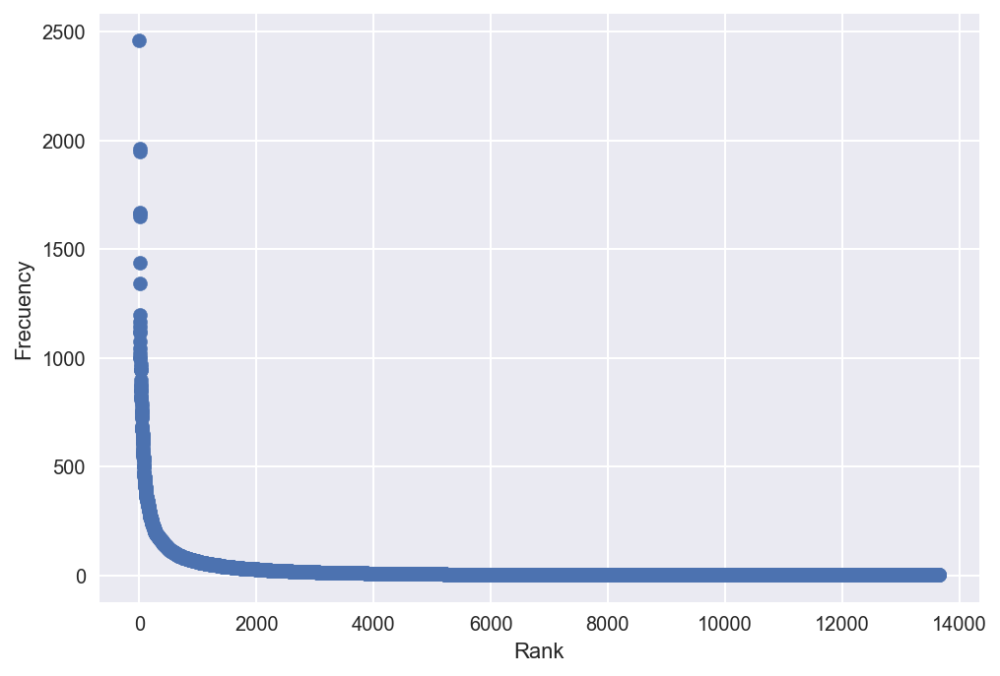

In [126]:
# Raw scatter plot
plt.scatter(y=frecuency_table["count"], x= rank)
plt.ylabel("Frecuency")
plt.xlabel("Rank")
plt.show()

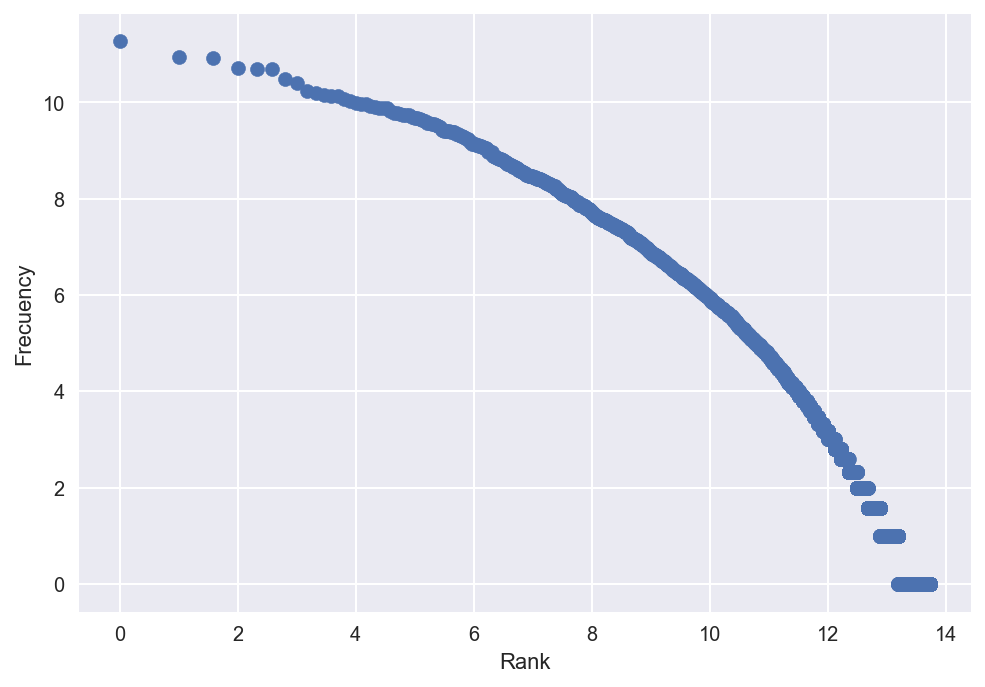

In [127]:
# Log-log plot
#Vectors to Log scale (I am using log2)
log_frecuency = np.log2(frecuency)
log_rank = np.log2(rank)

#Log scale Plot 
plt.scatter(y=log_frecuency, x=log_rank)
plt.ylabel("Frecuency")
plt.xlabel("Rank")
plt.show()

(d) [15 pts] Explore the frequency table: Zipf's law states that term frequency is governed by a power low, i.e. the relationship between term frequency and rank can be approximated by $f(r) = cr^{-1}$, where $f(r)$ is the frequency of the term at rank $r$, $r$ is the rank of a term, and $c$ is a constant and is approximately 0.1*(corpus size) for English. 

Answer following questions:

- What do you observe in the log-log plot above? Is this consist with the power law?

Your text answer (for this question, your answer is *not* code): 
I believe the log-log plot above is consistent with the power law. We can clearly see that the relationship is negatively exponential. This is verifiable if we observe the slope change accross the plot we can see that 
it is steper every time, which means that the frecuency of the words decreases more rapidely in lower ranks

- Think of the corpus as a (large) unigram bag of words. Following the analogy from lecture, imagine drawing a single word from this big bag (note that we are assuming that we've lemmatized the words and also filtered out non-alphanumeric words). What is the probability of drawing one of the 4 most frequent words? What is the probability of drawing one of the 50 most frequent words? Answer these two questions using code rather than just entering in the final answers as numbers.

In [128]:
print('Probability of drawing one of the 4 most frequent words: ')
total_words = sum(frecuency)
frecuency_top_4 = sum(frecuency[:4])
frecuency_top_50 = sum(frecuency[:51])
print("total_words ", total_words," Top 4 ", frecuency_top_4, " Top 50", frecuency_top_50)

print('Probability of drawing one of the 50 most frequent words: ')
P_top_4  = (frecuency_top_4/total_words)*100
P_top_50 = (frecuency_top_50/total_words)*100
print("P(top4): ", P_top_4, " P(top50): ", P_top_50)

Probability of drawing one of the 4 most frequent words: 
total_words  301649  Top 4  8039  Top 50 51264
Probability of drawing one of the 50 most frequent words: 
P(top4):  2.6650179513275365  P(top50):  16.9945864232933


- What proportion of the words occur only once? What proportion of the words occur fewer than 10 times?

In [129]:
print("Occur only once: ")
only_once = frecuency_table[frecuency_table["count"]==1]
proportion_only_once = (len(only_once) / len(frecuency_table))*100
print(proportion_only_once)
print("Occur fewer than 10 times: ")
less_than_ten = frecuency_table[frecuency_table["count"] < 10]
prop_less_ten = (len(less_than_ten)/len(frecuency_table))*100
print(prop_less_ten)

Occur only once: 
31.33191769788387
Occur fewer than 10 times: 
71.66288350296551


### [Problem 2] Entity Recognition and Pointwise Mutual Information (PMI) [50 pts]
By using the entity recognition system in `spaCy`, let's identify named entities from newspaper articles. You'll be using Reuters corpus which contains more than ten thousand newspaper articles. To run the code below, you need to download the Reuters dataset. To do so, in a terminal/command line (recall that you can open a terminal from Jupyter's webpage that shows all the files, which by default is [http://localhost:8888/tree](http://localhost:8888/tree)), start up Python and enter:

`
import nltk
nltk.download('reuters')
`

Then proceed to the problem subparts below.

Note that in this problem you will need named entity recognition but not grammatical parsing or the part-of-speech tagging. Hence, you will want to instantiate the nlp object by calling:

`
nlp = spacy.load('en', disable=['parser', 'tagger'])
`


(a) [15 pts] Draw a bar chart in which one of the axes shows entity labels and the other shows the frequency of the corresponding label. Use the variables `reuters_nlp` and `label_counter` provided in the code below.

In [111]:
import matplotlib.pyplot as plt
from collections import Counter
from nltk.corpus import reuters
import re
import spacy
nlp = spacy.load('en', disable=['parser', 'tagger'])
reuters_fileids = reuters.fileids()  # hint: when first debugging, consider looking at just the first few
reuters_nlp = [nlp(re.sub('\s+',' ', reuters.raw(i)).strip()) for i in reuters_fileids]
import pandas as pd
from operator import itemgetter
import numpy as np
plt.style.use("seaborn")
%config InlineBackend.figure_format = 'retina' 
#Create the counter 
label_counter = Counter()

# create a label counter
for token in reuters_nlp:
    list_entity = token.ents #this is a tupple of entities
    for ent in list_entity: #this are individual antitites
        label_counter[ent.label_]+=1


#sort labels
sorted_labels = sorted(label_counter.items(), reverse = True, key = itemgetter(1))
labels_count = pd.DataFrame(sorted_labels)
labels_count = labels_count.rename({0:"labels", 1:"count"}, axis=1)

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17],
 <a list of 18 Text xticklabel objects>)

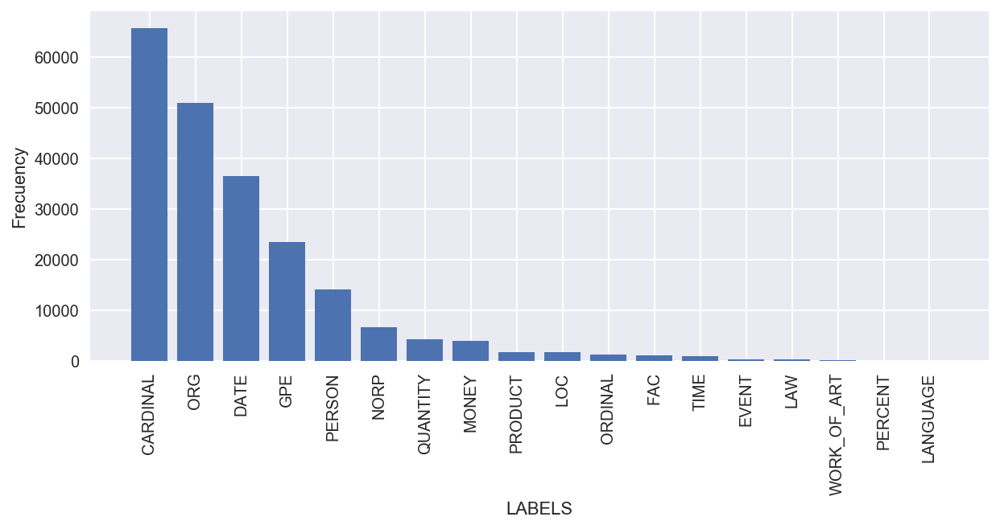

In [112]:
plt.figure(figsize=(10,4))
plt.bar(height=labels_count["count"], x=labels_count["labels"])
plt.ylabel("Frecuency")
plt.xlabel("LABELS")
plt.xticks(rotation='vertical')

(b) [15 pts] Now list the top 10 most frequently occured entities (entity text and the number of occurence) with labels `ORG` (organization) and `GPE` (countries, cities, states) respectively.

Hint: Here, when counting the frequency, we need to count how many articles have an entity with the desired property. For every article, we add 1 if the article has the entity and 0 otherwise.  List filtering (as in Recitation 1) will be helpful here.

In [114]:
## 
org_counter = Counter()
gpe_counter = Counter()
universal_count = Counter()

##
org_in_art = Counter()
gpe_in_art = Counter()

#Put the entitites in org gounter or gpe counter, if it already exists for each article, dont count
for article in reuters_nlp:
    org_in_art.clear()
    gpe_in_art.clear()
    for t in article.ents:
        universal_count[t] += 1
        if (t.label_ == "ORG" and org_in_art[t.lemma_.lower()]==0):
            org_counter[t.lemma_.lower()] += 1
            org_in_art[t.lemma_.lower()] =1
        elif (t.label_ == "GPE" and gpe_in_art[t.lemma_.lower()] == 0):
            gpe_counter[t.lemma_.lower()] += 1
            gpe_in_art[t.lemma_.lower()] = 1


#Rank ORG Occurence            
sorted_org = sorted(org_counter.items(), reverse = True, key= itemgetter(1))
print("Rank ORG OCURRENCE")
i = 0
for org in sorted_org[:10]:
    print("Rank ", i, ": ", org[0], " with ", org[1], " occurrences" )
    i+=1

#RANK GPE OCURRENCE
sorted_gpe = sorted(gpe_counter.items(), reverse= True, key = itemgetter(1))
print("\nRank GPE OCURRENCE")
i = 0
for gpe in sorted_gpe[:10]:
    print("Rank ", i, ": ", gpe[0], " with ", gpe[1], " occurrences" )
    i+=1


Rank ORG OCURRENCE
Rank  0 :  avg  with  583  occurrences
Rank  1 :  reuters  with  445  occurrences
Rank  2 :  the securities and exchange commission  with  246  occurrences
Rank  3 :  ec  with  240  occurrences
Rank  4 :  usda  with  226  occurrences
Rank  5 :  fed  with  220  occurrences
Rank  6 :  net  with  203  occurrences
Rank  7 :  treasury  with  183  occurrences
Rank  8 :  the u.s. agriculture department  with  170  occurrences
Rank  9 :  congress  with  139  occurrences

Rank GPE OCURRENCE
Rank  0 :  u.s.  with  1666  occurrences
Rank  1 :  shr  with  690  occurrences
Rank  2 :  japan  with  588  occurrences
Rank  3 :  the united states  with  375  occurrences
Rank  4 :  u.k.  with  309  occurrences
Rank  5 :  canada  with  291  occurrences
Rank  6 :  new york  with  271  occurrences
Rank  7 :  washington  with  240  occurrences
Rank  8 :  west germany  with  234  occurrences
Rank  9 :  london  with  212  occurrences


(c) [20 pts] Give the top 50 `GPE` (countries, cities, states) entities that have the highest Pointwise Mutual Information (PMI) values with regard to the `ORG` (organization) entity **'opec'** (your list of this top 50 should be ranked in decreasing PMI value). Did you find any unexpected results? If so, why do you think it happened? If you found some of the results to be unsurprisingly, how come? 

Hint 1: As in lecture, when computing PMI, we will compute probabilities by counting the number of documents where entities occur or co-occur.  For example, $P('opec') = \frac{number \ \ of \ \ documents \ \ containing \ \ 'opec'}{number \ \ of \ \ documents}$.  

Hint 2: To compute this ranking, you do not have to compute the full PMI equation.

In [115]:
#Create a table with 0s for GPE occurrence in each article 
articles_entities_occurence = [[0 for i in range(len(sorted_gpe))] for i in range(len(reuters_nlp))]

#Create a table with 0s for article where opec occured
articles_opec_occurence = [[] for i in range(len(reuters_nlp))]

i = 0
for article in reuters_nlp:
    opec_found = False
    for ent in article.ents:
        if (ent.label_ == 'ORG' and ent.lower_ == 'opec'):
            opec_found = True
    if (opec_found is True):
        articles_opec_occurence[i] = 1
    if (opec_found is False):
        articles_opec_occurence[i] = 0
    i +=1

#Get the indexes so we know in which articles is opec happening 
indices_of_opec_occurrence = []
for e in range(len(articles_opec_occurence)):
    if articles_opec_occurence[e] == 1:
        indices_of_opec_occurrence.append(e)

#Check if an entity GPE apears in the article
i = 0
for article in reuters_nlp:
    j = 0
    ents = article.ents
    for country in sorted_gpe:
        c = country[0]
        for ent in ents:
            if c == ent.lemma_.lower():
                articles_entities_occurence[i][j] = 1
        j += 1
    i +=1

# Sum occurrences for each word for every article
sum_of_occurences = [0 for a in range(len(sorted_gpe))]

#if an entity appears in an article, then sum a 1 into that entity column. At the end for each entity I will have
# a Count of how many times it appear in the complete data
for a in range(len(reuters_nlp)): #10788
    for c in range(len(sorted_gpe)): #2371
        if (articles_entities_occurence[a][c] == 1):
            sum_of_occurences[c] += 1

#this is  a list of list of 0s for all the GPE entities articles. I will substitute this for 1 qhere OPEC appears
sum_of_occurences_opec = [0 for a in range(len(sorted_gpe))]
#Fill it up
for a in indices_of_opec_occurrence: #118
    for c in range(len(sorted_gpe)): #2371
        if(articles_entities_occurence[a][c] == 1):
            sum_of_occurences_opec[c] +=1

#Get the general probability of all the words occurring in the universe of articles
probability_general = []
for a in range(len(sum_of_occurences)):
    prob = sum_of_occurences[a] / len(reuters_nlp)
    probability_general.append(prob) 

#Get the probability of opec occuring (which is a constant)    
probability_of_word_opec = len(indices_of_opec_occurrence)/len(reuters_nlp)

#Get probability of words happening when opec also occurs 
probability_when_opec_occurs = []
for a in range(len(sum_of_occurences_opec)):
    prob = sum_of_occurences_opec[a] / len(indices_of_opec_occurrence)
    probability_when_opec_occurs.append(prob)
    

#This is the dot product of probability_general and probability_of_word_opec
joint_probability = []
for a in range(len(sum_of_occurences)):
    prob = probability_general[a] * probability_of_word_opec
    joint_probability.append(prob)
joint_probability


#GET the PMI
PMI = []
for a in range(len(sum_of_occurences)):
    pmi = probability_when_opec_occurs[a] / joint_probability[a]
    PMI.append(pmi)

#get the log of the PMI
PMI = np.array(PMI)
PMI_log = np.log2(PMI)

PMI_top_indices = np.argsort(-PMI_log)
PMI_top_50 = PMI_top_indices[:50]

#Show results
for i in range(50):
    index_of_interest = PMI_top_50[i]
    print("Rank ", i, " : ", sorted_gpe[index_of_interest], " with a PMI value of ", PMI_log[index_of_interest])

Rank  0  :  ("saudi arabia 's", 1)  with a PMI value of  13.028993513747524
Rank  1  :  ('bethesda', 1)  with a PMI value of  13.028993513747524
Rank  2  :  ('neutral zone', 1)  with a PMI value of  13.028993513747524
Rank  3  :  ('visnews', 3)  with a PMI value of  13.028993513747524
Rank  4  :  ('pgrt', 1)  with a PMI value of  13.028993513747524
Rank  5  :  ('doha', 1)  with a PMI value of  13.028993513747524
Rank  6  :  ('the lake charles', 1)  with a PMI value of  13.028993513747524
Rank  7  :  ('duri', 1)  with a PMI value of  13.028993513747524
Rank  8  :  ('saudi arabia 500,000', 1)  with a PMI value of  13.028993513747524
Rank  9  :  ('tripoli', 2)  with a PMI value of  13.028993513747524
Rank  10  :  ('nazir', 1)  with a PMI value of  13.028993513747524
Rank  11  :  ('reventador', 2)  with a PMI value of  13.028993513747524
Rank  12  :  ('sulphur', 1)  with a PMI value of  13.028993513747524
Rank  13  :  ('yanbu', 2)  with a PMI value of  13.028993513747524
Rank  14  :  ('el 

/Users/emmanuel/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:88: RuntimeWarning: divide by zero encountered in log2


***Your text answer (for this question, your answer is *not* code):*** 
I did observe some random results on the top of the rank. I believe this could be due to the fact that some entitites only appear few times and all the times they appear the word "OPEC" also appears. This would give them a really high PMI value. On the other hand, other entities that were expected also appeared like all the countries in the OPEC organization and other world country leaders. 
 

### [Problem 3] Questionnaire [5 pts]
Please provide feedback! To receive the 5 points, be sure to enter your Andrew ID correctly in this Google form: https://goo.gl/forms/tGmCD8L9uI8zNbRG3

In [ ]:
I did finish the questionare